# Masterthesis: Descriptive analysis Player data

In [1]:
# Filename preprocessed data
#loaded_filename = 'playerdata2017_preprocessed'
#saved_filename = 'playerdata2017_standardized'
#loaded_filename = 'playerdata2018_preprocessed'
#saved_filename = 'playerdata2018_standardized'
loaded_filename = 'playerdata2019_preprocessed'
saved_filename = 'playerdata2019_standardized'

## 0. Load libraries and define functions

In [2]:
# Functions
import numpy as np
import os
import pickle
import pandas as pd
from pandas.api.types import is_string_dtype
from pandas.api.types import is_numeric_dtype
from datetime import datetime
from collections import Counter
from numpy.random import choice
from scipy import stats
import operator
import itertools
import statistics

from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm

from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

In [3]:
cm.get_cmap(name='tab20b')

In [4]:
### Function used to return a summary for categorical variables
def SummaryCategoricalVar(list_of_values, title, threshold = 20, top = 10):
    """
    param: list_of_values (list): A list of categorical values from which we like to obtain the distribution
    param: title (string): The title for the visualization
    param: threshold (int): The maximal number of categories that should be visualized
    param: top (int): The top k values that should be returned in the written summary when the number of categories is above the threshold
    """
    # Count the number of occurrances in the list
    cnt = Counter(list_of_values)
    sorted_cnt = sorted(cnt.items(), key=operator.itemgetter(1))[::-1]
    
    # Show the percentage dictionary if to many categories to represent
    print("-"* 100, "\nOverview of variable: ", title, "\n", "-"*100)
    print("Total categories:", len(cnt), "\n")
    if len(cnt) > threshold:
        if len(cnt) < top*2:
            for key, value in sorted_cnt:
                print(key, ':', round(value/len(list_of_values)*100, 4), "%")
        else:
            print("The 10 with the highest percentage data available:\n")
            for key, value in sorted_cnt[:top]:
                print(key, ':', round(value/len(list_of_values)*100, 4), "%")
            print("\nThe 10 with the lowest percentage data available:\n")
            for key, value in sorted_cnt[len(cnt) - top:]:
                print(key, ':', round(value/len(list_of_values)*100, 4), "%")
                
    # Visualization of labelled data distribution
    else:
        plt.barh(range(1, len(sorted_cnt)+1), 
                 list(map(lambda x: (x/len(list_of_values)*100), [score for label, score in sorted_cnt])), 
                 tick_label = list([label for label, score in sorted_cnt]),
                 color = 'cornflowerblue', 
                 edgecolor = 'steelblue')
        plt.ylabel('Label')
        plt.xlabel('Percentage observations in dataset')
        plt.title(title)
        plt.show()    
        plt.savefig('Barplot_' + title + '.png')

In [5]:
### Function used to return a summary for numeric variables
def SummaryNumericVar(list_of_values, title):
    """
    param: list_of_values (list): A list of categorical values from which we like to obtain the distribution
    param: title (string): The title for the visualization
    """
    
    # Title varibale
    print("="* 100, "\nOverview of variable: ", title, "\n", "="*100)

    # An "interface" to matplotlib.axes.Axes.hist() method
    n, bins, patches = plt.hist(x = list_of_values, bins='auto', color= '#0504aa', alpha=0.7, rwidth=0.85)
    plt.grid(axis='y', alpha=0.75)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(title)
    plt.ylim(top=np.ceil(n.max() / 10) * 10 if n.max() % 10 else n.max() + 10)
    plt.show()
    plt.savefig('Frequency_' + title + '.png')

    # Print summary statistics
    print("-"*20, "\nSummary statistics:\n", "-"*20)
    print("Minimum value:", min(list_of_values))
    print("Mean:", round(statistics.mean(list_of_values), 4))
    print("Standard deviation:", round(statistics.stdev(list_of_values), 4))
    print("Median:", round(statistics.median(list_of_values), 4))
    print("Maximal value:", max(list_of_values))

    # Plot boxplot
    plt.boxplot(list_of_values, 0, 'grey', 0)
    plt.xlabel('Value')
    plt.title(title)
    plt.show()
    plt.savefig('Boxplot_' + title + '.png')

    # Present outliers
    print("-"*20, "\nOutlier detection:\n", "-"*20)
    print("List of outliers:", {round(value,2) for z_score, value in zip(np.abs(stats.zscore(list_of_values)), list_of_values) if z_score > 3})

    # Check for normally distributed
    stats.probplot(list_of_values, dist="norm", plot= plt)
    plt.show()
    plt.savefig('Probabilityplot_' + title + '.png')

    # Statistics to check normality
    print("-"*20, "\nCheck for normal distribution:\n", "-"*20)
    print("Skewedness:", round(stats.skew(list_of_values), 4))
    print("Kurtosis:", round(stats.kurtosis(list_of_values), 4))

In [6]:
### Function used to draw a random sample from the discrete distribution of probabilities representing the input list
def RandomSampleProbDist(list_of_values, draws = 1):
    """
    :param: list_of_values (list): A list of categorical values representing the observations in the dataset
    :param: draws (int): The number of samples desired to be returned
    :return: (array) An array capturing the sampled categories
    """
    # Only the non-missing values are considered in the sampling procedure
    non_missing_list = list_of_values.dropna()
    # Sample from the discrete probability distribution representing the categorical variable
    return choice(list(Counter(non_missing_list)), 
                  draws, 
                  p = list(map(lambda x: x/len(non_missing_list), 
                               Counter(non_missing_list).values())))

In [7]:
### Function used for a boxcox transformation of input features
def feature_transformer(feature, featurename):
    """
    Visualizes the input feature before and after being boxcox transformed. Furthermore the transformed data,
    based on the optimal lambda estimated with the boxcox method is returned in a standardized fashion (zero mean
    and a variance of one)
    """
    # Boxcox transformation
    transformed_feature, optimizer = stats.boxcox(feature)
    standardized_feature, standardized_transformed_feature = preprocessing.scale(feature), preprocessing.scale(transformed_feature)
    # Visualization
    print("Feature: ", featurename)
    plt.figure()
    sns.kdeplot(standardized_feature, shade=True, label=featurename )
    sns.kdeplot(standardized_transformed_feature, shade=True, label= "Transformed " + featurename)
    plt.savefig('Transformed_' + featurename + '.png')
    print("The optimal value for lambda: ", optimizer)
    # Return transformed and standardized data
    return standardized_transformed_feature, optimizer

## 1. Load data

In [8]:
# Load pickles and save data in dataframe dict
data_dict = dict()
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_top.pickle', 'rb') as f:
    data_dict['Top'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_mid.pickle', 'rb') as f:
    data_dict['Middle'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_jun.pickle', 'rb') as f:
    data_dict['Jungle'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_adc.pickle', 'rb') as f:
    data_dict['ADC'] = pickle.load(f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + loaded_filename + '_sup.pickle', 'rb') as f:
    data_dict['Support'] = pickle.load(f)

##### Summary data

In [9]:
# Visualization of a dataframe
data_dict['Support']

,gameid,league,split,game,patchno,side,position,champion,result,k,...,xpdat10,csat10,csdat10,csat15,csdat15,Year,player,team,culture,datediff
16,240067,LCK,2.0,1,8.0,Blue,Support,Thresh,0,1.0,...,185.0,17.0,15.0,30.0,27.0,2017,max,mvp,Korea,816.0
21,240067,LCK,2.0,1,8.0,Red,Support,Zyra,1,2.0,...,-185.0,2.0,-15.0,3.0,-27.0,2017,snowflower,jin air green wings,Korea,816.0
28,240080,LCK,2.0,2,8.0,Blue,Support,Zyra,0,1.0,...,-196.0,3.0,-10.0,6.0,-15.0,2017,snowflower,jin air green wings,Korea,816.0
33,240080,LCK,2.0,2,8.0,Red,Support,Blitzcrank,1,2.0,...,196.0,13.0,10.0,21.0,15.0,2017,max,mvp,Korea,816.0
40,240081,LCK,2.0,3,8.0,Blue,Support,Bard,1,2.0,...,658.0,1.0,-1.0,2.0,-4.0,2017,max,mvp,Korea,816.0
45,240081,LCK,2.0,3,8.0,Red,Support,Lulu,0,1.0,...,-658.0,2.0,1.0,6.0,4.0,2017,snowflower,jin air green wings,Korea,816.0
52,240086,LCK,2.0,1,8.0,Blue,Support,Zyra,1,0.0,...,428.0,1.0,-10.0,5.0,-12.0,2017,gorilla,longzhu gaming,Korea,816.0
57,240086,LCK,2.0,1,8.0,Red,Support,Miss Fortune,0,2.0,...,-428.0,11.0,10.0,17.0,12.0,2017,mata,kt rolster,Korea,816.0
64,240103,LCK,2.0,2,8.0,Blue,Support,Lulu,0,2.0,...,277.0,3.0,-9.0,7.0,-14.0,2017,mata,kt rolster,Korea,816.0
69,240103,LCK,2.0,2,8.0,Red,Support,Thresh,1,1.0,...,-277.0,12.0,9.0,21.0,14.0,2017,gorilla,longzhu gaming,Korea,816.0


In [10]:
# Short intermediate summary
for pos, df in data_dict.items():
    print("The", pos, "dataset captures information from", len(df.columns), "features.")
    print("In total, there are", len(df), "observations present in the dataframe, capturing the information from",
          len(set(df.gameid)), "games.")

The Top dataset captures information from 63 features.
In total, there are 15514 observations present in the dataframe, capturing the information from 7757 games.
The Middle dataset captures information from 63 features.
In total, there are 15514 observations present in the dataframe, capturing the information from 7757 games.
The Jungle dataset captures information from 63 features.
In total, there are 15514 observations present in the dataframe, capturing the information from 7757 games.
The ADC dataset captures information from 63 features.
In total, there are 15514 observations present in the dataframe, capturing the information from 7757 games.
The Support dataset captures information from 63 features.
In total, there are 15514 observations present in the dataframe, capturing the information from 7757 games.


##### Extract categorical/ numerical feature list 
Latter remain the same irrespective of the specific dataframe considered.

In [11]:
# Initialization
categorical_variables, numerical_variables = [], []

# Extract categorical and numeric variables
for col, col_type in zip(data_dict['Top'].columns, data_dict['Top'].dtypes):
    if str(col_type) == 'object':
        categorical_variables.append(col)
    else:
        numerical_variables.append(col)

## 2. Univariate analysis of the data
In a first phase all the variables are investigated in a univariate analysis. A distinction is made here between categorical and numerical variables. 

### 2.1 Analysis of categorical variables
The following aspect will be analysed here:
* Balanced classes

Furthermore one-hot encoding will be considered to transform these variables to an appropriate format ready for analysis.

##### Exploration characteristics categorical features

In [12]:
# Loop through all categorical variables and visualize data
for cat_variable in ['champion', 'player']:
    for pos, df in data_dict.items():
        print("\n\n","="*10, "\n  ", pos, "\n", "="*10)
        SummaryCategoricalVar(df[cat_variable], cat_variable)



   Top 
---------------------------------------------------------------------------------------------------- 
Overview of variable:  champion 
 ----------------------------------------------------------------------------------------------------
Total categories: 87 

The 10 with the highest percentage data available:

Gnar : 6.7552 %
Shen : 5.35 %
Camille : 5.0084 %
Gangplank : 4.9052 %
Maokai : 4.8215 %
Rumble : 4.815 %
Renekton : 4.8086 %
Ornn : 4.454 %
Aatrox : 4.3122 %
Cho'gath : 4.1253 %

The 10 with the lowest percentage data available:

Zilean : 0.0064 %
Chogath : 0.0064 %
Rammus : 0.0064 %
Ezreal : 0.0064 %
Alistar : 0.0064 %
Kassadin : 0.0064 %
Graves : 0.0064 %
Ashe : 0.0064 %
Warwick : 0.0064 %
Wukong : 0.0064 %


   Middle 
---------------------------------------------------------------------------------------------------- 
Overview of variable:  champion 
 ----------------------------------------------------------------------------------------------------
Total categorie

##### Encoding

In [13]:
# Loop through the different dataframes
for pos, df in data_dict.items():
    # Encode categorical features in numeric ones
    for col in categorical_variables:
        try:
            df['Encoded_' + col] = [int(x) for x in list(df[col])]
        except:
            try: 
                df['Encoded_' + col] = [float(x) for x in list(df[col])]
            except:
                mapping_dict = dict(zip(list(set(df[col])), list(range(len(set(df[col]))))))
                df['Encoded_' + col] = [mapping_dict[x] for x in df[col]]
    # Add encoded features to dataframe
    data_dict[pos] = df

##### Remove irrelevant features for further analysis

In [14]:
# Loop through the different dataframes
for pos, df in data_dict.items():
    # Drop irrelevant features
    catvar_before_encoding = [col[len('Encoded_'):] for col in df.columns if 'Encoded_' in col]
    catvar_before_encoding.remove('player')
    df = df.drop(labels=catvar_before_encoding, axis=1)
    df = df.drop(labels = ['Encoded_gameid', 'Encoded_player', 'Encoded_position'], axis=1)
    # Add adjusted dataframe to dictionary
    data_dict[pos] = df

In [15]:
# Add one-hot-encoded features to numerical feature list
for cat in catvar_before_encoding:
    numerical_variables.append('Encoded_' + cat)
numerical_variables.remove('Encoded_gameid')
numerical_variables.remove('Encoded_position')

### 2.2 Analysis of numerical variables
The following aspects will be analysed here:
* Visualisation data (boxplot, histogram)
* Minimal and maximal values 
* Outliers
* Transformation/ normalization of the data
* Near zero variance indicator (before and after removal outliers)
* Skewness: A measure of lack of symmetry. The skewness for a normal distribution is zero and any symmertric data should have a skewness near zero. Negative values for skewness indicate the data to be skewed left while, positive values imply the data to be skewed right. In case the data is multi-modal, the sign of the skewness metric might be affected.
* Kurtosis: A measure indicating whether the data are heavy-tailed or light-tailed relative to a normal distribution. In case the kurtosis is high the data is distributed with heavy tails (many outliers), while data with low kurtosis tends to have light tails. The kurtosis for a standard normal distribution is three. The scipy package used to calculate the kurtosis here uses the formula for "excess kurtosis" in which the deviation from the normal condition is considered (kurtosis - 3).

##### Exploration characteristics numerical features



   Top 
Overview of variable:  k 


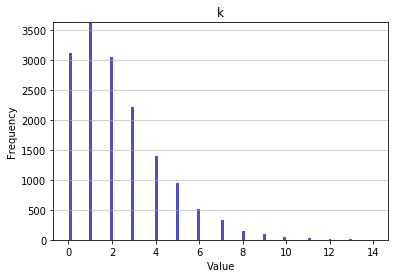

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.2563
Standard deviation: 2.0363
Median: 2.0
Maximal value: 14.0


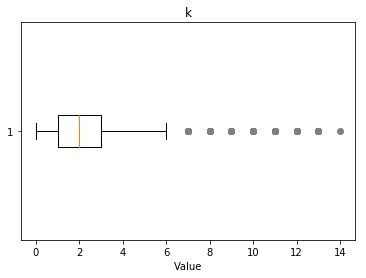

-------------------- 
Outlier detection:
 --------------------
List of outliers: {9.0, 10.0, 11.0, 12.0, 13.0, 14.0}


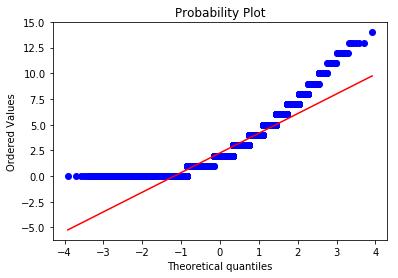

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2172
Kurtosis: 1.8137


   Middle 
Overview of variable:  k 


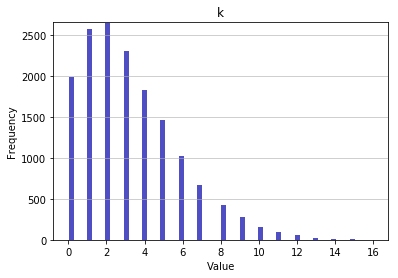

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.2139
Standard deviation: 2.5538
Median: 3.0
Maximal value: 16.0


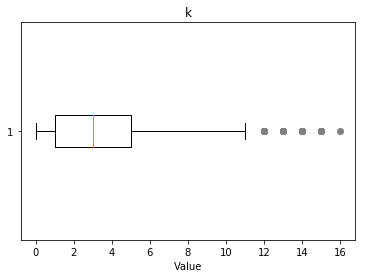

-------------------- 
Outlier detection:
 --------------------
List of outliers: {11.0, 12.0, 13.0, 14.0, 15.0, 16.0}


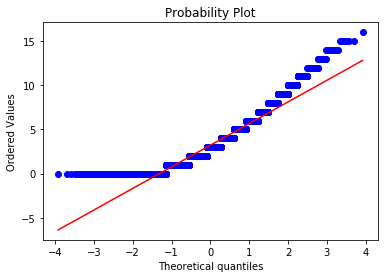

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.968
Kurtosis: 0.8936


   Jungle 
Overview of variable:  k 


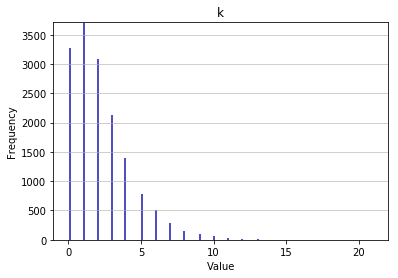

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.1986
Standard deviation: 2.0633
Median: 2.0
Maximal value: 21.0


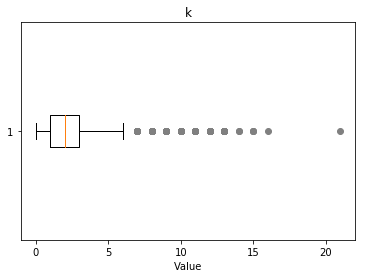

-------------------- 
Outlier detection:
 --------------------
List of outliers: {9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 21.0}


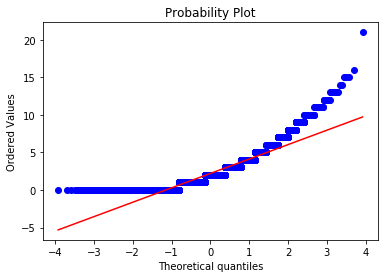

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.4231
Kurtosis: 3.0277


   ADC 
Overview of variable:  k 


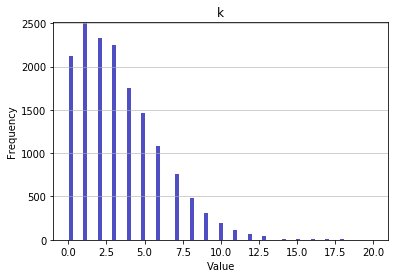

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.3419
Standard deviation: 2.7238
Median: 3.0
Maximal value: 20.0


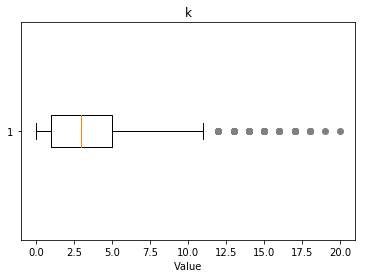

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0}


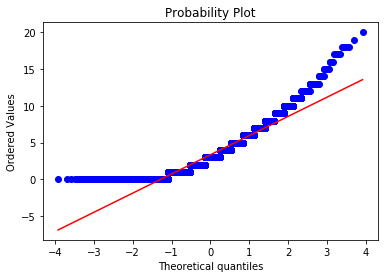

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0157
Kurtosis: 1.2196


   Support 
Overview of variable:  k 


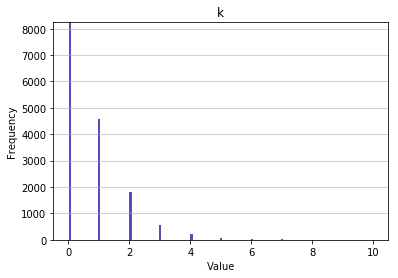

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.7363
Standard deviation: 1.0125
Median: 0.0
Maximal value: 10.0


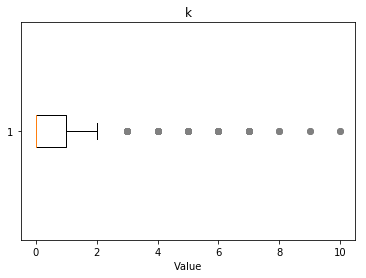

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0}


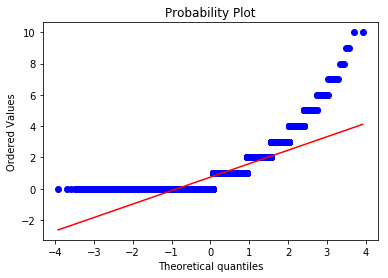

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9292
Kurtosis: 5.7714


   Top 
Overview of variable:  d 


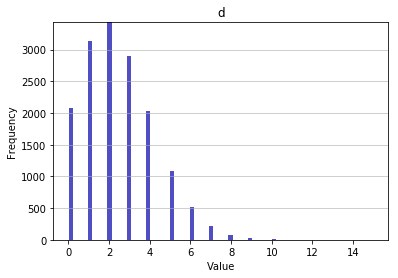

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.4393
Standard deviation: 1.7631
Median: 2.0
Maximal value: 15.0


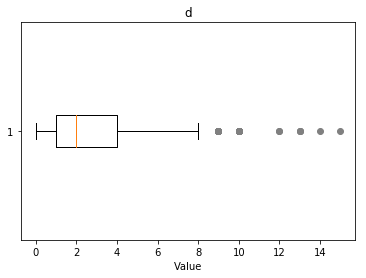

-------------------- 
Outlier detection:
 --------------------
List of outliers: {8.0, 9.0, 10.0, 12.0, 13.0, 14.0, 15.0}


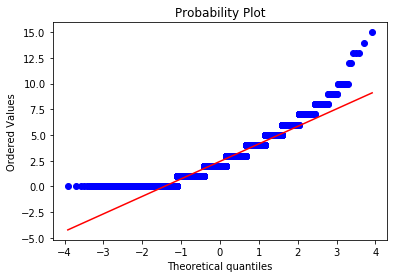

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7426
Kurtosis: 0.8023


   Middle 
Overview of variable:  d 


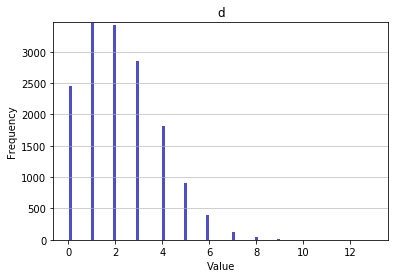

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.2288
Standard deviation: 1.6741
Median: 2.0
Maximal value: 13.0


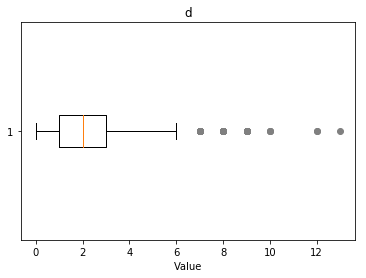

-------------------- 
Outlier detection:
 --------------------
List of outliers: {8.0, 9.0, 10.0, 12.0, 13.0}


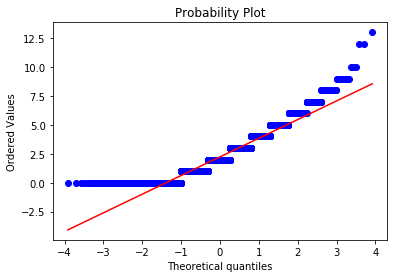

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7081
Kurtosis: 0.4388


   Jungle 
Overview of variable:  d 


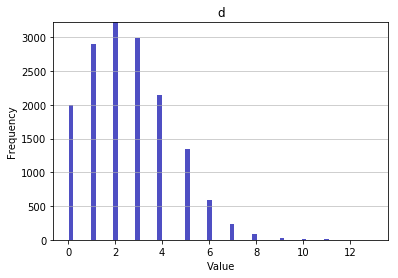

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.5625
Standard deviation: 1.7991
Median: 2.0
Maximal value: 13.0


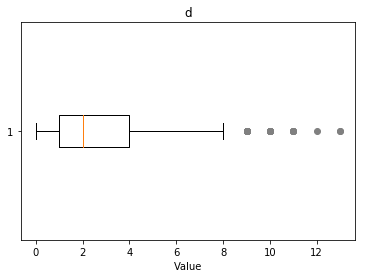

-------------------- 
Outlier detection:
 --------------------
List of outliers: {8.0, 9.0, 10.0, 11.0, 12.0, 13.0}


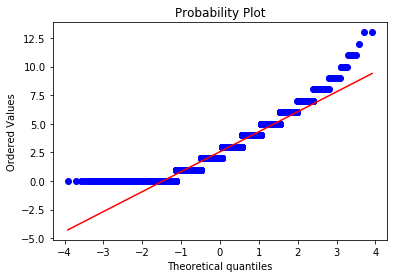

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5993
Kurtosis: 0.2405


   ADC 
Overview of variable:  d 


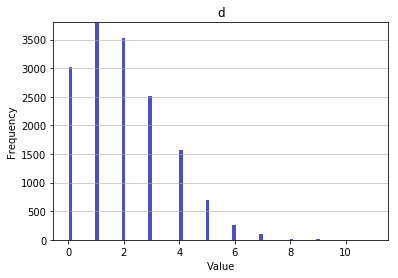

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 1.9776
Standard deviation: 1.586
Median: 2.0
Maximal value: 11.0


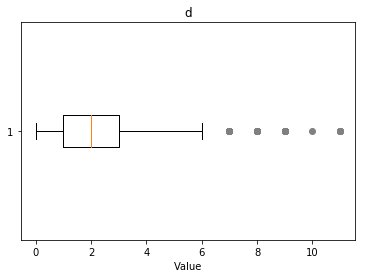

-------------------- 
Outlier detection:
 --------------------
List of outliers: {7.0, 8.0, 9.0, 10.0, 11.0}


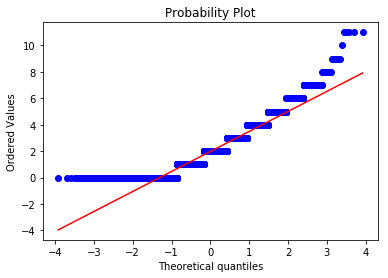

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7759
Kurtosis: 0.5269


   Support 
Overview of variable:  d 


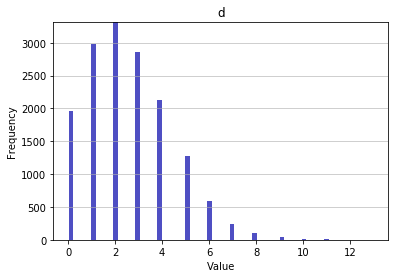

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.5583
Standard deviation: 1.8211
Median: 2.0
Maximal value: 13.0


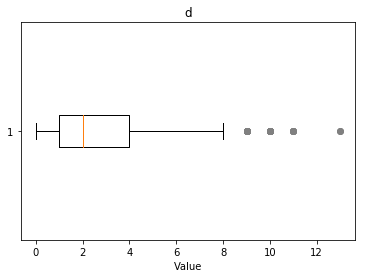

-------------------- 
Outlier detection:
 --------------------
List of outliers: {9.0, 10.0, 11.0, 13.0}


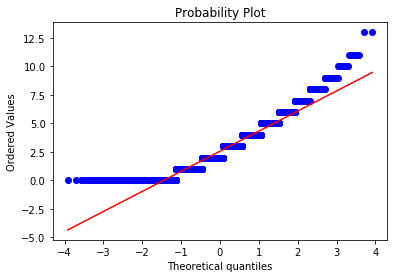

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6718
Kurtosis: 0.3741


   Top 
Overview of variable:  a 


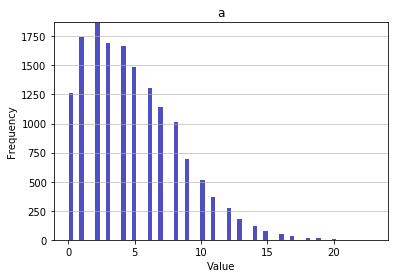

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.7928
Standard deviation: 3.5488
Median: 4.0
Maximal value: 23.0


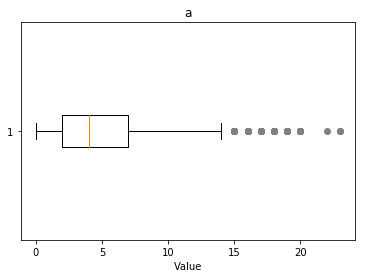

-------------------- 
Outlier detection:
 --------------------
List of outliers: {16.0, 17.0, 18.0, 19.0, 20.0, 22.0, 23.0}


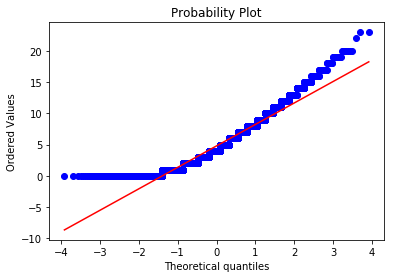

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8317
Kurtosis: 0.5132


   Middle 
Overview of variable:  a 


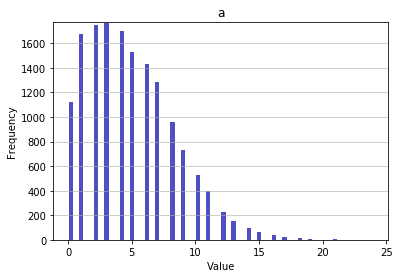

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.8374
Standard deviation: 3.4367
Median: 4.0
Maximal value: 24.0


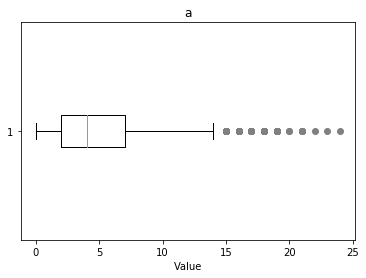

-------------------- 
Outlier detection:
 --------------------
List of outliers: {16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0}


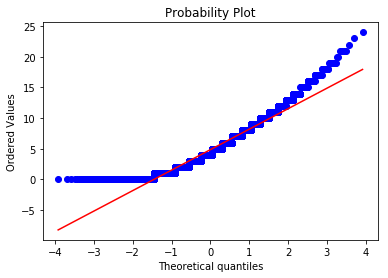

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7848
Kurtosis: 0.5427


   Jungle 
Overview of variable:  a 


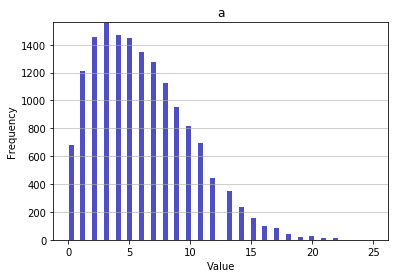

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 6.0057
Standard deviation: 4.0007
Median: 5.0
Maximal value: 25.0


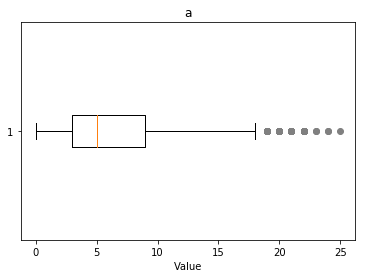

-------------------- 
Outlier detection:
 --------------------
List of outliers: {19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0}


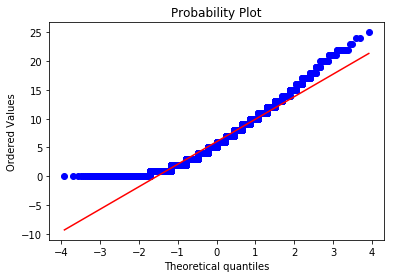

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7153
Kurtosis: 0.3047


   ADC 
Overview of variable:  a 


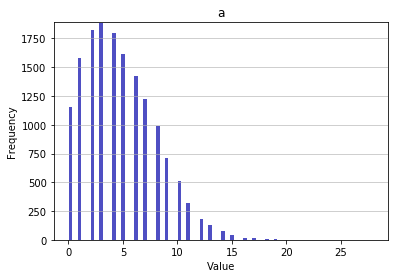

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.6829
Standard deviation: 3.266
Median: 4.0
Maximal value: 28.0


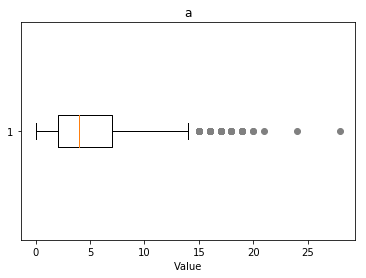

-------------------- 
Outlier detection:
 --------------------
List of outliers: {15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 24.0, 28.0}


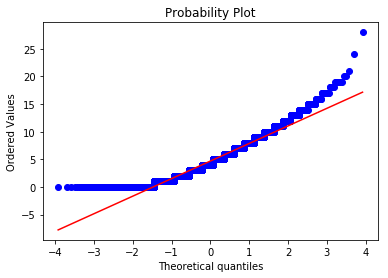

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7462
Kurtosis: 0.5328


   Support 
Overview of variable:  a 


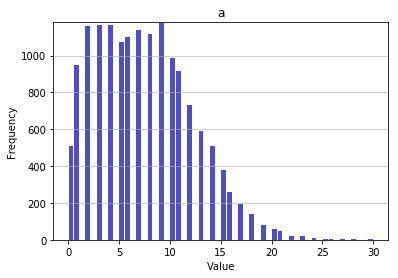

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 7.4391
Standard deviation: 4.7209
Median: 7.0
Maximal value: 30.0


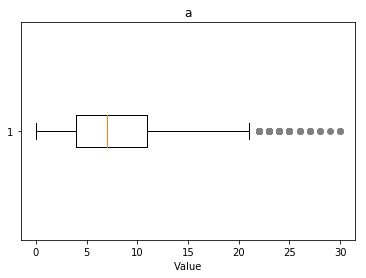

-------------------- 
Outlier detection:
 --------------------
List of outliers: {22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0}


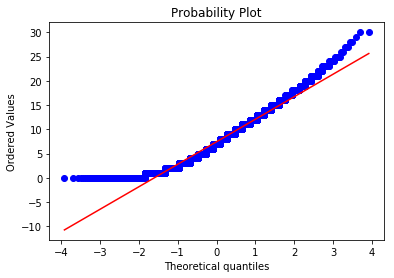

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5506
Kurtosis: -0.0334


   Top 
Overview of variable:  doubles 


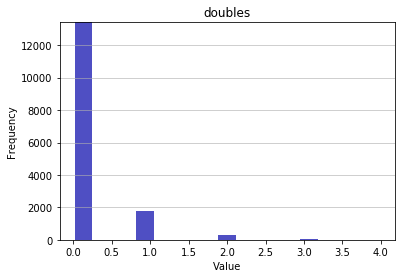

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1604
Standard deviation: 0.4366
Median: 0.0
Maximal value: 4.0


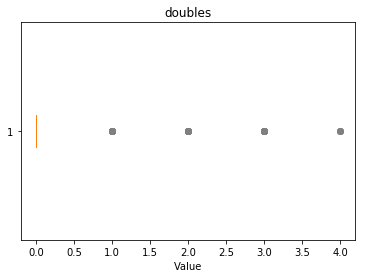

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0, 4.0}


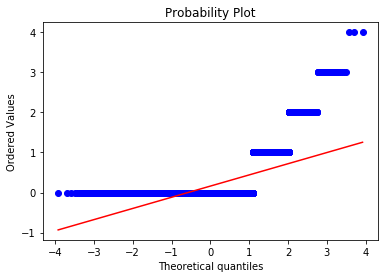

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.0437
Kurtosis: 10.4718


   Middle 
Overview of variable:  doubles 


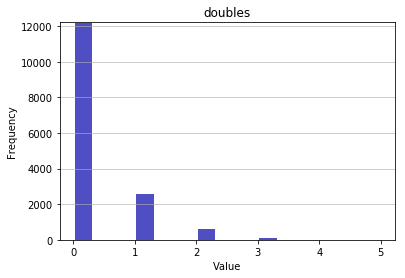

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2688
Standard deviation: 0.5717
Median: 0.0
Maximal value: 5.0


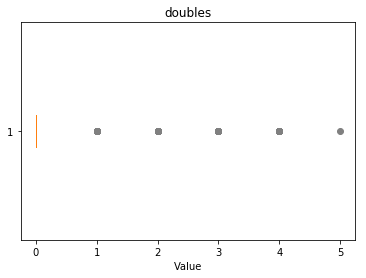

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0, 4.0, 5.0}


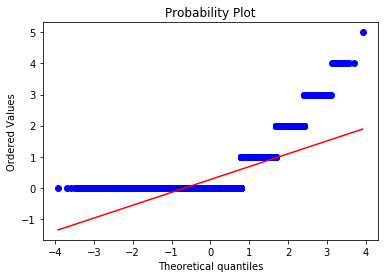

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.368
Kurtosis: 6.1789


   Jungle 
Overview of variable:  doubles 


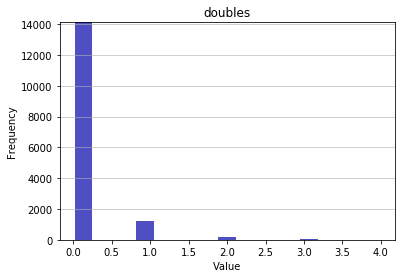

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.106
Standard deviation: 0.3601
Median: 0.0
Maximal value: 4.0


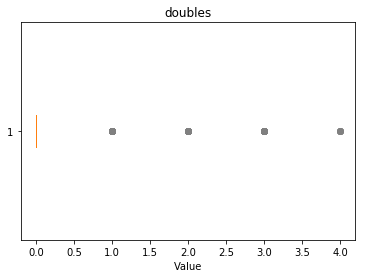

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0, 4.0}


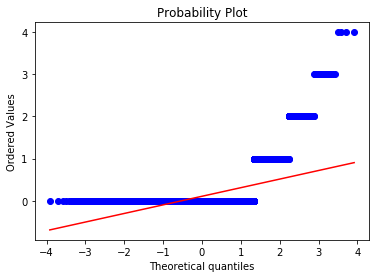

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.9533
Kurtosis: 18.8282


   ADC 
Overview of variable:  doubles 


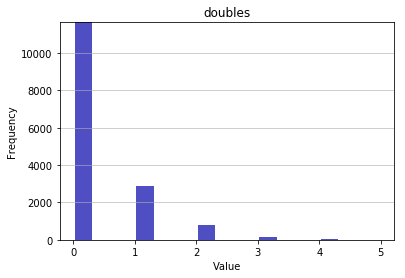

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3285
Standard deviation: 0.6405
Median: 0.0
Maximal value: 5.0


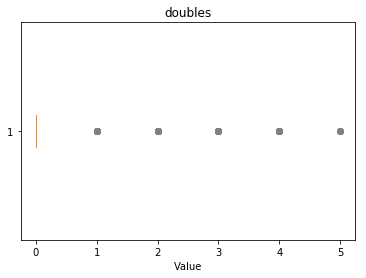

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 4.0, 5.0}


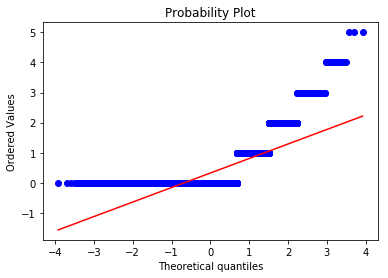

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1568
Kurtosis: 4.9766


   Support 
Overview of variable:  doubles 


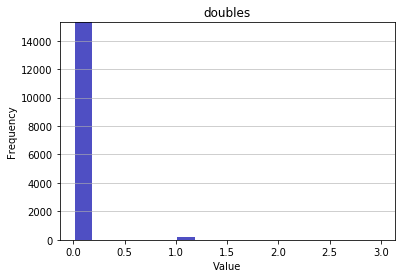

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0158
Standard deviation: 0.1327
Median: 0.0
Maximal value: 3.0


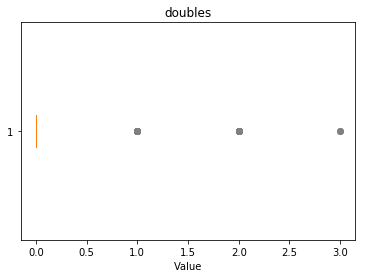

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


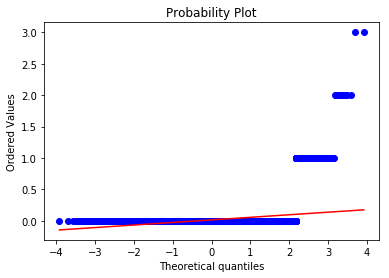

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 9.3817
Kurtosis: 104.9553


   Top 
Overview of variable:  triples 


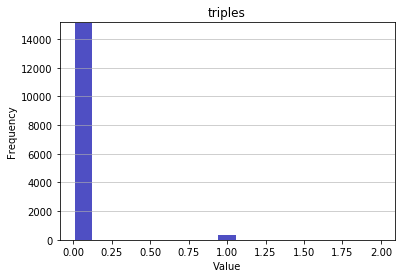

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0239
Standard deviation: 0.1557
Median: 0.0
Maximal value: 2.0


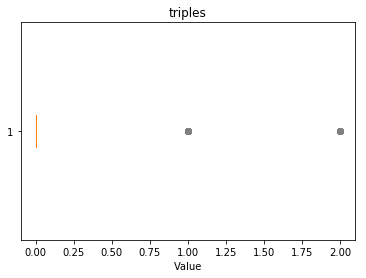

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


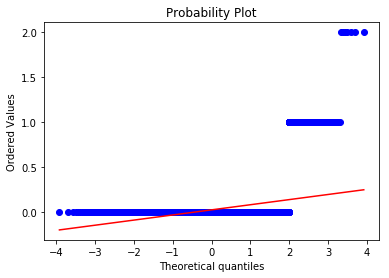

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 6.5876
Kurtosis: 44.242


   Middle 
Overview of variable:  triples 


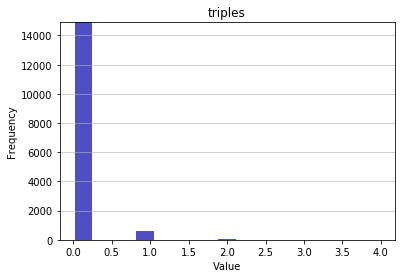

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.042
Standard deviation: 0.2127
Median: 0.0
Maximal value: 4.0


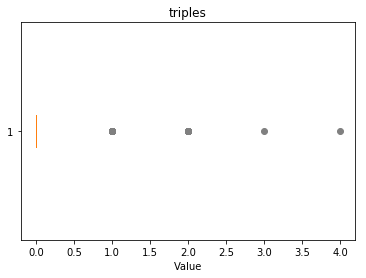

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0, 4.0}


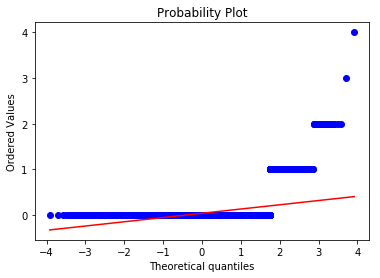

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.532
Kurtosis: 36.5437


   Jungle 
Overview of variable:  triples 


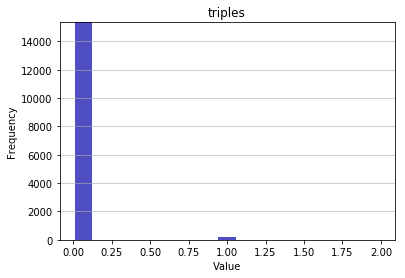

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0108
Standard deviation: 0.1044
Median: 0.0
Maximal value: 2.0


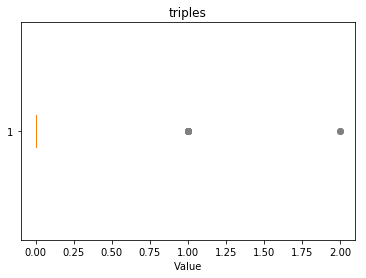

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


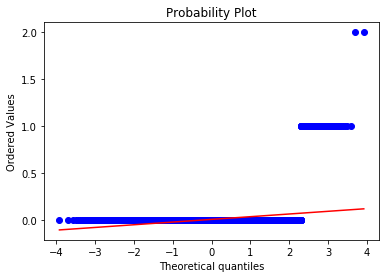

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 9.8196
Kurtosis: 98.5561


   ADC 
Overview of variable:  triples 


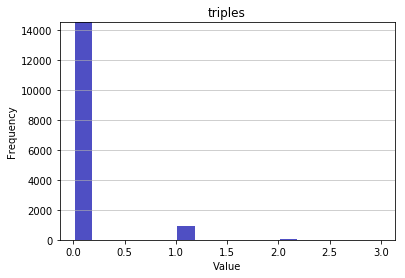

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0679
Standard deviation: 0.2685
Median: 0.0
Maximal value: 3.0


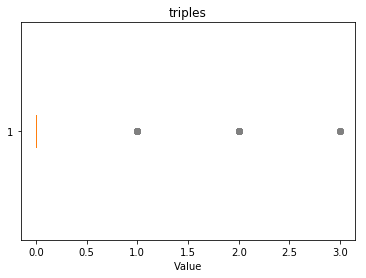

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


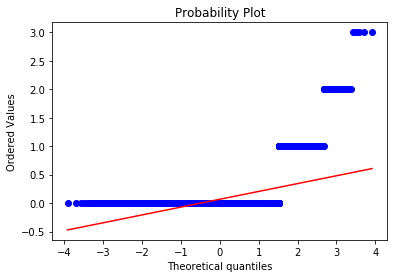

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.1934
Kurtosis: 19.481


   Support 
Overview of variable:  triples 


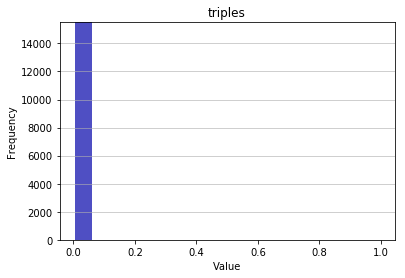

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0011
Standard deviation: 0.0331
Median: 0.0
Maximal value: 1.0


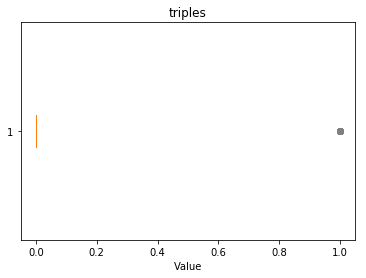

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


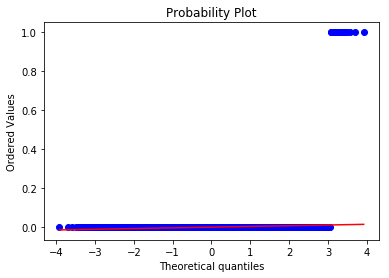

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 30.1594
Kurtosis: 907.5893


   Top 
Overview of variable:  quadras 


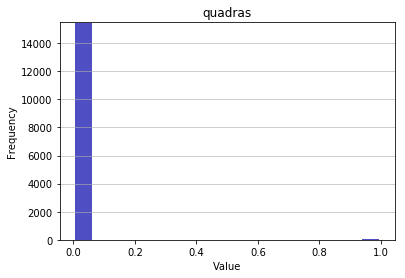

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0028
Standard deviation: 0.0532
Median: 0.0
Maximal value: 1.0


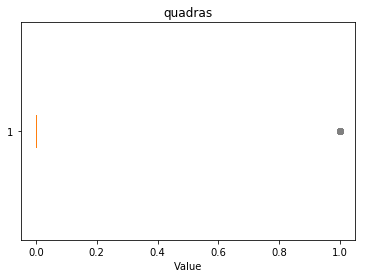

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


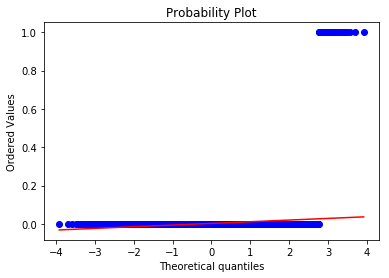

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 18.6974
Kurtosis: 347.5938


   Middle 
Overview of variable:  quadras 


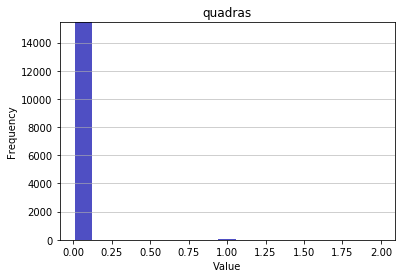

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0061
Standard deviation: 0.0793
Median: 0.0
Maximal value: 2.0


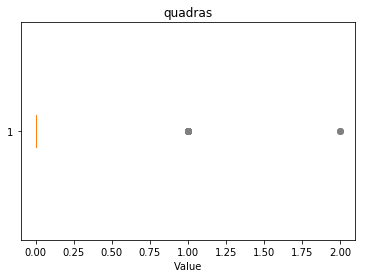

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


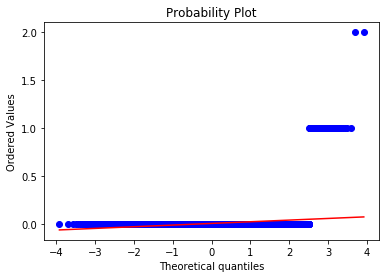

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 13.4988
Kurtosis: 192.2224


   Jungle 
Overview of variable:  quadras 


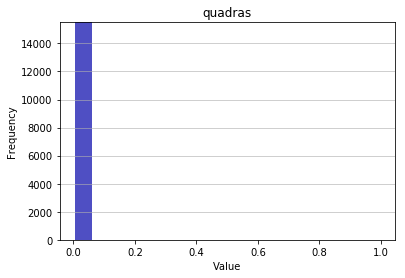

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0012
Standard deviation: 0.035
Median: 0.0
Maximal value: 1.0


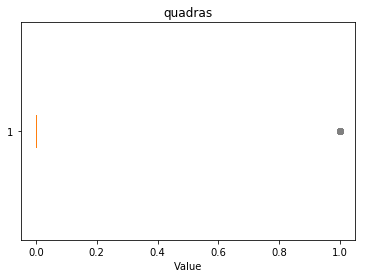

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


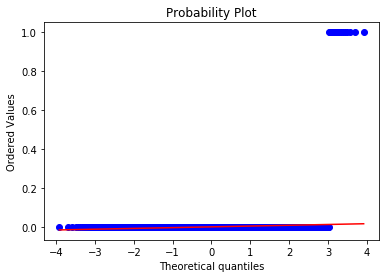

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 28.5224
Kurtosis: 811.5275


   ADC 
Overview of variable:  quadras 


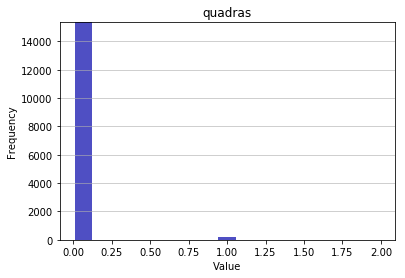

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.011
Standard deviation: 0.1056
Median: 0.0
Maximal value: 2.0


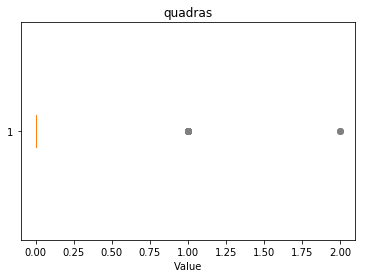

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


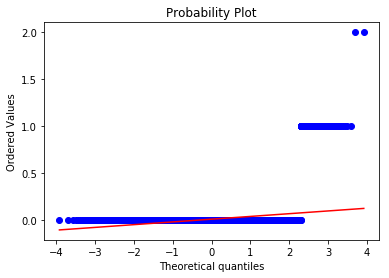

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 9.693
Kurtosis: 95.9054


   Support 
Overview of variable:  quadras 


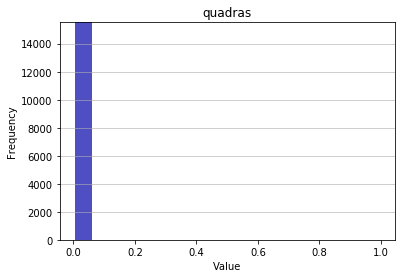

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0001
Standard deviation: 0.0114
Median: 0.0
Maximal value: 1.0


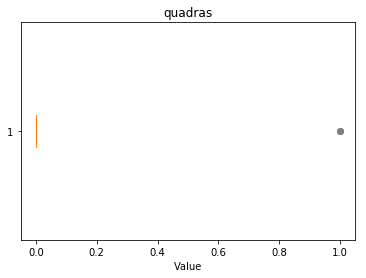

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


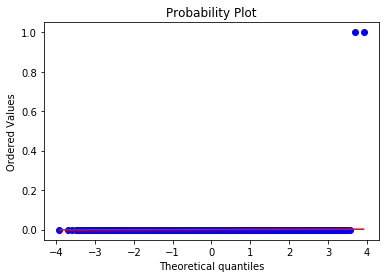

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 88.0568
Kurtosis: 7752.0001


   Top 
Overview of variable:  pentas 


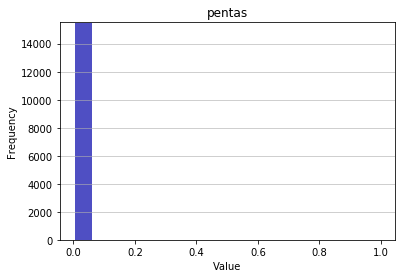

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0003
Standard deviation: 0.0161
Median: 0.0
Maximal value: 1.0


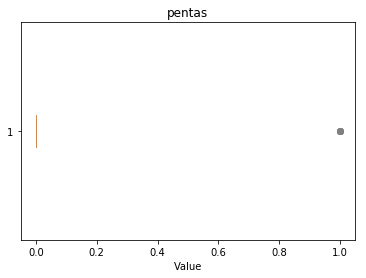

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


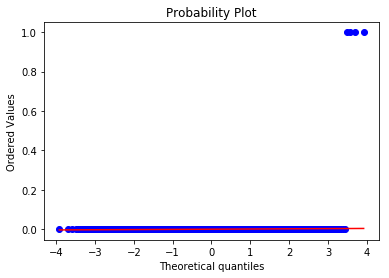

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 62.2535
Kurtosis: 3873.5003


   Middle 
Overview of variable:  pentas 


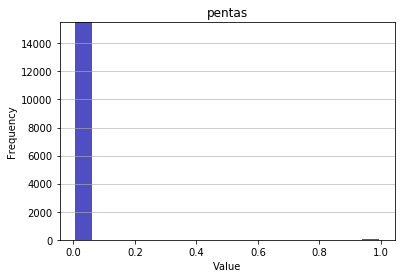

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0016
Standard deviation: 0.0401
Median: 0.0
Maximal value: 1.0


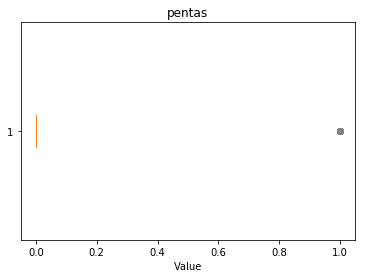

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


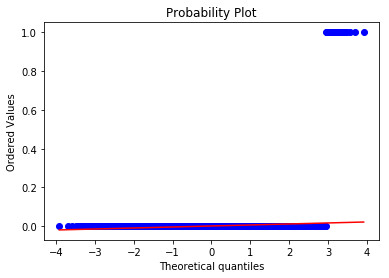

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 24.8508
Kurtosis: 615.5616


   Jungle 
Overview of variable:  pentas 


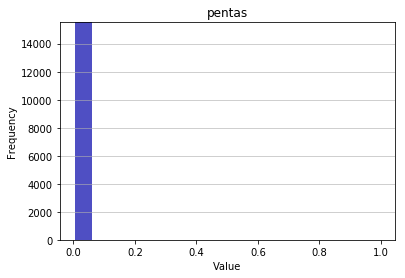

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0001
Standard deviation: 0.0114
Median: 0.0
Maximal value: 1.0


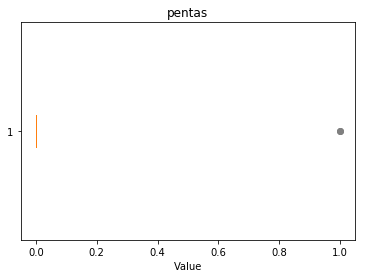

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


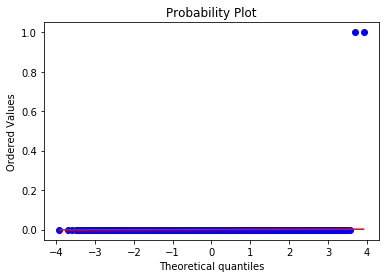

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 88.0568
Kurtosis: 7752.0001


   ADC 
Overview of variable:  pentas 


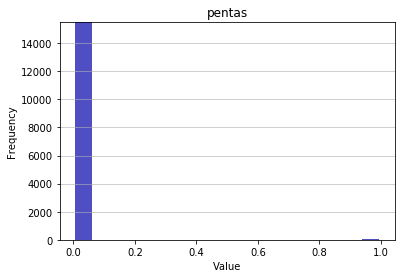

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0024
Standard deviation: 0.0494
Median: 0.0
Maximal value: 1.0


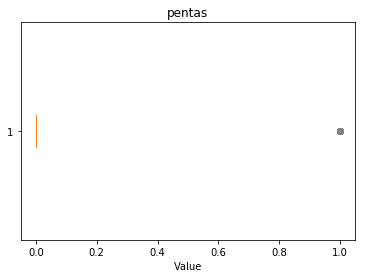

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


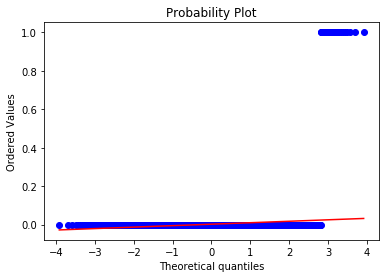

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 20.1312
Kurtosis: 403.2656


   Support 
Overview of variable:  pentas 


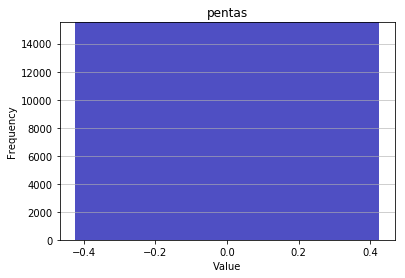

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0
Standard deviation: 0.0
Median: 0.0
Maximal value: 0.0


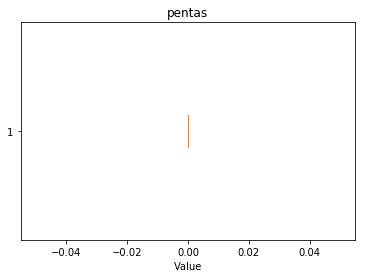

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


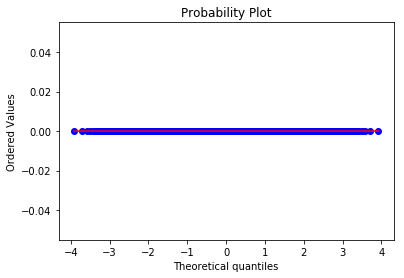

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -3.0


   Top 
Overview of variable:  kpm 


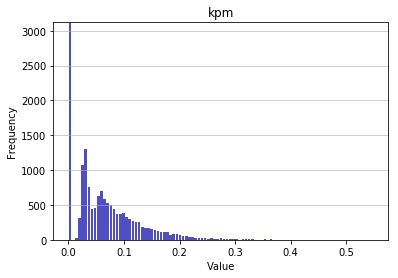

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.066
Standard deviation: 0.0613
Median: 0.0535
Maximal value: 0.5489092188599578


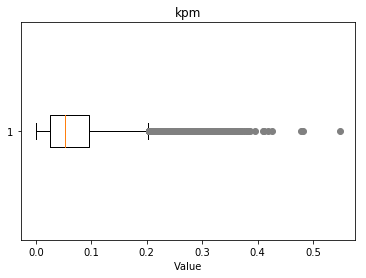

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.33, 0.28, 0.26, 0.29, 0.31, 0.36, 0.32, 0.35, 0.3, 0.25, 0.38, 0.42, 0.34, 0.27, 0.55, 0.43, 0.41, 0.37, 0.39, 0.48}


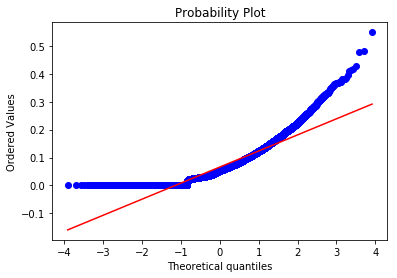

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.4132
Kurtosis: 2.8997


   Middle 
Overview of variable:  kpm 


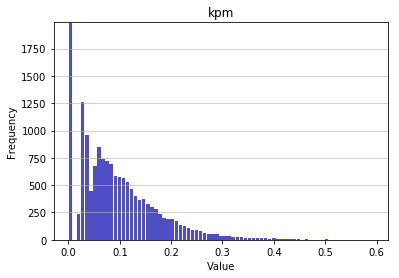

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0936
Standard deviation: 0.077
Median: 0.0777
Maximal value: 0.594059405940594


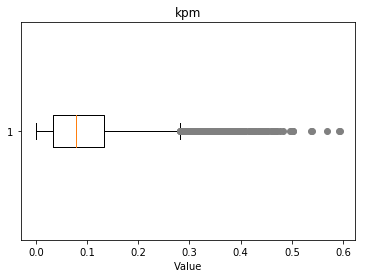

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.37, 0.48, 0.44, 0.34, 0.4, 0.35, 0.42, 0.36, 0.33, 0.38, 0.59, 0.5, 0.43, 0.45, 0.54, 0.46, 0.47, 0.39, 0.57, 0.32, 0.41}


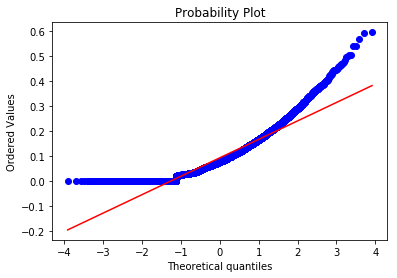

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2331
Kurtosis: 2.1252


   Jungle 
Overview of variable:  kpm 


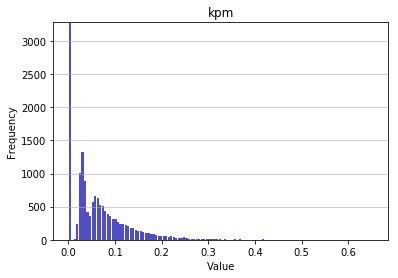

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0652
Standard deviation: 0.0642
Median: 0.0516
Maximal value: 0.653505786249149


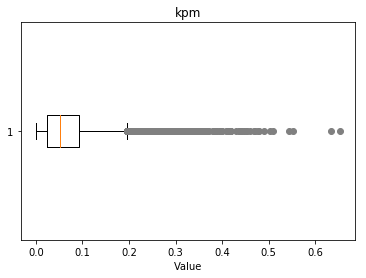

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.31, 0.26, 0.3, 0.44, 0.27, 0.29, 0.28, 0.36, 0.39, 0.32, 0.42, 0.5, 0.34, 0.51, 0.43, 0.35, 0.45, 0.37, 0.54, 0.46, 0.38, 0.63, 0.47, 0.55, 0.48, 0.4, 0.65, 0.49, 0.41, 0.33}


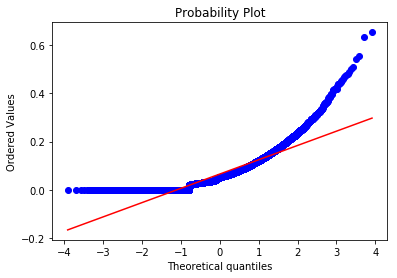

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7555
Kurtosis: 5.1598


   ADC 
Overview of variable:  kpm 


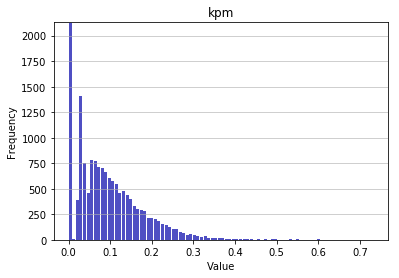

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0967
Standard deviation: 0.0806
Median: 0.0807
Maximal value: 0.7322033898305085


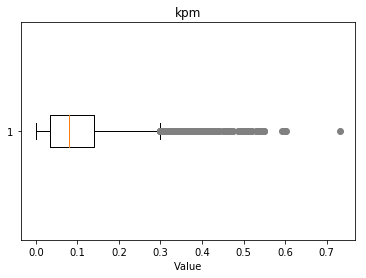

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.46, 0.37, 0.35, 0.41, 0.4, 0.5, 0.43, 0.39, 0.44, 0.38, 0.42, 0.59, 0.34, 0.51, 0.6, 0.52, 0.36, 0.53, 0.45, 0.54, 0.55, 0.47, 0.73, 0.49}


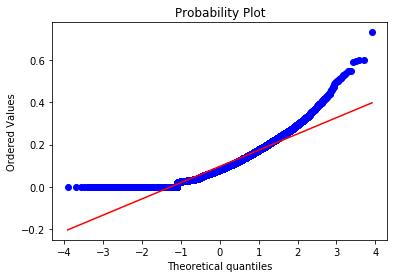

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2229
Kurtosis: 2.3385


   Support 
Overview of variable:  kpm 


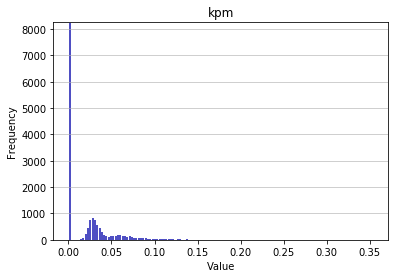

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0217
Standard deviation: 0.0307
Median: 0.0
Maximal value: 0.3537735849056604


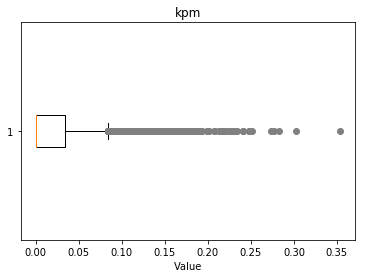

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.11, 0.14, 0.12, 0.13, 0.15, 0.16, 0.17, 0.18, 0.2, 0.23, 0.25, 0.19, 0.21, 0.3, 0.27, 0.28, 0.24, 0.22, 0.35}


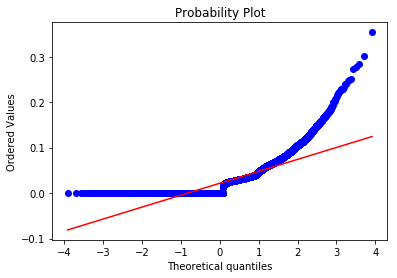

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1321
Kurtosis: 7.545


   Top 
Overview of variable:  elementals 


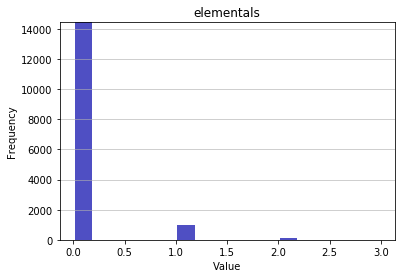

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0788
Standard deviation: 0.3006
Median: 0.0
Maximal value: 3.0


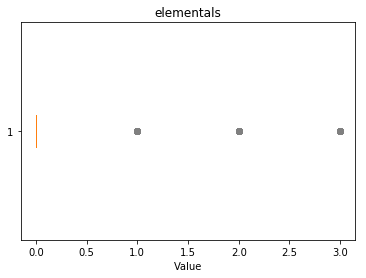

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


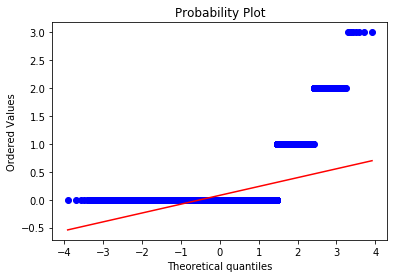

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.1751
Kurtosis: 19.3837


   Middle 
Overview of variable:  elementals 


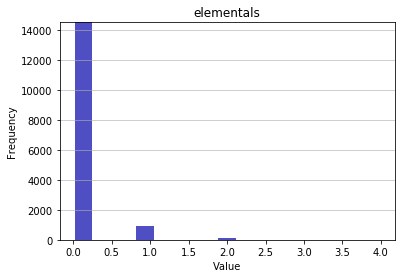

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0725
Standard deviation: 0.2862
Median: 0.0
Maximal value: 4.0


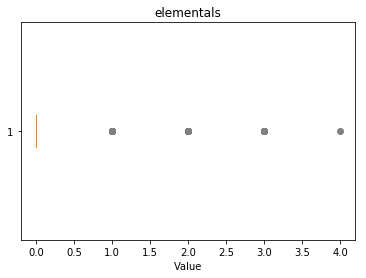

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0, 4.0}


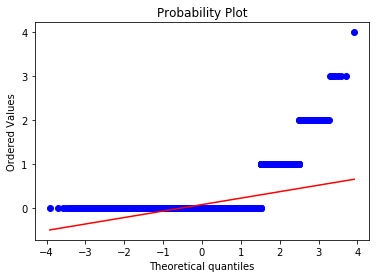

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.3782
Kurtosis: 22.3535


   Jungle 
Overview of variable:  elementals 


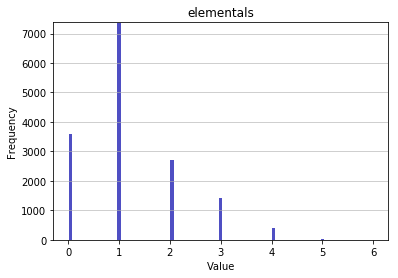

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 1.2137
Standard deviation: 0.9993
Median: 1.0
Maximal value: 6.0


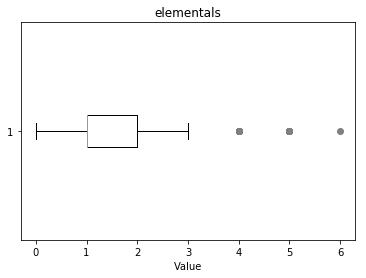

-------------------- 
Outlier detection:
 --------------------
List of outliers: {5.0, 6.0}


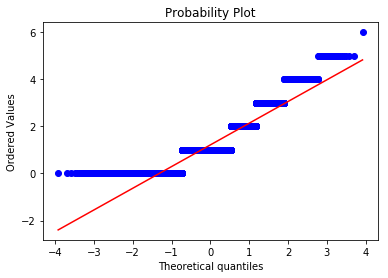

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.893
Kurtosis: 0.6264


   ADC 
Overview of variable:  elementals 


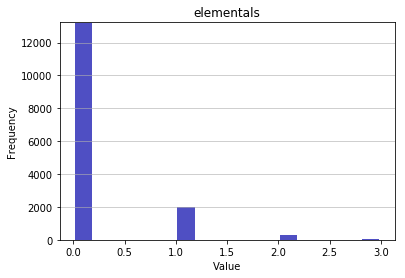

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1707
Standard deviation: 0.4373
Median: 0.0
Maximal value: 3.0


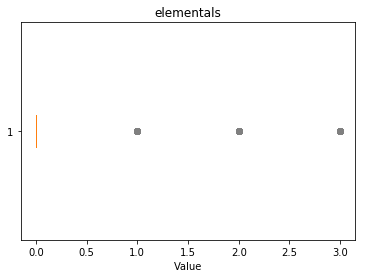

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


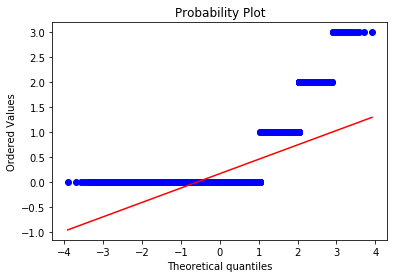

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.7257
Kurtosis: 7.8155


   Support 
Overview of variable:  elementals 


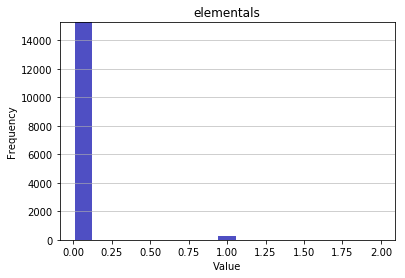

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0171
Standard deviation: 0.133
Median: 0.0
Maximal value: 2.0


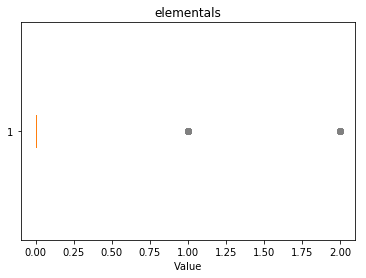

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


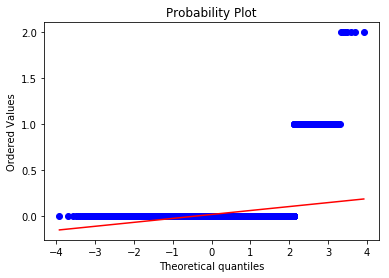

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.0217
Kurtosis: 67.5334


   Top 
Overview of variable:  firedrakes 


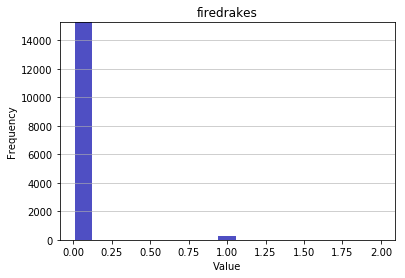

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0166
Standard deviation: 0.1294
Median: 0.0
Maximal value: 2.0


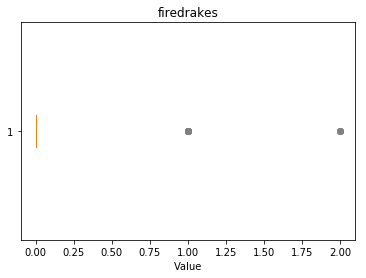

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


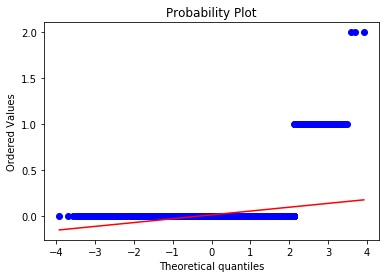

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.826
Kurtosis: 61.8803


   Middle 
Overview of variable:  firedrakes 


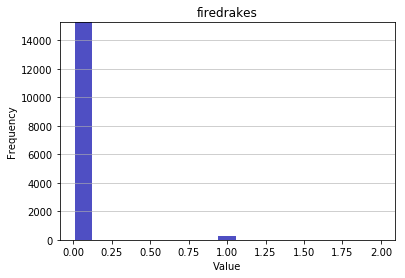

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0179
Standard deviation: 0.1348
Median: 0.0
Maximal value: 2.0


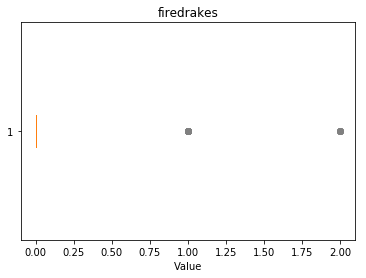

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


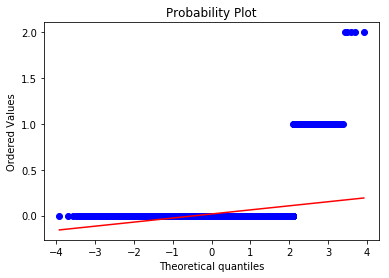

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.6728
Kurtosis: 60.4991


   Jungle 
Overview of variable:  firedrakes 


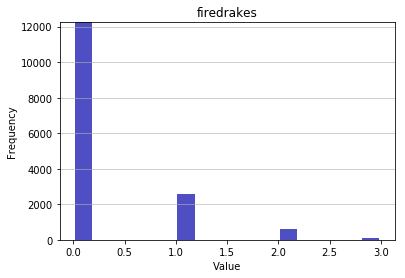

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2618
Standard deviation: 0.5524
Median: 0.0
Maximal value: 3.0


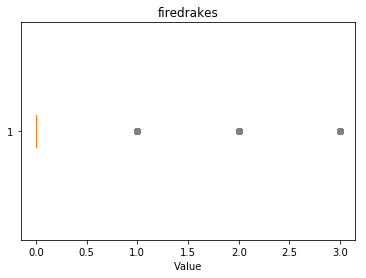

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


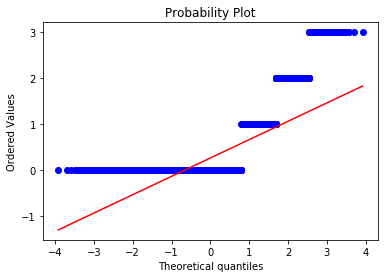

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.211
Kurtosis: 4.75


   ADC 
Overview of variable:  firedrakes 


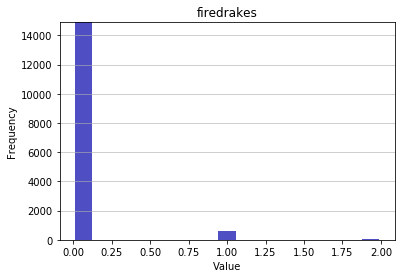

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0426
Standard deviation: 0.2132
Median: 0.0
Maximal value: 2.0


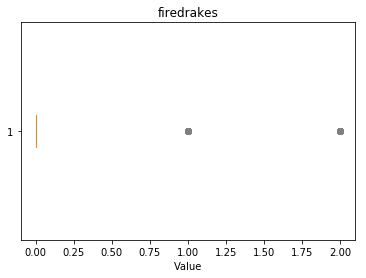

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


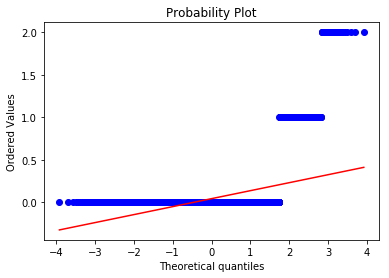

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.2299
Kurtosis: 28.9578


   Support 
Overview of variable:  firedrakes 


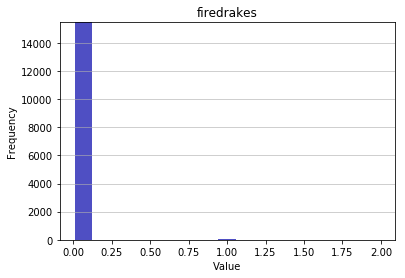

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0044
Standard deviation: 0.068
Median: 0.0
Maximal value: 2.0


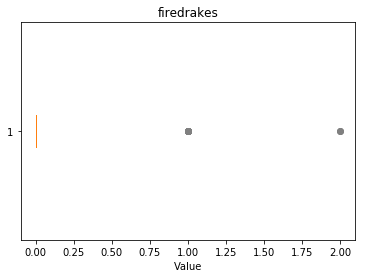

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


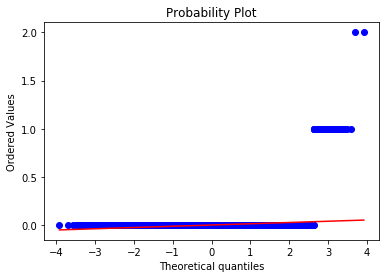

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 16.2181
Kurtosis: 282.4822


   Top 
Overview of variable:  waterdrakes 


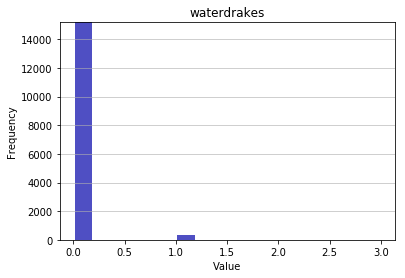

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0224
Standard deviation: 0.1532
Median: 0.0
Maximal value: 3.0


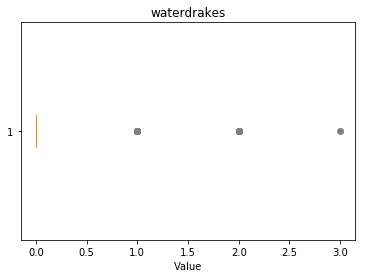

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


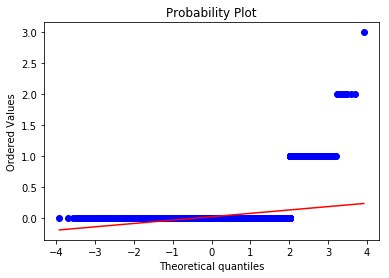

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.192
Kurtosis: 57.2243


   Middle 
Overview of variable:  waterdrakes 


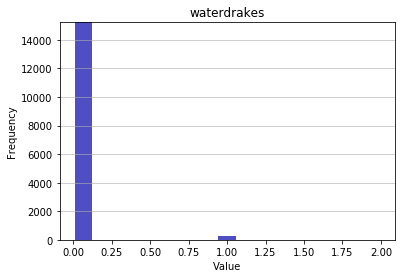

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0189
Standard deviation: 0.1399
Median: 0.0
Maximal value: 2.0


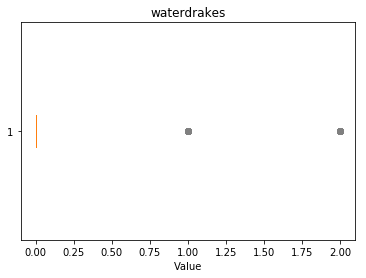

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


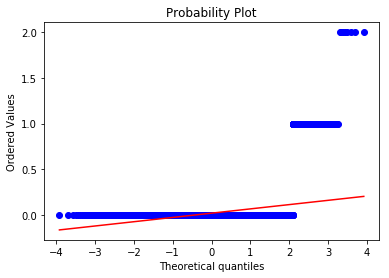

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.6268
Kurtosis: 60.9979


   Jungle 
Overview of variable:  waterdrakes 


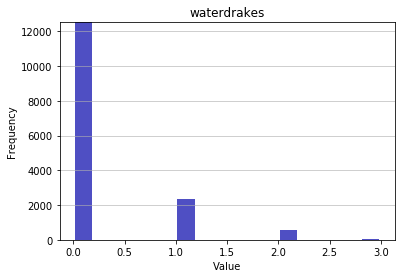

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2401
Standard deviation: 0.5342
Median: 0.0
Maximal value: 3.0


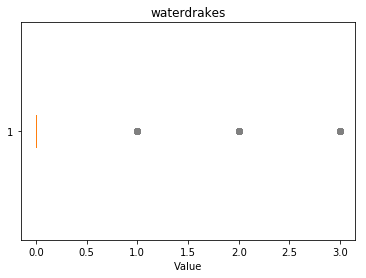

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


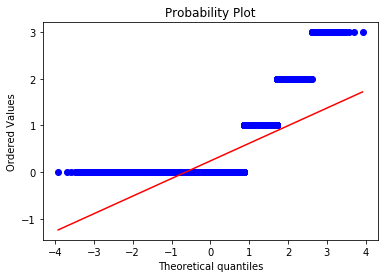

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.3386
Kurtosis: 5.3318


   ADC 
Overview of variable:  waterdrakes 


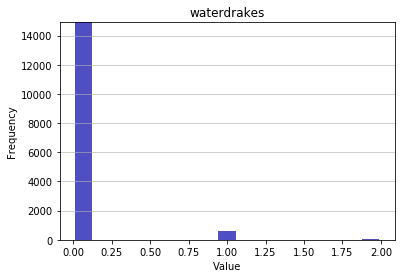

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0412
Standard deviation: 0.207
Median: 0.0
Maximal value: 2.0


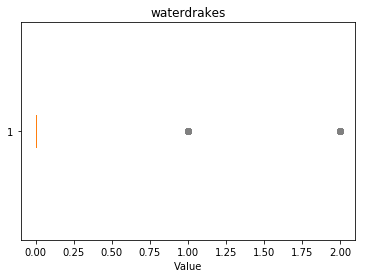

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


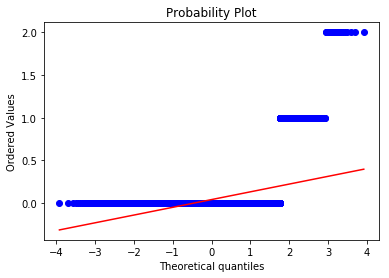

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.1736
Kurtosis: 27.8636


   Support 
Overview of variable:  waterdrakes 


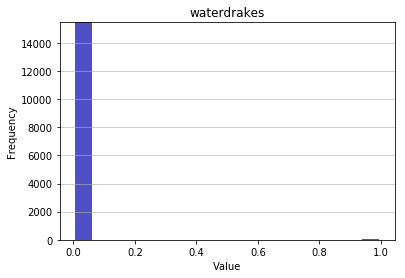

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0044
Standard deviation: 0.0661
Median: 0.0
Maximal value: 1.0


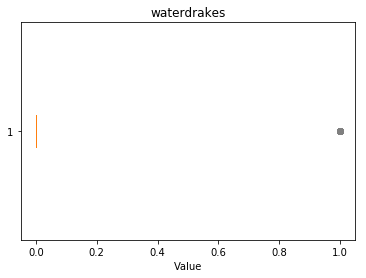

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


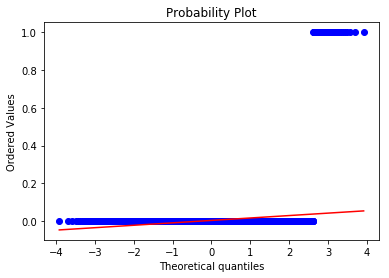

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 15.005
Kurtosis: 223.1515


   Top 
Overview of variable:  earthdrakes 


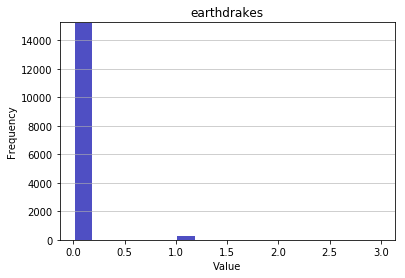

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0179
Standard deviation: 0.1398
Median: 0.0
Maximal value: 3.0


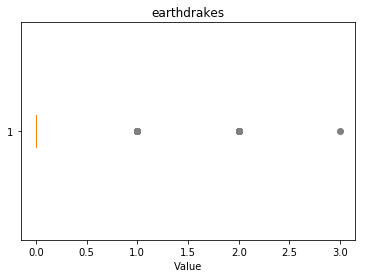

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


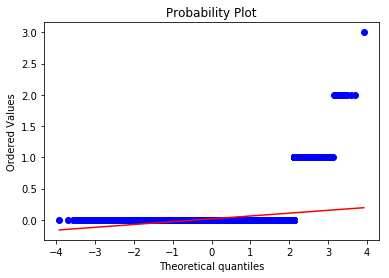

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.4446
Kurtosis: 81.1055


   Middle 
Overview of variable:  earthdrakes 


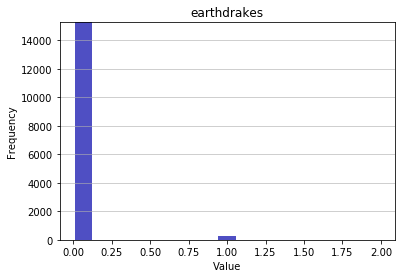

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.017
Standard deviation: 0.1325
Median: 0.0
Maximal value: 2.0


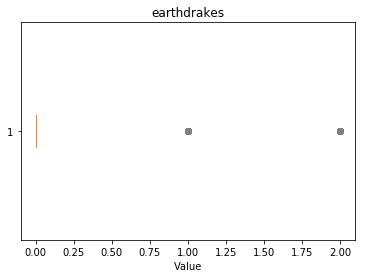

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


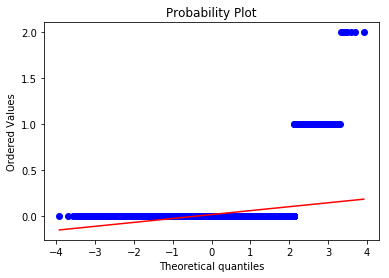

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.0575
Kurtosis: 68.1783


   Jungle 
Overview of variable:  earthdrakes 


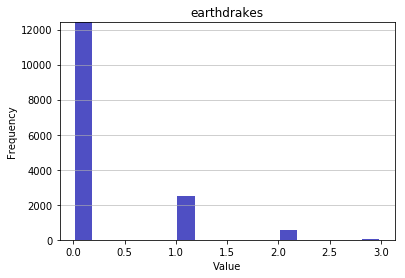

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2424
Standard deviation: 0.5245
Median: 0.0
Maximal value: 3.0


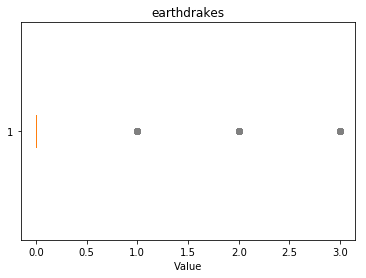

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


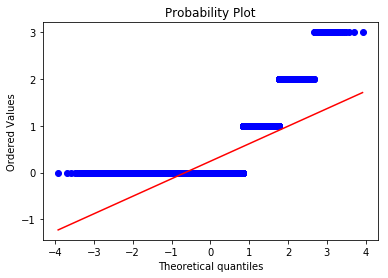

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.2513
Kurtosis: 4.9497


   ADC 
Overview of variable:  earthdrakes 


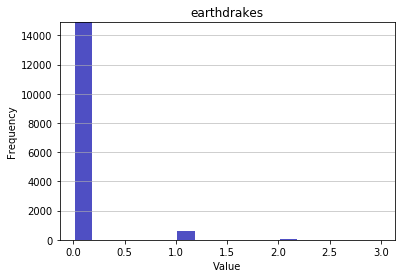

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0431
Standard deviation: 0.2159
Median: 0.0
Maximal value: 3.0


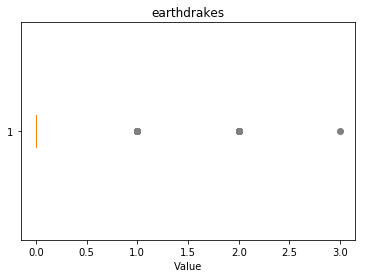

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


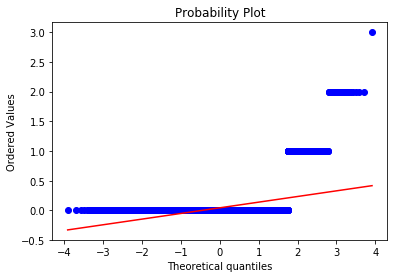

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.3238
Kurtosis: 30.833


   Support 
Overview of variable:  earthdrakes 


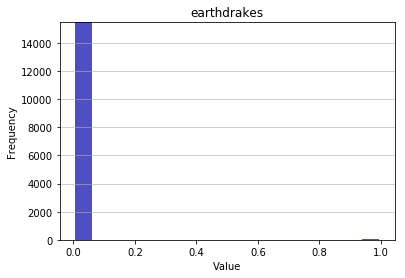

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.004
Standard deviation: 0.0631
Median: 0.0
Maximal value: 1.0


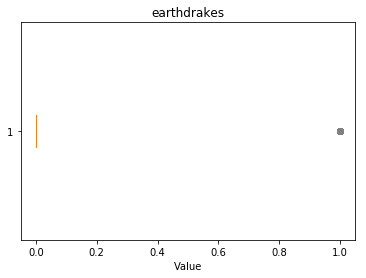

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


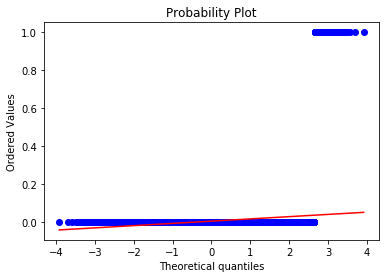

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 15.7235
Kurtosis: 245.2298


   Top 
Overview of variable:  airdrakes 


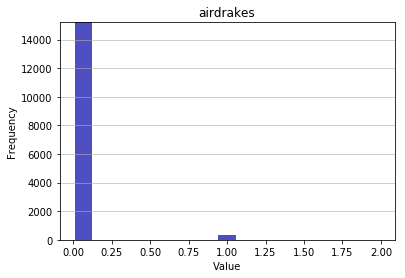

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0218
Standard deviation: 0.1533
Median: 0.0
Maximal value: 2.0


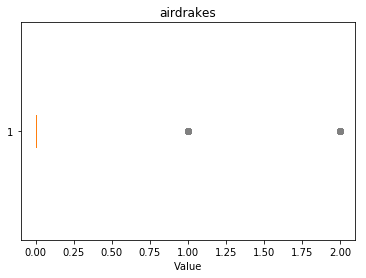

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


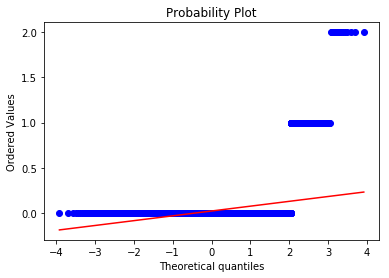

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.4417
Kurtosis: 59.8572


   Middle 
Overview of variable:  airdrakes 


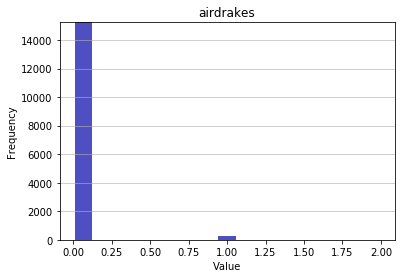

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0188
Standard deviation: 0.1399
Median: 0.0
Maximal value: 2.0


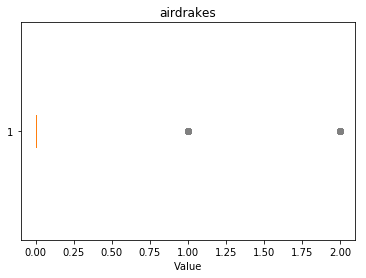

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


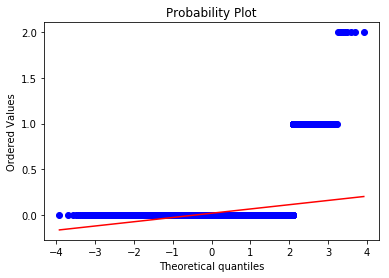

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 7.7209
Kurtosis: 62.9643


   Jungle 
Overview of variable:  airdrakes 


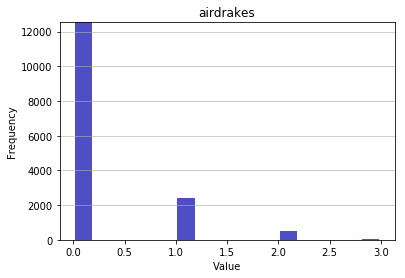

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.2337
Standard deviation: 0.5179
Median: 0.0
Maximal value: 3.0


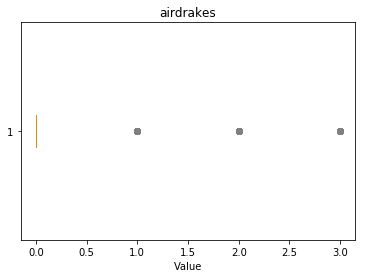

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0}


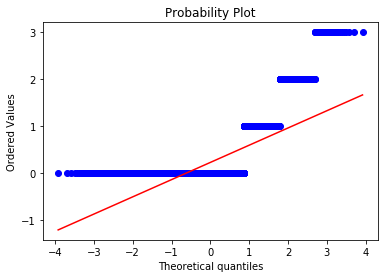

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.3145
Kurtosis: 5.2527


   ADC 
Overview of variable:  airdrakes 


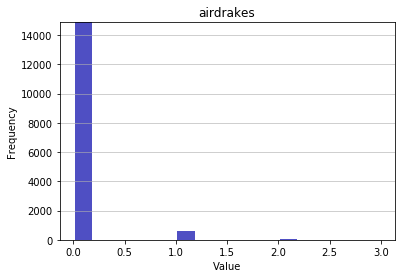

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0439
Standard deviation: 0.215
Median: 0.0
Maximal value: 3.0


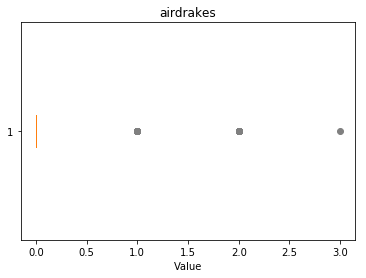

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


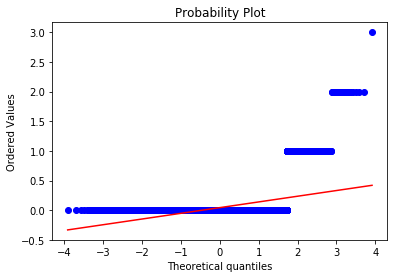

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 5.1192
Kurtosis: 28.1362


   Support 
Overview of variable:  airdrakes 


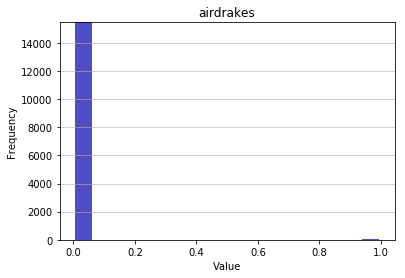

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0043
Standard deviation: 0.0656
Median: 0.0
Maximal value: 1.0


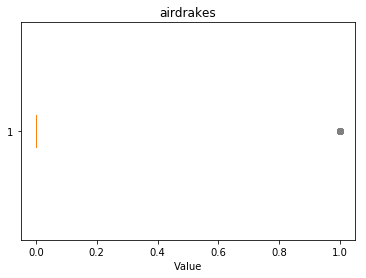

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


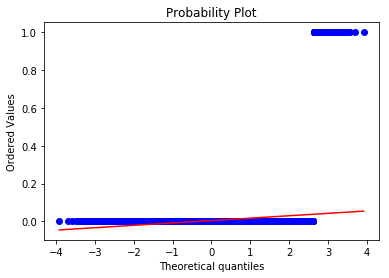

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 15.1181
Kurtosis: 226.5566


   Top 
Overview of variable:  elders 


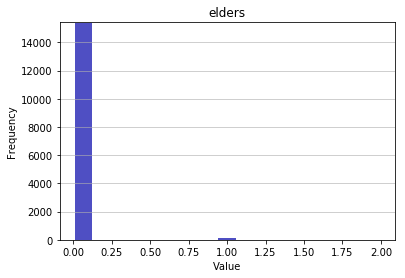

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0068
Standard deviation: 0.0828
Median: 0.0
Maximal value: 2.0


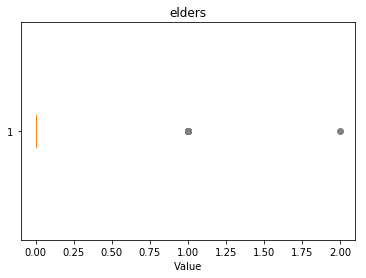

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


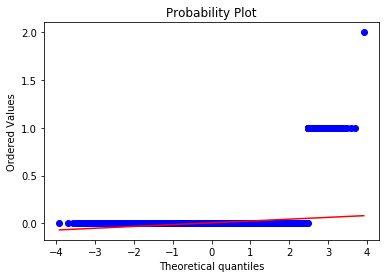

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 12.371
Kurtosis: 156.3284


   Middle 
Overview of variable:  elders 


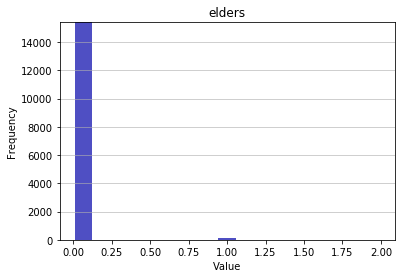

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0076
Standard deviation: 0.0876
Median: 0.0
Maximal value: 2.0


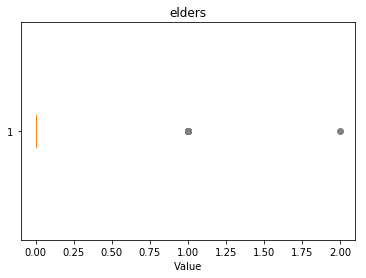

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0}


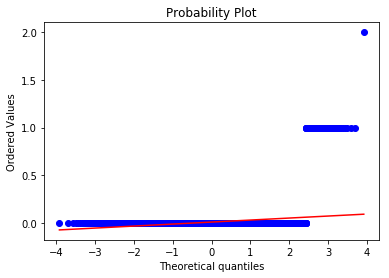

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 11.6213
Kurtosis: 137.2825


   Jungle 
Overview of variable:  elders 


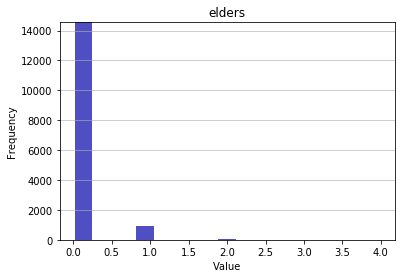

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0676
Standard deviation: 0.273
Median: 0.0
Maximal value: 4.0


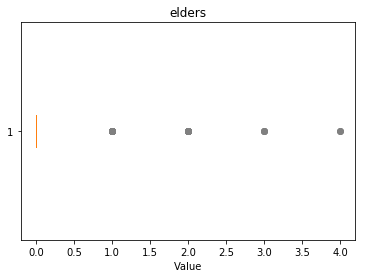

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0, 4.0}


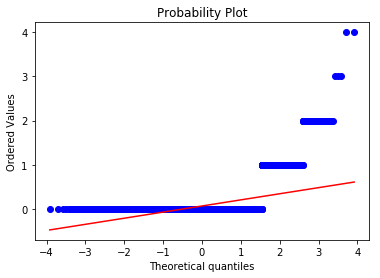

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.4669
Kurtosis: 23.9965


   ADC 
Overview of variable:  elders 


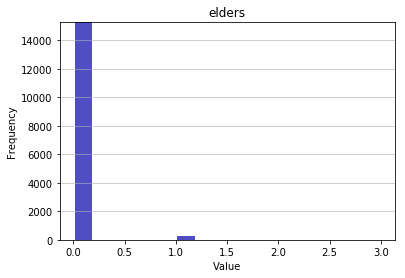

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0166
Standard deviation: 0.1306
Median: 0.0
Maximal value: 3.0


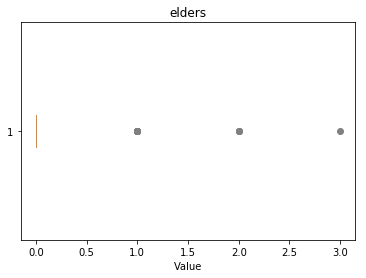

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 2.0, 3.0}


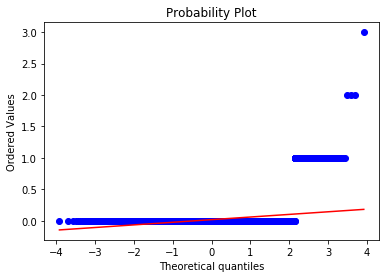

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.2632
Kurtosis: 76.1601


   Support 
Overview of variable:  elders 


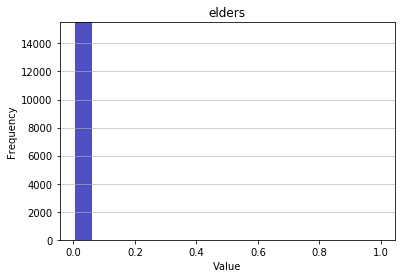

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.001
Standard deviation: 0.0311
Median: 0.0
Maximal value: 1.0


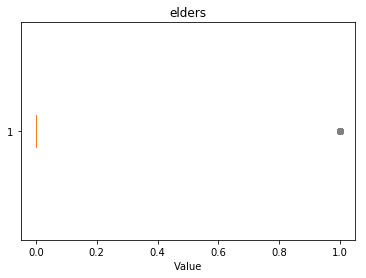

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0}


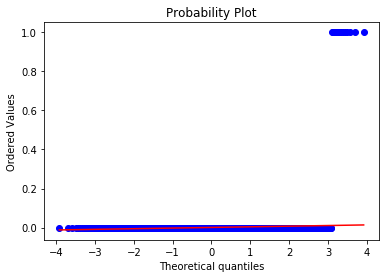

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 32.1134
Kurtosis: 1029.2676


   Top 
Overview of variable:  dmgtochamps 


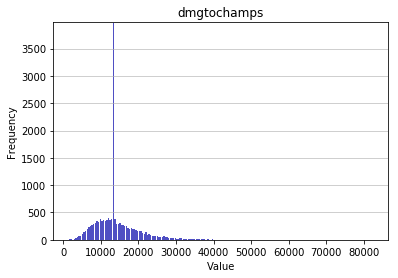

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1390.0
Mean: 14278.0014
Standard deviation: 6049.0547
Median: 13300.0
Maximal value: 82500.0


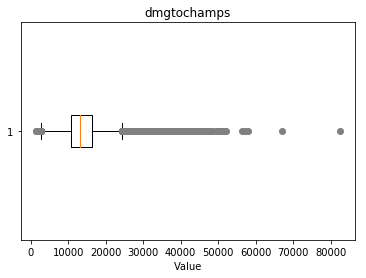

-------------------- 
Outlier detection:
 --------------------
List of outliers: {36356.0, 36357.0, 48133.0, 32775.0, 32776.0, 35849.0, 33296.0, 34834.0, 42003.0, 37395.0, 32789.0, 36374.0, 32791.0, 43035.0, 36380.0, 43039.0, 34336.0, 33313.0, 33830.0, 33836.0, 47662.0, 32816.0, 35377.0, 32819.0, 39987.0, 34358.0, 37434.0, 35902.0, 32830.0, 35392.0, 36414.0, 41027.0, 37956.0, 82500.0, 48195.0, 38982.0, 34371.0, 37452.0, 32846.0, 37455.0, 39504.0, 35407.0, 35411.0, 36439.0, 39514.0, 51802.0, 57947.0, 40029.0, 36957.0, 37469.0, 33894.0, 32871.0, 36967.0, 32874.0, 33387.0, 50289.0, 43639.0, 33912.0, 38010.0, 32892.0, 41090.0, 36996.0, 33925.0, 34438.0, 48263.0, 42631.0, 38544.0, 34450.0, 33941.0, 36504.0, 38041.0, 43166.0, 36515.0, 32931.0, 34983.0, 36522.0, 43180.0, 47277.0, 50862.0, 46254.0, 33456.0, 38577.0, 33970.0, 32435.0, 34989.0, 35510.0, 38585.0, 37562.0, 34490.0, 40126.0, 44229.0, 37064.0, 36041.0, 32970.0, 40650.0, 46282.0, 34507.0, 35020.0, 36560.0, 32978.0, 34005.0, 51927.0, 

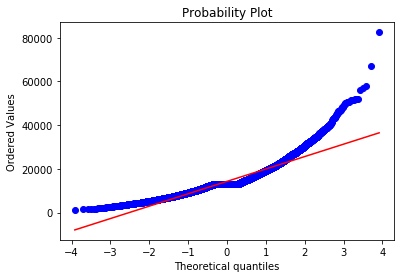

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6943
Kurtosis: 5.9138


   Middle 
Overview of variable:  dmgtochamps 


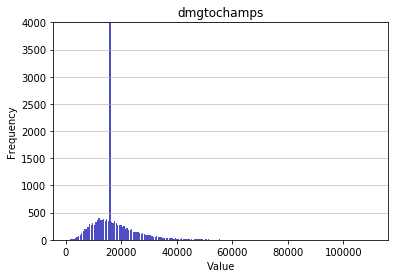

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1013.0
Mean: 17481.6237
Standard deviation: 8089.5302
Median: 16120.0
Maximal value: 110715.0


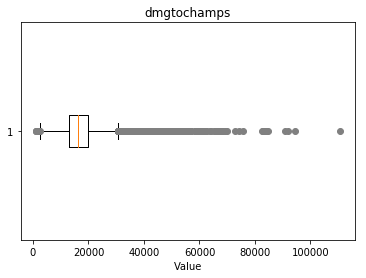

-------------------- 
Outlier detection:
 --------------------
List of outliers: {53760.0, 54273.0, 52225.0, 42501.0, 46087.0, 74248.0, 56840.0, 45581.0, 46094.0, 59407.0, 43533.0, 44561.0, 42515.0, 49171.0, 67093.0, 49173.0, 42007.0, 42005.0, 56853.0, 61461.0, 44571.0, 48668.0, 44572.0, 48152.0, 46111.0, 42013.0, 50201.0, 48678.0, 46630.0, 46632.0, 51241.0, 42536.0, 46633.0, 43561.0, 61485.0, 43567.0, 51248.0, 46128.0, 42034.0, 55347.0, 69170.0, 60978.0, 42544.0, 52278.0, 43070.0, 46656.0, 55362.0, 47689.0, 52811.0, 75854.0, 45141.0, 50262.0, 48725.0, 54874.0, 58458.0, 50778.0, 42078.0, 42079.0, 47201.0, 50274.0, 47717.0, 45161.0, 58986.0, 44652.0, 61551.0, 46192.0, 43121.0, 44146.0, 43635.0, 47734.0, 46200.0, 110715.0, 51836.0, 72829.0, 91774.0, 42625.0, 49793.0, 46722.0, 42631.0, 58504.0, 56455.0, 42125.0, 65679.0, 43155.0, 43158.0, 50841.0, 55454.0, 44196.0, 47783.0, 42152.0, 68265.0, 43689.0, 47274.0, 51880.0, 47280.0, 83634.0, 46259.0, 82611.0, 47286.0, 50359.0, 44726.0, 43191.0,

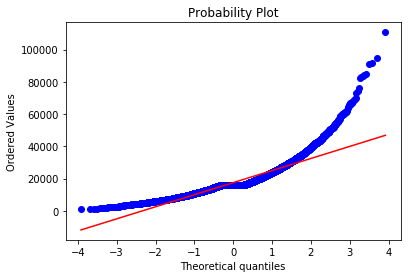

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9908
Kurtosis: 8.3839


   Jungle 
Overview of variable:  dmgtochamps 


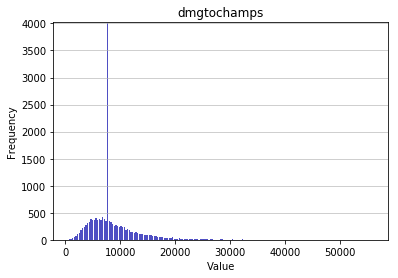

-------------------- 
Summary statistics:
 --------------------
Minimum value: 564.0
Mean: 8553.8967
Standard deviation: 4410.2682
Median: 7717.0
Maximal value: 56092.0


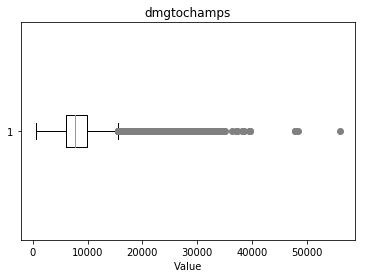

-------------------- 
Outlier detection:
 --------------------
List of outliers: {29696.0, 22529.0, 33281.0, 22531.0, 22532.0, 23042.0, 23043.0, 32264.0, 24586.0, 22539.0, 33292.0, 25610.0, 22030.0, 22545.0, 34322.0, 24595.0, 25620.0, 23063.0, 22551.0, 24602.0, 25630.0, 22560.0, 24609.0, 24102.0, 22056.0, 24109.0, 32301.0, 23086.0, 25136.0, 24628.0, 24118.0, 22583.0, 22072.0, 25655.0, 24634.0, 28218.0, 22077.0, 23101.0, 23104.0, 34372.0, 28743.0, 22602.0, 25677.0, 30797.0, 23117.0, 33873.0, 23125.0, 22109.0, 24670.0, 22623.0, 24160.0, 23139.0, 27751.0, 23144.0, 24682.0, 24172.0, 28783.0, 26736.0, 25202.0, 23667.0, 22645.0, 33401.0, 28282.0, 23165.0, 25217.0, 22147.0, 22148.0, 24197.0, 38531.0, 34951.0, 27271.0, 26249.0, 23177.0, 23178.0, 30860.0, 22669.0, 39566.0, 26759.0, 25231.0, 33934.0, 33426.0, 37020.0, 24222.0, 33442.0, 28322.0, 30373.0, 22694.0, 25766.0, 23722.0, 33451.0, 47787.0, 22188.0, 25260.0, 22704.0, 25264.0, 30389.0, 26294.0, 22711.0, 22710.0, 23222.0, 22714.0, 23739.0, 

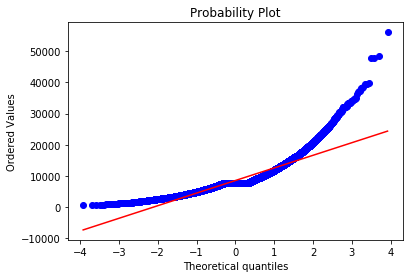

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.0552
Kurtosis: 7.7001


   ADC 
Overview of variable:  dmgtochamps 


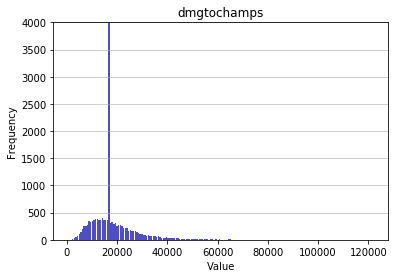

-------------------- 
Summary statistics:
 --------------------
Minimum value: 723.0
Mean: 18573.8804
Standard deviation: 9570.7719
Median: 16799.5
Maximal value: 121937.0


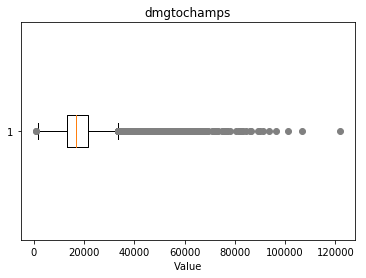

-------------------- 
Outlier detection:
 --------------------
List of outliers: {49152.0, 58370.0, 48645.0, 57863.0, 65549.0, 62478.0, 48141.0, 49680.0, 52750.0, 52755.0, 51225.0, 58906.0, 60445.0, 54814.0, 52254.0, 56861.0, 56354.0, 64549.0, 58405.0, 84519.0, 53288.0, 64042.0, 59435.0, 54826.0, 56365.0, 72765.0, 53310.0, 47681.0, 55362.0, 51265.0, 68161.0, 53317.0, 49730.0, 65603.0, 53320.0, 61007.0, 54352.0, 50257.0, 48210.0, 67666.0, 121937.0, 76885.0, 61014.0, 49751.0, 56920.0, 48217.0, 54359.0, 48733.0, 50783.0, 69216.0, 56417.0, 49763.0, 48739.0, 49253.0, 47719.0, 49255.0, 58475.0, 47725.0, 47730.0, 53878.0, 48760.0, 49276.0, 54908.0, 64638.0, 53375.0, 54401.0, 50825.0, 52362.0, 49808.0, 54418.0, 47765.0, 86170.0, 47771.0, 53404.0, 49822.0, 68255.0, 55968.0, 47777.0, 59550.0, 59038.0, 55972.0, 65190.0, 58535.0, 82600.0, 47782.0, 59050.0, 48296.0, 55468.0, 76463.0, 52403.0, 47286.0, 59063.0, 48824.0, 48825.0, 50362.0, 81595.0, 50365.0, 53956.0, 64709.0, 56006.0, 80583.0, 52936.0,

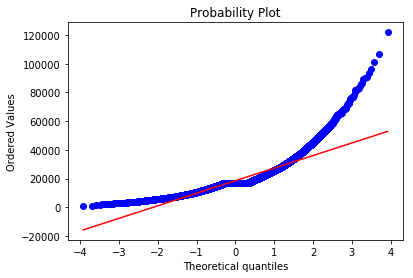

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1124
Kurtosis: 8.1691


   Support 
Overview of variable:  dmgtochamps 


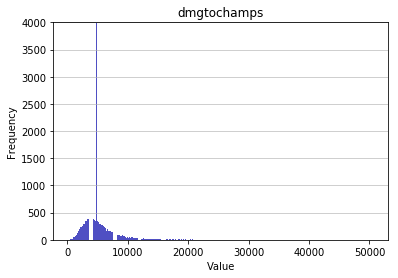

-------------------- 
Summary statistics:
 --------------------
Minimum value: 231.0
Mean: 5426.5539
Standard deviation: 3231.4017
Median: 4791.5
Maximal value: 50600.0


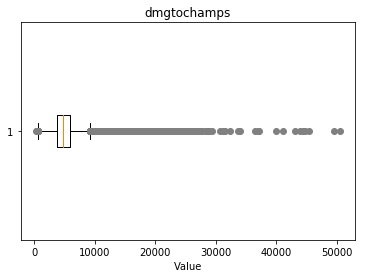

-------------------- 
Outlier detection:
 --------------------
List of outliers: {16897.0, 16898.0, 15876.0, 19462.0, 18439.0, 21000.0, 20489.0, 17418.0, 19465.0, 16392.0, 26121.0, 39944.0, 24586.0, 18963.0, 26645.0, 30743.0, 24600.0, 15386.0, 17436.0, 24605.0, 18974.0, 23581.0, 15903.0, 17917.0, 18466.0, 16421.0, 16935.0, 16936.0, 20521.0, 18986.0, 28712.0, 19496.0, 20525.0, 20008.0, 26671.0, 17456.0, 15409.0, 22058.0, 15407.0, 16953.0, 17468.0, 17470.0, 21566.0, 22078.0, 17475.0, 19523.0, 15429.0, 17478.0, 23622.0, 16455.0, 20549.0, 15948.0, 43086.0, 18514.0, 36948.0, 15956.0, 23638.0, 15447.0, 22617.0, 16988.0, 19040.0, 22624.0, 25698.0, 15490.0, 25713.0, 15987.0, 24183.0, 15991.0, 18552.0, 25720.0, 21630.0, 27774.0, 20607.0, 18050.0, 15491.0, 17028.0, 19589.0, 20613.0, 15495.0, 19079.0, 16516.0, 17546.0, 18058.0, 16012.0, 41097.0, 15493.0, 20111.0, 16527.0, 21138.0, 24210.0, 18067.0, 16532.0, 27797.0, 21143.0, 26263.0, 20123.0, 17563.0, 18588.0, 18075.0, 17051.0, 18590.0, 18587.0, 

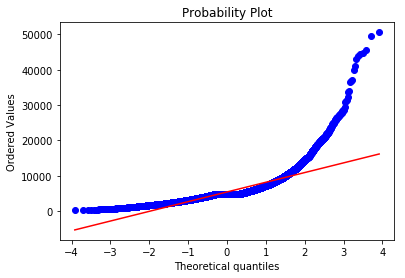

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.5992
Kurtosis: 24.4758


   Top 
Overview of variable:  dmgtochampsperminute 


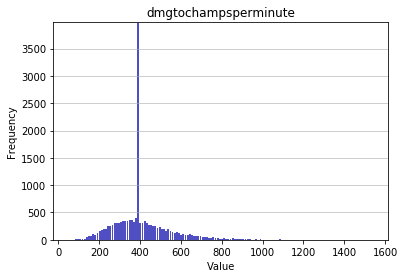

-------------------- 
Summary statistics:
 --------------------
Minimum value: 49.04322486644001
Mean: 405.1795
Standard deviation: 138.2215
Median: 387.6042
Maximal value: 1541.5758330738088


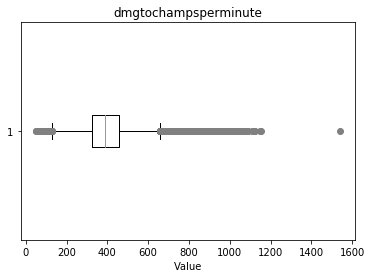

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1541.58, 1029.58, 1032.42, 1037.99, 1045.85, 1050.92, 1052.82, 1055.75, 822.94, 1069.26, 1070.19, 1072.66, 1072.82, 825.15, 1080.76, 1082.87, 1083.48, 826.53, 1085.92, 1085.71, 826.03, 1088.71, 829.15, 829.86, 829.68, 830.21, 1110.12, 1119.43, 833.78, 833.26, 1123.54, 879.76, 834.23, 837.19, 1149.1, 1154.19, 842.07, 843.7, 881.73, 845.25, 846.2, 849.52, 849.72, 850.19, 850.34, 850.46, 851.06, 851.35, 852.19, 854.43, 854.07, 854.34, 855.88, 856.73, 856.24, 857.67, 884.94, 865.96, 867.0, 872.89, 874.54, 875.8, 820.01, 821.09, 822.33, 822.14, 824.79, 825.39, 826.69, 827.28, 826.93, 829.6, 829.38, 831.92, 826.29, 827.13, 834.88, 834.04, 831.85, 837.57, 838.65, 839.33, 838.9, 832.14, 842.46, 836.84, 837.36, 845.01, 846.44, 846.53, 848.67, 841.32, 850.4, 850.8, 852.18, 852.2, 854.36, 850.78, 855.17, 857.97, 853.38, 859.51, 860.23, 861.98, 856.44, 856.41, 864.19, 865.05, 865.26, 860.63, 863.45, 869.01, 870.69, 8

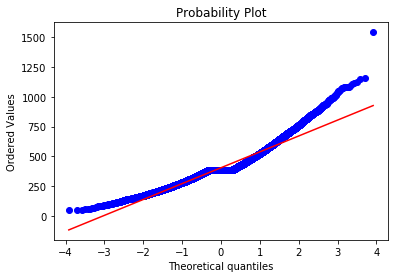

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0719
Kurtosis: 2.4404


   Middle 
Overview of variable:  dmgtochampsperminute 


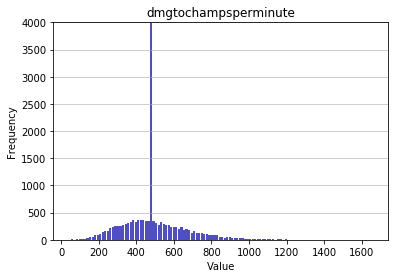

-------------------- 
Summary statistics:
 --------------------
Minimum value: 38.34700315457413
Mean: 492.4876
Standard deviation: 170.4631
Median: 473.8916
Maximal value: 1661.6227180527383


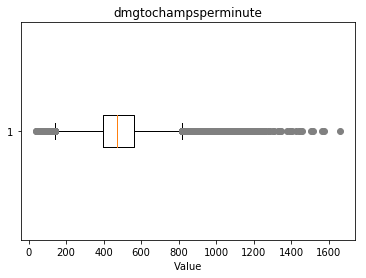

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1024.45, 1025.02, 1027.49, 1029.57, 1030.39, 1031.83, 1031.49, 1030.62, 1033.82, 1034.0, 1036.16, 1030.16, 1038.05, 1039.08, 1038.91, 1041.07, 1038.47, 1041.2, 1042.93, 1045.83, 1021.95, 1047.17, 1049.3, 1050.07, 1053.68, 1053.2, 1055.65, 1566.81, 1057.39, 1058.33, 1059.19, 1060.02, 1061.55, 1062.78, 1062.65, 1576.46, 1065.8, 1066.62, 1060.66, 1068.57, 1069.54, 1070.17, 1068.34, 1072.14, 1074.64, 1074.27, 1076.87, 1076.39, 1081.12, 1082.69, 1083.36, 1083.19, 1085.05, 1030.7, 1030.73, 1089.38, 1030.05, 1031.78, 1096.08, 1097.29, 1098.85, 1097.48, 1100.24, 1101.22, 1100.3, 1032.16, 1104.08, 1105.94, 1106.28, 1107.59, 1108.41, 1109.71, 1109.36, 1110.62, 1110.99, 1035.62, 1114.42, 1115.86, 1116.75, 1118.21, 1120.29, 1037.39, 1123.28, 1129.32, 1132.27, 1133.28, 1132.87, 1132.23, 1141.56, 1145.22, 1146.54, 1148.52, 1661.62, 1151.42, 1151.45, 1153.07, 1154.71, 1152.89, 1160.39, 1161.38, 1162.17, 1163.09, 1160.97

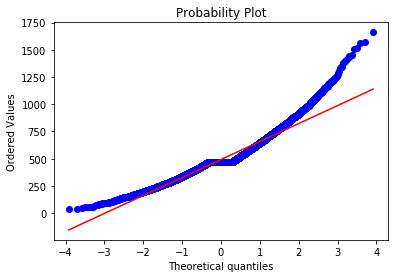

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9706
Kurtosis: 2.3917


   Jungle 
Overview of variable:  dmgtochampsperminute 


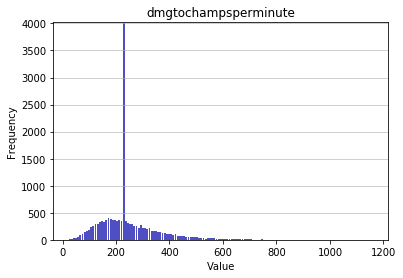

-------------------- 
Summary statistics:
 --------------------
Minimum value: 22.38303181534623
Mean: 243.7449
Standard deviation: 108.4315
Median: 226.3206
Maximal value: 1161.7386934673368


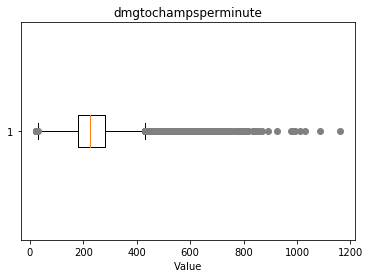

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1028.96, 569.33, 570.18, 571.21, 571.44, 572.51, 574.94, 575.18, 576.76, 577.79, 578.32, 579.42, 580.42, 580.16, 580.84, 581.56, 584.28, 585.19, 585.16, 582.72, 587.28, 585.47, 583.81, 591.82, 584.19, 593.47, 594.03, 595.86, 596.38, 596.16, 598.87, 599.7, 600.64, 598.52, 602.42, 600.67, 604.13, 604.62, 606.28, 607.41, 607.28, 604.31, 605.74, 607.46, 609.5, 613.99, 613.85, 615.07, 616.66, 608.11, 610.04, 619.03, 619.55, 621.16, 622.24, 622.15, 624.7, 620.29, 626.93, 619.25, 628.06, 629.75, 630.1, 628.45, 625.03, 633.85, 634.17, 635.99, 634.27, 634.15, 634.6, 637.1, 633.18, 641.16, 642.6, 641.43, 644.04, 645.65, 646.16, 647.44, 648.81, 649.12, 650.72, 648.16, 644.88, 653.3, 654.01, 655.53, 651.69, 657.21, 658.99, 657.09, 660.16, 660.7, 657.41, 662.99, 657.5, 665.07, 666.64, 667.49, 668.78, 668.68, 671.77, 671.92, 673.61, 674.6, 673.08, 671.62, 673.95, 678.44, 679.15, 680.36, 681.84, 679.52, 681.37, 680.31, 

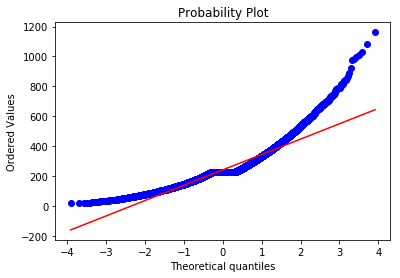

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.5122
Kurtosis: 4.2869


   ADC 
Overview of variable:  dmgtochampsperminute 


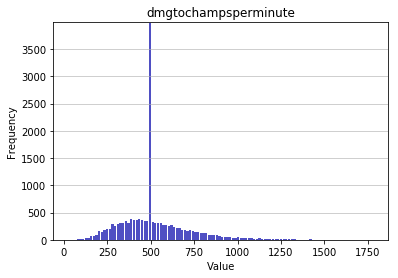

-------------------- 
Summary statistics:
 --------------------
Minimum value: 26.53846153846154
Mean: 518.0865
Standard deviation: 196.64
Median: 491.8199
Maximal value: 1781.1138461538462


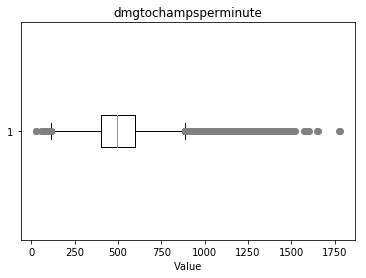

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1120.9, 1120.04, 1120.56, 1122.66, 1123.16, 1125.36, 1575.35, 1127.73, 1127.82, 1577.25, 1129.73, 1588.18, 1130.93, 1603.4, 1108.33, 1109.35, 1645.94, 1112.4, 1113.81, 1114.87, 1112.74, 1115.32, 1117.09, 1118.23, 1118.47, 1120.72, 1121.16, 1122.9, 1123.82, 1124.2, 1123.79, 1126.22, 1127.14, 1126.37, 1129.77, 1126.31, 1131.22, 1123.83, 1133.32, 1133.8, 1135.01, 1134.52, 1137.08, 1137.91, 1137.15, 1140.76, 1141.69, 1654.46, 1137.3, 1136.77, 1147.96, 1147.78, 1149.57, 1149.34, 1151.85, 1152.54, 1152.83, 1154.25, 1155.82, 1149.93, 1153.0, 1149.03, 1161.42, 1161.81, 1166.14, 1167.46, 1168.25, 1169.99, 1170.11, 1171.36, 1172.17, 1172.87, 1174.35, 1175.12, 1174.33, 1173.27, 1178.16, 1175.35, 1180.32, 1175.32, 1175.36, 1179.16, 1186.2, 1186.24, 1188.9, 1189.87, 1190.17, 1190.36, 1190.35, 1193.09, 1191.38, 1197.37, 1204.44, 1205.79, 1205.35, 1207.55, 1209.53, 1210.02, 1209.8, 1212.2, 1217.15, 1220.39, 1221.07, 122

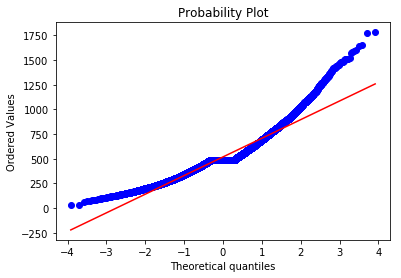

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1719
Kurtosis: 2.7526


   Support 
Overview of variable:  dmgtochampsperminute 


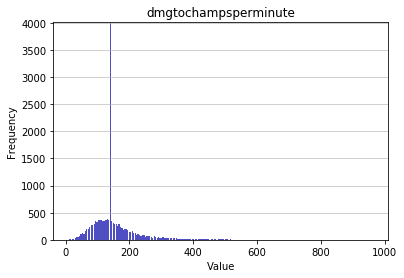

-------------------- 
Summary statistics:
 --------------------
Minimum value: 9.447852760736197
Mean: 154.57
Standard deviation: 78.682
Median: 139.4989
Maximal value: 963.9054404145078


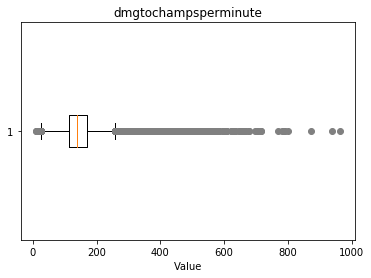

-------------------- 
Outlier detection:
 --------------------
List of outliers: {407.11, 407.01, 407.71, 408.88, 408.61, 408.59, 410.37, 410.2, 412.81, 412.82, 412.66, 412.87, 412.05, 413.72, 413.77, 413.05, 414.87, 415.32, 415.87, 415.65, 415.0, 416.53, 416.63, 417.42, 419.54, 420.72, 423.73, 424.87, 425.39, 426.13, 427.47, 406.29, 428.33, 429.33, 429.61, 503.88, 430.72, 430.12, 430.62, 430.95, 431.61, 432.48, 435.64, 437.64, 438.77, 439.32, 440.35, 440.52, 443.0, 443.09, 447.57, 448.03, 448.9, 448.84, 449.38, 451.64, 454.87, 455.07, 455.24, 456.92, 456.41, 461.89, 461.1, 463.17, 463.19, 465.59, 466.71, 466.54, 466.97, 468.19, 469.74, 470.26, 470.44, 471.56, 471.81, 471.13, 472.99, 472.67, 473.28, 484.94, 390.77, 391.26, 390.95, 392.26, 392.47, 395.28, 396.63, 391.54, 398.1, 398.67, 400.34, 397.02, 402.69, 403.61, 404.98, 402.76, 398.03, 407.73, 408.09, 408.83, 410.9, 410.83, 410.57, 412.0, 411.87, 412.08, 414.27, 413.14, 415.61, 415.03, 415.48, 416.77, 416.21, 415.46, 419.33, 421.05

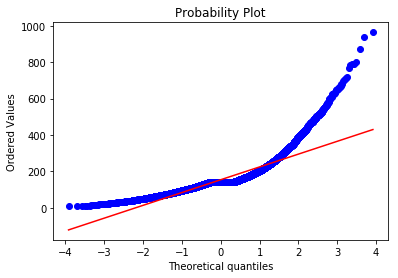

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.4215
Kurtosis: 9.9593


   Top 
Overview of variable:  dmgshare 


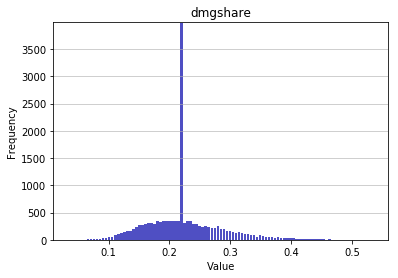

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.033879490947750224
Mean: 0.2235
Standard deviation: 0.0614
Median: 0.2178
Maximal value: 0.5350679287851292


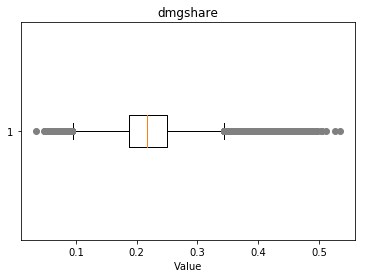

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.43, 0.49, 0.41, 0.46, 0.42, 0.48, 0.45, 0.44, 0.54, 0.51, 0.5, 0.03, 0.47, 0.53}


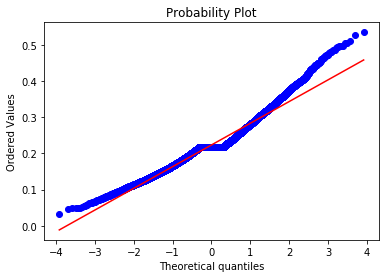

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7263
Kurtosis: 1.3487


   Middle 
Overview of variable:  dmgshare 


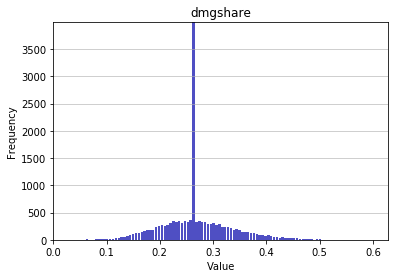

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.02855210124298881
Mean: 0.2689
Standard deviation: 0.0659
Median: 0.2654
Maximal value: 0.6007697170267355


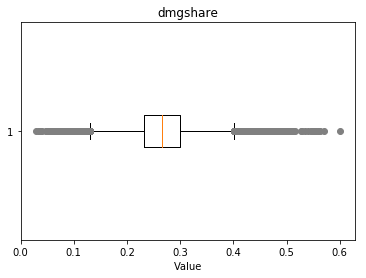

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.47, 0.48, 0.51, 0.55, 0.49, 0.5, 0.54, 0.07, 0.53, 0.05, 0.56, 0.57, 0.03, 0.04, 0.52, 0.6, 0.06}


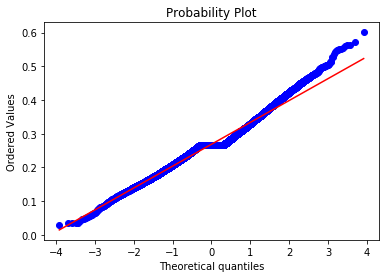

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3944
Kurtosis: 1.0614


   Jungle 
Overview of variable:  dmgshare 


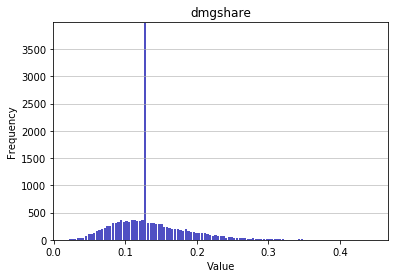

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.020713970912296167
Mean: 0.1333
Standard deviation: 0.0489
Median: 0.1268
Maximal value: 0.44642324771304387


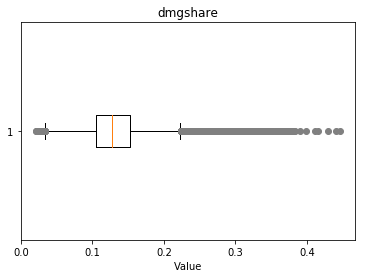

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.31, 0.28, 0.34, 0.3, 0.29, 0.32, 0.33, 0.37, 0.35, 0.45, 0.36, 0.44, 0.38, 0.42, 0.4, 0.43, 0.41, 0.39}


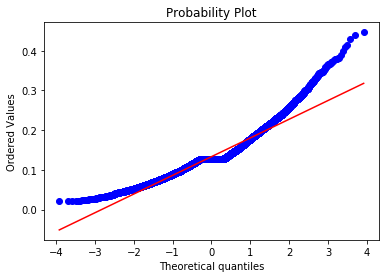

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1188
Kurtosis: 2.513


   ADC 
Overview of variable:  dmgshare 


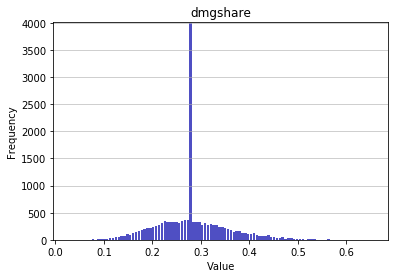

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0269524697110904
Mean: 0.2807
Standard deviation: 0.0711
Median: 0.2761
Maximal value: 0.6553691168525757


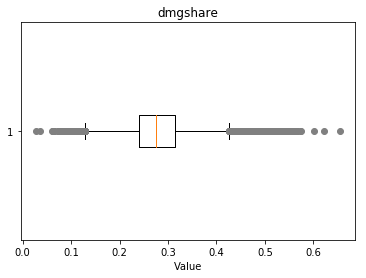

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.51, 0.5, 0.53, 0.06, 0.52, 0.55, 0.66, 0.57, 0.6, 0.56, 0.54, 0.07, 0.03, 0.04, 0.49, 0.62}


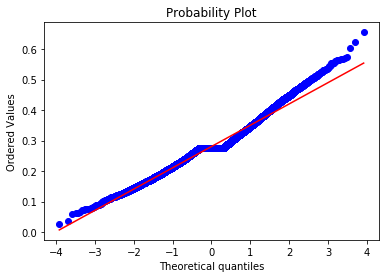

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4785
Kurtosis: 0.9518


   Support 
Overview of variable:  dmgshare 


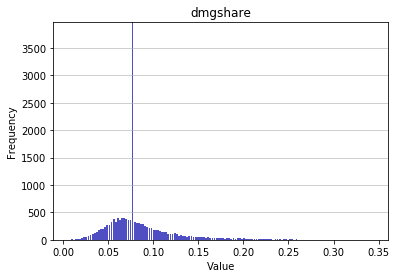

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.00604443657216238
Mean: 0.085
Standard deviation: 0.0378
Median: 0.0775
Maximal value: 0.34394838531603644


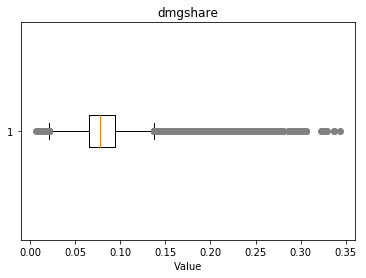

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.22, 0.25, 0.23, 0.24, 0.21, 0.27, 0.26, 0.3, 0.28, 0.2, 0.29, 0.34, 0.32, 0.33, 0.31}


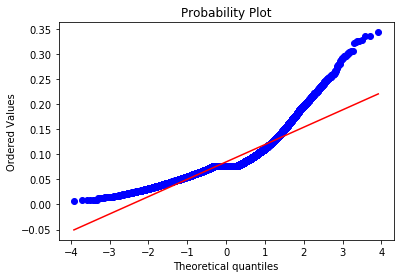

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.8747
Kurtosis: 5.2991


   Top 
Overview of variable:  earnedgoldshare 


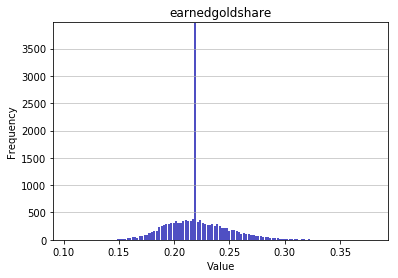

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.10437763098783713
Mean: 0.2207
Standard deviation: 0.0268
Median: 0.2187
Maximal value: 0.3800944493224803


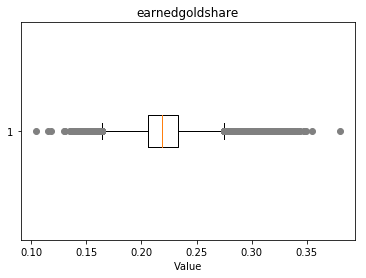

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.34, 0.32, 0.14, 0.3, 0.31, 0.35, 0.33, 0.12, 0.1, 0.13, 0.38}


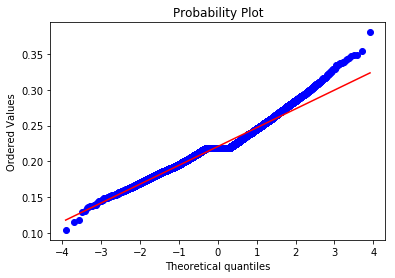

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5827
Kurtosis: 1.4279


   Middle 
Overview of variable:  earnedgoldshare 


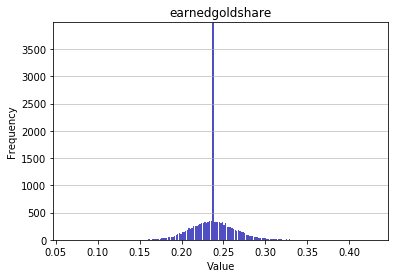

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.06521713793616979
Mean: 0.2373
Standard deviation: 0.0251
Median: 0.2367
Maximal value: 0.4286650648098203


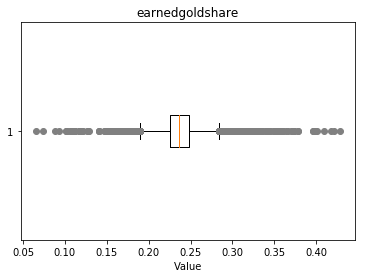

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.32, 0.33, 0.31, 0.34, 0.12, 0.37, 0.13, 0.4, 0.42, 0.07, 0.43, 0.35, 0.11, 0.36, 0.1, 0.16, 0.15, 0.09, 0.38, 0.14, 0.41}


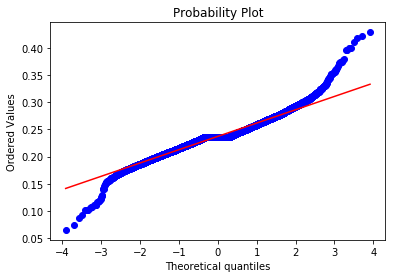

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3021
Kurtosis: 3.6831


   Jungle 
Overview of variable:  earnedgoldshare 


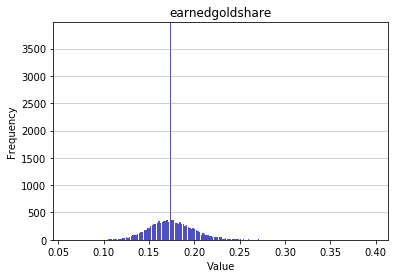

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.06132323420459012
Mean: 0.1748
Standard deviation: 0.0232
Median: 0.1738
Maximal value: 0.39721909263279387


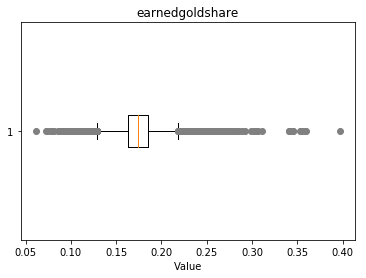

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.25, 0.26, 0.28, 0.24, 0.27, 0.1, 0.07, 0.4, 0.06, 0.36, 0.11, 0.09, 0.31, 0.3, 0.34, 0.35, 0.08, 0.29}


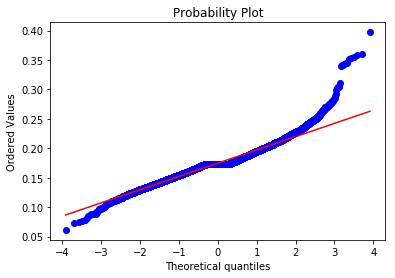

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7534
Kurtosis: 4.4829


   ADC 
Overview of variable:  earnedgoldshare 


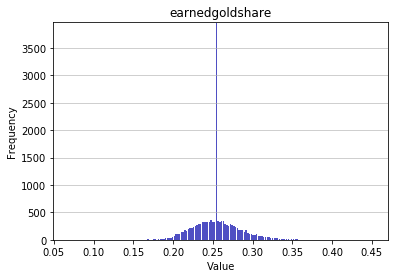

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.06854616072205479
Mean: 0.2547
Standard deviation: 0.0274
Median: 0.2536
Maximal value: 0.45172700590446996


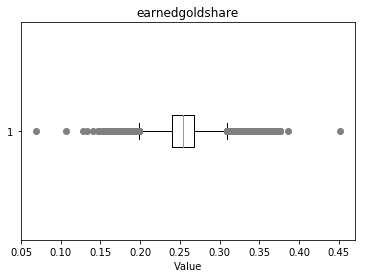

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.35, 0.13, 0.37, 0.34, 0.36, 0.38, 0.17, 0.15, 0.45, 0.11, 0.07, 0.16, 0.14, 0.39}


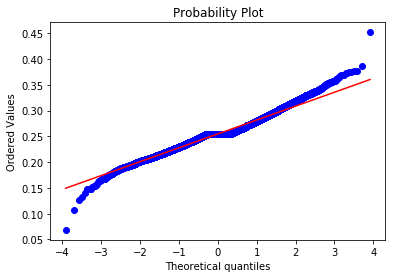

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.3377
Kurtosis: 1.5257


   Support 
Overview of variable:  earnedgoldshare 


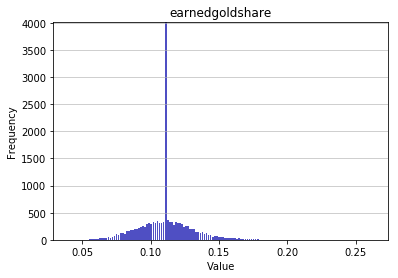

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.03996279958275207
Mean: 0.1109
Standard deviation: 0.0193
Median: 0.1105
Maximal value: 0.262805388706788


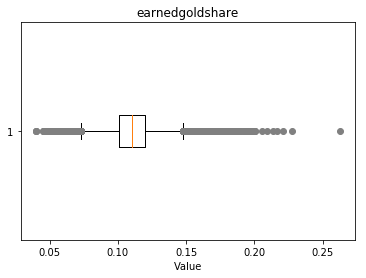

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.19, 0.23, 0.18, 0.21, 0.17, 0.2, 0.05, 0.22, 0.26, 0.04}


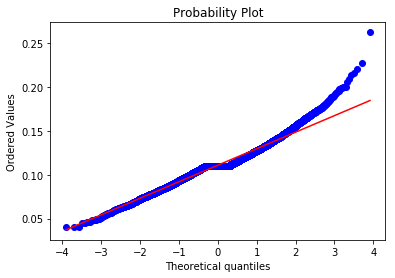

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4341
Kurtosis: 1.9053


   Top 
Overview of variable:  wards 


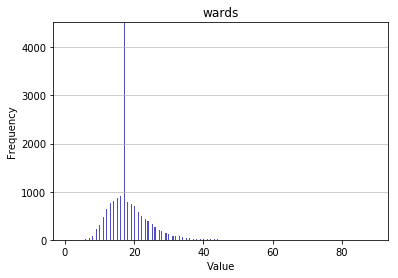

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.0
Mean: 18.0817
Standard deviation: 5.5426
Median: 17.0
Maximal value: 89.0


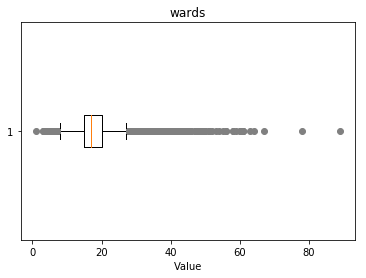

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 58.0, 59.0, 60.0, 61.0, 63.0, 64.0, 67.0, 78.0, 89.0}


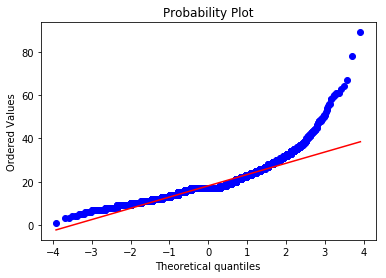

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7905
Kurtosis: 8.3698


   Middle 
Overview of variable:  wards 


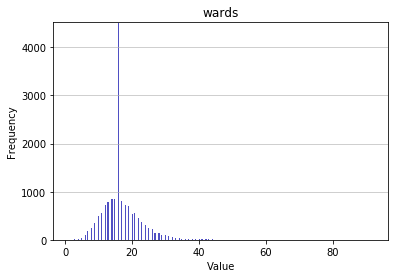

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.0
Mean: 16.861
Standard deviation: 5.5532
Median: 16.0
Maximal value: 92.0


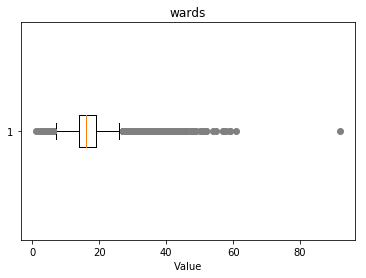

-------------------- 
Outlier detection:
 --------------------
List of outliers: {34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 54.0, 55.0, 57.0, 58.0, 59.0, 61.0, 92.0}


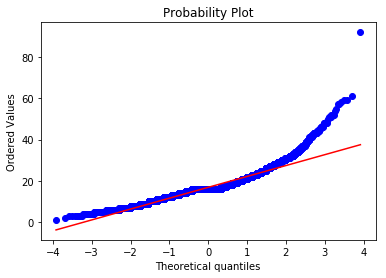

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.5033
Kurtosis: 6.7775


   Jungle 
Overview of variable:  wards 


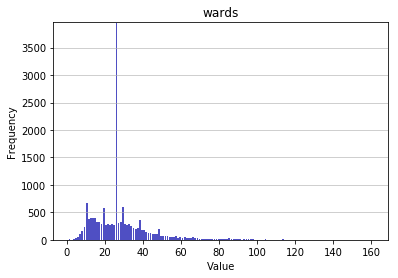

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.0
Mean: 28.4411
Standard deviation: 15.5822
Median: 26.0
Maximal value: 161.0


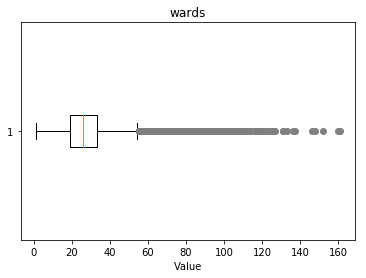

-------------------- 
Outlier detection:
 --------------------
List of outliers: {131.0, 133.0, 136.0, 137.0, 146.0, 148.0, 152.0, 160.0, 161.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 124.0, 125.0, 127.0}


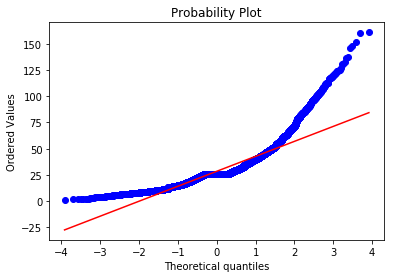

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.0506
Kurtosis: 7.2104


   ADC 
Overview of variable:  wards 


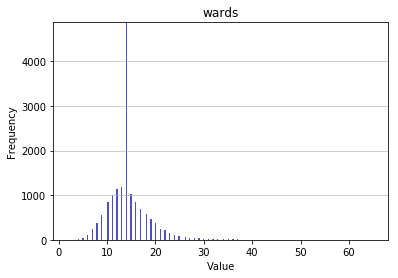

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2.0
Mean: 14.392
Standard deviation: 4.3101
Median: 14.0
Maximal value: 65.0


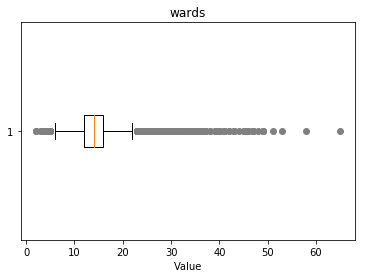

-------------------- 
Outlier detection:
 --------------------
List of outliers: {28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 51.0, 53.0, 58.0, 65.0}


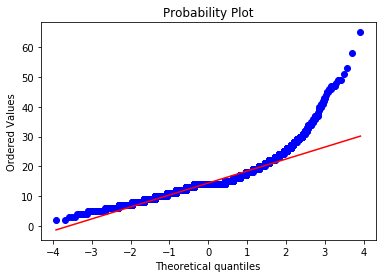

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.8689
Kurtosis: 9.2862


   Support 
Overview of variable:  wards 


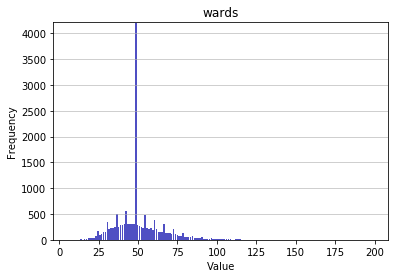

-------------------- 
Summary statistics:
 --------------------
Minimum value: 6.0
Mean: 50.6044
Standard deviation: 15.6626
Median: 49.0
Maximal value: 199.0


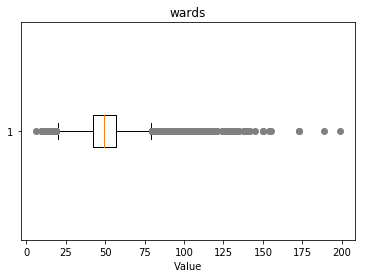

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.0, 129.0, 130.0, 131.0, 133.0, 134.0, 135.0, 138.0, 140.0, 142.0, 145.0, 150.0, 154.0, 155.0, 173.0, 189.0, 199.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 124.0, 125.0, 126.0, 127.0}


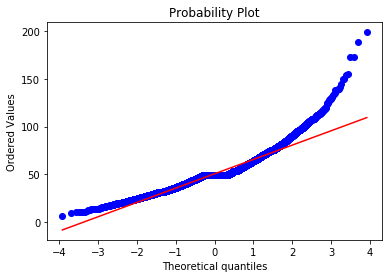

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.233
Kurtosis: 4.1081


   Top 
Overview of variable:  wpm 


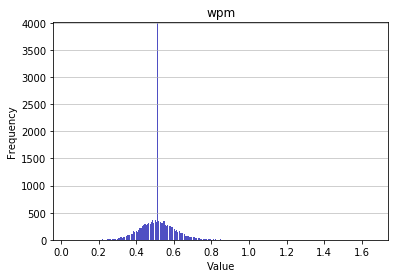

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.04045853000674309
Mean: 0.5169
Standard deviation: 0.0995
Median: 0.5116
Maximal value: 1.6598639455782314


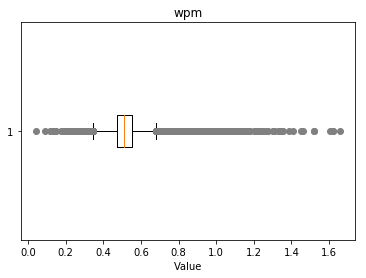

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.2, 0.83, 0.96, 0.82, 0.14, 0.87, 0.19, 0.13, 1.52, 0.86, 1.31, 1.25, 1.17, 1.08, 1.0, 0.84, 0.92, 0.18, 1.34, 1.18, 1.01, 0.93, 0.85, 1.09, 0.94, 1.02, 1.35, 1.27, 0.04, 0.95, 1.45, 1.61, 1.2, 1.11, 1.03, 1.28, 0.12, 0.22, 0.21, 0.17, 1.33, 0.15, 0.09, 1.21, 1.13, 1.12, 0.88, 1.46, 1.04, 1.62, 0.97, 1.22, 1.14, 1.39, 0.89, 1.05, 1.3, 0.98, 1.06, 1.15, 1.23, 0.9, 0.99, 1.07, 1.66, 1.16, 0.91, 1.41, 1.24}


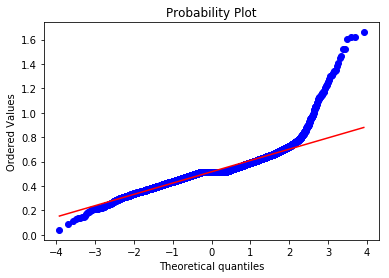

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9393
Kurtosis: 14.5567


   Middle 
Overview of variable:  wpm 


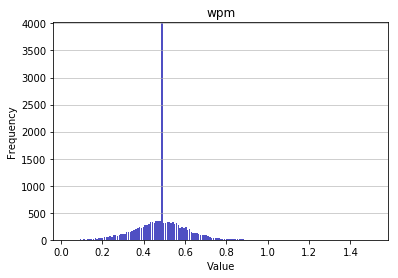

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.03735990037359901
Mean: 0.4863
Standard deviation: 0.123
Median: 0.4846
Maximal value: 1.510365251727542


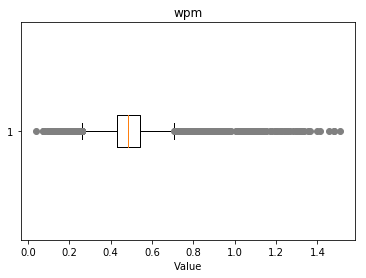

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.12, 0.89, 0.86, 0.91, 0.07, 0.87, 1.09, 1.06, 1.13, 0.92, 1.19, 1.25, 1.08, 1.17, 1.33, 1.0, 1.26, 1.34, 1.18, 0.93, 1.51, 1.01, 0.11, 1.27, 1.1, 1.02, 0.04, 0.95, 1.28, 1.11, 1.36, 1.03, 1.2, 0.1, 0.96, 0.09, 1.12, 1.04, 1.46, 0.88, 0.97, 1.3, 1.22, 1.14, 1.05, 0.08, 0.98, 1.23, 1.15, 1.48, 0.9, 1.4, 1.31, 1.24, 1.41, 1.32, 1.07}


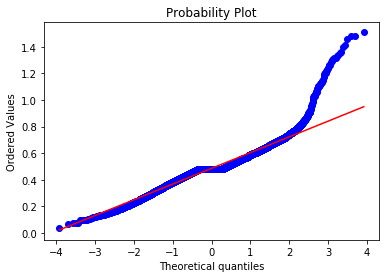

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8431
Kurtosis: 5.7157


   Jungle 
Overview of variable:  wpm 


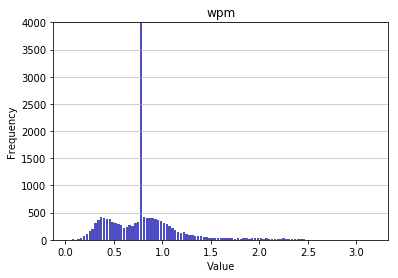

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.03088008234688626
Mean: 0.8129
Standard deviation: 0.3775
Median: 0.7882
Maximal value: 3.1735985533453888


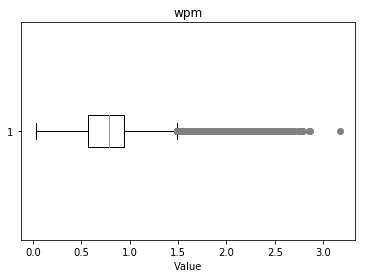

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.41, 1.95, 2.03, 2.46, 2.67, 2.19, 2.14, 2.52, 2.02, 2.08, 2.06, 2.35, 2.0, 2.17, 2.16, 2.09, 2.26, 2.25, 2.01, 2.24, 2.49, 2.42, 3.17, 2.4, 2.7, 2.65, 2.74, 2.1, 2.57, 2.44, 2.77, 2.28, 2.11, 2.18, 2.86, 2.36, 2.43, 2.85, 2.61, 2.29, 2.79, 2.39, 2.75, 2.64, 2.38, 1.96, 2.04, 2.12, 2.21, 2.13, 2.63, 2.2, 2.3, 2.54, 2.45, 2.37, 2.05, 2.76, 1.97, 2.33, 2.69, 2.55, 2.58, 1.98, 2.27, 2.07, 2.22, 2.23, 2.31, 2.47, 2.15, 2.56, 2.34, 2.32, 2.62, 2.48, 1.99, 2.59, 2.66}


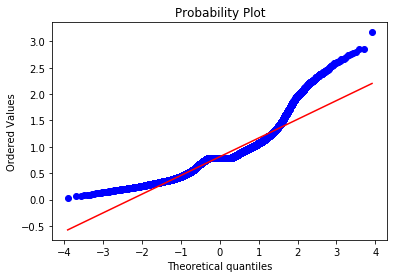

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.487
Kurtosis: 3.901


   ADC 
Overview of variable:  wpm 


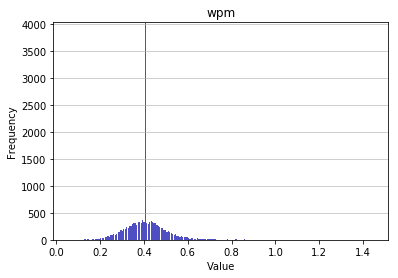

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.056338028169014086
Mean: 0.4124
Standard deviation: 0.1019
Median: 0.4052
Maximal value: 1.4457831325301205


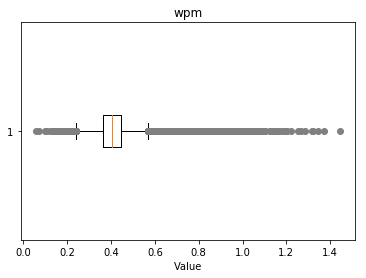

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.78, 0.07, 0.74, 1.13, 0.72, 0.73, 1.05, 0.87, 0.79, 0.85, 0.84, 0.92, 0.75, 1.0, 1.08, 1.17, 0.76, 1.09, 1.01, 1.34, 0.93, 1.18, 1.25, 0.11, 0.77, 0.94, 0.91, 1.1, 1.19, 1.02, 0.86, 1.27, 0.95, 1.03, 1.2, 1.28, 1.45, 0.1, 1.04, 1.37, 0.88, 0.8, 0.97, 1.22, 0.89, 0.06, 0.81, 0.98, 1.15, 1.06, 0.82, 0.9, 0.99, 1.16, 1.32, 1.07, 0.83}


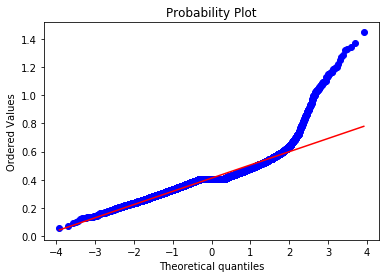

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1534
Kurtosis: 12.6086


   Support 
Overview of variable:  wpm 


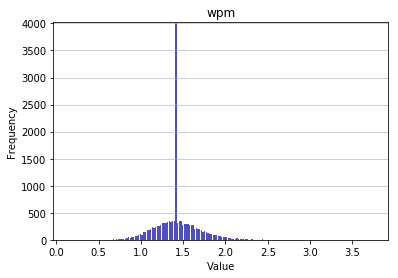

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.14434643143544507
Mean: 1.4247
Standard deviation: 0.2569
Median: 1.4118
Maximal value: 3.7459978655282815


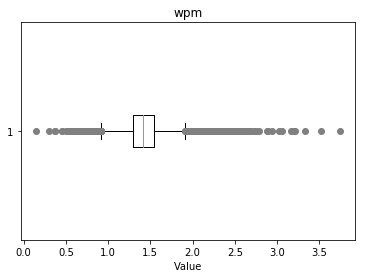

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.53, 0.59, 2.5, 3.16, 2.24, 2.21, 2.23, 2.27, 2.22, 2.35, 2.59, 2.63, 2.26, 2.25, 2.41, 2.33, 2.67, 2.58, 2.2, 2.49, 2.75, 3.51, 3.75, 0.6, 0.5, 0.61, 2.43, 2.52, 2.94, 2.78, 2.68, 3.03, 2.44, 2.69, 0.45, 2.89, 0.37, 0.62, 0.54, 0.46, 2.54, 2.88, 2.37, 2.29, 2.38, 2.46, 3.21, 0.55, 3.2, 2.55, 2.3, 0.3, 3.05, 0.64, 0.14, 0.56, 0.65, 2.57, 2.31, 2.4, 2.48, 2.47, 2.72, 2.56, 2.39, 2.66, 2.32, 3.32}


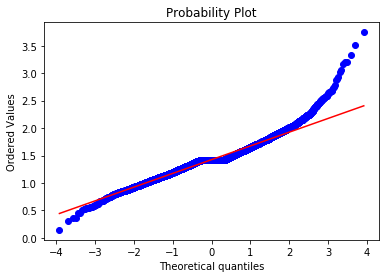

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6536
Kurtosis: 3.2548


   Top 
Overview of variable:  wardshare 


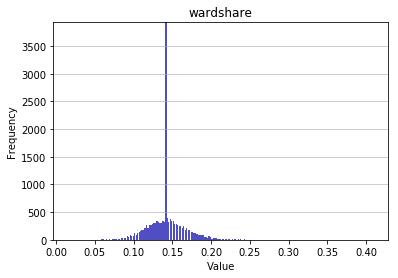

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.016129032258064516
Mean: 0.1428
Standard deviation: 0.0253
Median: 0.1418
Maximal value: 0.4090909090909091


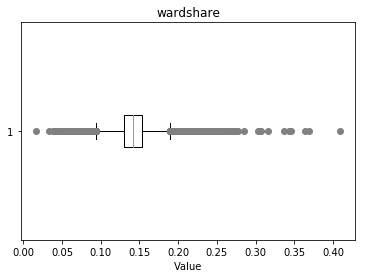

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.07, 0.06, 0.24, 0.25, 0.29, 0.27, 0.26, 0.36, 0.34, 0.3, 0.35, 0.05, 0.04, 0.28, 0.37, 0.23, 0.22, 0.03, 0.02, 0.31, 0.32, 0.41}


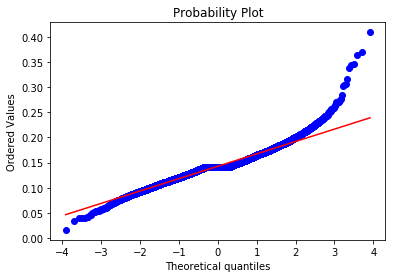

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6951
Kurtosis: 4.4882


   Middle 
Overview of variable:  wardshare 


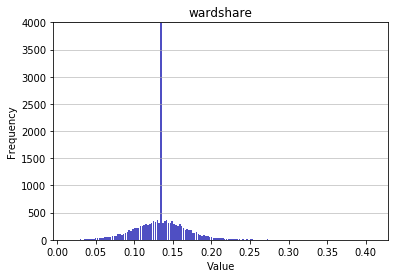

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.014925373134328358
Mean: 0.134
Standard deviation: 0.0319
Median: 0.134
Maximal value: 0.4097222222222222


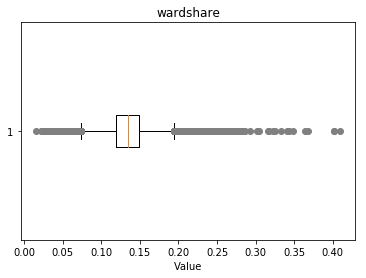

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.03, 0.26, 0.23, 0.25, 0.24, 0.29, 0.28, 0.3, 0.27, 0.4, 0.36, 0.01, 0.32, 0.34, 0.04, 0.37, 0.41, 0.02, 0.35, 0.33}


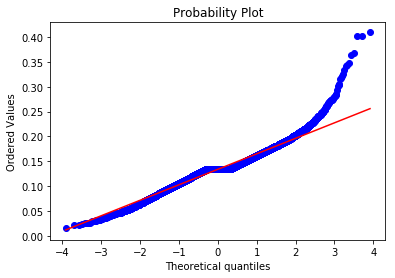

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4241
Kurtosis: 3.4363


   Jungle 
Overview of variable:  wardshare 


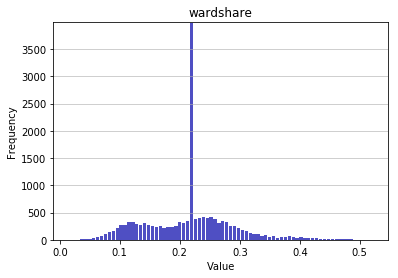

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.014285714285714285
Mean: 0.2162
Standard deviation: 0.0733
Median: 0.2184
Maximal value: 0.5226130653266332


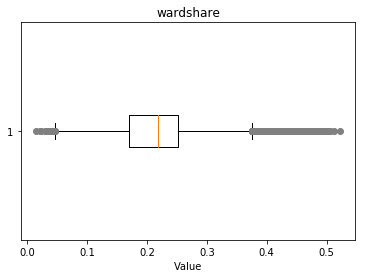

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.49, 0.47, 0.45, 0.46, 0.48, 0.44, 0.51, 0.5, 0.52}


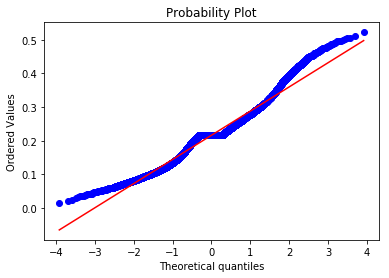

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4133
Kurtosis: 0.8166


   ADC 
Overview of variable:  wardshare 


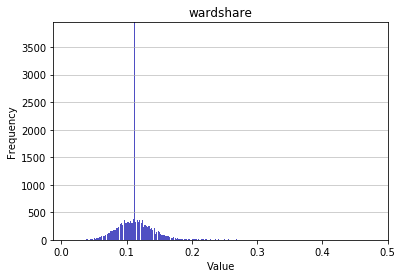

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.011049723756906077
Mean: 0.1142
Standard deviation: 0.0282
Median: 0.1124
Maximal value: 0.4777777777777778


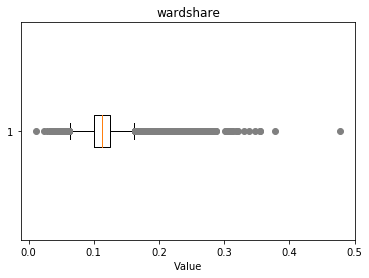

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.32, 0.2, 0.24, 0.29, 0.35, 0.27, 0.25, 0.38, 0.3, 0.34, 0.26, 0.36, 0.28, 0.21, 0.03, 0.23, 0.22, 0.02, 0.31, 0.48, 0.01, 0.33}


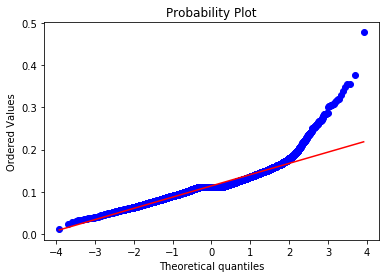

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.654
Kurtosis: 9.3094


   Support 
Overview of variable:  wardshare 


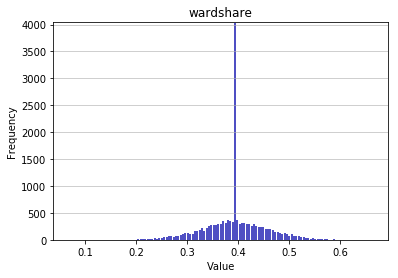

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.06666666666666667
Mean: 0.3925
Standard deviation: 0.0589
Median: 0.3923
Maximal value: 0.6647727272727273


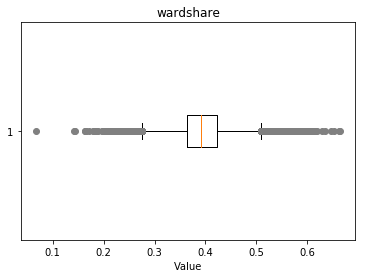

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.57, 0.59, 0.22, 0.21, 0.19, 0.58, 0.63, 0.14, 0.16, 0.2, 0.17, 0.61, 0.65, 0.6, 0.07, 0.62, 0.18, 0.66}


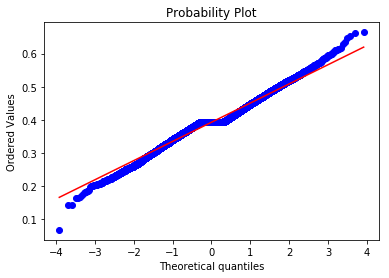

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0253
Kurtosis: 1.058


   Top 
Overview of variable:  wardkills 


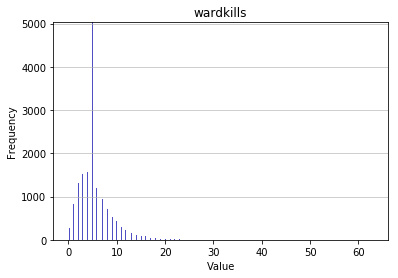

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 5.4389
Standard deviation: 3.4236
Median: 5.0
Maximal value: 63.0


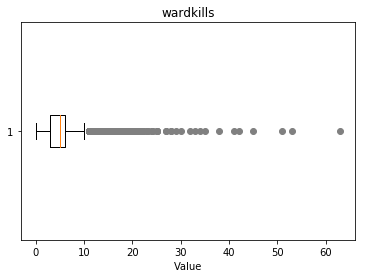

-------------------- 
Outlier detection:
 --------------------
List of outliers: {16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 27.0, 28.0, 29.0, 30.0, 32.0, 33.0, 34.0, 35.0, 38.0, 41.0, 42.0, 45.0, 51.0, 53.0, 63.0}


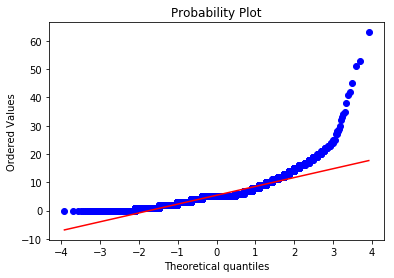

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.4476
Kurtosis: 17.1962


   Middle 
Overview of variable:  wardkills 


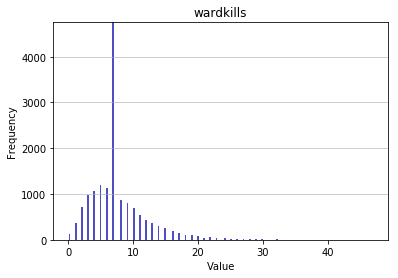

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 7.624
Standard deviation: 4.4509
Median: 7.0
Maximal value: 47.0


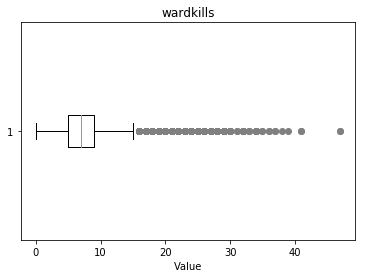

-------------------- 
Outlier detection:
 --------------------
List of outliers: {21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 41.0, 47.0}


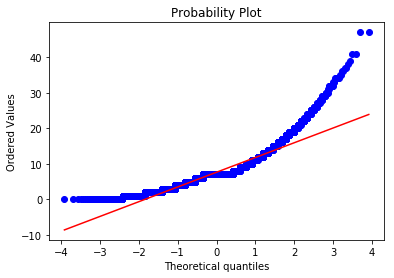

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7317
Kurtosis: 5.6404


   Jungle 
Overview of variable:  wardkills 


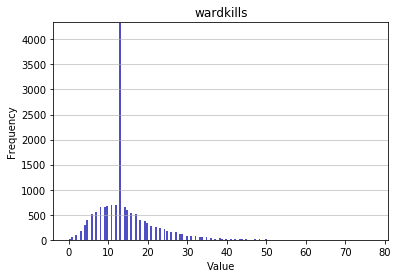

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 14.2001
Standard deviation: 7.1415
Median: 13.0
Maximal value: 77.0


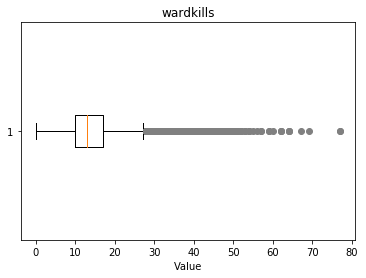

-------------------- 
Outlier detection:
 --------------------
List of outliers: {36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 59.0, 60.0, 62.0, 64.0, 67.0, 69.0, 77.0}


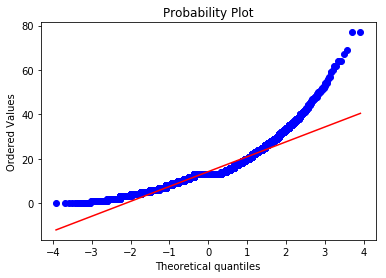

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6346
Kurtosis: 5.3273


   ADC 
Overview of variable:  wardkills 


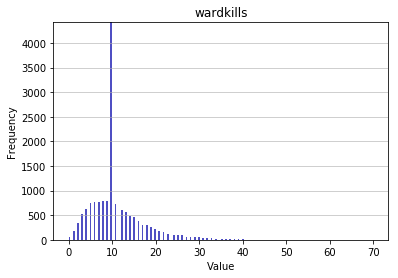

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 10.9751
Standard deviation: 6.2106
Median: 10.0
Maximal value: 70.0


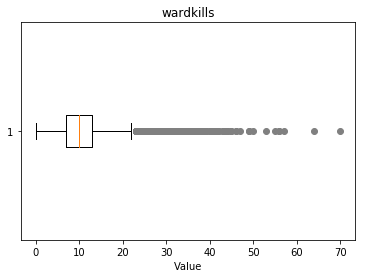

-------------------- 
Outlier detection:
 --------------------
List of outliers: {30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 49.0, 50.0, 53.0, 55.0, 56.0, 57.0, 64.0, 70.0}


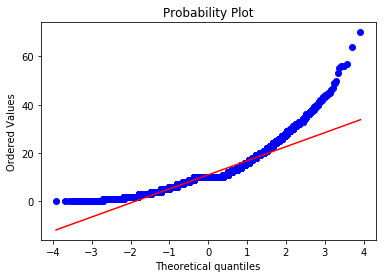

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6219
Kurtosis: 4.9351


   Support 
Overview of variable:  wardkills 


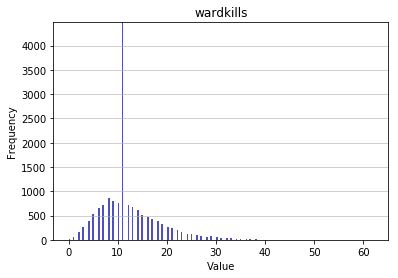

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 12.2096
Standard deviation: 5.9671
Median: 11.0
Maximal value: 62.0


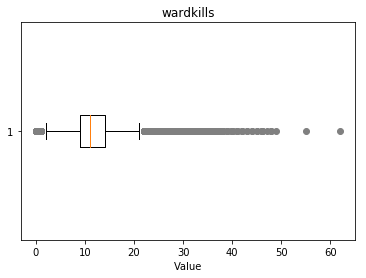

-------------------- 
Outlier detection:
 --------------------
List of outliers: {31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 55.0, 62.0}


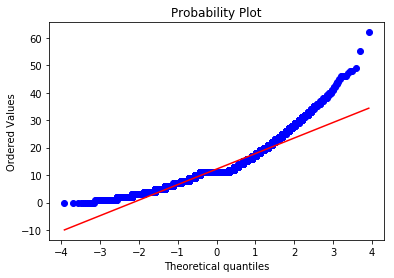

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3918
Kurtosis: 3.4498


   Top 
Overview of variable:  wcpm 


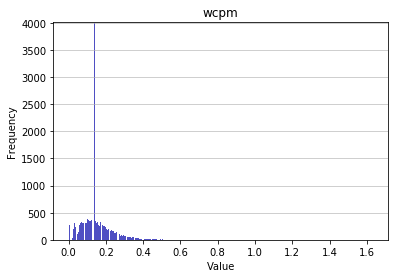

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1511
Standard deviation: 0.0846
Median: 0.1397
Maximal value: 1.633742658836092


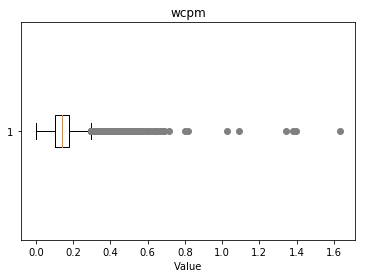

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.45, 0.48, 0.43, 0.42, 0.47, 1.34, 1.63, 1.38, 1.09, 1.4, 0.5, 0.67, 0.59, 0.51, 0.6, 0.68, 0.52, 0.69, 0.44, 1.02, 0.61, 0.53, 0.71, 0.54, 0.46, 0.63, 0.55, 0.8, 0.64, 0.56, 0.65, 0.57, 0.82, 0.49, 0.41}


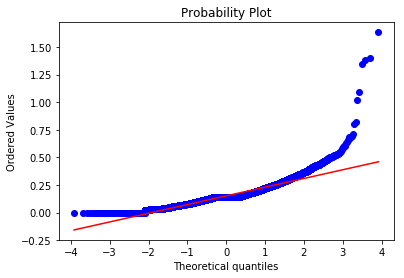

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.2709
Kurtosis: 19.0329


   Middle 
Overview of variable:  wcpm 


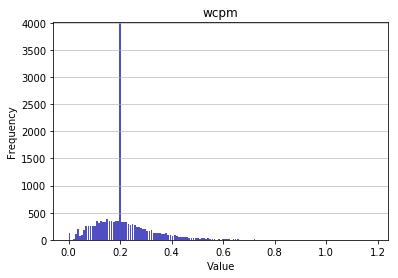

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.213
Standard deviation: 0.1089
Median: 0.1986
Maximal value: 1.1821239788563191


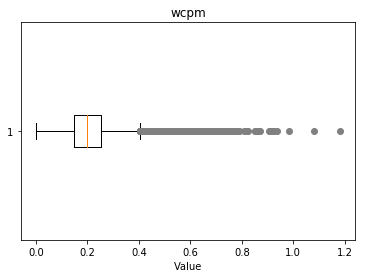

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.59, 0.54, 0.67, 0.62, 0.72, 0.68, 0.57, 0.55, 0.58, 0.83, 0.92, 0.75, 1.08, 0.76, 1.18, 0.6, 0.93, 0.85, 0.69, 0.77, 0.94, 0.66, 0.86, 0.61, 0.7, 0.78, 0.87, 0.71, 0.79, 0.63, 0.64, 0.56, 0.81, 0.98, 0.73, 0.65, 0.9, 0.74, 0.91}


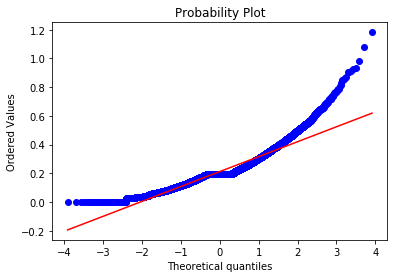

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.375
Kurtosis: 4.069


   Jungle 
Overview of variable:  wcpm 


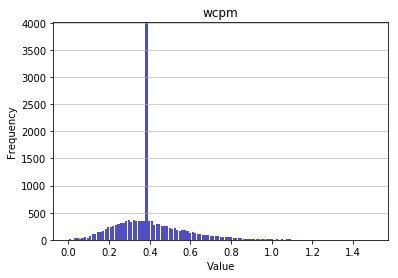

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3993
Standard deviation: 0.1661
Median: 0.3788
Maximal value: 1.4988814317673378


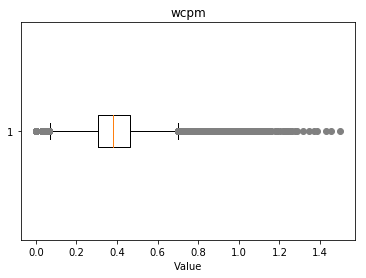

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.95, 0.91, 0.92, 0.93, 0.97, 1.07, 1.01, 1.39, 1.03, 1.06, 1.09, 1.0, 1.08, 1.25, 1.5, 1.26, 1.43, 1.18, 0.94, 1.19, 1.35, 1.1, 1.02, 1.28, 1.11, 1.45, 1.2, 0.96, 1.12, 1.04, 1.13, 1.29, 1.37, 1.05, 1.14, 1.22, 0.98, 1.23, 1.15, 1.31, 0.9, 0.99, 1.16, 1.24}


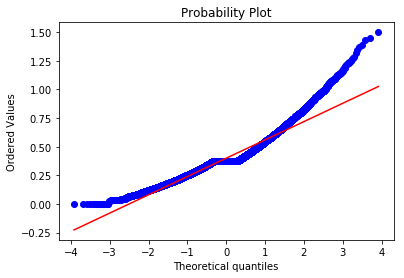

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1021
Kurtosis: 2.6471


   ADC 
Overview of variable:  wcpm 


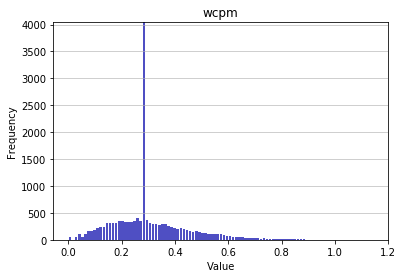

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3057
Standard deviation: 0.1454
Median: 0.2869
Maximal value: 1.1436950146627565


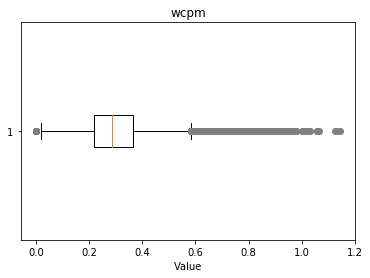

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.84, 0.75, 0.76, 0.87, 0.83, 0.95, 0.86, 0.82, 0.92, 0.8, 1.03, 1.0, 1.01, 0.85, 0.93, 0.94, 0.77, 1.02, 0.78, 0.96, 0.79, 1.13, 1.12, 0.88, 0.97, 1.14, 0.89, 0.98, 0.81, 1.06, 0.9, 0.74, 1.07, 0.91}


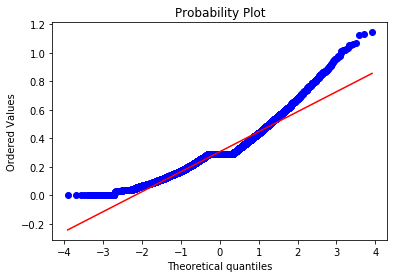

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0504
Kurtosis: 2.1168


   Support 
Overview of variable:  wcpm 


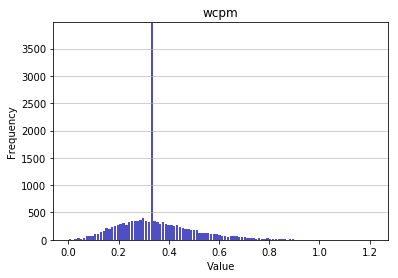

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3475
Standard deviation: 0.1407
Median: 0.3322
Maximal value: 1.2143514259429622


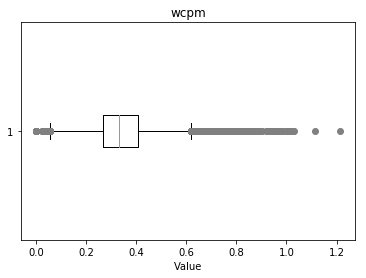

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.8, 0.95, 0.78, 0.82, 1.0, 0.98, 0.89, 0.97, 0.77, 0.79, 0.84, 0.92, 1.01, 0.85, 0.93, 0.94, 1.02, 0.86, 1.03, 1.11, 0.87, 0.96, 1.21, 0.88, 0.81, 0.9, 0.99, 0.83}


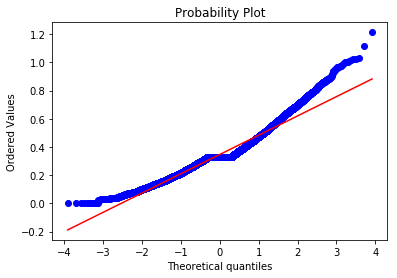

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8704
Kurtosis: 1.6952


   Top 
Overview of variable:  visionwards 


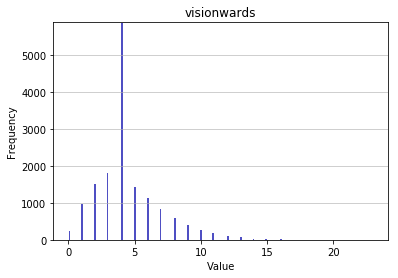

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.4595
Standard deviation: 2.4207
Median: 4.0
Maximal value: 23.0


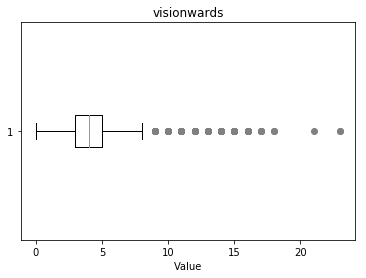

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 21.0, 23.0}


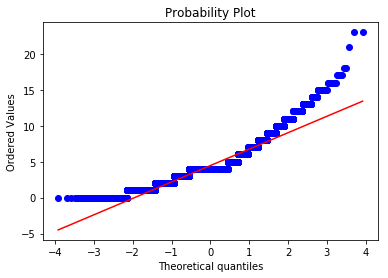

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2699
Kurtosis: 2.8557


   Middle 
Overview of variable:  visionwards 


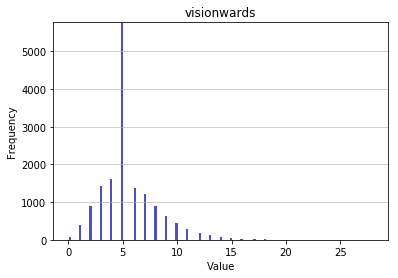

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 5.5409
Standard deviation: 2.6399
Median: 5.0
Maximal value: 28.0


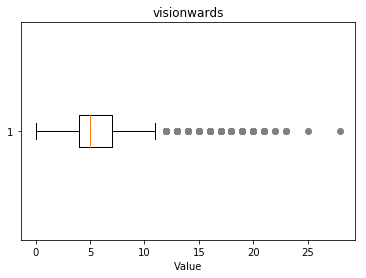

-------------------- 
Outlier detection:
 --------------------
List of outliers: {14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 25.0, 28.0}


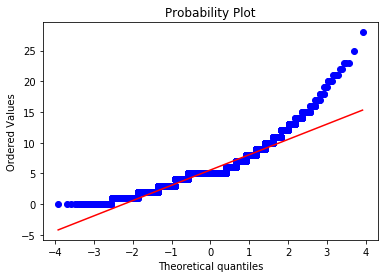

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3496
Kurtosis: 3.811


   Jungle 
Overview of variable:  visionwards 


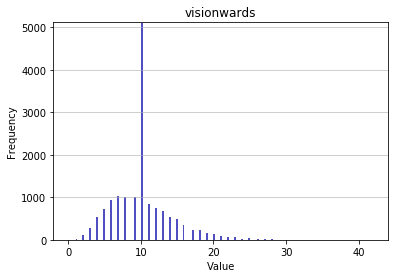

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 10.1153
Standard deviation: 3.996
Median: 10.0
Maximal value: 42.0


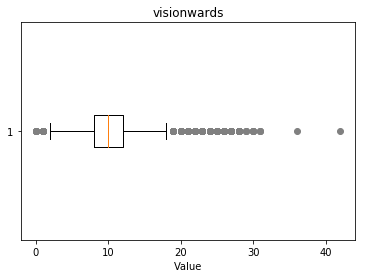

-------------------- 
Outlier detection:
 --------------------
List of outliers: {36.0, 42.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0}


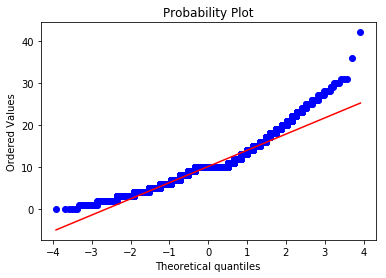

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9834
Kurtosis: 2.353


   ADC 
Overview of variable:  visionwards 


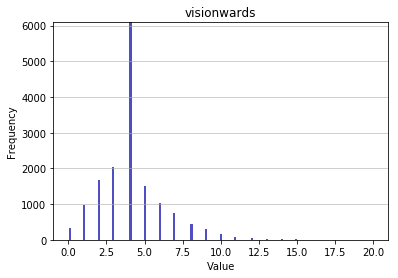

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.1199
Standard deviation: 2.0914
Median: 4.0
Maximal value: 20.0


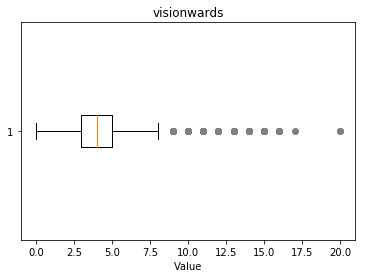

-------------------- 
Outlier detection:
 --------------------
List of outliers: {11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 20.0}


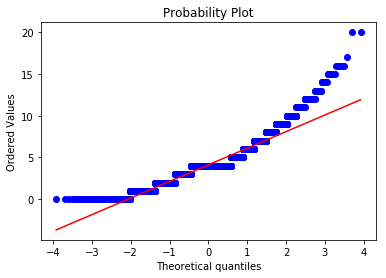

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0748
Kurtosis: 2.8626


   Support 
Overview of variable:  visionwards 


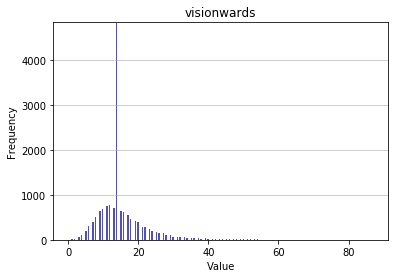

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 15.3889
Standard deviation: 7.1979
Median: 14.0
Maximal value: 87.0


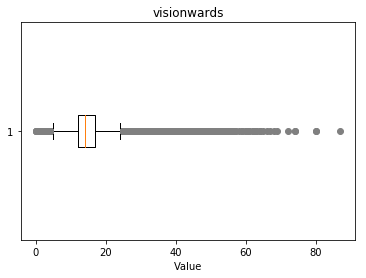

-------------------- 
Outlier detection:
 --------------------
List of outliers: {37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 72.0, 74.0, 80.0, 87.0}


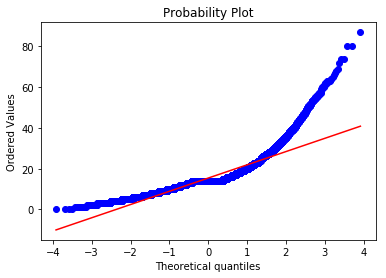

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.2707
Kurtosis: 9.3155


   Top 
Overview of variable:  visionwardbuys 


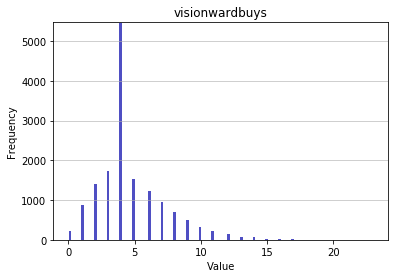

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.7117
Standard deviation: 2.6121
Median: 4.0
Maximal value: 23.0


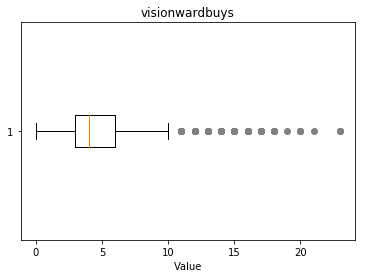

-------------------- 
Outlier detection:
 --------------------
List of outliers: {13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 23.0}


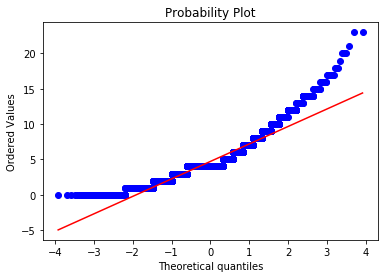

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2509
Kurtosis: 2.5138


   Middle 
Overview of variable:  visionwardbuys 


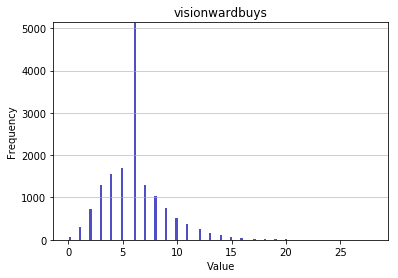

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 6.1115
Standard deviation: 2.7796
Median: 6.0
Maximal value: 28.0


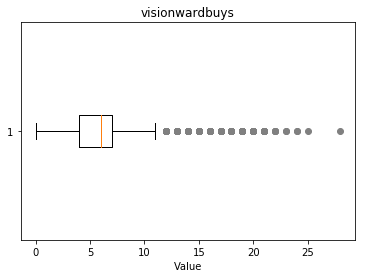

-------------------- 
Outlier detection:
 --------------------
List of outliers: {15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 28.0}


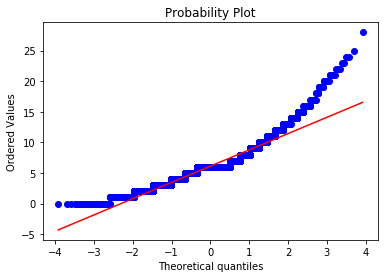

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1386
Kurtosis: 3.2058


   Jungle 
Overview of variable:  visionwardbuys 


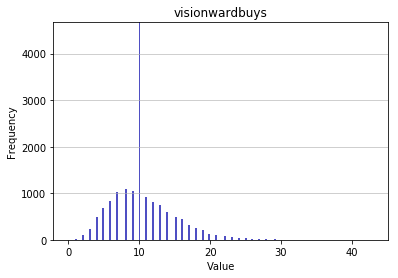

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 10.4031
Standard deviation: 4.1196
Median: 10.0
Maximal value: 43.0


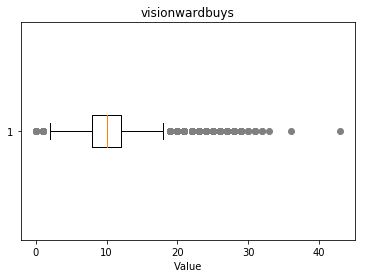

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 36.0, 43.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0}


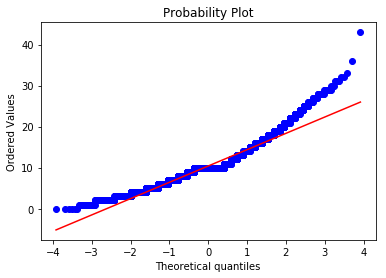

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9912
Kurtosis: 2.2234


   ADC 
Overview of variable:  visionwardbuys 


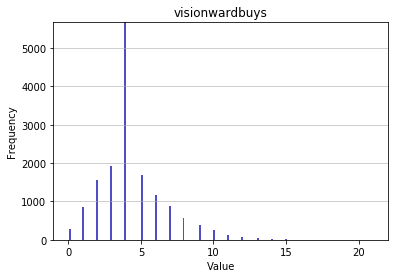

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 4.3736
Standard deviation: 2.2632
Median: 4.0
Maximal value: 21.0


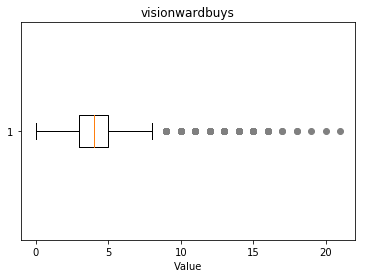

-------------------- 
Outlier detection:
 --------------------
List of outliers: {12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0}


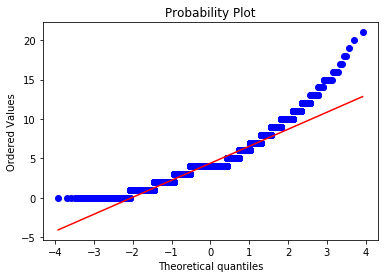

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0985
Kurtosis: 2.5097


   Support 
Overview of variable:  visionwardbuys 


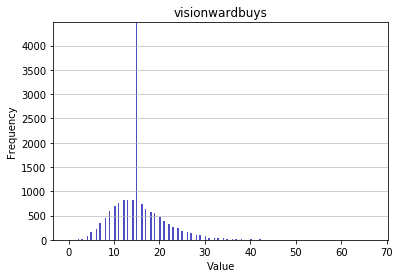

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 15.4082
Standard deviation: 5.5696
Median: 15.0
Maximal value: 67.0


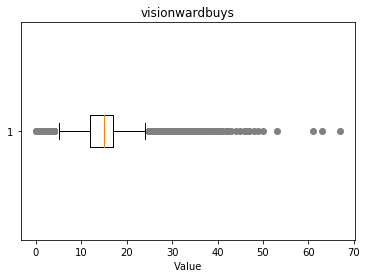

-------------------- 
Outlier detection:
 --------------------
List of outliers: {33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 53.0, 61.0, 63.0, 67.0}


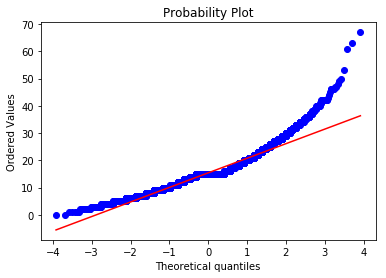

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1691
Kurtosis: 3.6595


   Top 
Overview of variable:  totalgold 


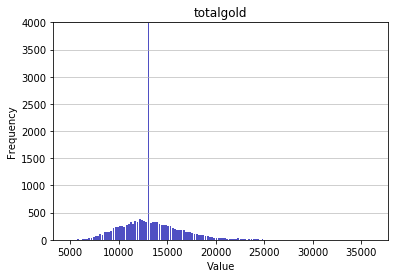

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4820.0
Mean: 13301.1574
Standard deviation: 2892.6157
Median: 13051.0
Maximal value: 36258.0


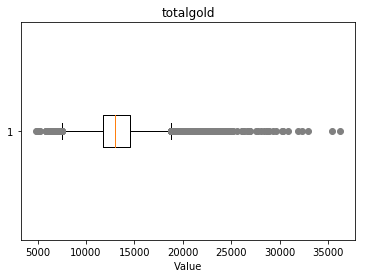

-------------------- 
Outlier detection:
 --------------------
List of outliers: {23040.0, 23554.0, 24069.0, 24074.0, 22032.0, 30224.0, 22036.0, 28694.0, 24087.0, 22040.0, 24600.0, 22042.0, 22044.0, 25121.0, 22050.0, 32290.0, 25635.0, 22566.0, 22057.0, 22570.0, 23596.0, 22063.0, 22064.0, 26164.0, 22070.0, 26680.0, 23609.0, 25145.0, 23611.0, 23103.0, 24639.0, 22083.0, 23110.0, 24134.0, 22095.0, 23121.0, 22099.0, 28757.0, 22102.0, 27737.0, 23131.0, 23132.0, 22621.0, 35424.0, 24162.0, 22627.0, 24164.0, 23653.0, 23654.0, 22119.0, 26215.0, 23145.0, 30317.0, 30841.0, 24697.0, 23682.0, 23685.0, 23173.0, 23189.0, 24216.0, 23193.0, 24737.0, 22181.0, 26795.0, 22188.0, 22703.0, 24754.0, 29367.0, 24255.0, 32961.0, 24257.0, 31939.0, 22213.0, 22218.0, 28878.0, 24276.0, 22236.0, 22754.0, 26852.0, 24293.0, 22247.0, 22252.0, 22254.0, 24303.0, 26355.0, 22260.0, 22261.0, 22266.0, 26874.0, 22267.0, 22269.0, 24833.0, 24837.0, 24838.0, 22278.0, 26887.0, 22283.0, 23821.0, 22287.0, 24336.0, 22801.0, 28431.0, 

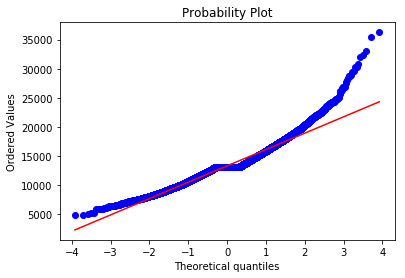

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8981
Kurtosis: 2.6703


   Middle 
Overview of variable:  totalgold 


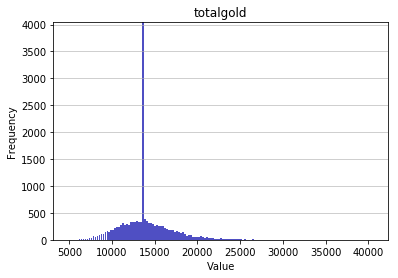

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4911.0
Mean: 13946.9748
Standard deviation: 3019.725
Median: 13705.5
Maximal value: 40574.0


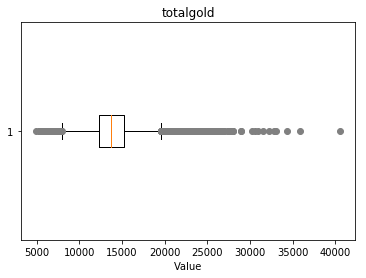

-------------------- 
Outlier detection:
 --------------------
List of outliers: {25088.0, 23554.0, 25604.0, 34314.0, 24586.0, 23053.0, 24594.0, 24595.0, 35860.0, 23575.0, 24603.0, 32805.0, 24102.0, 23592.0, 23087.0, 23090.0, 25139.0, 24117.0, 25151.0, 30276.0, 25159.0, 24650.0, 24140.0, 25167.0, 23128.0, 24666.0, 24163.0, 25187.0, 24677.0, 23142.0, 23667.0, 26747.0, 25726.0, 40574.0, 26238.0, 24705.0, 23172.0, 24197.0, 24204.0, 24716.0, 25233.0, 23190.0, 23702.0, 23193.0, 26266.0, 24729.0, 23710.0, 23202.0, 27303.0, 24746.0, 24748.0, 24241.0, 23729.0, 26290.0, 23734.0, 23224.0, 24761.0, 23738.0, 23237.0, 26821.0, 23751.0, 24777.0, 23757.0, 24785.0, 26323.0, 23251.0, 23261.0, 23773.0, 24289.0, 24291.0, 25835.0, 33005.0, 23790.0, 26863.0, 23280.0, 23283.0, 23798.0, 24314.0, 26878.0, 25342.0, 27912.0, 24840.0, 23313.0, 26387.0, 30998.0, 25372.0, 23325.0, 23837.0, 24351.0, 25888.0, 25378.0, 23337.0, 23851.0, 28972.0, 24366.0, 24371.0, 28979.0, 25910.0, 27959.0, 24378.0, 25403.0, 23871.0, 

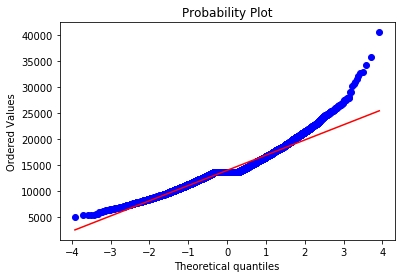

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8723
Kurtosis: 2.6503


   Jungle 
Overview of variable:  totalgold 


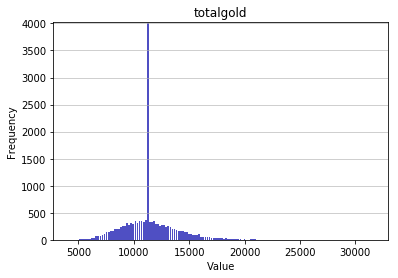

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4104.0
Mean: 11476.5378
Standard deviation: 2421.7521
Median: 11265.0
Maximal value: 31614.0


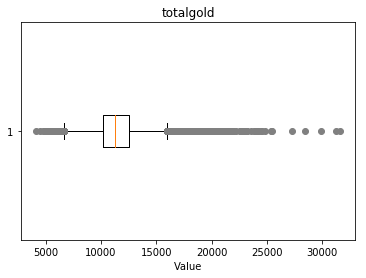

-------------------- 
Outlier detection:
 --------------------
List of outliers: {19459.0, 18948.0, 19463.0, 4104.0, 19465.0, 20490.0, 21515.0, 22030.0, 21519.0, 22545.0, 23570.0, 31258.0, 19997.0, 22562.0, 18985.0, 20523.0, 19503.0, 19504.0, 23088.0, 20018.0, 21044.0, 20024.0, 20025.0, 20541.0, 20031.0, 20039.0, 20040.0, 19529.0, 22611.0, 20052.0, 20565.0, 19029.0, 19542.0, 19035.0, 22621.0, 19038.0, 19042.0, 19043.0, 20474.0, 20579.0, 24165.0, 19049.0, 20074.0, 20588.0, 23150.0, 19568.0, 21109.0, 19574.0, 22645.0, 20601.0, 20090.0, 20603.0, 21113.0, 19069.0, 20089.0, 21632.0, 20097.0, 24193.0, 19084.0, 19600.0, 19091.0, 22167.0, 27294.0, 20129.0, 22694.0, 21161.0, 19625.0, 19118.0, 20665.0, 23228.0, 21199.0, 20688.0, 20178.0, 19164.0, 20701.0, 29918.0, 19167.0, 19685.0, 20710.0, 25321.0, 19180.0, 19184.0, 24817.0, 19701.0, 19703.0, 19705.0, 22782.0, 19204.0, 21769.0, 20754.0, 19731.0, 19225.0, 19226.0, 20761.0, 20256.0, 19232.0, 21798.0, 19241.0, 19242.0, 28459.0, 19245.0, 20783.0, 2

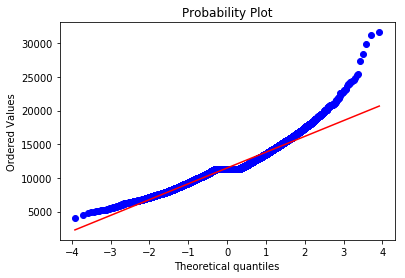

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9585
Kurtosis: 3.0156


   ADC 
Overview of variable:  totalgold 


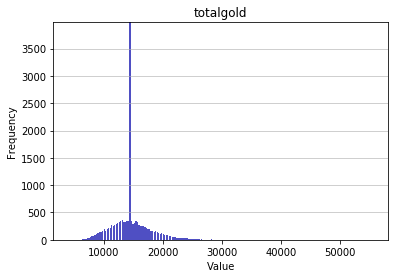

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4082.0
Mean: 14685.884
Standard deviation: 3363.7005
Median: 14411.5
Maximal value: 55539.0


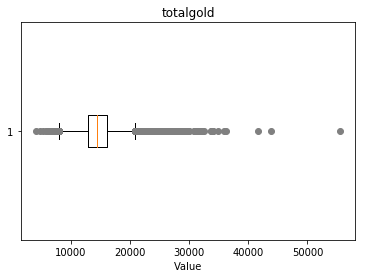

-------------------- 
Outlier detection:
 --------------------
List of outliers: {26122.0, 25100.0, 25101.0, 26125.0, 28696.0, 25629.0, 26147.0, 30760.0, 28205.0, 25139.0, 31796.0, 27701.0, 26174.0, 28222.0, 28224.0, 29257.0, 25162.0, 25676.0, 25678.0, 25679.0, 35923.0, 28247.0, 25176.0, 26202.0, 27226.0, 28253.0, 25191.0, 25193.0, 31338.0, 27755.0, 25712.0, 31348.0, 26747.0, 26237.0, 29821.0, 25220.0, 26245.0, 30864.0, 34963.0, 25240.0, 28316.0, 25250.0, 25259.0, 28339.0, 27342.0, 26320.0, 24784.0, 26836.0, 27862.0, 24792.0, 27352.0, 41690.0, 24798.0, 28898.0, 30951.0, 24808.0, 34025.0, 25324.0, 25839.0, 55539.0, 25844.0, 25846.0, 24823.0, 26358.0, 34041.0, 29436.0, 27390.0, 25346.0, 32520.0, 26379.0, 29963.0, 32015.0, 25361.0, 25874.0, 25875.0, 29971.0, 25877.0, 25363.0, 26394.0, 25375.0, 43808.0, 31521.0, 25376.0, 25891.0, 24873.0, 25387.0, 25900.0, 32045.0, 27441.0, 24883.0, 25396.0, 25409.0, 25411.0, 25413.0, 29510.0, 25415.0, 28488.0, 31563.0, 27472.0, 28496.0, 25428.0, 27988.0, 

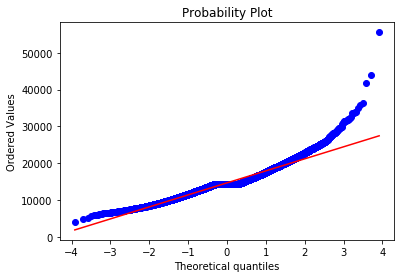

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9855
Kurtosis: 4.079


   Support 
Overview of variable:  totalgold 


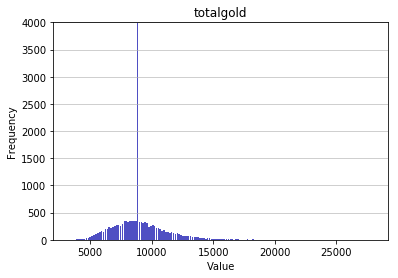

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3243.0
Mean: 9012.7854
Standard deviation: 2083.3863
Median: 8811.5
Maximal value: 27981.0


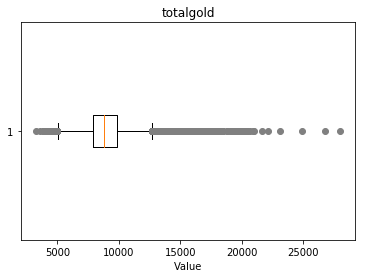

-------------------- 
Outlier detection:
 --------------------
List of outliers: {15872.0, 16897.0, 19458.0, 20993.0, 15877.0, 16905.0, 16396.0, 16909.0, 15383.0, 15895.0, 23065.0, 17947.0, 15390.0, 18462.0, 15393.0, 16935.0, 15912.0, 20521.0, 15914.0, 18477.0, 15405.0, 15408.0, 16439.0, 15932.0, 20029.0, 15939.0, 15430.0, 15431.0, 16968.0, 16969.0, 19020.0, 15449.0, 15450.0, 15963.0, 17502.0, 16479.0, 26727.0, 17006.0, 15470.0, 21617.0, 17010.0, 18036.0, 15481.0, 16508.0, 17021.0, 17022.0, 15998.0, 15494.0, 16518.0, 22152.0, 15497.0, 17038.0, 19599.0, 17043.0, 16021.0, 16533.0, 15511.0, 16539.0, 19612.0, 16541.0, 20127.0, 16546.0, 16039.0, 16040.0, 16555.0, 16556.0, 16045.0, 19124.0, 17592.0, 15547.0, 16062.0, 16577.0, 19652.0, 15560.0, 16074.0, 16077.0, 20688.0, 15570.0, 19158.0, 16090.0, 17628.0, 16604.0, 17121.0, 16612.0, 17126.0, 20200.0, 16106.0, 15598.0, 17143.0, 16635.0, 16637.0, 15613.0, 15614.0, 16128.0, 17158.0, 17670.0, 18185.0, 17674.0, 18193.0, 19730.0, 15635.0, 15636.0, 

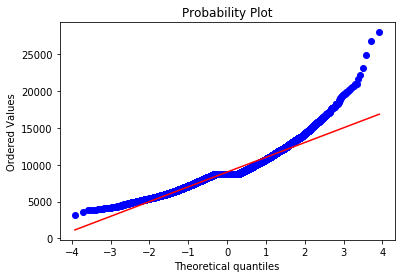

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1439
Kurtosis: 3.6927


   Top 
Overview of variable:  earnedgpm 


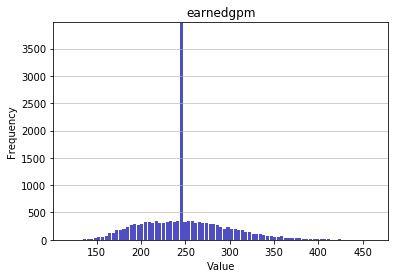

-------------------- 
Summary statistics:
 --------------------
Minimum value: 118.11464435146443
Mean: 249.6331
Standard deviation: 45.9106
Median: 246.8696
Maximal value: 461.9096410978184


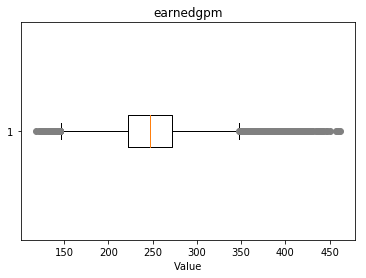

-------------------- 
Outlier detection:
 --------------------
List of outliers: {408.34, 411.31, 413.3, 413.31, 388.73, 388.77, 415.18, 388.25, 415.52, 416.31, 420.91, 425.03, 428.66, 391.48, 430.94, 434.43, 390.57, 390.05, 387.38, 388.15, 389.86, 387.54, 388.51, 389.54, 390.1, 391.11, 392.25, 393.37, 394.74, 390.41, 390.24, 397.72, 397.16, 399.71, 400.46, 400.89, 402.97, 402.72, 403.54, 405.11, 405.74, 406.62, 408.49, 406.42, 410.11, 409.86, 411.01, 413.52, 406.09, 411.0, 416.04, 388.86, 418.67, 388.7, 420.96, 421.89, 389.43, 423.1, 423.45, 425.33, 426.0, 427.76, 390.58, 420.47, 424.39, 390.39, 391.51, 391.15, 428.24, 435.44, 436.33, 437.46, 392.42, 439.89, 437.78, 441.54, 442.56, 393.11, 441.79, 392.72, 446.7, 394.23, 389.94, 446.13, 450.45, 395.59, 396.88, 457.67, 459.49, 396.96, 461.91, 397.25, 396.51, 396.04, 397.89, 396.99, 398.73, 399.96, 399.16, 399.56, 390.19, 399.6, 400.7, 400.42, 400.17, 399.82, 390.96, 401.63, 401.49, 402.58, 402.96, 403.91, 405.24, 405.39}


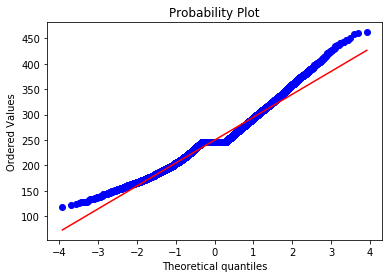

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5569
Kurtosis: 0.8751


   Middle 
Overview of variable:  earnedgpm 


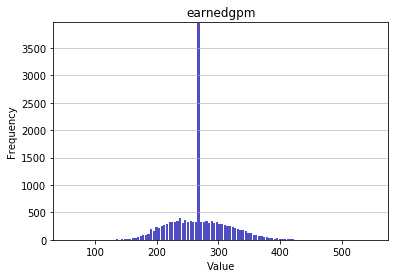

-------------------- 
Summary statistics:
 --------------------
Minimum value: 56.9050847457627
Mean: 267.9832
Standard deviation: 46.0782
Median: 266.0694
Maximal value: 551.0021131137353


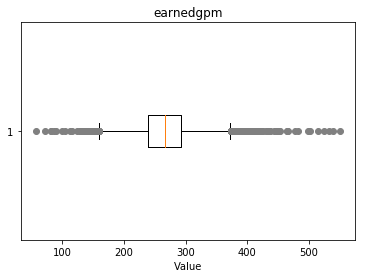

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.86, 128.02, 128.37, 515.38, 408.97, 408.86, 408.05, 409.99, 524.6, 538.76, 532.54, 406.21, 407.92, 408.56, 408.11, 409.33, 411.14, 411.94, 413.96, 414.06, 411.58, 416.2, 417.34, 418.95, 419.68, 420.88, 419.82, 422.78, 420.33, 424.55, 419.55, 417.86, 551.0, 415.58, 415.31, 430.02, 426.13, 432.96, 415.59, 434.66, 434.09, 435.22, 436.69, 437.67, 416.1, 56.91, 414.47, 434.02, 443.35, 417.22, 419.62, 446.37, 448.64, 420.72, 452.42, 454.11, 72.08, 415.24, 422.74, 464.26, 465.75, 81.65, 82.32, 465.2, 86.7, 90.25, 477.86, 481.89, 99.37, 104.82, 112.82, 499.12, 116.09, 502.73, 124.55, 412.59}


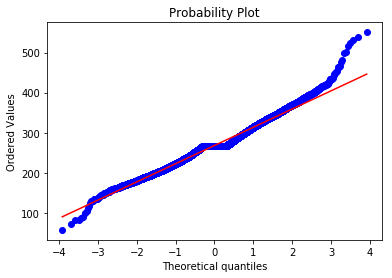

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.347
Kurtosis: 0.9


   Jungle 
Overview of variable:  earnedgpm 


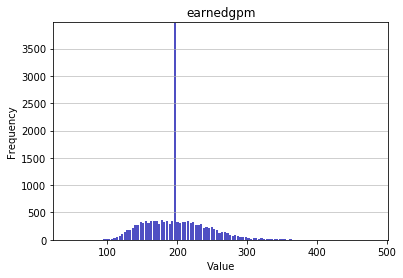

-------------------- 
Summary statistics:
 --------------------
Minimum value: 44.364815970056135
Mean: 198.4183
Standard deviation: 42.2219
Median: 195.7659
Maximal value: 480.5052631578948


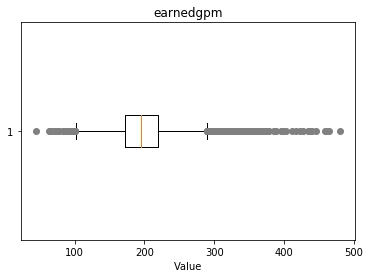

-------------------- 
Outlier detection:
 --------------------
List of outliers: {44.36, 62.99, 64.56, 64.34, 68.21, 71.7, 325.18, 325.62, 327.54, 327.3, 327.71, 327.89, 327.66, 328.86, 329.07, 329.46, 329.75, 329.51, 371.48, 330.3, 330.53, 331.41, 331.65, 332.9, 333.66, 333.47, 333.46, 334.64, 334.96, 335.09, 338.11, 338.75, 339.27, 340.87, 341.57, 341.15, 342.17, 343.07, 343.51, 345.14, 345.95, 348.84, 350.21, 354.79, 355.93, 359.83, 361.22, 362.95, 362.18, 369.63, 369.71, 325.27, 325.79, 325.88, 328.5, 328.65, 330.11, 331.49, 328.48, 333.39, 333.45, 335.85, 331.28, 331.21, 332.03, 332.99, 332.95, 336.1, 337.32, 343.4, 338.48, 345.56, 338.79, 347.58, 341.77, 340.3, 350.04, 345.2, 352.36, 353.92, 348.85, 348.37, 349.12, 351.22, 350.11, 353.97, 353.3, 355.31, 357.1, 358.84, 358.4, 358.21, 361.72, 362.09, 363.3, 361.43, 362.51, 366.89, 369.88, 370.43, 367.07, 372.55, 374.13, 368.42, 377.59, 378.31, 376.73, 374.26, 385.82, 386.26, 387.8, 389.02, 396.63, 396.0, 398.8, 402.45, 412.01, 417.

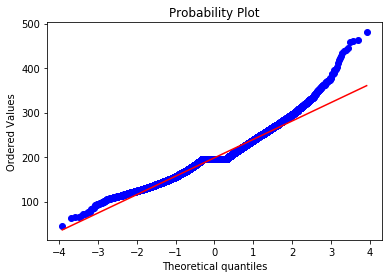

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6969
Kurtosis: 1.6936


   ADC 
Overview of variable:  earnedgpm 


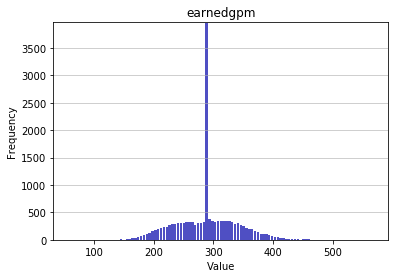

-------------------- 
Summary statistics:
 --------------------
Minimum value: 56.72929623567921
Mean: 289.0323
Standard deviation: 50.7928
Median: 289.6627
Maximal value: 568.2181061394381


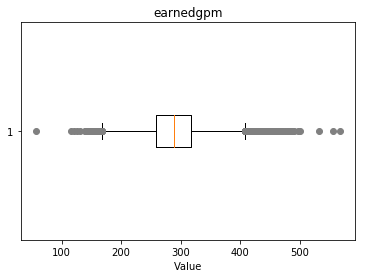

-------------------- 
Outlier detection:
 --------------------
List of outliers: {458.53, 131.45, 460.59, 461.27, 532.14, 462.59, 56.73, 444.4, 556.54, 568.22, 441.77, 442.72, 443.39, 444.17, 445.33, 442.17, 447.46, 442.82, 442.8, 442.34, 451.92, 452.94, 449.6, 451.74, 455.83, 456.41, 456.2, 458.25, 459.65, 460.44, 461.37, 460.05, 460.32, 457.96, 465.94, 462.61, 461.71, 468.84, 469.49, 463.32, 471.06, 472.88, 476.2, 479.68, 482.52, 482.21, 485.23, 486.33, 488.54, 453.42, 490.19, 454.5, 497.15, 455.54, 455.07, 115.25, 500.36, 121.17, 457.23, 126.43}


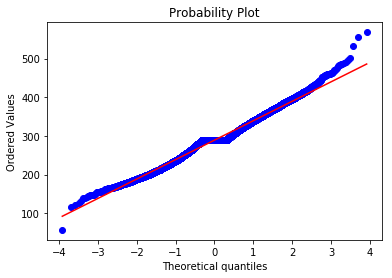

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1424
Kurtosis: 0.4439


   Support 
Overview of variable:  earnedgpm 


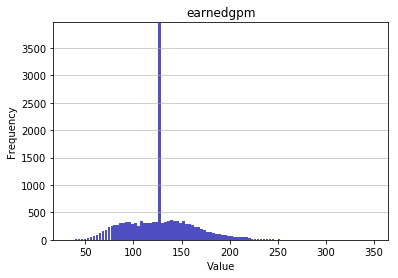

-------------------- 
Summary statistics:
 --------------------
Minimum value: 32.47981330221704
Mean: 127.4413
Standard deviation: 34.0556
Median: 126.5801
Maximal value: 349.17311320754715


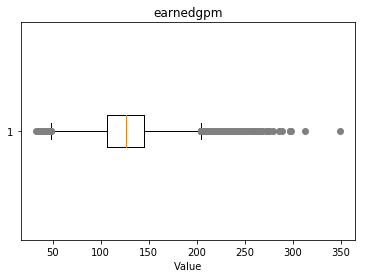

-------------------- 
Outlier detection:
 --------------------
List of outliers: {255.9, 250.98, 229.65, 229.94, 230.53, 230.18, 231.72, 232.04, 232.88, 232.69, 233.91, 233.25, 234.03, 236.06, 237.07, 238.79, 238.22, 241.71, 241.96, 242.17, 242.84, 242.14, 243.63, 244.54, 245.38, 245.06, 245.82, 246.61, 246.42, 246.39, 246.1, 229.69, 230.23, 230.42, 230.59, 230.39, 231.55, 232.17, 232.66, 234.71, 234.54, 235.65, 235.05, 235.88, 238.99, 238.33, 239.23, 239.18, 239.54, 240.81, 241.36, 249.12, 250.24, 250.55, 250.99, 251.57, 251.55, 255.7, 256.05, 249.61, 258.0, 259.83, 260.17, 261.53, 262.85, 263.05, 263.12, 265.11, 263.25, 267.87, 268.29, 271.59, 273.35, 274.71, 275.0, 275.54, 279.03, 285.75, 288.42, 296.71, 297.39, 298.49, 312.65, 349.17, 254.89}


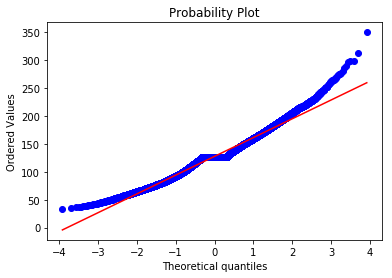

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.4426
Kurtosis: 0.8781


   Top 
Overview of variable:  goldspent 


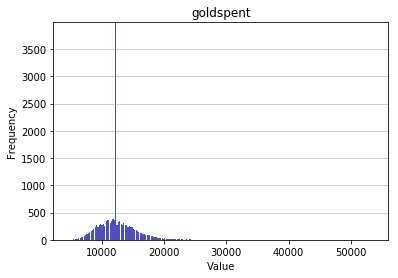

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4675.0
Mean: 12497.9337
Standard deviation: 2924.0777
Median: 12200.0
Maximal value: 53580.0


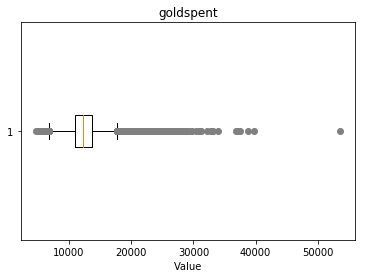

-------------------- 
Outlier detection:
 --------------------
List of outliers: {23040.0, 24578.0, 24075.0, 25100.0, 24078.0, 24083.0, 23575.0, 22558.0, 25630.0, 23075.0, 28708.0, 24100.0, 26150.0, 24105.0, 21550.0, 25660.0, 36925.0, 28225.0, 31300.0, 24138.0, 21583.0, 23633.0, 22610.0, 33875.0, 22100.0, 37458.0, 26200.0, 27225.0, 21595.0, 26208.0, 21600.0, 23650.0, 25185.0, 23658.0, 32875.0, 24683.0, 22125.0, 22130.0, 36983.0, 25208.0, 28795.0, 25215.0, 32898.0, 23683.0, 23685.0, 22150.0, 37000.0, 23183.0, 30865.0, 24213.0, 26775.0, 29850.0, 22170.0, 22175.0, 23200.0, 24225.0, 21670.0, 22183.0, 21675.0, 22708.0, 23733.0, 22200.0, 24250.0, 22715.0, 26300.0, 27325.0, 22725.0, 27338.0, 28875.0, 23758.0, 26833.0, 22225.0, 22738.0, 22233.0, 21725.0, 21730.0, 25318.0, 25833.0, 30448.0, 21750.0, 26358.0, 21758.0, 25858.0, 25860.0, 24325.0, 21775.0, 27408.0, 22800.0, 23828.0, 21783.0, 21275.0, 22300.0, 27933.0, 21795.0, 22310.0, 23850.0, 21808.0, 22833.0, 23858.0, 22835.0, 23358.0, 25925.0, 

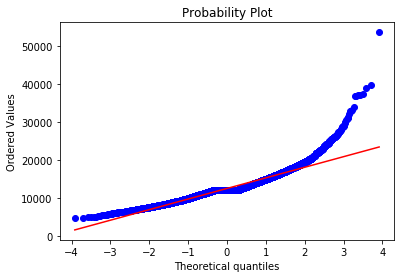

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.537
Kurtosis: 8.2692


   Middle 
Overview of variable:  goldspent 


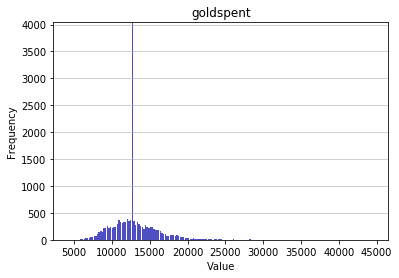

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4275.0
Mean: 12912.4362
Standard deviation: 2927.1059
Median: 12625.0
Maximal value: 44535.0


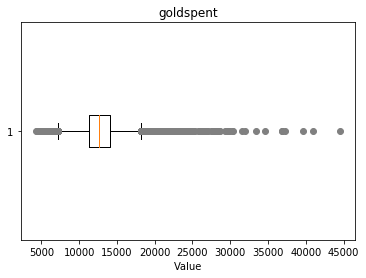

-------------------- 
Outlier detection:
 --------------------
List of outliers: {26625.0, 27655.0, 22025.0, 23050.0, 26125.0, 22550.0, 22043.0, 22050.0, 26150.0, 28200.0, 23080.0, 22064.0, 28210.0, 23608.0, 22075.0, 28220.0, 24125.0, 23105.0, 23110.0, 23625.0, 24137.0, 33355.0, 22100.0, 23125.0, 24158.0, 28258.0, 28260.0, 22633.0, 26218.0, 29803.0, 29290.0, 26733.0, 23150.0, 22650.0, 24700.0, 25725.0, 26750.0, 24703.0, 23678.0, 29825.0, 22658.0, 22150.0, 23175.0, 25225.0, 26250.0, 22155.0, 31885.0, 22157.0, 23185.0, 24210.0, 24725.0, 22175.0, 23200.0, 27808.0, 25250.0, 23715.0, 25258.0, 23725.0, 21700.0, 21708.0, 30415.0, 22225.0, 23250.0, 21725.0, 23775.0, 24800.0, 22245.0, 39655.0, 22250.0, 22260.0, 21750.0, 22775.0, 26358.0, 23808.0, 22275.0, 24325.0, 34575.0, 22808.0, 21785.0, 22300.0, 24350.0, 24870.0, 23850.0, 22830.0, 22325.0, 24375.0, 24380.0, 37180.0, 21825.0, 27975.0, 22345.0, 25930.0, 21835.0, 22860.0, 26958.0, 23375.0, 23895.0, 21850.0, 22875.0, 23900.0, 27485.0, 24420.0, 

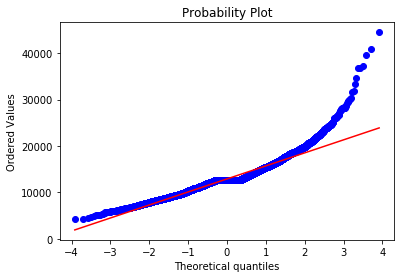

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.27
Kurtosis: 5.4918


   Jungle 
Overview of variable:  goldspent 


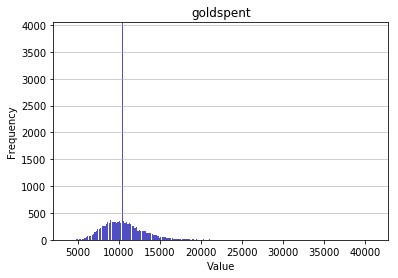

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3900.0
Mean: 10587.1236
Standard deviation: 2359.3896
Median: 10350.0
Maximal value: 40975.0


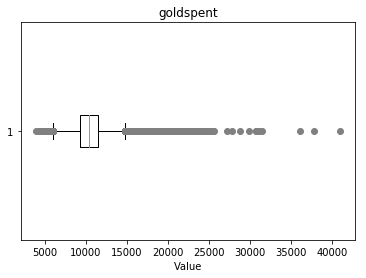

-------------------- 
Outlier detection:
 --------------------
List of outliers: {17920.0, 18435.0, 21000.0, 18958.0, 40975.0, 18450.0, 17950.0, 22560.0, 21025.0, 27175.0, 18475.0, 23600.0, 30770.0, 19510.0, 17975.0, 20025.0, 25662.0, 24130.0, 28742.0, 18000.0, 19025.0, 18005.0, 24150.0, 19550.0, 20575.0, 23650.0, 21095.0, 18025.0, 19050.0, 20075.0, 21100.0, 25200.0, 18545.0, 21105.0, 18550.0, 19075.0, 22660.0, 21125.0, 20100.0, 23175.0, 18575.0, 21650.0, 24725.0, 27800.0, 18075.0, 22012.0, 20125.0, 19100.0, 25255.0, 18600.0, 20650.0, 18100.0, 20660.0, 22200.0, 29880.0, 19128.0, 18108.0, 18625.0, 19650.0, 21700.0, 18125.0, 21210.0, 20700.0, 23270.0, 18150.0, 22250.0, 36080.0, 19185.0, 18675.0, 19700.0, 22775.0, 22783.0, 18175.0, 20225.0, 25347.0, 18695.0, 31495.0, 19208.0, 17675.0, 17685.0, 18200.0, 19225.0, 17700.0, 22825.0, 18220.0, 18225.0, 21300.0, 22325.0, 19255.0, 18240.0, 22850.0, 18250.0, 19275.0, 20300.0, 17750.0, 17755.0, 17760.0, 23905.0, 18275.0, 21865.0, 17770.0, 18800.0, 

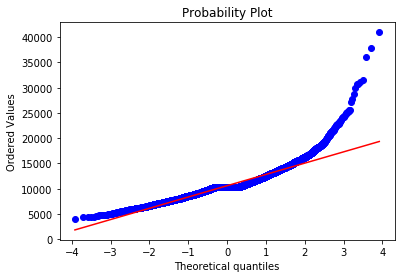

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6557
Kurtosis: 9.0226


   ADC 
Overview of variable:  goldspent 


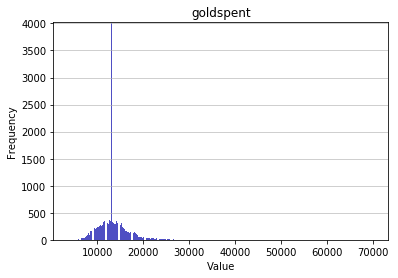

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3750.0
Mean: 13452.5378
Standard deviation: 3264.416
Median: 13150.0
Maximal value: 70001.0


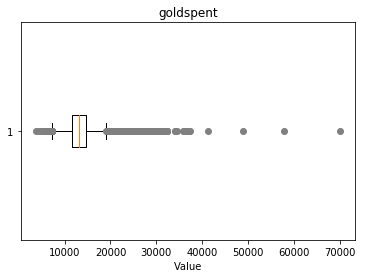

-------------------- 
Outlier detection:
 --------------------
List of outliers: {25600.0, 29186.0, 26120.0, 26633.0, 24595.0, 26643.0, 27158.0, 23575.0, 24600.0, 25625.0, 32283.0, 27165.0, 30750.0, 31775.0, 26655.0, 26150.0, 24615.0, 24625.0, 24628.0, 28215.0, 35900.0, 24125.0, 31810.0, 24658.0, 23635.0, 24150.0, 31320.0, 23650.0, 28260.0, 28270.0, 24175.0, 25200.0, 24690.0, 27258.0, 23675.0, 24700.0, 25725.0, 29825.0, 25735.0, 29321.0, 25225.0, 27275.0, 24720.0, 25745.0, 37008.0, 24725.0, 31400.0, 25770.0, 24750.0, 24250.0, 25275.0, 23740.0, 27325.0, 25790.0, 23750.0, 27850.0, 26830.0, 34000.0, 24058.0, 25300.0, 28375.0, 24280.0, 34520.0, 24795.0, 25308.0, 26845.0, 27870.0, 23260.0, 24800.0, 27875.0, 34020.0, 23270.0, 23275.0, 25325.0, 31473.0, 23283.0, 23800.0, 25848.0, 25850.0, 29445.0, 28935.0, 23825.0, 25875.0, 25365.0, 23833.0, 23325.0, 24350.0, 25375.0, 26400.0, 23330.0, 23845.0, 36134.0, 26408.0, 48941.0, 25390.0, 23350.0, 27450.0, 23870.0, 23365.0, 26950.0, 27975.0, 23880.0, 

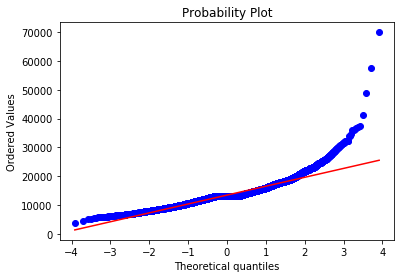

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7915
Kurtosis: 12.9949


   Support 
Overview of variable:  goldspent 


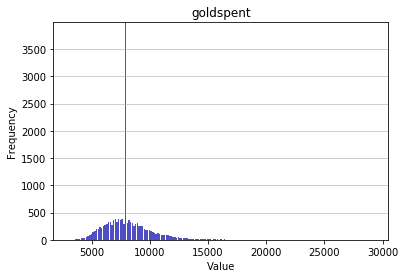

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3025.0
Mean: 8106.8128
Standard deviation: 1943.9016
Median: 7875.0
Maximal value: 29185.0


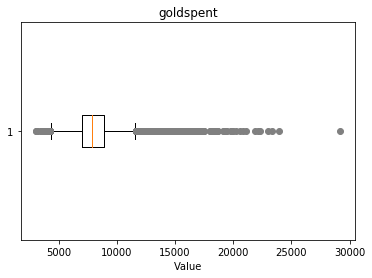

-------------------- 
Outlier detection:
 --------------------
List of outliers: {29185.0, 14850.0, 15875.0, 19975.0, 14350.0, 16400.0, 19475.0, 14875.0, 15900.0, 16925.0, 14375.0, 16425.0, 17450.0, 18475.0, 16955.0, 16445.0, 14400.0, 17985.0, 16450.0, 15425.0, 22090.0, 15435.0, 14925.0, 15950.0, 14425.0, 16475.0, 14950.0, 15975.0, 18025.0, 21100.0, 14450.0, 15475.0, 17525.0, 20600.0, 13950.0, 14975.0, 17025.0, 14470.0, 15495.0, 14475.0, 15500.0, 16525.0, 13975.0, 17050.0, 13985.0, 14500.0, 15525.0, 18600.0, 14000.0, 16050.0, 19125.0, 14525.0, 15550.0, 18625.0, 14025.0, 15050.0, 16075.0, 17100.0, 14550.0, 15575.0, 14050.0, 15075.0, 16100.0, 17125.0, 19175.0, 20200.0, 14575.0, 15600.0, 16625.0, 14075.0, 15100.0, 14595.0, 15110.0, 14600.0, 15630.0, 16655.0, 14100.0, 16150.0, 17175.0, 18200.0, 23325.0, 14625.0, 15650.0, 18725.0, 14125.0, 15150.0, 16175.0, 22325.0, 14650.0, 15675.0, 21825.0, 14150.0, 16200.0, 14155.0, 19275.0, 14670.0, 19280.0, 14675.0, 15700.0, 19800.0, 18265.0, 14170.0, 

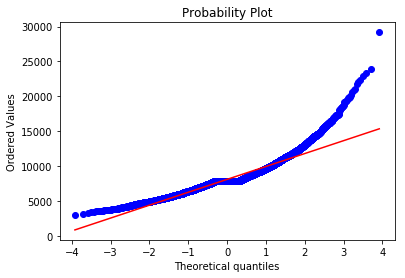

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.4495
Kurtosis: 5.4429


   Top 
Overview of variable:  gspd 


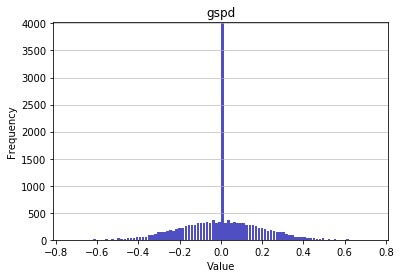

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7386158866215361
Mean: 0.0
Standard deviation: 0.1757
Median: 0.0
Maximal value: 0.7386158866215361


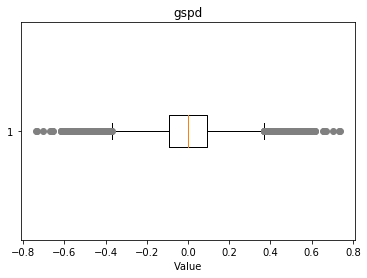

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.61, -0.61, 0.53, 0.56, -0.53, -0.56, 0.57, -0.57, 0.6, -0.6, -0.58, -0.66, 0.58, 0.59, -0.67, 0.67, -0.74, -0.65, -0.73, -0.59, 0.7, -0.55, 0.62, -0.54, 0.54, -0.62, -0.7, 0.55, 0.73, 0.65, 0.74, 0.66}


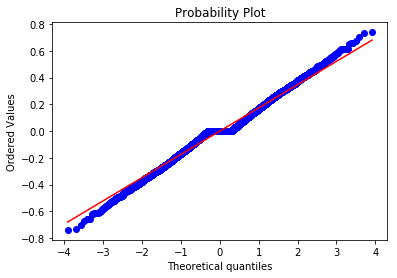

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.7471


   Middle 
Overview of variable:  gspd 


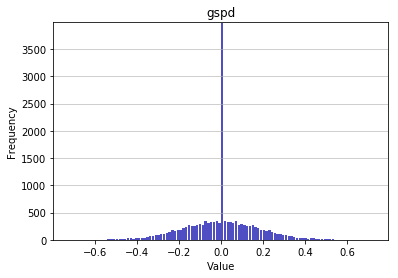

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7249544626593807
Mean: 0.0
Standard deviation: 0.1625
Median: 0.0
Maximal value: 0.7249544626593807


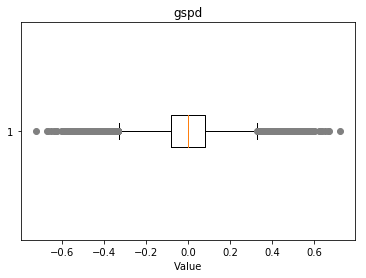

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.63, -0.63, 0.51, 0.54, -0.54, -0.51, -0.5, 0.5, 0.56, -0.56, 0.59, -0.58, -0.67, 0.67, -0.49, 0.6, -0.65, -0.57, 0.52, -0.59, -0.64, -0.55, 0.53, -0.72, 0.62, -0.62, 0.55, -0.53, 0.72, 0.64, -0.52, -0.6, 0.65, 0.57, 0.49, 0.58}


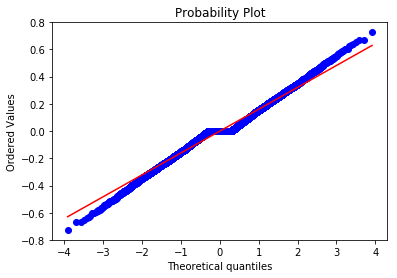

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.9608


   Jungle 
Overview of variable:  gspd 


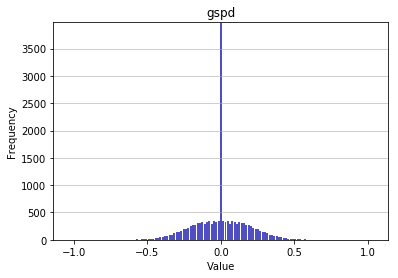

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.0374331550802138
Mean: 0.0
Standard deviation: 0.1783
Median: 0.0
Maximal value: 1.0374331550802138


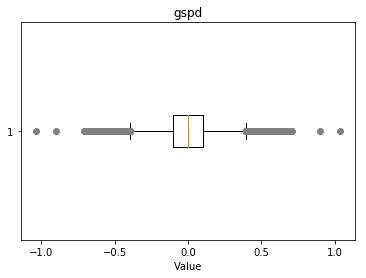

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.57, -0.57, 0.54, -0.54, -0.64, 0.64, 0.61, -0.61, 0.66, -0.66, -0.58, 0.59, -0.67, 0.67, 0.68, -0.9, -0.56, -0.59, 0.7, -0.55, 0.62, 0.71, -0.71, 1.04, -0.62, -0.7, 0.55, 0.56, -0.68, 0.9, 0.58, -1.04}


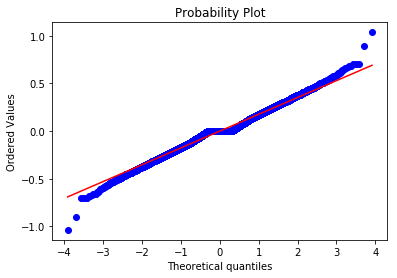

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.8401


   ADC 
Overview of variable:  gspd 


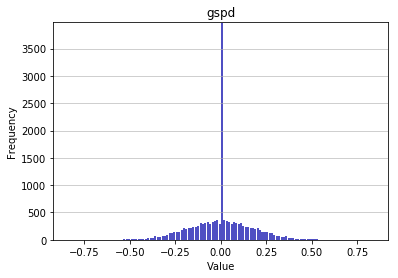

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.8372093023255814
Mean: 0.0
Standard deviation: 0.16
Median: 0.0
Maximal value: 0.8372093023255814


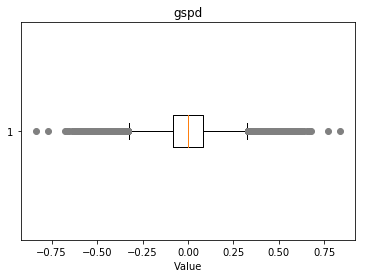

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.49, -0.49, 0.54, -0.54, 0.5, -0.5, -0.57, 0.57, 0.6, -0.6, -0.66, 0.58, -0.58, 0.59, 0.84, -0.67, 0.67, 0.51, 0.68, -0.56, -0.48, 0.77, 0.52, -0.59, -0.84, 0.61, -0.64, 0.53, -0.55, -0.63, 0.63, -0.53, 0.55, -0.61, 0.64, 0.56, 0.48, -0.77, -0.52, -0.68, -0.51, 0.66}


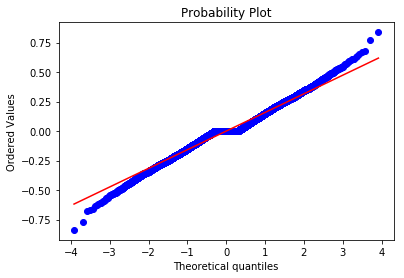

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.0632


   Support 
Overview of variable:  gspd 


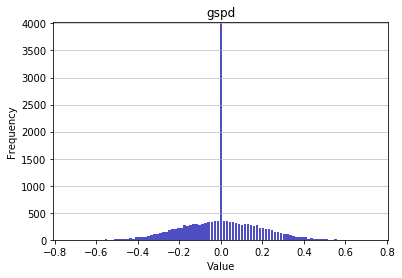

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7339449541284404
Mean: 0.0
Standard deviation: 0.1681
Median: 0.0
Maximal value: 0.7339449541284404


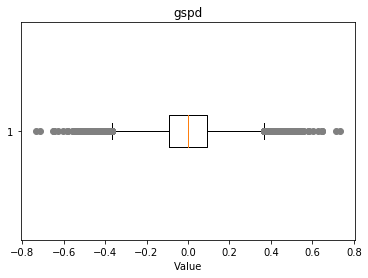

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-0.54, 0.54, 0.62, 0.55, -0.55, -0.62, 0.52, -0.52, 0.71, -0.71, -0.58, -0.5, 0.5, 0.51, -0.65, 0.6, -0.73, -0.56, 0.53, -0.53, 0.73, 0.56, -0.6, 0.65, -0.51, 0.58}


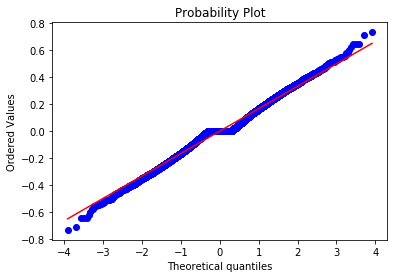

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.5648


   Top 
Overview of variable:  minionkills 


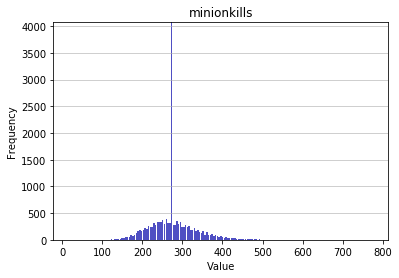

-------------------- 
Summary statistics:
 --------------------
Minimum value: 16.0
Mean: 276.4709
Standard deviation: 57.6515
Median: 271.0
Maximal value: 776.0


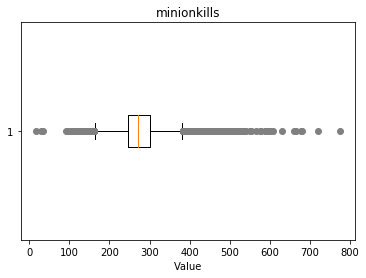

-------------------- 
Outlier detection:
 --------------------
List of outliers: {513.0, 515.0, 520.0, 521.0, 522.0, 525.0, 527.0, 16.0, 533.0, 535.0, 536.0, 537.0, 540.0, 30.0, 33.0, 550.0, 553.0, 566.0, 575.0, 579.0, 588.0, 590.0, 592.0, 598.0, 599.0, 602.0, 92.0, 96.0, 609.0, 632.0, 661.0, 666.0, 678.0, 680.0, 720.0, 776.0, 450.0, 451.0, 452.0, 453.0, 454.0, 455.0, 456.0, 457.0, 458.0, 459.0, 460.0, 461.0, 462.0, 463.0, 464.0, 465.0, 466.0, 467.0, 468.0, 469.0, 470.0, 471.0, 473.0, 474.0, 475.0, 476.0, 477.0, 478.0, 479.0, 480.0, 481.0, 482.0, 483.0, 484.0, 485.0, 486.0, 488.0, 489.0, 490.0, 491.0, 492.0, 493.0, 495.0, 497.0, 498.0, 500.0, 502.0, 503.0, 507.0, 509.0, 510.0, 511.0}


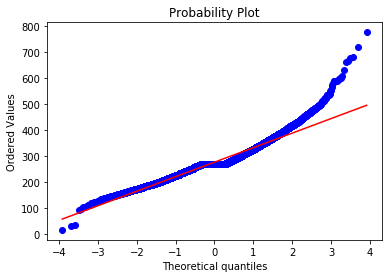

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9538
Kurtosis: 3.1983


   Middle 
Overview of variable:  minionkills 


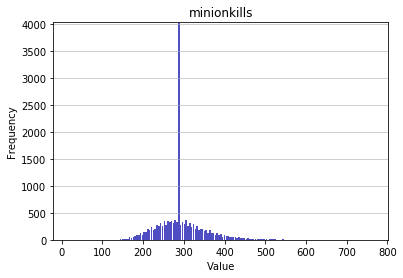

-------------------- 
Summary statistics:
 --------------------
Minimum value: 17.0
Mean: 292.6391
Standard deviation: 60.8092
Median: 287.0
Maximal value: 765.0


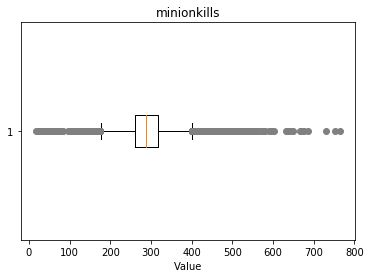

-------------------- 
Outlier detection:
 --------------------
List of outliers: {513.0, 514.0, 516.0, 517.0, 518.0, 520.0, 521.0, 522.0, 523.0, 524.0, 525.0, 526.0, 527.0, 528.0, 529.0, 530.0, 17.0, 532.0, 533.0, 22.0, 535.0, 536.0, 537.0, 24.0, 25.0, 539.0, 541.0, 542.0, 543.0, 544.0, 31.0, 34.0, 547.0, 545.0, 551.0, 552.0, 553.0, 554.0, 39.0, 40.0, 45.0, 559.0, 560.0, 561.0, 48.0, 564.0, 52.0, 54.0, 570.0, 58.0, 59.0, 61.0, 63.0, 576.0, 577.0, 65.0, 66.0, 581.0, 71.0, 590.0, 79.0, 80.0, 81.0, 84.0, 597.0, 603.0, 96.0, 100.0, 105.0, 106.0, 632.0, 634.0, 638.0, 643.0, 648.0, 667.0, 671.0, 677.0, 685.0, 731.0, 753.0, 765.0, 476.0, 477.0, 478.0, 479.0, 480.0, 481.0, 482.0, 483.0, 485.0, 486.0, 487.0, 488.0, 489.0, 490.0, 491.0, 492.0, 493.0, 494.0, 495.0, 496.0, 497.0, 498.0, 499.0, 500.0, 502.0, 503.0, 504.0, 505.0, 507.0, 508.0, 509.0, 510.0, 511.0}


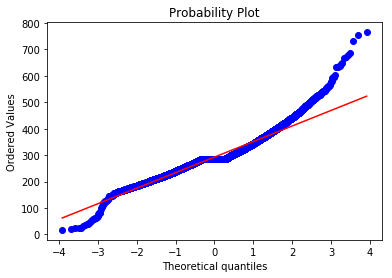

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8807
Kurtosis: 3.3153


   Jungle 
Overview of variable:  minionkills 


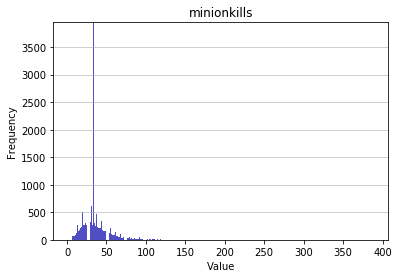

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2.0
Mean: 37.5146
Standard deviation: 21.277
Median: 34.0
Maximal value: 388.0


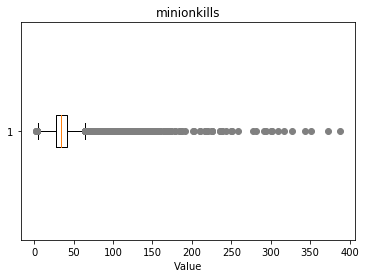

-------------------- 
Outlier detection:
 --------------------
List of outliers: {102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 136.0, 137.0, 140.0, 141.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 152.0, 153.0, 157.0, 158.0, 159.0, 160.0, 164.0, 165.0, 169.0, 170.0, 171.0, 173.0, 178.0, 179.0, 183.0, 186.0, 188.0, 191.0, 202.0, 203.0, 210.0, 216.0, 218.0, 221.0, 225.0, 226.0, 235.0, 236.0, 238.0, 243.0, 249.0, 251.0, 258.0, 277.0, 281.0, 291.0, 294.0, 300.0, 301.0, 309.0, 317.0, 327.0, 343.0, 351.0, 372.0, 388.0}


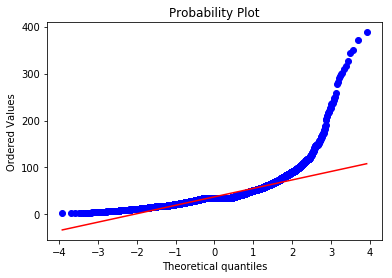

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.3043
Kurtosis: 39.6601


   ADC 
Overview of variable:  minionkills 


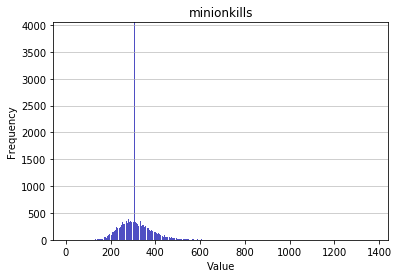

-------------------- 
Summary statistics:
 --------------------
Minimum value: 12.0
Mean: 310.8151
Standard deviation: 68.3584
Median: 305.0
Maximal value: 1373.0


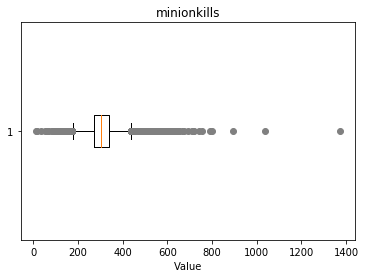

-------------------- 
Outlier detection:
 --------------------
List of outliers: {517.0, 518.0, 519.0, 520.0, 521.0, 522.0, 524.0, 525.0, 526.0, 527.0, 528.0, 529.0, 1037.0, 531.0, 19.0, 533.0, 534.0, 535.0, 536.0, 532.0, 539.0, 540.0, 541.0, 542.0, 543.0, 544.0, 545.0, 546.0, 547.0, 548.0, 549.0, 36.0, 551.0, 552.0, 555.0, 556.0, 557.0, 558.0, 559.0, 561.0, 563.0, 564.0, 565.0, 566.0, 567.0, 568.0, 51.0, 570.0, 571.0, 573.0, 62.0, 12.0, 576.0, 64.0, 578.0, 581.0, 584.0, 585.0, 72.0, 588.0, 589.0, 591.0, 593.0, 595.0, 85.0, 88.0, 601.0, 89.0, 603.0, 604.0, 605.0, 606.0, 607.0, 93.0, 609.0, 610.0, 611.0, 98.0, 613.0, 101.0, 94.0, 616.0, 623.0, 625.0, 629.0, 631.0, 633.0, 637.0, 643.0, 644.0, 645.0, 646.0, 647.0, 650.0, 653.0, 667.0, 675.0, 693.0, 709.0, 713.0, 721.0, 744.0, 756.0, 792.0, 799.0, 1373.0, 895.0}


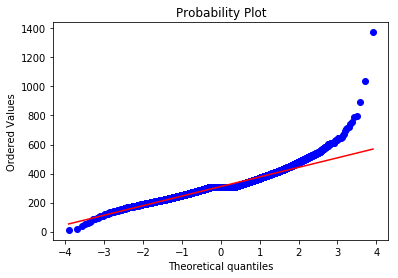

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1996
Kurtosis: 7.4638


   Support 
Overview of variable:  minionkills 


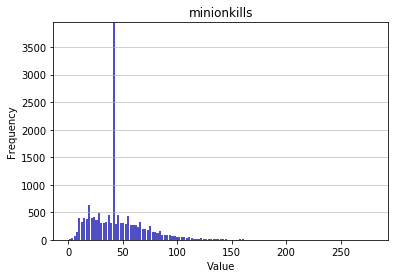

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 45.1141
Standard deviation: 24.6417
Median: 42.0
Maximal value: 280.0


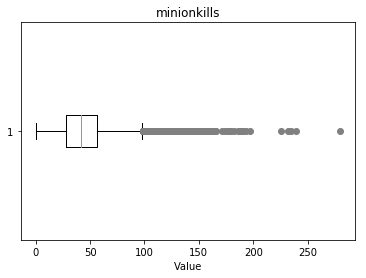

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 148.0, 149.0, 150.0, 151.0, 280.0, 153.0, 154.0, 152.0, 156.0, 157.0, 158.0, 159.0, 160.0, 161.0, 162.0, 164.0, 165.0, 166.0, 171.0, 174.0, 177.0, 179.0, 180.0, 182.0, 186.0, 188.0, 190.0, 191.0, 193.0, 197.0, 226.0, 232.0, 235.0, 239.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0}


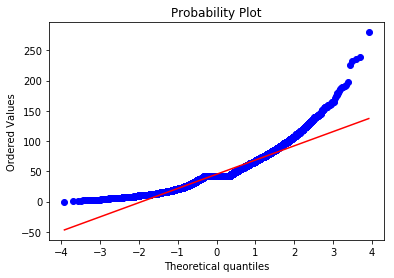

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3507
Kurtosis: 3.8848


   Top 
Overview of variable:  monsterkills 


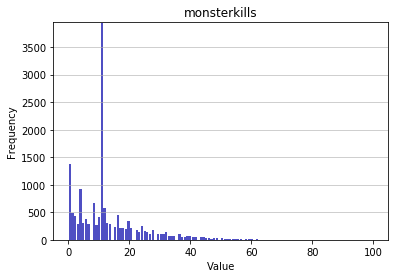

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 13.3145
Standard deviation: 11.5514
Median: 11.0
Maximal value: 100.0


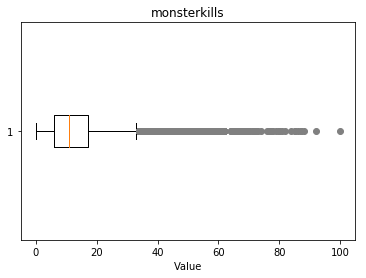

-------------------- 
Outlier detection:
 --------------------
List of outliers: {48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 84.0, 85.0, 86.0, 87.0, 88.0, 92.0, 100.0}


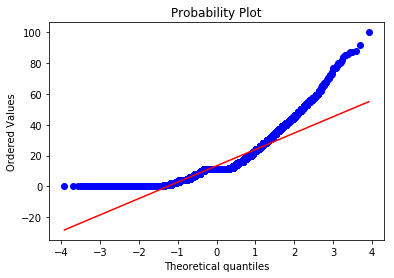

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7324
Kurtosis: 4.2901


   Middle 
Overview of variable:  monsterkills 


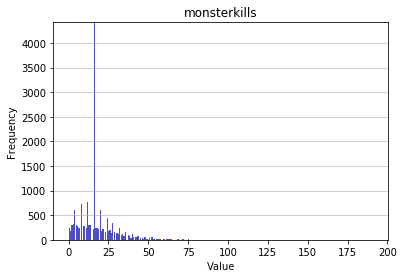

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 18.4087
Standard deviation: 14.1885
Median: 16.0
Maximal value: 191.0


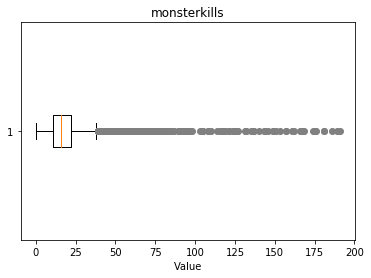

-------------------- 
Outlier detection:
 --------------------
List of outliers: {131.0, 132.0, 135.0, 136.0, 137.0, 140.0, 143.0, 144.0, 146.0, 149.0, 151.0, 153.0, 157.0, 161.0, 162.0, 166.0, 167.0, 168.0, 174.0, 175.0, 176.0, 181.0, 189.0, 186.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 191.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 97.0, 98.0, 71.0, 103.0, 104.0, 105.0, 108.0, 110.0, 114.0, 116.0, 117.0, 118.0, 119.0, 121.0, 124.0, 125.0, 126.0, 127.0}


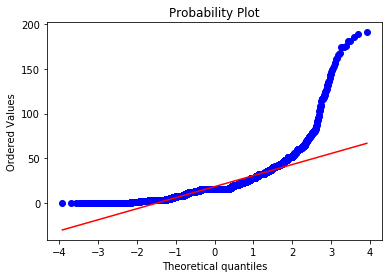

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.4338
Kurtosis: 24.607


   Jungle 
Overview of variable:  monsterkills 


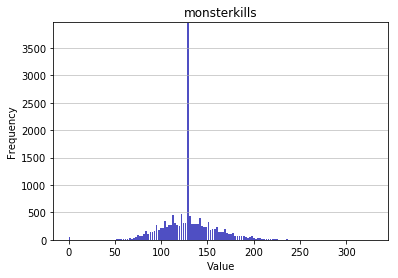

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 130.0513
Standard deviation: 29.456
Median: 129.0
Maximal value: 329.0


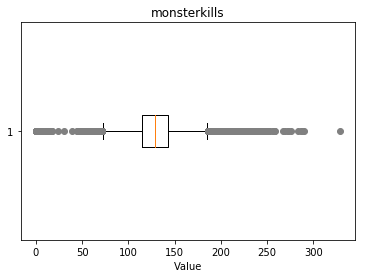

-------------------- 
Outlier detection:
 --------------------
List of outliers: {256.0, 0.0, 2.0, 1.0, 259.0, 3.0, 4.0, 5.0, 8.0, 6.0, 10.0, 267.0, 12.0, 269.0, 14.0, 15.0, 273.0, 18.0, 258.0, 276.0, 24.0, 283.0, 287.0, 288.0, 31.0, 290.0, 39.0, 329.0, 219.0, 220.0, 221.0, 222.0, 223.0, 224.0, 225.0, 226.0, 227.0, 228.0, 229.0, 230.0, 231.0, 232.0, 233.0, 234.0, 235.0, 236.0, 238.0, 239.0, 240.0, 241.0, 242.0, 243.0, 244.0, 246.0, 247.0, 248.0, 249.0, 250.0, 252.0, 253.0}


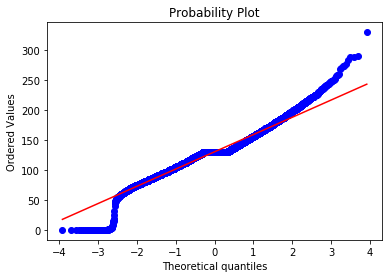

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1774
Kurtosis: 2.6638


   ADC 
Overview of variable:  monsterkills 


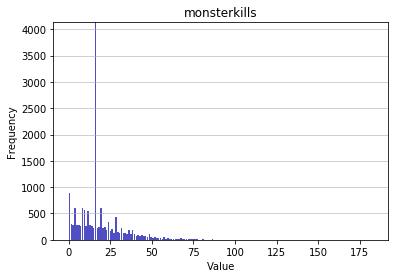

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 18.8224
Standard deviation: 14.3494
Median: 16.0
Maximal value: 183.0


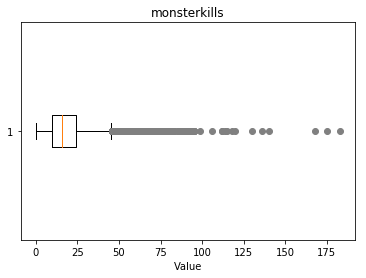

-------------------- 
Outlier detection:
 --------------------
List of outliers: {130.0, 136.0, 140.0, 168.0, 175.0, 183.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 99.0, 106.0, 112.0, 114.0, 115.0, 118.0, 120.0}


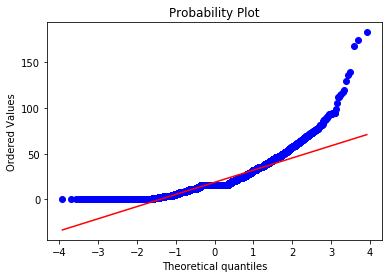

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.8297
Kurtosis: 6.8779


   Support 
Overview of variable:  monsterkills 


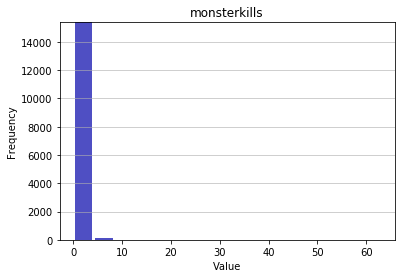

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.3323
Standard deviation: 1.3479
Median: 0.0
Maximal value: 63.0


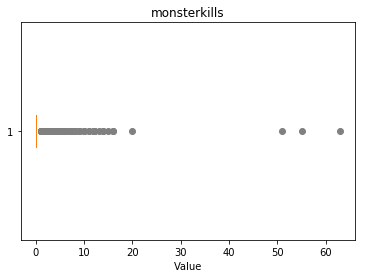

-------------------- 
Outlier detection:
 --------------------
List of outliers: {5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 51.0, 20.0, 55.0, 63.0}


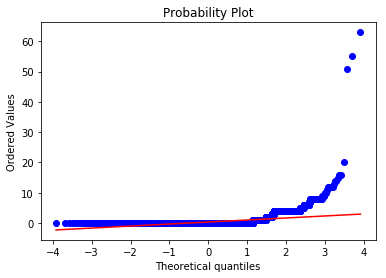

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 16.9348
Kurtosis: 619.1941


   Top 
Overview of variable:  monsterkillsownjungle 


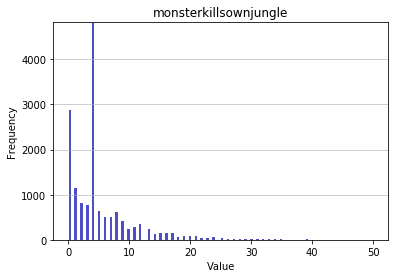

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 5.2747
Standard deviation: 5.7754
Median: 4.0
Maximal value: 50.0


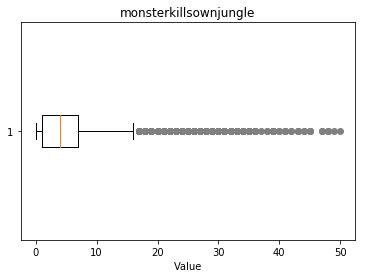

-------------------- 
Outlier detection:
 --------------------
List of outliers: {23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 47.0, 48.0, 49.0, 50.0}


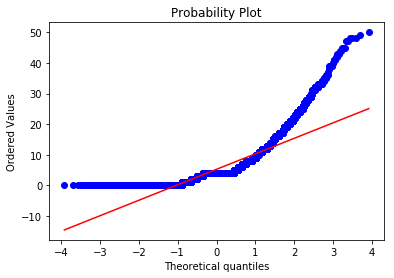

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.3019
Kurtosis: 7.4631


   Middle 
Overview of variable:  monsterkillsownjungle 


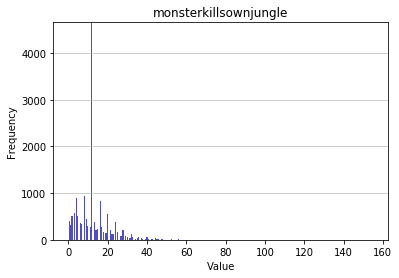

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 13.0532
Standard deviation: 10.3268
Median: 12.0
Maximal value: 155.0


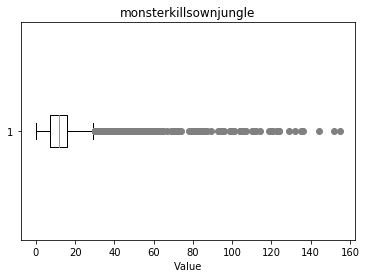

-------------------- 
Outlier detection:
 --------------------
List of outliers: {129.0, 132.0, 135.0, 136.0, 144.0, 152.0, 155.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 67.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 89.0, 93.0, 94.0, 95.0, 96.0, 99.0, 100.0, 101.0, 104.0, 105.0, 106.0, 107.0, 110.0, 111.0, 112.0, 114.0, 119.0, 120.0, 121.0, 123.0, 124.0}


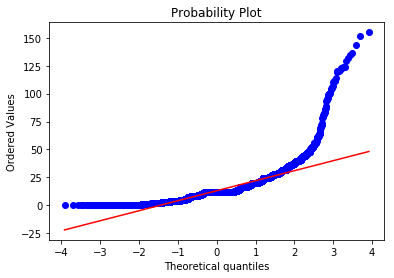

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.6306
Kurtosis: 28.5605


   Jungle 
Overview of variable:  monsterkillsownjungle 


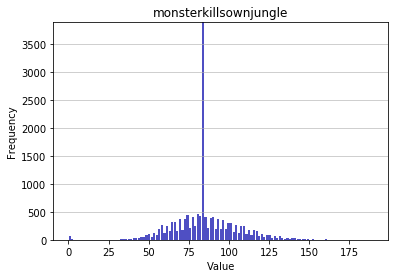

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 85.1491
Standard deviation: 19.748
Median: 84.0
Maximal value: 190.0


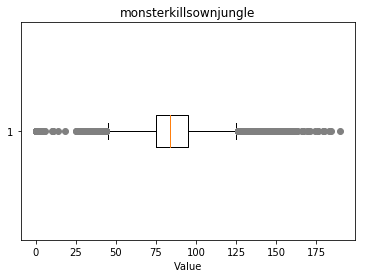

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.0, 1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 10.0, 11.0, 14.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 18.0, 152.0, 25.0, 153.0, 155.0, 156.0, 157.0, 158.0, 154.0, 160.0, 161.0, 162.0, 163.0, 159.0, 166.0, 167.0, 169.0, 170.0, 171.0, 174.0, 176.0, 179.0, 180.0, 183.0, 184.0, 190.0, 151.0}


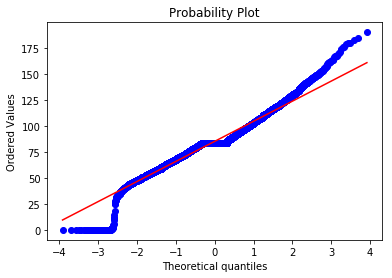

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1501
Kurtosis: 2.2975


   ADC 
Overview of variable:  monsterkillsownjungle 


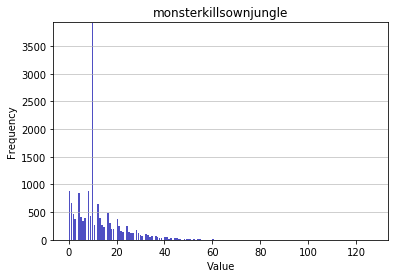

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 12.345
Standard deviation: 10.0976
Median: 10.0
Maximal value: 127.0


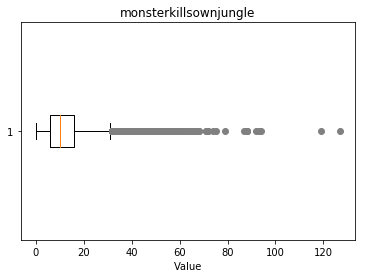

-------------------- 
Outlier detection:
 --------------------
List of outliers: {43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 71.0, 72.0, 74.0, 75.0, 79.0, 87.0, 88.0, 92.0, 93.0, 94.0, 119.0, 127.0}


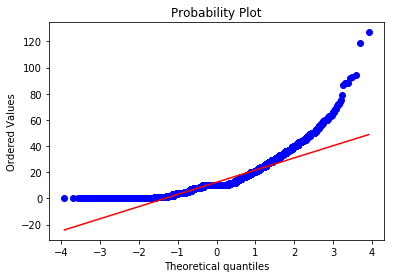

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.8645
Kurtosis: 6.4826


   Support 
Overview of variable:  monsterkillsownjungle 


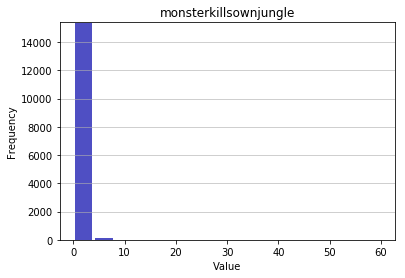

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.0867
Standard deviation: 0.7921
Median: 0.0
Maximal value: 60.0


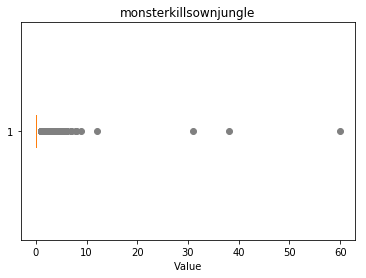

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 4.0, 5.0, 38.0, 7.0, 8.0, 6.0, 9.0, 12.0, 60.0, 31.0}


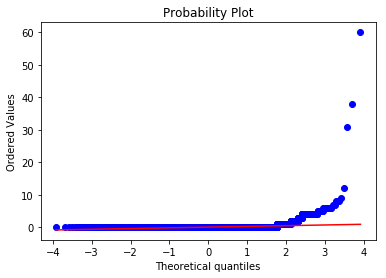

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 40.9121
Kurtosis: 2610.7823


   Top 
Overview of variable:  monsterkillsenemyjungle 


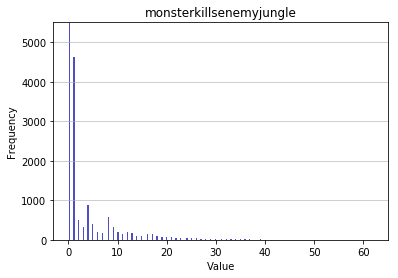

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 3.8052
Standard deviation: 6.6882
Median: 1.0
Maximal value: 62.0


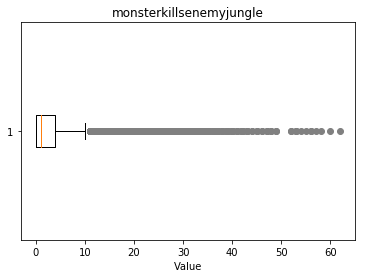

-------------------- 
Outlier detection:
 --------------------
List of outliers: {24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 60.0, 62.0}


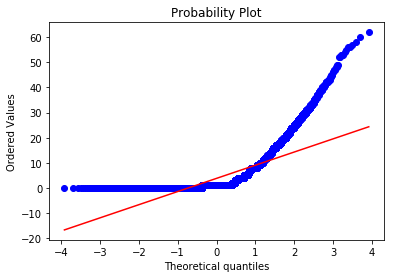

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.8327
Kurtosis: 10.059


   Middle 
Overview of variable:  monsterkillsenemyjungle 


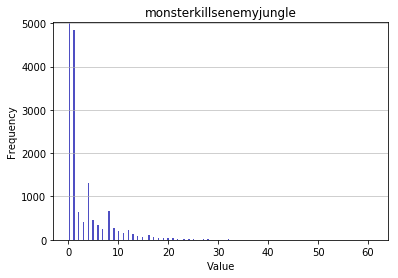

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.9981
Standard deviation: 4.667
Median: 1.0
Maximal value: 61.0


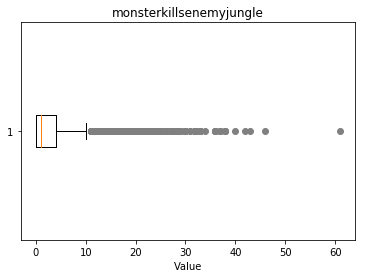

-------------------- 
Outlier detection:
 --------------------
List of outliers: {17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 36.0, 37.0, 38.0, 40.0, 42.0, 43.0, 46.0, 61.0}


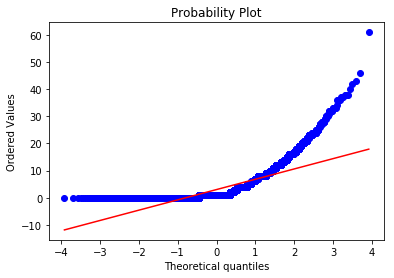

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.738
Kurtosis: 10.7393


   Jungle 
Overview of variable:  monsterkillsenemyjungle 


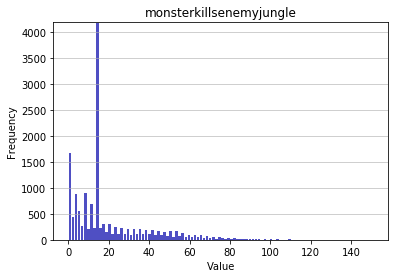

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 20.3186
Standard deviation: 19.9034
Median: 14.0
Maximal value: 151.0


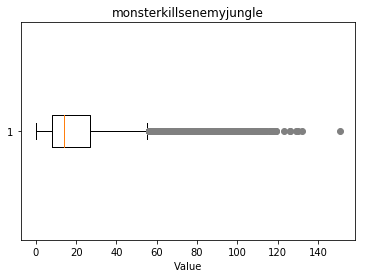

-------------------- 
Outlier detection:
 --------------------
List of outliers: {129.0, 130.0, 132.0, 151.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 116.0, 117.0, 118.0, 119.0, 123.0, 126.0}


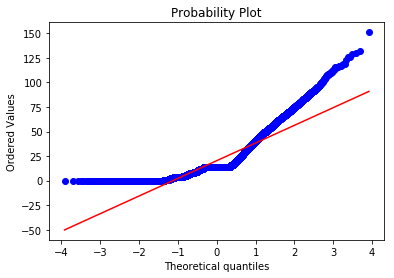

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.6331
Kurtosis: 2.6565


   ADC 
Overview of variable:  monsterkillsenemyjungle 


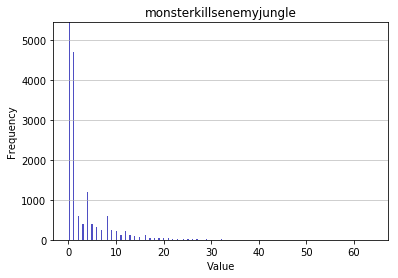

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 2.9286
Standard deviation: 4.7928
Median: 1.0
Maximal value: 64.0


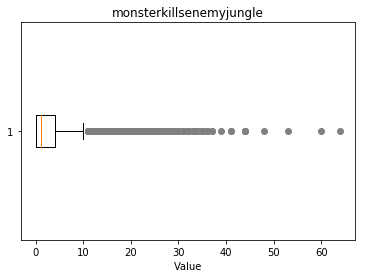

-------------------- 
Outlier detection:
 --------------------
List of outliers: {18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 39.0, 41.0, 44.0, 48.0, 53.0, 60.0, 64.0}


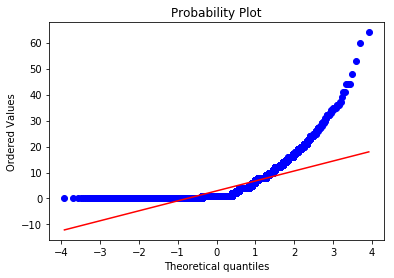

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.9582
Kurtosis: 13.2327


   Support 
Overview of variable:  monsterkillsenemyjungle 


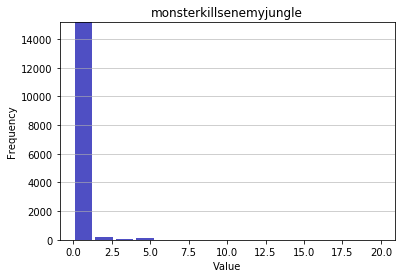

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 0.1095
Standard deviation: 0.5691
Median: 0.0
Maximal value: 20.0


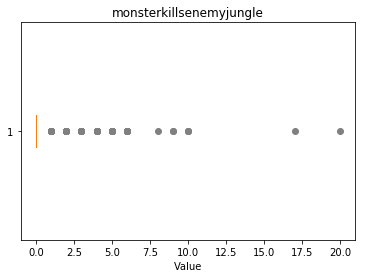

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2.0, 3.0, 4.0, 5.0, 6.0, 8.0, 9.0, 10.0, 17.0, 20.0}


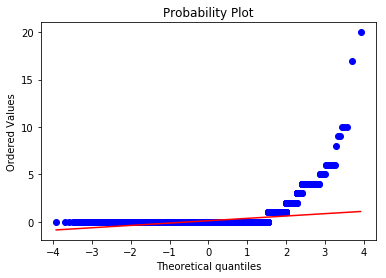

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 10.4035
Kurtosis: 201.2162


   Top 
Overview of variable:  cspm 


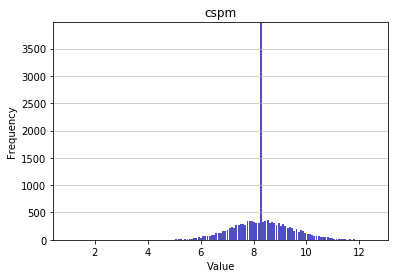

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.00418410041841
Mean: 8.324
Standard deviation: 1.0237
Median: 8.3106
Maximal value: 12.523833416959357


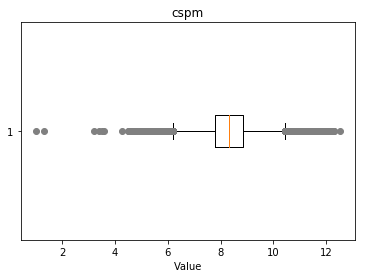

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1.31, 1.0, 3.23, 4.74, 5.14, 4.79, 5.15, 4.61, 5.2, 5.11, 11.67, 12.52, 12.07, 12.11, 11.41, 12.3, 11.94, 12.01, 11.71, 11.63, 4.65, 4.91, 4.57, 4.59, 4.83, 5.08, 5.1, 5.25, 5.18, 4.49, 5.07, 11.43, 5.02, 11.44, 11.88, 11.82, 11.57, 11.51, 3.52, 11.45, 11.55, 11.42, 11.78, 11.83, 11.93, 11.49, 12.03, 12.23, 12.2, 11.62, 11.79, 11.64, 12.18, 12.14, 12.06, 12.09, 11.81, 4.73, 11.65, 11.4, 4.97, 4.54, 4.71, 11.68, 5.04, 5.19, 5.05, 11.47, 11.91, 11.6, 4.26, 11.54, 4.75, 3.39, 11.48, 3.58, 11.86, 4.51}


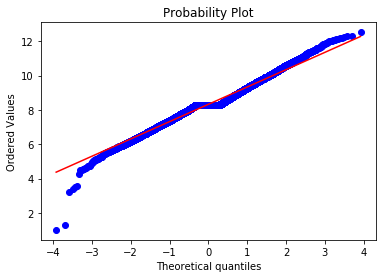

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0499
Kurtosis: 1.2094


   Middle 
Overview of variable:  cspm 


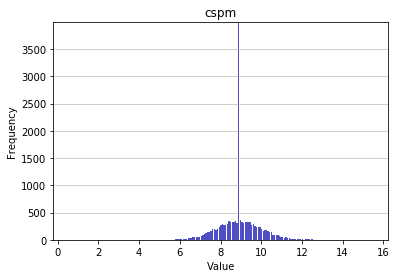

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.5284974093264249
Mean: 8.9246
Standard deviation: 1.0348
Median: 8.9182
Maximal value: 15.502757742893507


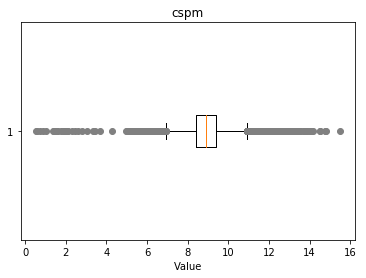

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.76, 1.36, 1.01, 3.03, 4.28, 5.25, 5.5, 5.78, 5.75, 5.79, 5.35, 5.44, 12.29, 5.66, 5.57, 12.31, 13.88, 12.08, 12.05, 12.81, 12.37, 12.15, 13.35, 14.52, 15.5, 5.68, 1.5, 2.61, 3.43, 1.61, 12.21, 12.04, 12.32, 12.54, 12.07, 13.11, 13.5, 13.32, 12.71, 12.93, 14.0, 13.0, 1.97, 5.36, 5.47, 12.27, 2.33, 2.08, 1.76, 5.33, 5.65, 5.26, 5.76, 12.43, 12.62, 12.12, 12.19, 12.26, 12.22, 12.83, 12.33, 13.26, 12.4, 1.87, 14.08, 14.15, 2.8, 5.12, 5.19, 1.41, 0.87, 0.61, 2.09, 3.34, 5.52, 5.77, 1.52, 12.56, 1.95, 12.2, 12.7, 12.52, 12.66, 12.41, 13.7, 13.2, 13.55, 13.45, 12.23, 14.09, 13.31, 4.95, 5.7, 2.06, 12.47, 12.35, 3.67, 13.85, 0.53, 12.88, 12.49, 12.03, 12.67, 12.92, 13.17, 13.74, 13.38, 12.38, 13.28, 14.49, 13.53, 14.81, 14.74, 2.46, 12.51, 5.53, 5.46, 5.03, 5.39, 5.28}


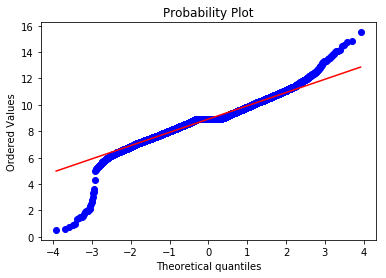

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.2504
Kurtosis: 4.9071


   Jungle 
Overview of variable:  cspm 


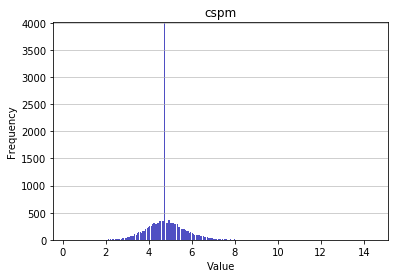

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.274914089347079
Mean: 4.8193
Standard deviation: 0.8803
Median: 4.7803
Maximal value: 14.435643564356436


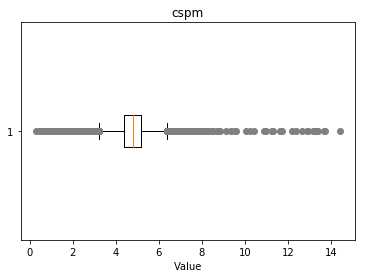

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.27, 1.56, 2.13, 2.15, 2.17, 1.1, 1.18, 7.99, 7.55, 7.66, 7.71, 7.72, 8.01, 7.53, 8.1, 8.35, 7.8, 8.17, 11.7, 13.33, 13.39, 14.44, 13.25, 1.68, 1.43, 7.93, 7.5, 7.82, 7.75, 8.18, 8.04, 8.5, 8.21, 8.86, 9.36, 9.54, 1.11, 11.71, 12.21, 12.64, 0.79, 13.68, 7.54, 7.47, 1.4, 7.61, 7.79, 0.46, 0.44, 1.58, 2.01, 0.76, 0.94, 7.58, 7.65, 7.83, 8.72, 8.26, 10.9, 11.33, 11.65, 13.15, 1.62, 1.8, 0.73, 1.16, 1.66, 0.62, 0.85, 0.64, 0.9, 0.67, 2.16, 1.84, 7.59, 7.98, 7.77, 8.8, 8.02, 2.02, 8.45, 8.16, 9.59, 10.05, 10.41, 1.7, 1.2, 12.95, 12.91, 1.13, 0.56, 7.63, 7.88, 7.56, 7.81, 2.06, 0.49, 1.67, 7.6, 7.49, 1.35, 7.92, 8.03, 9.38, 9.13, 0.78, 10.24, 10.99, 1.03, 1.28, 11.28, 11.24, 12.38, 13.74, 1.96, 1.39, 7.46, 7.89, 1.57}


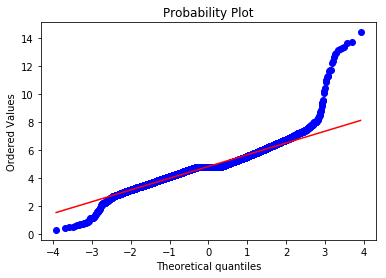

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.047
Kurtosis: 9.5399


   ADC 
Overview of variable:  cspm 


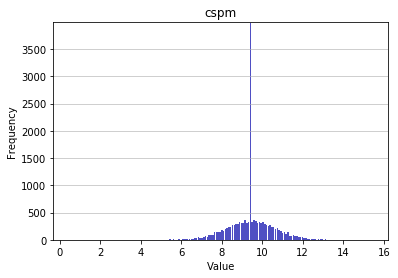

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.4414469650521153
Mean: 9.4285
Standard deviation: 1.114
Median: 9.4432
Maximal value: 15.475352112676054


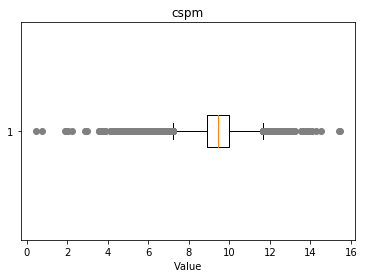

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.74, 1.94, 2.91, 3.7, 4.47, 5.91, 5.47, 6.05, 5.57, 5.77, 5.53, 5.42, 12.79, 13.55, 13.91, 12.8, 13.23, 12.85, 15.48, 12.91, 13.17, 13.04, 13.06, 14.26, 15.44, 4.5, 5.68, 5.5, 5.18, 5.43, 6.0, 6.07, 3.68, 3.86, 2.25, 12.93, 12.86, 12.89, 13.11, 14.07, 14.54, 4.29, 4.72, 4.11, 4.97, 5.61, 5.11, 5.36, 6.04, 0.44, 3.76, 4.58, 5.76, 5.4, 6.08, 12.94, 12.9, 12.97, 12.83, 13.58, 13.19, 13.15, 13.12, 13.87, 2.87, 4.37, 4.3, 4.69, 5.8, 5.05, 5.94, 5.87, 5.12, 5.55, 4.52, 4.59, 4.91, 5.52, 5.09, 5.41, 5.84, 6.02, 3.77, 12.95, 12.77, 12.84, 12.98, 13.09, 13.73, 4.63, 4.88, 4.7, 4.45, 5.88, 5.7, 5.2, 3.56, 2.99, 4.85, 4.99, 4.24, 5.92, 5.17, 5.1, 2.03, 3.85, 12.78, 13.85, 4.21, 4.64, 4.89, 1.89, 5.78, 5.64, 5.71, 3.57}


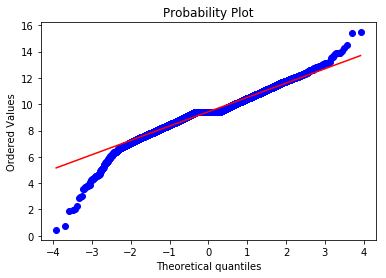

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.3589
Kurtosis: 2.8732


   Support 
Overview of variable:  cspm 


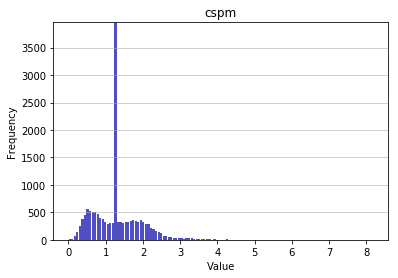

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 1.3053
Standard deviation: 0.6705
Median: 1.2352
Maximal value: 8.185430463576159


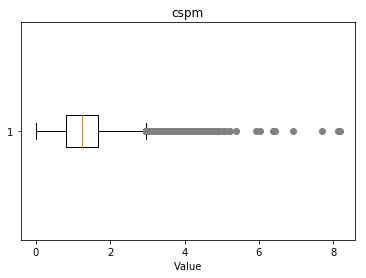

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.55, 3.66, 3.56, 6.37, 7.7, 3.33, 3.43, 4.02, 3.73, 4.04, 4.29, 8.19, 8.13, 3.75, 3.5, 4.07, 4.32, 4.68, 4.43, 5.93, 6.93, 3.36, 3.68, 3.61, 3.93, 3.54, 4.11, 4.22, 4.47, 4.54, 5.04, 5.22, 3.4, 3.9, 3.72, 3.97, 3.47, 3.76, 3.51, 3.58, 4.65, 4.83, 4.26, 4.01, 4.58, 5.08, 3.44, 3.94, 3.69, 3.8, 3.37, 4.37, 4.69, 4.94, 4.19, 4.12, 4.55, 4.46, 6.44, 3.98, 3.48, 3.41, 3.59, 3.34, 3.91, 4.23, 4.16, 4.73, 4.09, 4.84, 3.52, 3.77, 3.7, 3.45, 3.63, 3.38, 3.88, 4.63, 4.38, 4.13, 4.45, 3.81, 3.92, 3.49, 3.42, 3.67, 3.74, 4.35, 4.17, 4.92, 4.24, 3.78, 3.6, 3.35, 3.85, 3.53, 3.46, 3.71, 4.39, 4.14, 4.64, 4.21, 4.03, 4.53, 4.28, 4.78, 5.39, 5.21, 6.03, 3.82, 3.39, 3.32, 3.89, 3.64}


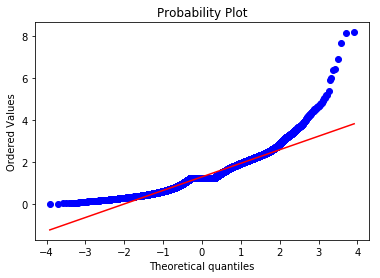

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2696
Kurtosis: 4.7297


   Top 
Overview of variable:  goldat10 


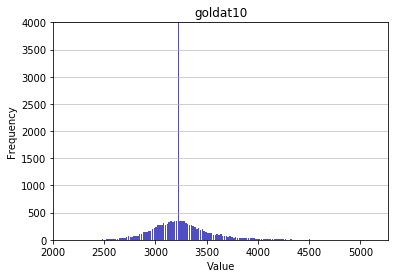

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2152.0
Mean: 3242.9504
Standard deviation: 266.0042
Median: 3224.0
Maximal value: 5126.0


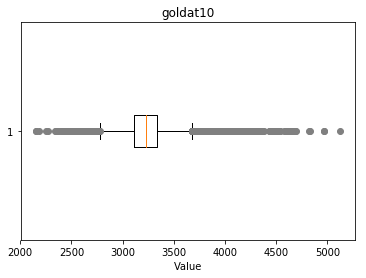

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4097.0, 4099.0, 4102.0, 5126.0, 4105.0, 4618.0, 4106.0, 4620.0, 4108.0, 4110.0, 4111.0, 4623.0, 4113.0, 4107.0, 4116.0, 4118.0, 4120.0, 4121.0, 4123.0, 4125.0, 4640.0, 4131.0, 4132.0, 4133.0, 4134.0, 4137.0, 4653.0, 4141.0, 4143.0, 4144.0, 4145.0, 4152.0, 4154.0, 4157.0, 4669.0, 4160.0, 4161.0, 4165.0, 4167.0, 4680.0, 4172.0, 4173.0, 4177.0, 4178.0, 4179.0, 4180.0, 4182.0, 4184.0, 4185.0, 4697.0, 4187.0, 4188.0, 4186.0, 4192.0, 4194.0, 4196.0, 4197.0, 4198.0, 2152.0, 2156.0, 4205.0, 4204.0, 4207.0, 4209.0, 4218.0, 4223.0, 4225.0, 4226.0, 4227.0, 4230.0, 4606.0, 4231.0, 4233.0, 2187.0, 4236.0, 4235.0, 4241.0, 4242.0, 4248.0, 4249.0, 4252.0, 4255.0, 4260.0, 4261.0, 4263.0, 4265.0, 4269.0, 4270.0, 4278.0, 4281.0, 4282.0, 4287.0, 4293.0, 4301.0, 2254.0, 4305.0, 4823.0, 4316.0, 4317.0, 4318.0, 4833.0, 2273.0, 4322.0, 4327.0, 4330.0, 4332.0, 4351.0, 4355.0, 4356.0, 4365.0, 4385.0, 2339.0, 2354.0, 2359.0, 2369.0

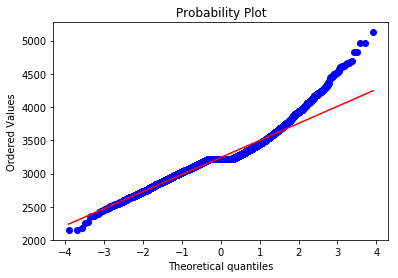

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8999
Kurtosis: 3.2685


   Middle 
Overview of variable:  goldat10 


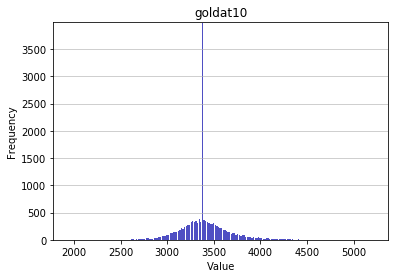

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1943.0
Mean: 3398.4428
Standard deviation: 250.6255
Median: 3386.0
Maximal value: 5208.0


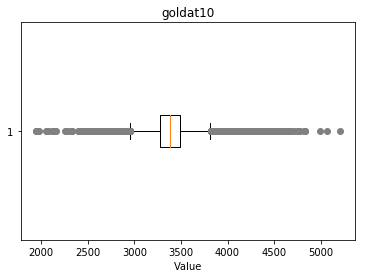

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2560.0, 2052.0, 4615.0, 2060.0, 2572.0, 4623.0, 2581.0, 4635.0, 2076.0, 4638.0, 2591.0, 2590.0, 4644.0, 2600.0, 2604.0, 2614.0, 4151.0, 2616.0, 2618.0, 4155.0, 4667.0, 4157.0, 2620.0, 4161.0, 2626.0, 4162.0, 2628.0, 4165.0, 2630.0, 2116.0, 4681.0, 2634.0, 2635.0, 4171.0, 2636.0, 4174.0, 4175.0, 4176.0, 4177.0, 2642.0, 2643.0, 2131.0, 4173.0, 2646.0, 4184.0, 5208.0, 4186.0, 4185.0, 2143.0, 4192.0, 4195.0, 4200.0, 4713.0, 4202.0, 4203.0, 4204.0, 4205.0, 4207.0, 2159.0, 4208.0, 4210.0, 4213.0, 4214.0, 4216.0, 4218.0, 4221.0, 4222.0, 4223.0, 4224.0, 4227.0, 4229.0, 4230.0, 4231.0, 4232.0, 4234.0, 4236.0, 4239.0, 4240.0, 4753.0, 4754.0, 4243.0, 4755.0, 4246.0, 4247.0, 4252.0, 4255.0, 4257.0, 4258.0, 4773.0, 4263.0, 4269.0, 4273.0, 4274.0, 4275.0, 4276.0, 4278.0, 4279.0, 4282.0, 4283.0, 4284.0, 4285.0, 4286.0, 4288.0, 4289.0, 4295.0, 4299.0, 4816.0, 4305.0, 2257.0, 4309.0, 4310.0, 4311.0, 4314.0, 4317.0, 4830.0

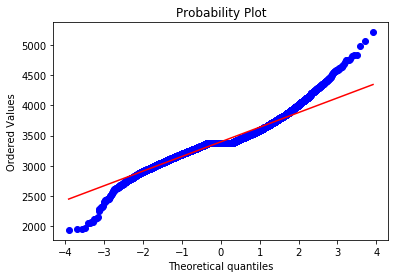

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5654
Kurtosis: 3.8319


   Jungle 
Overview of variable:  goldat10 


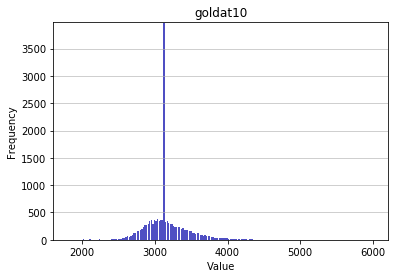

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1812.0
Mean: 3160.2101
Standard deviation: 298.5111
Median: 3127.0
Maximal value: 6004.0


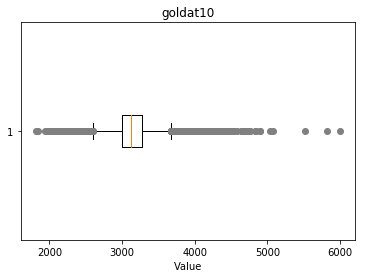

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4096.0, 4097.0, 2052.0, 4101.0, 4102.0, 4104.0, 4106.0, 2059.0, 2060.0, 4115.0, 4116.0, 4121.0, 4122.0, 2074.0, 2073.0, 2078.0, 4127.0, 4641.0, 2082.0, 4129.0, 4133.0, 4134.0, 2043.0, 4135.0, 4646.0, 4138.0, 4140.0, 4143.0, 4145.0, 2100.0, 4150.0, 4663.0, 4151.0, 4662.0, 4154.0, 4155.0, 2107.0, 4666.0, 2111.0, 2112.0, 4162.0, 2114.0, 4166.0, 4684.0, 4172.0, 4174.0, 4175.0, 4176.0, 4182.0, 4694.0, 4183.0, 4185.0, 4186.0, 4187.0, 2139.0, 4189.0, 4702.0, 2142.0, 4188.0, 4193.0, 4194.0, 4200.0, 4203.0, 4205.0, 4207.0, 4208.0, 4209.0, 2159.0, 2163.0, 4210.0, 4213.0, 2167.0, 4216.0, 2169.0, 4219.0, 4221.0, 2174.0, 2178.0, 4227.0, 4739.0, 4229.0, 4231.0, 4236.0, 4238.0, 4240.0, 4241.0, 4245.0, 2197.0, 4247.0, 4248.0, 4249.0, 2200.0, 4760.0, 4761.0, 4253.0, 2209.0, 4261.0, 4268.0, 4271.0, 2225.0, 4275.0, 4276.0, 2232.0, 2236.0, 2237.0, 4286.0, 2239.0, 2244.0, 5829.0, 4292.0, 4293.0, 4296.0, 4300.0, 4301.0, 2258.0

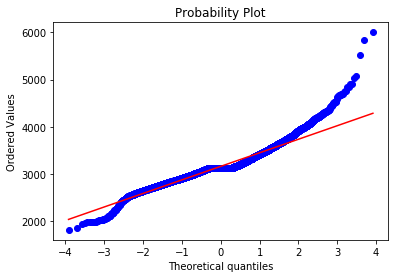

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9497
Kurtosis: 3.9902


   ADC 
Overview of variable:  goldat10 


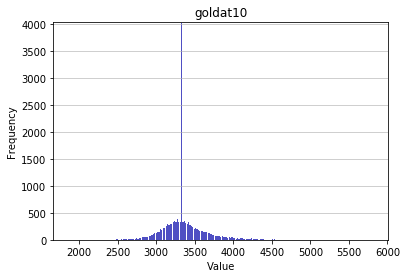

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1865.0
Mean: 3360.1828
Standard deviation: 277.8967
Median: 3333.0
Maximal value: 5814.0


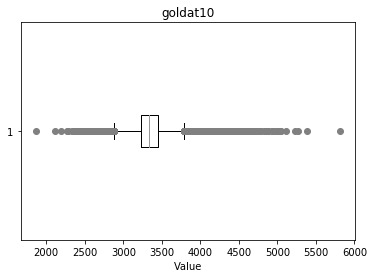

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4622.0, 4636.0, 4648.0, 4660.0, 4663.0, 4664.0, 4672.0, 4673.0, 4674.0, 2116.0, 4682.0, 4685.0, 4687.0, 4689.0, 4698.0, 4702.0, 4703.0, 4194.0, 4197.0, 4199.0, 4200.0, 4201.0, 4202.0, 5226.0, 4206.0, 4208.0, 4721.0, 4209.0, 4212.0, 4218.0, 4220.0, 4227.0, 4228.0, 4229.0, 4230.0, 4231.0, 4234.0, 4235.0, 4236.0, 4237.0, 4746.0, 2191.0, 4240.0, 4241.0, 4242.0, 4239.0, 4756.0, 4245.0, 4758.0, 4247.0, 4248.0, 5271.0, 4249.0, 4251.0, 4764.0, 4253.0, 4254.0, 4246.0, 4256.0, 4257.0, 4258.0, 4770.0, 4260.0, 4265.0, 4266.0, 4267.0, 4268.0, 4269.0, 4782.0, 4272.0, 4273.0, 4275.0, 4278.0, 4279.0, 5814.0, 4280.0, 4284.0, 4286.0, 4291.0, 4296.0, 4297.0, 4298.0, 4299.0, 4301.0, 4304.0, 4305.0, 4313.0, 4315.0, 4316.0, 4317.0, 4830.0, 4320.0, 4321.0, 2274.0, 4323.0, 2277.0, 4326.0, 4330.0, 4331.0, 4332.0, 2282.0, 4341.0, 4342.0, 4343.0, 4344.0, 4858.0, 4346.0, 4347.0, 4355.0, 4868.0, 5382.0, 4359.0, 4872.0, 4361.0, 4873.0

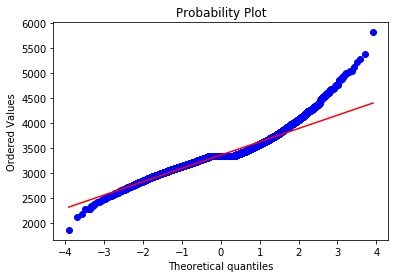

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.0796
Kurtosis: 4.3744


   Support 
Overview of variable:  goldat10 


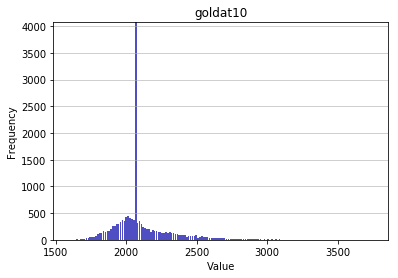

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1591.0
Mean: 2110.7803
Standard deviation: 218.6333
Median: 2065.0
Maximal value: 3753.0


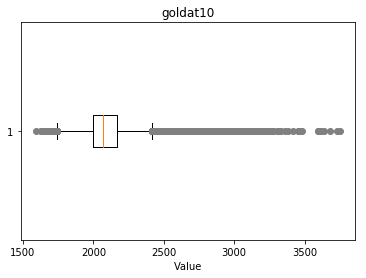

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3079.0, 3080.0, 3596.0, 3086.0, 3089.0, 3091.0, 3093.0, 3094.0, 3607.0, 3097.0, 3100.0, 3103.0, 3107.0, 3620.0, 3110.0, 3111.0, 3119.0, 3635.0, 3123.0, 3131.0, 3146.0, 3147.0, 3157.0, 3158.0, 3165.0, 3683.0, 3175.0, 3181.0, 3182.0, 3196.0, 3208.0, 3212.0, 3216.0, 3728.0, 3220.0, 3229.0, 3232.0, 3237.0, 3753.0, 3248.0, 3258.0, 3266.0, 3272.0, 3275.0, 2767.0, 2768.0, 2769.0, 2770.0, 2771.0, 2772.0, 2774.0, 2775.0, 2778.0, 2779.0, 2780.0, 2781.0, 2782.0, 2783.0, 2784.0, 2787.0, 2788.0, 2789.0, 2792.0, 2794.0, 2795.0, 3307.0, 2797.0, 3312.0, 2803.0, 2805.0, 2806.0, 2807.0, 2808.0, 2809.0, 2810.0, 2811.0, 2812.0, 2813.0, 2814.0, 2815.0, 2816.0, 3323.0, 3333.0, 2823.0, 2824.0, 2825.0, 2827.0, 2828.0, 2829.0, 2830.0, 2833.0, 2834.0, 2835.0, 2838.0, 2839.0, 2840.0, 2841.0, 2843.0, 2844.0, 2845.0, 2847.0, 2848.0, 2849.0, 2850.0, 2851.0, 2852.0, 2853.0, 2854.0, 3364.0, 2856.0, 2855.0, 2859.0, 2860.0, 2862.0, 2863.0

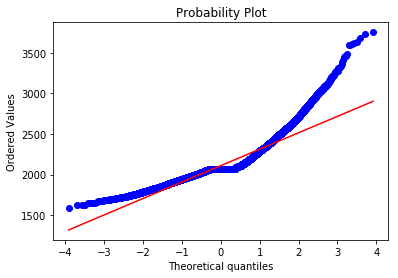

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7622
Kurtosis: 5.1745


   Top 
Overview of variable:  gdat10 


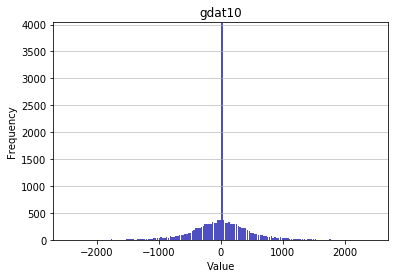

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2460.0
Mean: 0.0
Standard deviation: 427.6337
Median: 0.0
Maximal value: 2460.0


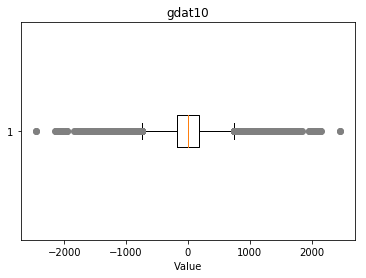

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1536.0, -1536.0, -1534.0, -1533.0, -1531.0, -1530.0, -1528.0, 1546.0, 1548.0, -1523.0, -1520.0, 2065.0, 2066.0, -2029.0, 1553.0, -1513.0, -1512.0, -2023.0, -1509.0, 2075.0, 1568.0, 2083.0, -1500.0, 2086.0, -1493.0, 1579.0, -1490.0, 1584.0, 1590.0, -1992.0, -1476.0, 1603.0, -1469.0, -1467.0, -1466.0, -1464.0, 1609.0, 1612.0, -1453.0, 2133.0, -1448.0, 2138.0, -1445.0, -1955.0, -1952.0, 1635.0, -2460.0, -1436.0, -1434.0, -2453.0, -1428.0, 2157.0, -1427.0, 1647.0, 1652.0, 1653.0, -1418.0, -1414.0, -1410.0, -1408.0, -1405.0, -1402.0, -1399.0, 1684.0, -1384.0, -1382.0, -1381.0, 1692.0, 1696.0, -1376.0, 1706.0, -1365.0, -1363.0, -1357.0, -1356.0, 1719.0, -1352.0, -1346.0, 1727.0, -1342.0, -1337.0, 1736.0, -1845.0, -1333.0, -1331.0, -1324.0, -1323.0, -1319.0, 1754.0, -1314.0, 1762.0, 1763.0, -1310.0, -1306.0, 1769.0, -1303.0, -1301.0, -1300.0, -1299.0, -1298.0, -1297.0, 1776.0, -1296.0, -1804.0, -1290.0, 1784.0, 

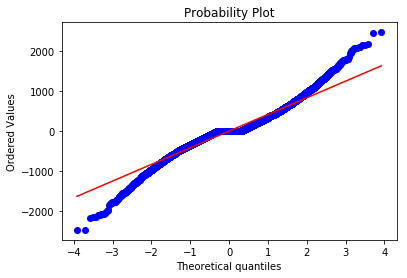

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.0142


   Middle 
Overview of variable:  gdat10 


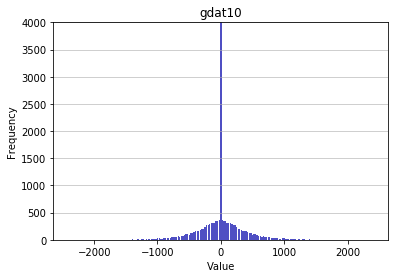

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2404.0
Mean: 0.0
Standard deviation: 374.0136
Median: 0.0
Maximal value: 2404.0


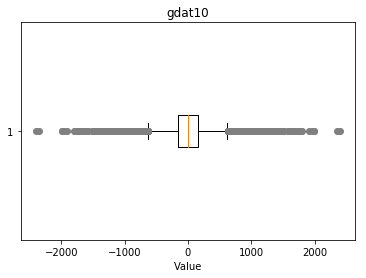

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1523.0, -1506.0, -1497.0, 1577.0, 1586.0, -1485.0, -1475.0, -1987.0, -1473.0, -1985.0, -1471.0, 1602.0, -1469.0, 1609.0, -1966.0, -1453.0, 1621.0, 1124.0, -1436.0, -1433.0, 1129.0, 1130.0, 1645.0, 1135.0, 1136.0, -1423.0, 1138.0, -1421.0, 1139.0, -1418.0, 1143.0, 1657.0, 1145.0, 1150.0, -1409.0, -1407.0, 1154.0, -1405.0, 1160.0, 1672.0, -1396.0, 1677.0, -1395.0, -1394.0, -1392.0, 1166.0, 1170.0, -1904.0, 1164.0, 1173.0, -1386.0, 1178.0, -2404.0, 1180.0, 1184.0, -1374.0, -1372.0, 1190.0, 1191.0, -1368.0, -1364.0, -1355.0, 1207.0, -1352.0, 1212.0, 1725.0, 1215.0, 1219.0, -1340.0, 1733.0, 1223.0, -1336.0, -1335.0, 1225.0, -1330.0, 1231.0, 1230.0, -2350.0, -1325.0, 1238.0, -1317.0, 1244.0, -1316.0, 1246.0, -1312.0, 1249.0, 1251.0, -1307.0, -1306.0, -1305.0, 1768.0, 1256.0, 1260.0, 1264.0, 1265.0, -1806.0, -1293.0, -1292.0, 1270.0, -1287.0, 1790.0, -1790.0, 1287.0, -1270.0, 1292.0, 1293.0, 1806.0, -1265.0, -1

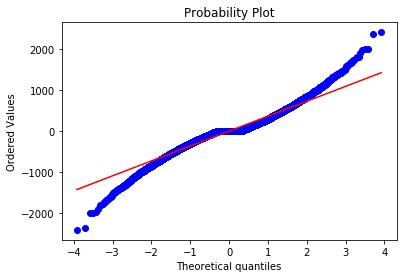

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.9801


   Jungle 
Overview of variable:  gdat10 


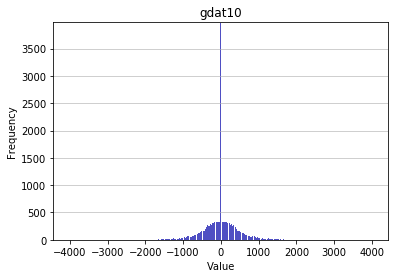

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4033.0
Mean: 0.0
Standard deviation: 432.1333
Median: 0.0
Maximal value: 4033.0


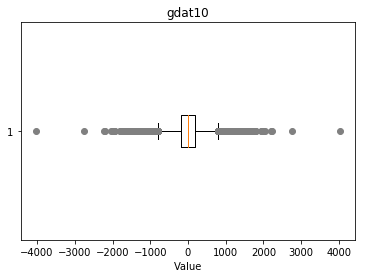

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1538.0, -2045.0, 1540.0, -1531.0, 1539.0, -1524.0, 1551.0, -1520.0, 1553.0, 1554.0, 1555.0, -1515.0, -1510.0, 1564.0, 1568.0, -1502.0, -1501.0, -1499.0, 1578.0, 1579.0, -1999.0, -1486.0, 1591.0, -1480.0, 1592.0, -1479.0, -1991.0, -1476.0, -4033.0, -1984.0, -1467.0, -1976.0, 1611.0, -1970.0, -1454.0, 1619.0, -1452.0, 1621.0, -1962.0, -1451.0, -1453.0, -1447.0, 1631.0, -1440.0, -1437.0, -1427.0, 1650.0, 1652.0, 1654.0, -1926.0, -1413.0, 1660.0, -1410.0, 1666.0, -1406.0, -1401.0, -1398.0, -1396.0, -1392.0, -1388.0, -1381.0, -1378.0, 2206.0, 1696.0, -1373.0, -1372.0, -1366.0, -1358.0, -1355.0, 2230.0, 1718.0, -1346.0, -1342.0, -1338.0, 1737.0, -1331.0, 2768.0, -1327.0, -1325.0, -1323.0, 1750.0, -1319.0, -1317.0, -1313.0, 1764.0, -1308.0, -1304.0, -1300.0, -1808.0, 1789.0, -1789.0, 1808.0, 1300.0, 1304.0, -1764.0, 1308.0, 1313.0, 1317.0, 1319.0, -1750.0, 1323.0, 1325.0, 1327.0, -2768.0, 1331.0, -1737.0, 1338.0

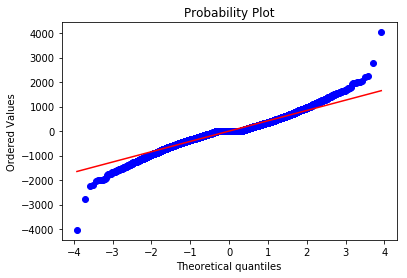

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.2741


   ADC 
Overview of variable:  gdat10 


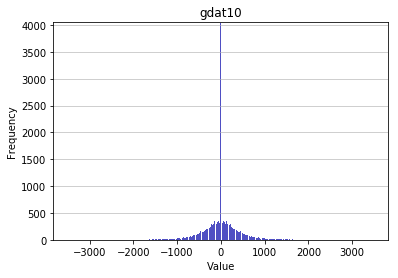

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3480.0
Mean: 0.0
Standard deviation: 436.5937
Median: 0.0
Maximal value: 3480.0


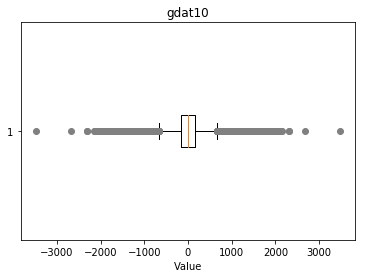

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1535.0, -1532.0, 1543.0, -1528.0, 1544.0, -1526.0, 1548.0, -1522.0, -1521.0, -1520.0, -1519.0, 1555.0, -2027.0, 1558.0, -1512.0, 2073.0, -1511.0, 1563.0, 1564.0, -1510.0, -1502.0, -2010.0, 1576.0, -1495.0, -1496.0, -1491.0, -1490.0, -1489.0, -1483.0, -1472.0, -1470.0, -1467.0, -1466.0, -1465.0, -1975.0, -1463.0, -1459.0, 2129.0, -1453.0, -1964.0, 1619.0, -1450.0, 1623.0, 1626.0, 1628.0, -1955.0, 1631.0, 1632.0, 1633.0, -1437.0, -1436.0, -1945.0, -1432.0, -3480.0, 2666.0, 1643.0, -1428.0, 1644.0, -1938.0, 2160.0, -1423.0, 1651.0, 1656.0, -1923.0, -1410.0, 1664.0, -1406.0, -1404.0, -1403.0, -1402.0, -1401.0, 1672.0, -1399.0, 1674.0, -1395.0, -1906.0, 1678.0, -1388.0, -1384.0, 1690.0, 1691.0, 1694.0, -1376.0, -1372.0, 1701.0, -1369.0, 1704.0, -1362.0, -1361.0, -1360.0, -1357.0, -1861.0, 1723.0, -1344.0, -1343.0, -1341.0, 1732.0, 1734.0, -1336.0, -1334.0, -1333.0, -1332.0, -1328.0, 1745.0, 1744.0, -1836.0, 1

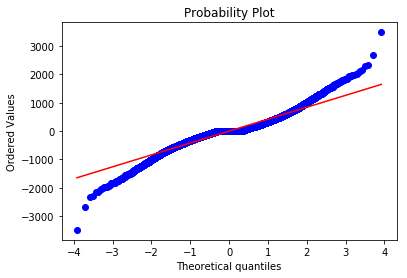

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 3.797


   Support 
Overview of variable:  gdat10 


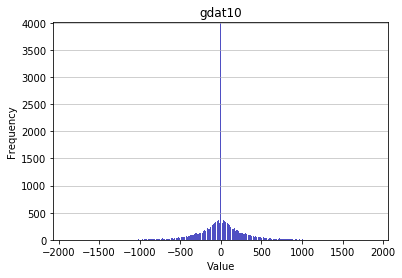

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1877.0
Mean: 0.0
Standard deviation: 269.2708
Median: 0.0
Maximal value: 1877.0


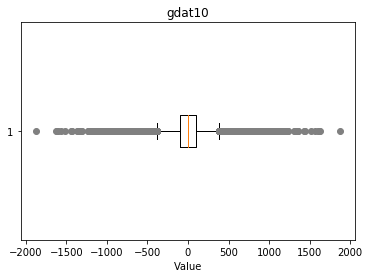

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1021.0, -1015.0, 1034.0, 1035.0, -1012.0, -1014.0, 1038.0, 1039.0, -1010.0, -1006.0, -1004.0, -1003.0, 1047.0, -1512.0, -996.0, -994.0, -993.0, -992.0, 1569.0, 1054.0, 1060.0, 1061.0, -984.0, -981.0, -976.0, -975.0, 1079.0, -968.0, 1080.0, -967.0, -962.0, -961.0, 1088.0, -959.0, 1093.0, 1605.0, -951.0, -950.0, -946.0, 1614.0, 1105.0, 1106.0, -942.0, 1107.0, -941.0, 1109.0, -939.0, -936.0, 1625.0, -937.0, -940.0, -930.0, -928.0, -1439.0, -926.0, 1123.0, 1128.0, -919.0, -918.0, -1432.0, -916.0, -915.0, -912.0, -911.0, -905.0, -903.0, -895.0, 1156.0, -886.0, -885.0, -882.0, 1168.0, -879.0, -876.0, -875.0, -873.0, 1177.0, -871.0, -867.0, 1182.0, -865.0, -866.0, -862.0, -861.0, -859.0, -857.0, -856.0, -1877.0, -852.0, -1363.0, -849.0, 1201.0, -1359.0, -845.0, -841.0, -840.0, 1209.0, -838.0, -839.0, 1212.0, -835.0, 1214.0, -833.0, -832.0, -831.0, -830.0, -1348.0, -827.0, -820.0, 1229.0, 1228.0, -815.0, -814.0,

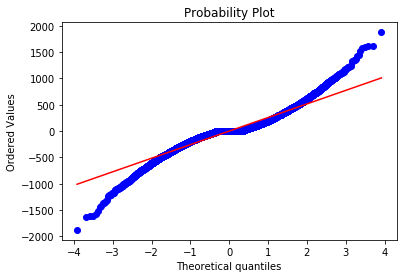

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 4.1108


   Top 
Overview of variable:  goldat15 


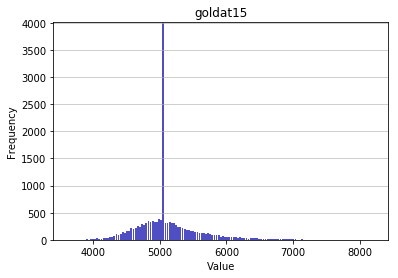

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3633.0
Mean: 5112.5432
Standard deviation: 463.8297
Median: 5056.0
Maximal value: 8200.0


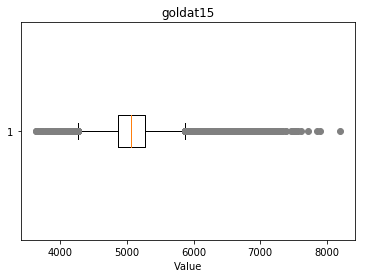

-------------------- 
Outlier detection:
 --------------------
List of outliers: {6658.0, 6660.0, 6662.0, 6664.0, 8200.0, 6666.0, 6671.0, 6672.0, 6673.0, 7191.0, 7713.0, 6690.0, 6692.0, 6693.0, 6695.0, 6697.0, 6698.0, 7209.0, 7217.0, 3634.0, 6707.0, 7219.0, 3633.0, 6710.0, 6705.0, 6715.0, 6716.0, 6717.0, 6719.0, 7236.0, 7243.0, 6734.0, 6736.0, 3669.0, 6742.0, 6743.0, 6751.0, 7265.0, 6754.0, 7268.0, 6758.0, 7271.0, 6761.0, 6764.0, 6765.0, 3695.0, 6774.0, 6775.0, 6777.0, 6778.0, 6782.0, 7297.0, 6788.0, 6792.0, 6796.0, 7309.0, 6798.0, 7311.0, 6800.0, 7313.0, 7316.0, 6806.0, 6808.0, 6809.0, 6813.0, 7327.0, 6816.0, 6821.0, 6823.0, 6829.0, 7857.0, 6834.0, 6837.0, 6843.0, 6847.0, 6848.0, 6856.0, 6857.0, 6863.0, 6864.0, 7378.0, 6868.0, 6870.0, 7898.0, 6875.0, 6876.0, 7387.0, 6885.0, 6888.0, 6894.0, 6895.0, 6899.0, 6903.0, 6904.0, 6912.0, 6913.0, 6919.0, 6921.0, 6924.0, 6930.0, 6932.0, 6945.0, 7462.0, 6954.0, 6960.0, 6962.0, 6965.0, 7486.0, 6978.0, 7491.0, 6983.0, 6986.0, 7505.0, 6997.0, 6999.0

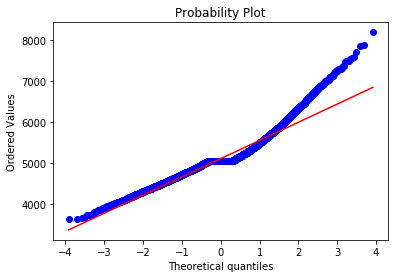

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1155
Kurtosis: 2.9131


   Middle 
Overview of variable:  goldat15 


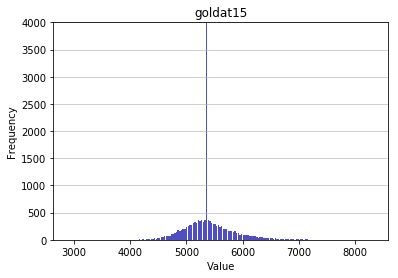

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2906.0
Mean: 5396.4831
Standard deviation: 435.0303
Median: 5358.0
Maximal value: 8322.0


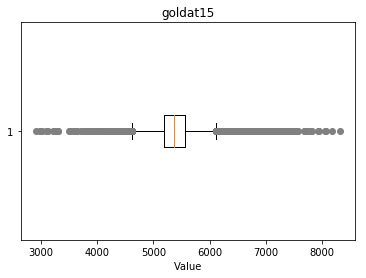

-------------------- 
Outlier detection:
 --------------------
List of outliers: {7172.0, 3589.0, 7182.0, 7184.0, 7191.0, 3096.0, 7705.0, 7706.0, 3614.0, 7203.0, 7208.0, 7212.0, 3629.0, 6702.0, 6704.0, 3632.0, 6706.0, 3123.0, 6708.0, 7220.0, 7224.0, 6712.0, 6713.0, 6715.0, 6716.0, 3645.0, 7738.0, 6719.0, 7231.0, 6727.0, 6730.0, 6733.0, 6735.0, 6737.0, 6742.0, 6743.0, 6746.0, 6747.0, 6748.0, 6751.0, 6752.0, 7264.0, 6756.0, 7783.0, 6759.0, 6762.0, 6767.0, 6768.0, 7284.0, 6773.0, 3702.0, 6775.0, 7289.0, 6780.0, 6781.0, 7292.0, 6784.0, 8322.0, 6788.0, 6795.0, 3214.0, 7825.0, 6801.0, 3732.0, 6806.0, 6809.0, 6810.0, 7327.0, 6816.0, 6817.0, 7328.0, 3236.0, 6833.0, 7346.0, 6835.0, 6834.0, 6837.0, 6838.0, 3257.0, 6844.0, 6846.0, 6847.0, 6848.0, 7359.0, 6850.0, 3263.0, 6851.0, 7366.0, 6855.0, 6854.0, 3789.0, 6862.0, 3791.0, 6867.0, 6870.0, 3801.0, 7385.0, 3805.0, 3294.0, 6880.0, 6881.0, 6884.0, 6887.0, 6889.0, 3305.0, 6891.0, 6892.0, 3821.0, 6893.0, 7407.0, 6895.0, 6900.0, 7413.0, 6902.0, 6903.0

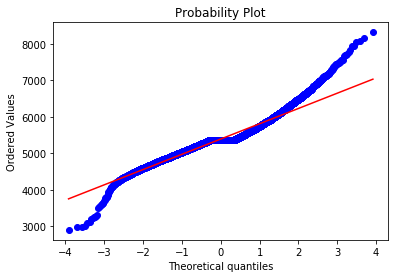

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.7726
Kurtosis: 3.5381


   Jungle 
Overview of variable:  goldat15 


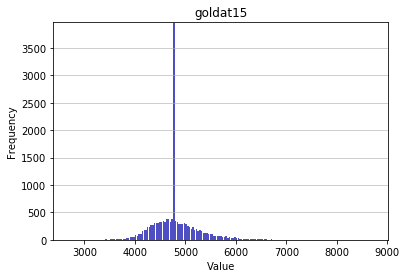

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2687.0
Mean: 4804.1736
Standard deviation: 460.8437
Median: 4756.0
Maximal value: 8720.0


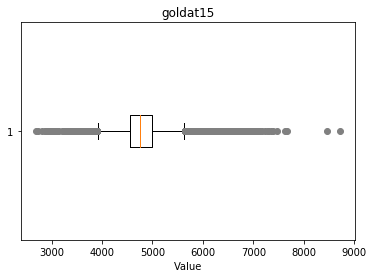

-------------------- 
Outlier detection:
 --------------------
List of outliers: {6661.0, 7179.0, 8720.0, 3101.0, 6689.0, 6693.0, 6699.0, 6187.0, 6190.0, 6191.0, 6703.0, 3124.0, 6197.0, 6711.0, 6200.0, 6201.0, 6203.0, 6204.0, 7229.0, 6205.0, 3131.0, 6208.0, 6209.0, 6212.0, 6214.0, 6729.0, 6218.0, 6219.0, 6220.0, 6221.0, 6222.0, 6224.0, 6736.0, 6225.0, 6231.0, 6234.0, 6235.0, 6237.0, 6238.0, 6241.0, 6246.0, 6247.0, 6249.0, 6253.0, 6257.0, 6262.0, 6264.0, 6265.0, 6267.0, 7292.0, 7291.0, 6779.0, 2687.0, 6272.0, 6270.0, 6268.0, 6273.0, 6793.0, 6282.0, 6283.0, 6285.0, 3216.0, 6289.0, 6291.0, 6297.0, 6301.0, 6303.0, 6306.0, 3238.0, 6823.0, 6313.0, 6315.0, 2732.0, 3245.0, 6827.0, 6322.0, 7349.0, 6326.0, 6327.0, 3256.0, 6331.0, 3259.0, 6334.0, 6338.0, 6340.0, 6343.0, 6348.0, 6349.0, 6352.0, 3283.0, 6356.0, 6359.0, 7390.0, 6367.0, 6879.0, 6370.0, 6883.0, 6887.0, 3304.0, 6377.0, 6386.0, 3325.0, 6399.0, 6400.0, 6401.0, 2818.0, 3328.0, 6405.0, 6918.0, 6407.0, 6412.0, 6413.0, 6927.0, 6415.0, 8465.0

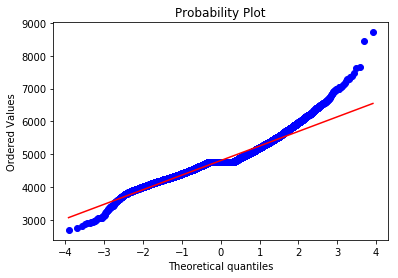

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.9155
Kurtosis: 3.3007


   ADC 
Overview of variable:  goldat15 


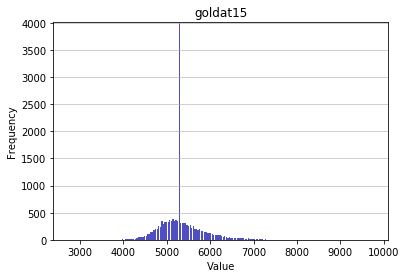

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2738.0
Mean: 5341.8305
Standard deviation: 496.2491
Median: 5281.5
Maximal value: 9756.0


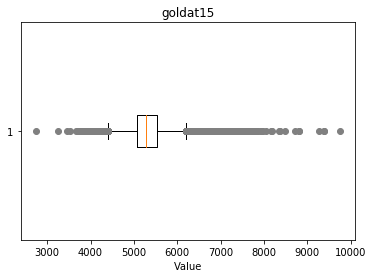

-------------------- 
Outlier detection:
 --------------------
List of outliers: {7169.0, 7683.0, 7171.0, 8710.0, 7692.0, 7694.0, 7184.0, 7188.0, 7189.0, 7191.0, 7192.0, 9756.0, 7197.0, 7198.0, 7725.0, 7214.0, 7219.0, 7220.0, 9274.0, 7234.0, 7236.0, 7247.0, 7762.0, 7250.0, 3672.0, 7257.0, 8799.0, 7264.0, 7269.0, 7270.0, 7274.0, 8810.0, 7283.0, 7796.0, 7284.0, 3702.0, 3703.0, 7800.0, 7292.0, 7294.0, 7296.0, 7821.0, 7316.0, 7835.0, 9379.0, 8357.0, 9383.0, 7338.0, 8368.0, 6833.0, 2738.0, 6832.0, 3254.0, 3767.0, 7867.0, 7355.0, 6845.0, 6848.0, 7360.0, 6852.0, 6853.0, 6854.0, 3782.0, 3784.0, 6860.0, 6861.0, 6863.0, 6865.0, 6869.0, 6870.0, 6871.0, 6872.0, 6875.0, 6876.0, 3804.0, 6878.0, 7391.0, 6880.0, 6882.0, 7394.0, 6885.0, 6886.0, 6891.0, 6892.0, 7920.0, 6896.0, 6904.0, 6905.0, 6907.0, 7932.0, 7425.0, 6914.0, 6916.0, 7428.0, 6920.0, 6921.0, 6924.0, 6925.0, 6926.0, 7436.0, 6930.0, 6933.0, 6935.0, 6941.0, 6942.0, 6943.0, 7457.0, 8486.0, 6958.0, 7983.0, 6964.0, 6969.0, 6974.0, 6977.0, 6978.0

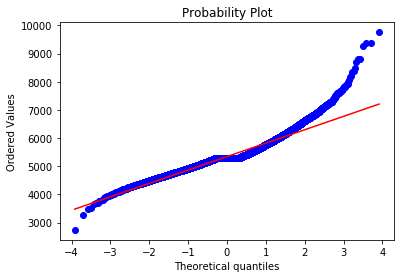

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1643
Kurtosis: 4.13


   Support 
Overview of variable:  goldat15 


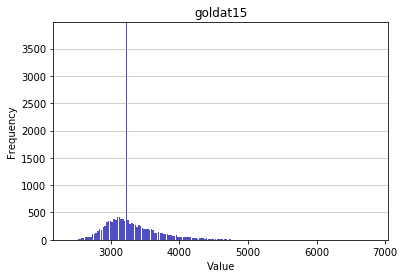

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2388.0
Mean: 3300.2079
Standard deviation: 361.3673
Median: 3239.0
Maximal value: 6825.0


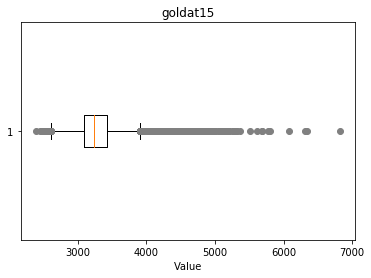

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4608.0, 5122.0, 4612.0, 4616.0, 4619.0, 5135.0, 4624.0, 5139.0, 4628.0, 4631.0, 4633.0, 4634.0, 4635.0, 4637.0, 4638.0, 5157.0, 4647.0, 4648.0, 4649.0, 4651.0, 5165.0, 4655.0, 4657.0, 4659.0, 5683.0, 5686.0, 4663.0, 4664.0, 4667.0, 5179.0, 4670.0, 5183.0, 4672.0, 5185.0, 5187.0, 4676.0, 4677.0, 4680.0, 4681.0, 4689.0, 5203.0, 4694.0, 4695.0, 4706.0, 4716.0, 4719.0, 4735.0, 4736.0, 5251.0, 4742.0, 4743.0, 4744.0, 4745.0, 4752.0, 5777.0, 5267.0, 6306.0, 5285.0, 4775.0, 4776.0, 6825.0, 5804.0, 5295.0, 4787.0, 5309.0, 5311.0, 6339.0, 5317.0, 4812.0, 4824.0, 4828.0, 4840.0, 4841.0, 4855.0, 4856.0, 5371.0, 4864.0, 4872.0, 4874.0, 4879.0, 4883.0, 4893.0, 4385.0, 4387.0, 4388.0, 4389.0, 4391.0, 4393.0, 4394.0, 4395.0, 4396.0, 4397.0, 4398.0, 4399.0, 4400.0, 4401.0, 4404.0, 4406.0, 4407.0, 4920.0, 4409.0, 4408.0, 4411.0, 4412.0, 4413.0, 4410.0, 4417.0, 4419.0, 4420.0, 4421.0, 4422.0, 4936.0, 4426.0, 4427.0, 4429.0

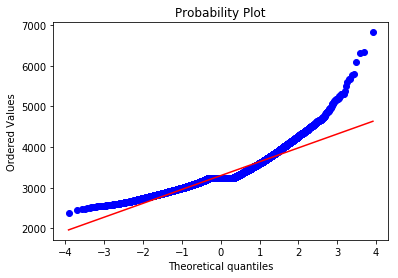

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.5333
Kurtosis: 4.7763


   Top 
Overview of variable:  gdat15 


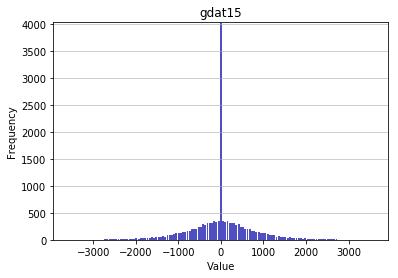

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3579.0
Mean: 0.0
Standard deviation: 756.7048
Median: 0.0
Maximal value: 3579.0


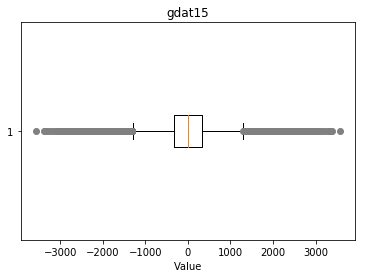

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-3579.0, -3065.0, 3081.0, 2569.0, 2573.0, -2546.0, 3088.0, 2578.0, -2538.0, -2536.0, -2532.0, 2589.0, -3042.0, -2531.0, -2526.0, 2597.0, 2609.0, -2510.0, 2612.0, -2502.0, -3011.0, -2494.0, -2493.0, 3141.0, -2488.0, 2633.0, -2998.0, -2483.0, 2638.0, 2639.0, -2985.0, -2981.0, -2980.0, -2467.0, 2654.0, -2465.0, -2463.0, 2661.0, -2458.0, -2455.0, 2665.0, 2669.0, 2673.0, -2957.0, 2686.0, -2431.0, 2691.0, 2694.0, -2424.0, -2933.0, -2421.0, 3219.0, -2412.0, 2707.0, -2399.0, 2721.0, 2723.0, -2392.0, -2901.0, 2736.0, -2383.0, -2382.0, -2895.0, 2748.0, -2360.0, 2762.0, -2356.0, -2354.0, -3376.0, -2351.0, -2350.0, 2773.0, -2347.0, -3371.0, -2346.0, 3290.0, -2339.0, -2337.0, -2336.0, 2274.0, 2276.0, 2281.0, 2793.0, 2283.0, -2836.0, -3346.0, 2287.0, -2321.0, -2316.0, 2295.0, 2808.0, 2296.0, 2300.0, -2819.0, 2301.0, 2303.0, -2303.0, -2301.0, 2819.0, -2300.0, -2296.0, -2295.0, -2808.0, 2316.0, -2287.0, 2321.0, 3346.0, 2

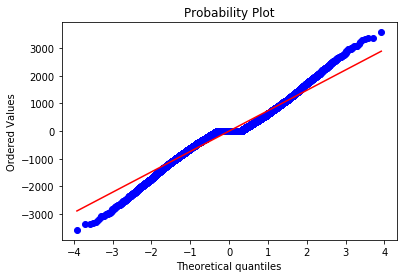

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.9584


   Middle 
Overview of variable:  gdat15 


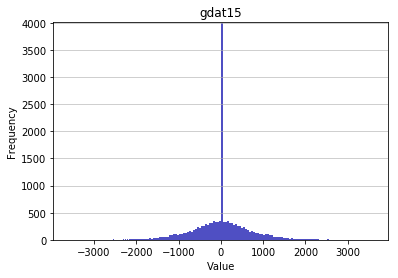

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3601.0
Mean: 0.0
Standard deviation: 677.3374
Median: 0.0
Maximal value: 3601.0


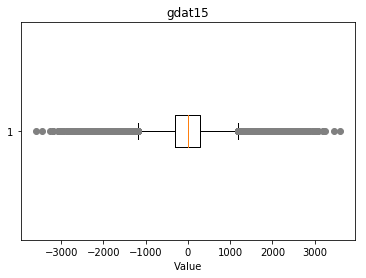

-------------------- 
Outlier detection:
 --------------------
List of outliers: {2048.0, -2048.0, 2050.0, -2045.0, 2561.0, -2554.0, 3080.0, 2569.0, -2039.0, -2037.0, -2036.0, 2061.0, 2571.0, -2033.0, 3087.0, 3601.0, 2066.0, 2065.0, 2580.0, 2039.0, 2068.0, -2536.0, 2075.0, -2532.0, 2078.0, -3038.0, 2085.0, 2086.0, -2517.0, -2513.0, -2496.0, -3005.0, 2116.0, -2492.0, 2119.0, -2999.0, 2125.0, 2637.0, 2129.0, 2133.0, 2134.0, 2647.0, 2136.0, 2137.0, -2982.0, -2464.0, -2458.0, 2153.0, -2449.0, 2160.0, -2955.0, -2952.0, 2170.0, 2172.0, 2175.0, 3199.0, 2177.0, 2178.0, 2179.0, 3204.0, 2182.0, -2426.0, -3449.0, -2419.0, 2705.0, 2198.0, -2402.0, 2719.0, 2722.0, -2397.0, 2210.0, 2216.0, 2218.0, 2219.0, 2221.0, -2382.0, 2227.0, -2892.0, 3254.0, 2233.0, -2374.0, 2234.0, 2240.0, 2241.0, -2366.0, 2253.0, -2865.0, -2343.0, 2266.0, 2273.0, 2274.0, 2786.0, 2275.0, -2841.0, 2284.0, -2322.0, -2320.0, 2801.0, -2315.0, -2821.0, -2306.0, 2303.0, 2302.0, -2303.0, 2306.0, -2302.0, 2821.0, 2315.0, -2801.0, 2320

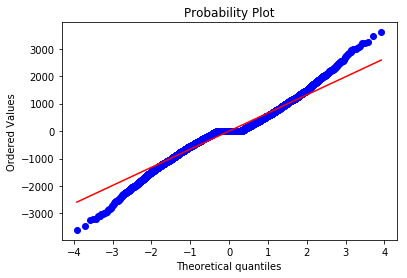

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.2861


   Jungle 
Overview of variable:  gdat15 


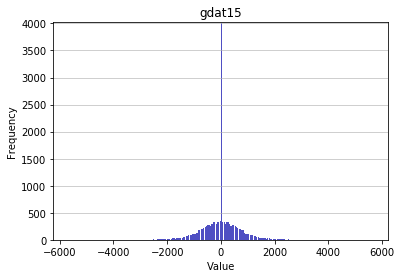

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5672.0
Mean: 0.0
Standard deviation: 687.62
Median: 0.0
Maximal value: 5672.0


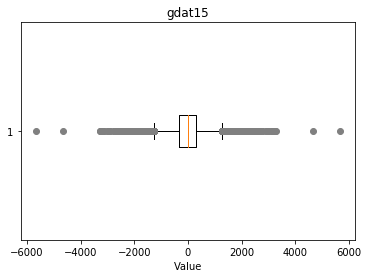

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-2553.0, 2567.0, 2063.0, 2064.0, 2582.0, 2071.0, 2587.0, 2076.0, 2597.0, -2520.0, 5672.0, 2090.0, -3029.0, -2516.0, 2093.0, 4650.0, 2091.0, 2096.0, 3117.0, -2518.0, 2099.0, 2108.0, -2500.0, -2498.0, 2112.0, 2113.0, 2627.0, 2117.0, 2118.0, 2119.0, -2491.0, 2121.0, -2485.0, 2123.0, 3149.0, 2126.0, -2992.0, 2129.0, 3154.0, 2135.0, -2472.0, -2466.0, 2655.0, -2463.0, 2145.0, 2149.0, 2152.0, 2160.0, 2161.0, -2955.0, 2166.0, 2167.0, 2168.0, 2171.0, 2172.0, 2185.0, -2421.0, 2189.0, 2190.0, -2929.0, 2196.0, 3221.0, 2201.0, -2918.0, 2210.0, 2212.0, 2730.0, 2221.0, 2232.0, 2234.0, -2373.0, 2236.0, 3262.0, -2369.0, -2367.0, -2366.0, -2361.0, 3274.0, -2355.0, 2255.0, -2351.0, 2258.0, 2261.0, 2264.0, 2266.0, -2342.0, -2338.0, -2336.0, 2789.0, 2277.0, 2284.0, -2321.0, -2314.0, 2298.0, -2308.0, -2305.0, 2304.0, 2305.0, -2304.0, 2308.0, -2298.0, 2314.0, 2321.0, -2284.0, -2789.0, -2277.0, 2336.0, 2338.0, -2266.0, 2342.0, -

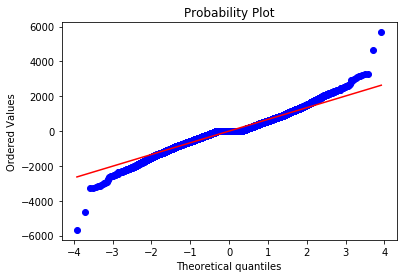

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.6295


   ADC 
Overview of variable:  gdat15 


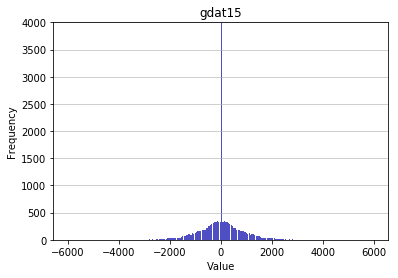

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5972.0
Mean: 0.0
Standard deviation: 795.0756
Median: 0.0
Maximal value: 5972.0


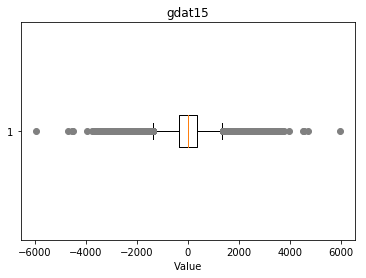

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-2559.0, -2556.0, 2566.0, -2548.0, -2547.0, -2546.0, -3057.0, 2577.0, -2539.0, -3048.0, -2535.0, -3556.0, -3042.0, -2529.0, -2526.0, 2602.0, 2610.0, -2508.0, 2613.0, -2499.0, -2494.0, -3005.0, 2626.0, 3651.0, -4536.0, 3658.0, 2639.0, -2474.0, 2647.0, -2472.0, -2466.0, -4514.0, 3168.0, -2975.0, 3166.0, -3480.0, 4714.0, -2451.0, -2448.0, -2447.0, 2672.0, 3699.0, 2682.0, -2437.0, 2685.0, -3970.0, -2433.0, -3457.0, -2431.0, -2430.0, 2691.0, -2425.0, -2424.0, 2700.0, 2702.0, -2414.0, -2924.0, 2709.0, -2412.0, 2714.0, -2403.0, -2402.0, -3426.0, 2722.0, 2727.0, 3756.0, 2733.0, -5972.0, 3262.0, 2750.0, -2870.0, -3376.0, 3293.0, 2782.0, 2787.0, -3357.0, 2793.0, -2838.0, -2837.0, -2833.0, 2804.0, -2827.0, -2816.0, 2816.0, 2827.0, -2804.0, 2833.0, 2837.0, 2838.0, -2793.0, -2787.0, 3357.0, -2782.0, -3293.0, 3376.0, 2870.0, -3262.0, -2750.0, -2733.0, -3756.0, 5972.0, -2727.0, -2722.0, 3426.0, 2402.0, 2403.0, -2714.0, 

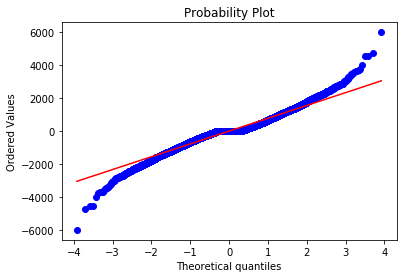

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.5753


   Support 
Overview of variable:  gdat15 


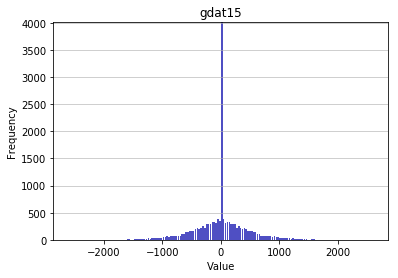

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2609.0
Mean: 0.0
Standard deviation: 466.8111
Median: 0.0
Maximal value: 2609.0


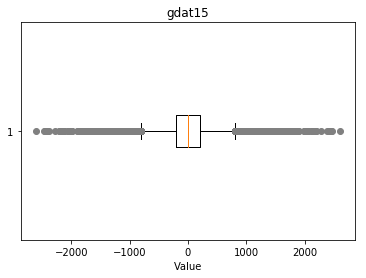

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1534.0, -1532.0, -2043.0, -1530.0, 1547.0, 1548.0, 2061.0, 2063.0, -1520.0, -1519.0, 1557.0, 1564.0, 1565.0, -1502.0, -1498.0, 1576.0, 1582.0, 1584.0, 1585.0, -1998.0, -1485.0, 2609.0, -1481.0, 1594.0, -1989.0, -1477.0, 2111.0, 1600.0, -1471.0, -1467.0, -1465.0, -1462.0, 1616.0, -1455.0, -1452.0, -1451.0, -2475.0, 2134.0, -1448.0, 2137.0, -1446.0, -1444.0, -1442.0, -1441.0, -1435.0, -1434.0, -1433.0, 1637.0, -1431.0, -1430.0, -2452.0, -1428.0, -1424.0, 1649.0, -1419.0, -1416.0, -1415.0, -1414.0, -1412.0, -2436.0, -1410.0, -1408.0, 1665.0, -1403.0, -1402.0, 1670.0, -1911.0, 2191.0, 1680.0, 1681.0, -2410.0, 2201.0, 2203.0, 1694.0, 1699.0, -1880.0, 1710.0, -2385.0, 1718.0, 1720.0, 1726.0, 1735.0, -1846.0, -1839.0, -1827.0, 1758.0, -1824.0, 1761.0, -1815.0, 2286.0, 1781.0, 1785.0, -1785.0, -1781.0, -2286.0, 1815.0, -1761.0, 1824.0, -1758.0, 1827.0, 1839.0, 1846.0, -1735.0, -1726.0, -1720.0, -1718.0, 2385.0, 

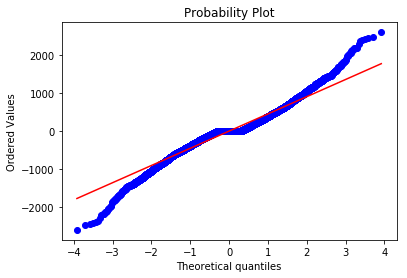

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.5481


   Top 
Overview of variable:  xpat10 


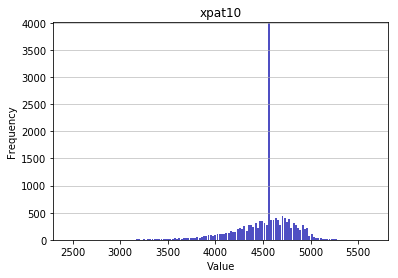

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2457.0
Mean: 4512.8769
Standard deviation: 305.3689
Median: 4552.0
Maximal value: 5658.0


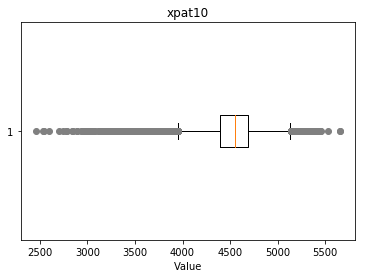

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3584.0, 3588.0, 3589.0, 3591.0, 3592.0, 3593.0, 3079.0, 3596.0, 5653.0, 5658.0, 2600.0, 3113.0, 3126.0, 3131.0, 3135.0, 3163.0, 3167.0, 3169.0, 3170.0, 3177.0, 3182.0, 3184.0, 3199.0, 3201.0, 3202.0, 3203.0, 3208.0, 2702.0, 3219.0, 3234.0, 3245.0, 3251.0, 3252.0, 3255.0, 3257.0, 2748.0, 3276.0, 3282.0, 3283.0, 3285.0, 3289.0, 2778.0, 2782.0, 3297.0, 3300.0, 3308.0, 3311.0, 3315.0, 3325.0, 3331.0, 3332.0, 3334.0, 3338.0, 3340.0, 3341.0, 3342.0, 3345.0, 3346.0, 3349.0, 2840.0, 3352.0, 3359.0, 2849.0, 3361.0, 3363.0, 3368.0, 3370.0, 3371.0, 3372.0, 3373.0, 3374.0, 3375.0, 3376.0, 3378.0, 3384.0, 3388.0, 3395.0, 3397.0, 2888.0, 3400.0, 3403.0, 5451.0, 3405.0, 2895.0, 3407.0, 5457.0, 3412.0, 3416.0, 3418.0, 3421.0, 3423.0, 3426.0, 3428.0, 3429.0, 3439.0, 3440.0, 2928.0, 3443.0, 3444.0, 3446.0, 3447.0, 3448.0, 3450.0, 2938.0, 3452.0, 3459.0, 3466.0, 3467.0, 2955.0, 3475.0, 3477.0, 3478.0, 2457.0, 3481.0, 3483.0

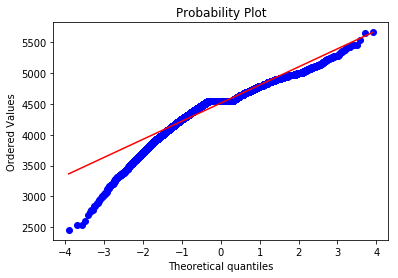

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.1765
Kurtosis: 3.0505


   Middle 
Overview of variable:  xpat10 


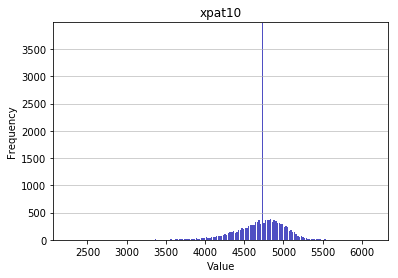

-------------------- 
Summary statistics:
 --------------------
Minimum value: 2259.0
Mean: 4707.4999
Standard deviation: 295.3207
Median: 4739.0
Maximal value: 6146.0


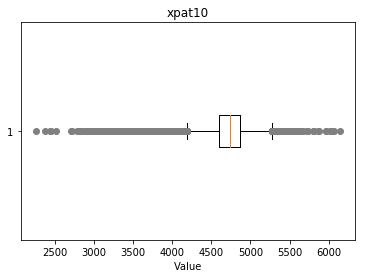

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3585.0, 6146.0, 5636.0, 3081.0, 3596.0, 3606.0, 3096.0, 3609.0, 3100.0, 3102.0, 3616.0, 5666.0, 3108.0, 3622.0, 3623.0, 3626.0, 3632.0, 3125.0, 3641.0, 3644.0, 3650.0, 3651.0, 3655.0, 3656.0, 3146.0, 3659.0, 3665.0, 3156.0, 3668.0, 3670.0, 3673.0, 3675.0, 3676.0, 5726.0, 5728.0, 5729.0, 3171.0, 3684.0, 3685.0, 3683.0, 3687.0, 3693.0, 3694.0, 3695.0, 3702.0, 3190.0, 3704.0, 3705.0, 3706.0, 3708.0, 3710.0, 3713.0, 3715.0, 3717.0, 3720.0, 3723.0, 3724.0, 3726.0, 3727.0, 3215.0, 2704.0, 3730.0, 3731.0, 3733.0, 3738.0, 3741.0, 3742.0, 3743.0, 3744.0, 2721.0, 3746.0, 5794.0, 3753.0, 3756.0, 3757.0, 3758.0, 3760.0, 3761.0, 3251.0, 3763.0, 3765.0, 3766.0, 5813.0, 3768.0, 3770.0, 3771.0, 3772.0, 3773.0, 3774.0, 3775.0, 3776.0, 3781.0, 3782.0, 3783.0, 3784.0, 3786.0, 3787.0, 3789.0, 3278.0, 3792.0, 3281.0, 3282.0, 3795.0, 2259.0, 3797.0, 3799.0, 3800.0, 3801.0, 3288.0, 3803.0, 3804.0, 3292.0, 3805.0, 2781.0, 3299.0

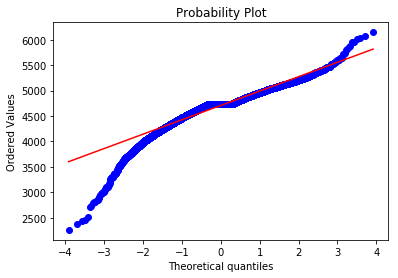

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.2308
Kurtosis: 4.9942


   Jungle 
Overview of variable:  xpat10 


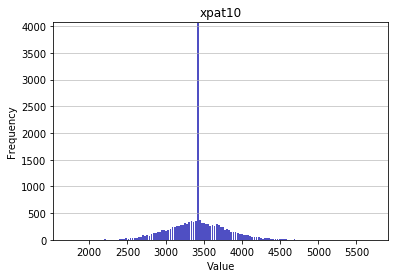

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1728.0
Mean: 3423.324
Standard deviation: 352.684
Median: 3417.0
Maximal value: 5719.0


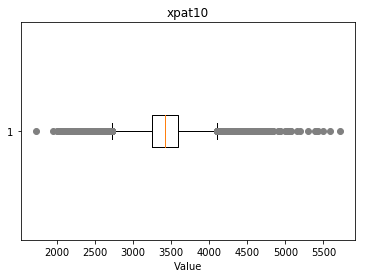

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4609.0, 4610.0, 2049.0, 4616.0, 2063.0, 4624.0, 2067.0, 4631.0, 2074.0, 4639.0, 4640.0, 5155.0, 2086.0, 2099.0, 4665.0, 4667.0, 4675.0, 2117.0, 4681.0, 4683.0, 5197.0, 2126.0, 4687.0, 5719.0, 4697.0, 4700.0, 2143.0, 4705.0, 2163.0, 4729.0, 2174.0, 4739.0, 4741.0, 2190.0, 2198.0, 2207.0, 4769.0, 4771.0, 2214.0, 2216.0, 2219.0, 5292.0, 4789.0, 2230.0, 4793.0, 2234.0, 2236.0, 4799.0, 1728.0, 4801.0, 2249.0, 2251.0, 4820.0, 2270.0, 4838.0, 4839.0, 2287.0, 2295.0, 2298.0, 2301.0, 2323.0, 5395.0, 5402.0, 2337.0, 2348.0, 4910.0, 2353.0, 5432.0, 2361.0, 2364.0, 4928.0, 4929.0, 5500.0, 4482.0, 4483.0, 4485.0, 4486.0, 4999.0, 4488.0, 4489.0, 4490.0, 4492.0, 4500.0, 4502.0, 4503.0, 4505.0, 4506.0, 4511.0, 4513.0, 5026.0, 4514.0, 4516.0, 1960.0, 5040.0, 4531.0, 4532.0, 4534.0, 4539.0, 4540.0, 4541.0, 5055.0, 4544.0, 4546.0, 5058.0, 4547.0, 4548.0, 5587.0, 5078.0, 4568.0, 2008.0, 4571.0, 2013.0, 4574.0, 4577.0, 2021.0

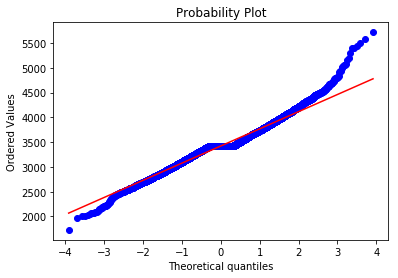

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.2559
Kurtosis: 1.7486


   ADC 
Overview of variable:  xpat10 


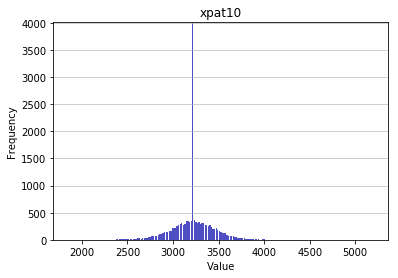

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1853.0
Mean: 3221.43
Standard deviation: 231.77
Median: 3222.0
Maximal value: 5197.0


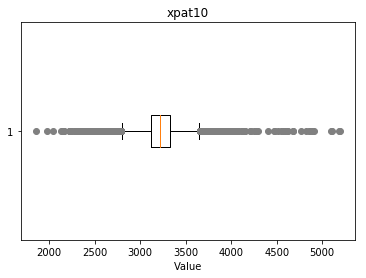

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4610.0, 4621.0, 4122.0, 4124.0, 4127.0, 4128.0, 4144.0, 4154.0, 4157.0, 5181.0, 4681.0, 4684.0, 5197.0, 2128.0, 2462.0, 4203.0, 2157.0, 4212.0, 2165.0, 2168.0, 3997.0, 4246.0, 4764.0, 2213.0, 4270.0, 2225.0, 2230.0, 2240.0, 4294.0, 2249.0, 4822.0, 2283.0, 2286.0, 4854.0, 2298.0, 2302.0, 4864.0, 4884.0, 2327.0, 2330.0, 2333.0, 2334.0, 2344.0, 2350.0, 2352.0, 2355.0, 4915.0, 4409.0, 2365.0, 1853.0, 2368.0, 2369.0, 2370.0, 2373.0, 2375.0, 3919.0, 3922.0, 2387.0, 3925.0, 2392.0, 3928.0, 3929.0, 3932.0, 3933.0, 3934.0, 3935.0, 2400.0, 2401.0, 2397.0, 3937.0, 3940.0, 3942.0, 3943.0, 2408.0, 3945.0, 2406.0, 2411.0, 2415.0, 2419.0, 2420.0, 4467.0, 2422.0, 3959.0, 3962.0, 2430.0, 2432.0, 2433.0, 3969.0, 2435.0, 2436.0, 3972.0, 4484.0, 2440.0, 2442.0, 2444.0, 3980.0, 3985.0, 2449.0, 2451.0, 2453.0, 3989.0, 2455.0, 3992.0, 2457.0, 3994.0, 2459.0, 2460.0, 2461.0, 2458.0, 3995.0, 2464.0, 4001.0, 4002.0, 2466.0, 2468.0

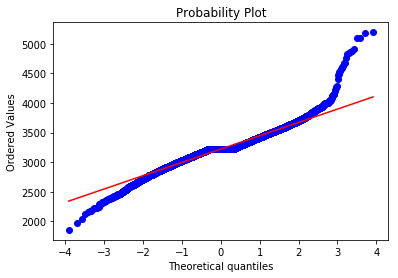

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.2369
Kurtosis: 4.3724


   Support 
Overview of variable:  xpat10 


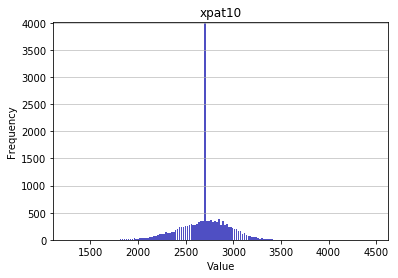

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1270.0
Mean: 2690.3338
Standard deviation: 249.7017
Median: 2705.0
Maximal value: 4469.0


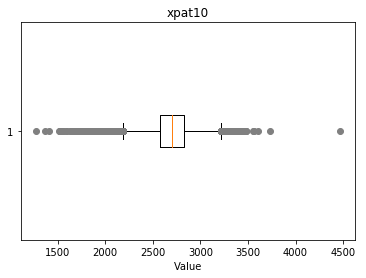

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1551.0, 1553.0, 3604.0, 1588.0, 1598.0, 1631.0, 1641.0, 1644.0, 1653.0, 1664.0, 1670.0, 3729.0, 1690.0, 1702.0, 1720.0, 1728.0, 1746.0, 1761.0, 1763.0, 1773.0, 1270.0, 1783.0, 1790.0, 1793.0, 1804.0, 1806.0, 1810.0, 1813.0, 1816.0, 1817.0, 1818.0, 1819.0, 1822.0, 1824.0, 1826.0, 1831.0, 1833.0, 1834.0, 1835.0, 1838.0, 1839.0, 1843.0, 1844.0, 1845.0, 1847.0, 1850.0, 1851.0, 1853.0, 1855.0, 1859.0, 1863.0, 1864.0, 1869.0, 1872.0, 1873.0, 1874.0, 1877.0, 1366.0, 1879.0, 1880.0, 1878.0, 1882.0, 1881.0, 1883.0, 1884.0, 1887.0, 1888.0, 1892.0, 1893.0, 1895.0, 1897.0, 1903.0, 1904.0, 1906.0, 1907.0, 3443.0, 1909.0, 4469.0, 1913.0, 1914.0, 1916.0, 3454.0, 1919.0, 1920.0, 1921.0, 1413.0, 1927.0, 1928.0, 1929.0, 1930.0, 1931.0, 1932.0, 1933.0, 1934.0, 1937.0, 3473.0, 1939.0, 1940.0, 3479.0, 3482.0, 3552.0, 1512.0, 3566.0, 1523.0, 1524.0, 1532.0}


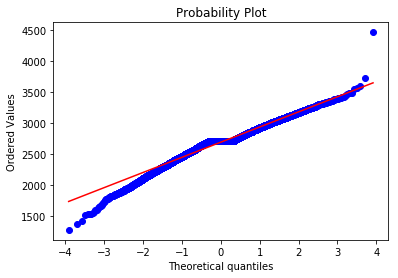

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.4864
Kurtosis: 1.4243


   Top 
Overview of variable:  xpdat10 


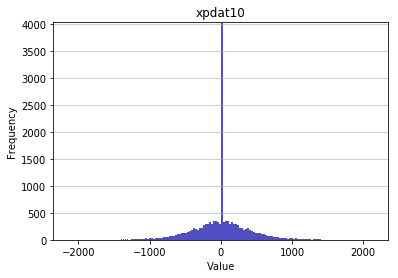

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2140.0
Mean: 0.0
Standard deviation: 399.274
Median: 0.0
Maximal value: 2140.0


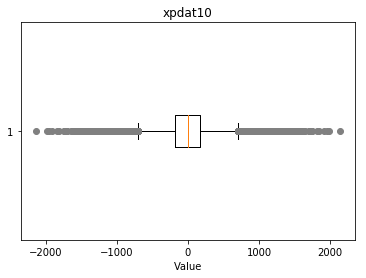

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1536.0, 1536.0, -1534.0, -1525.0, 1549.0, -1521.0, 1552.0, -1520.0, 1560.0, -1505.0, 1567.0, 1229.0, 1578.0, 1580.0, -1490.0, 1584.0, -1486.0, -1479.0, -1478.0, -1989.0, 1600.0, -1462.0, 1620.0, 2140.0, 1630.0, -1952.0, -1439.0, -1429.0, 1645.0, -1425.0, -1422.0, -1420.0, -1411.0, -1407.0, -1406.0, -1405.0, -1911.0, -1389.0, -1385.0, -1383.0, -1373.0, -1369.0, 1703.0, -1366.0, 1707.0, -1365.0, 1198.0, -1361.0, 1201.0, -1355.0, 1205.0, -1352.0, 1209.0, 1212.0, -1348.0, 1724.0, 1215.0, 1727.0, 1217.0, -1343.0, 1221.0, 1222.0, -1336.0, -1335.0, 1226.0, 1227.0, 1740.0, -1334.0, 1230.0, 1231.0, 1232.0, -1328.0, 1233.0, -1837.0, -1324.0, -1323.0, 1238.0, -1321.0, 1749.0, 1241.0, 1237.0, 1243.0, -1315.0, 1247.0, -1313.0, 1253.0, -1306.0, -1816.0, 1258.0, -1296.0, 1264.0, 1267.0, -1291.0, 1269.0, 1276.0, 1277.0, 1279.0, -1279.0, -1277.0, -1276.0, 1291.0, -1269.0, -1267.0, 1296.0, -1264.0, -1258.0, 1816.0, 1306.0

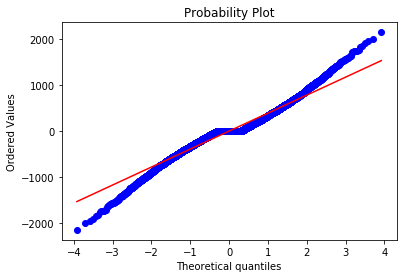

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.2249


   Middle 
Overview of variable:  xpdat10 


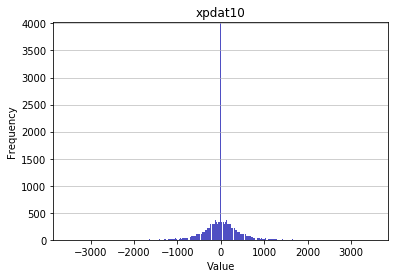

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3506.0
Mean: 0.0
Standard deviation: 384.6571
Median: 0.0
Maximal value: 3506.0


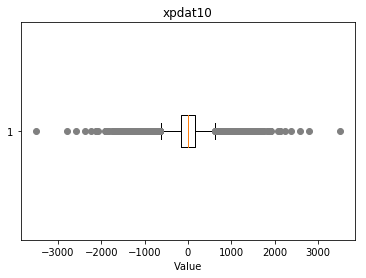

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1538.0, -1533.0, 1542.0, 1543.0, 2571.0, 1550.0, 1567.0, 2080.0, -1491.0, 1586.0, -1484.0, 1603.0, 2116.0, 2123.0, 1613.0, -3506.0, -1454.0, 1619.0, -1448.0, -1446.0, 1629.0, 1633.0, 1635.0, 1636.0, 1638.0, -1424.0, -1423.0, 1655.0, -1414.0, -1412.0, -1410.0, -1196.0, -1405.0, 1156.0, 1158.0, -1401.0, -1400.0, 1161.0, 1160.0, 1673.0, 1166.0, -1905.0, -1390.0, 1683.0, 1174.0, 1177.0, -1382.0, -1893.0, -1380.0, 1179.0, 1689.0, -1895.0, 1184.0, -1375.0, -1887.0, 1188.0, 1189.0, -1884.0, 1192.0, -1368.0, 1194.0, 1707.0, -1364.0, 1708.0, 1704.0, -1367.0, 1200.0, 1201.0, 1202.0, 1196.0, 1197.0, -1355.0, 1203.0, 1207.0, 1208.0, -1865.0, -1859.0, 1214.0, 1215.0, 1727.0, -2369.0, 2242.0, 1219.0, 1220.0, -1338.0, 1227.0, 1228.0, 1233.0, -1326.0, 1235.0, -1836.0, 1237.0, -1323.0, -1320.0, 1752.0, 1242.0, 1244.0, 1246.0, 1247.0, -1822.0, 2787.0, -1302.0, -1301.0, 1262.0, 1263.0, 1264.0, 1266.0, -1294.0, 1271.0, 1272.

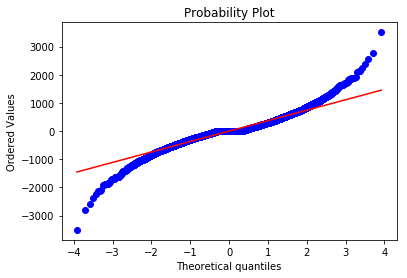

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 4.7037


   Jungle 
Overview of variable:  xpdat10 


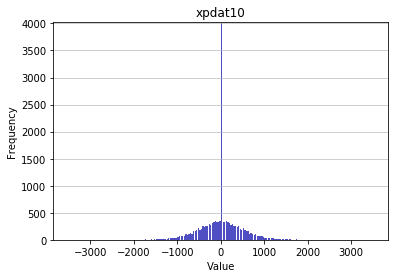

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3505.0
Mean: 0.0
Standard deviation: 469.7294
Median: 0.0
Maximal value: 3505.0


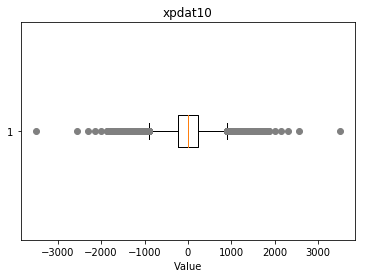

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1537.0, -1529.0, 1544.0, -2553.0, 1529.0, -1519.0, -1517.0, -1513.0, 1569.0, -1497.0, -1494.0, 1580.0, -1490.0, 1583.0, -2000.0, 1586.0, -1486.0, -1482.0, -1481.0, -1479.0, 1599.0, 1603.0, -1468.0, -1462.0, 1615.0, -3505.0, -1454.0, 1622.0, 1623.0, -1446.0, -1445.0, 1627.0, 1629.0, -1444.0, -1440.0, -1436.0, 2150.0, -1432.0, -1428.0, -1425.0, -1424.0, 1649.0, -1422.0, 1647.0, -1420.0, -1419.0, -1413.0, -1410.0, 1673.0, 1675.0, 1678.0, 1690.0, 1695.0, 1707.0, 1715.0, 1718.0, -1860.0, 1726.0, 1728.0, -1853.0, 1744.0, -1837.0, 1750.0, 1752.0, 1778.0, -2305.0, 2305.0, -1778.0, -1752.0, -1750.0, 1837.0, -1744.0, 1853.0, -1728.0, -1726.0, 1860.0, -1718.0, -1715.0, -1707.0, -1695.0, -1690.0, -1678.0, -1675.0, -1673.0, 1410.0, 1413.0, 1419.0, 1420.0, 1422.0, -1649.0, 1424.0, 1425.0, -1647.0, 1428.0, 1432.0, -2150.0, 1436.0, 1440.0, -1629.0, 1444.0, 1445.0, 1446.0, -1627.0, -1623.0, -1622.0, 1454.0, -1615.0, 3505.

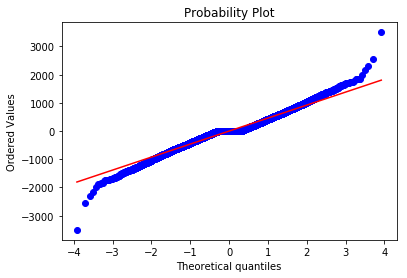

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.7957


   ADC 
Overview of variable:  xpdat10 


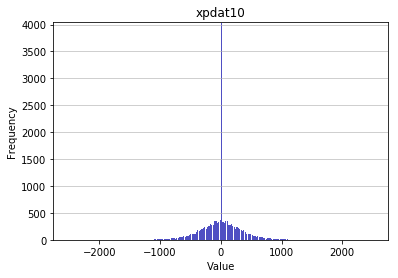

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2508.0
Mean: 0.0
Standard deviation: 322.2219
Median: 0.0
Maximal value: 2508.0


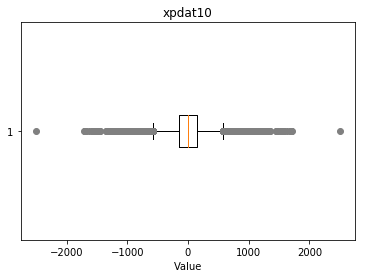

-------------------- 
Outlier detection:
 --------------------
List of outliers: {1025.0, -1022.0, 1539.0, 1028.0, 1029.0, 1031.0, -1017.0, -1014.0, -1013.0, -1011.0, -1010.0, 1037.0, -1520.0, -1005.0, 1044.0, -1003.0, -1001.0, -1000.0, 1049.0, 1052.0, 1565.0, -993.0, 1568.0, -991.0, 1057.0, 1059.0, -988.0, 1061.0, -989.0, -983.0, 1578.0, 1067.0, -980.0, 1069.0, -977.0, 1072.0, 1583.0, -974.0, 1075.0, -972.0, -971.0, -973.0, -969.0, 1080.0, -976.0, 1082.0, -2508.0, 1085.0, -1475.0, 1090.0, 1093.0, 1096.0, 1097.0, -1463.0, 1099.0, -1460.0, 1102.0, 1106.0, 1107.0, 1108.0, -1449.0, 1112.0, 1113.0, 1625.0, -1443.0, 1141.0, 1143.0, 1144.0, 1146.0, 1681.0, 1691.0, 1694.0, 1192.0, 1195.0, 1711.0, 1203.0, -1355.0, 1207.0, -1352.0, 1227.0, -1325.0, 1243.0, 1248.0, -1303.0, -1302.0, 1265.0, -1265.0, 1302.0, 1303.0, -1248.0, -1243.0, 1325.0, -1227.0, 1352.0, -1207.0, 2508.0, 1355.0, -1203.0, -1711.0, -1195.0, -1192.0, -1694.0, -1691.0, -1681.0, -1146.0, -1144.0, -1143.0, -1141.0, 1443.0, -1113.0,

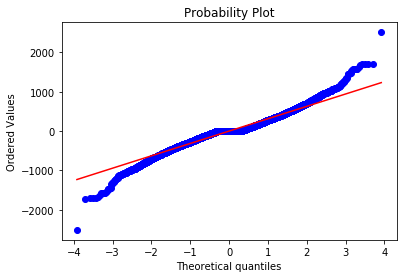

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.8883


   Support 
Overview of variable:  xpdat10 


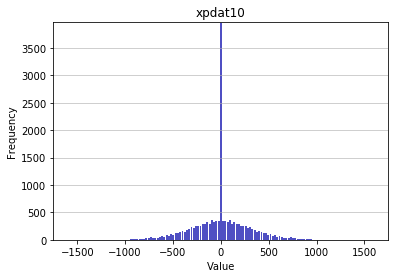

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1591.0
Mean: 0.0
Standard deviation: 299.176
Median: 0.0
Maximal value: 1591.0


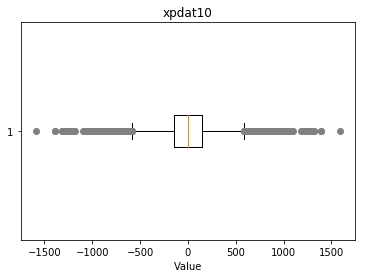

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-1021.0, 1030.0, -1016.0, 1033.0, -1011.0, 1039.0, 1044.0, -1003.0, 1045.0, -1002.0, -999.0, -997.0, -995.0, -992.0, -989.0, -973.0, 1077.0, 1591.0, -959.0, 1090.0, -958.0, 1093.0, -953.0, -946.0, -942.0, -941.0, -940.0, -939.0, -936.0, -928.0, -925.0, -922.0, -921.0, -920.0, -918.0, -916.0, -913.0, -911.0, -910.0, -909.0, -907.0, -906.0, -905.0, -903.0, -1395.0, -1391.0, 1177.0, 1190.0, 1226.0, -1319.0, 1243.0, -1315.0, 1268.0, -1290.0, 1278.0, -1278.0, 1290.0, -1268.0, 1315.0, -1243.0, 1319.0, -1226.0, -1190.0, -1177.0, 1391.0, 1395.0, 903.0, 905.0, 906.0, 907.0, 909.0, 910.0, 911.0, 913.0, 916.0, 918.0, 920.0, 921.0, 922.0, 925.0, 928.0, 936.0, 939.0, 940.0, 941.0, 942.0, 946.0, 953.0, -1093.0, -1090.0, 959.0, 958.0, -1591.0, -1077.0, 973.0, 989.0, 992.0, 995.0, 997.0, 999.0, 1002.0, 1003.0, -1045.0, -1044.0, -1039.0, 1011.0, -1033.0, 1016.0, -1030.0, 1021.0}


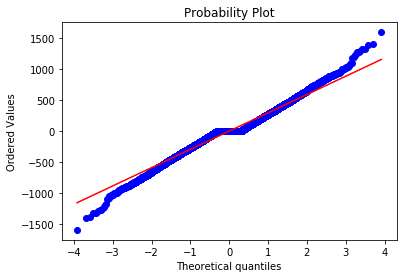

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.3338


   Top 
Overview of variable:  csat10 


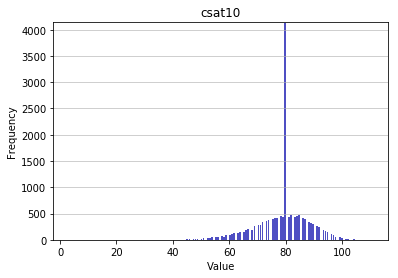

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3.0
Mean: 78.9384
Standard deviation: 9.3184
Median: 80.0
Maximal value: 111.0


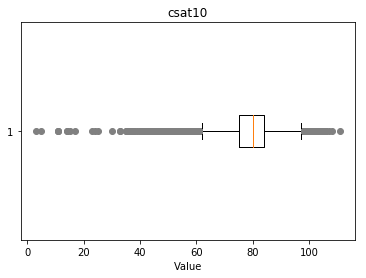

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 5.0, 11.0, 14.0, 15.0, 17.0, 23.0, 24.0, 25.0, 30.0, 33.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 107.0, 108.0, 111.0}


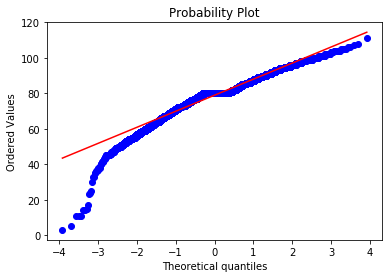

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.8814
Kurtosis: 2.9388


   Middle 
Overview of variable:  csat10 


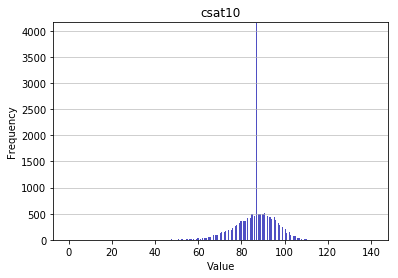

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 86.4484
Standard deviation: 9.3108
Median: 87.0
Maximal value: 141.0


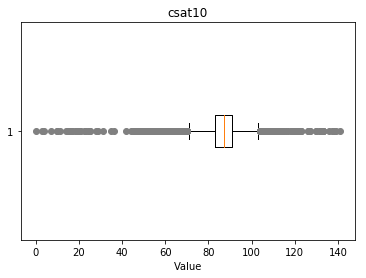

-------------------- 
Outlier detection:
 --------------------
List of outliers: {0.0, 130.0, 131.0, 4.0, 132.0, 133.0, 7.0, 136.0, 137.0, 10.0, 139.0, 138.0, 141.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 3.0, 21.0, 23.0, 24.0, 25.0, 28.0, 29.0, 31.0, 35.0, 36.0, 42.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 11.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 126.0, 127.0}


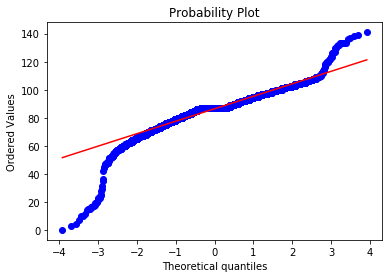

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.1263
Kurtosis: 7.598


   Jungle 
Overview of variable:  csat10 


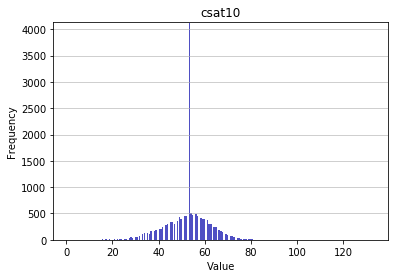

-------------------- 
Summary statistics:
 --------------------
Minimum value: 1.0
Mean: 52.3426
Standard deviation: 9.6592
Median: 53.0
Maximal value: 133.0


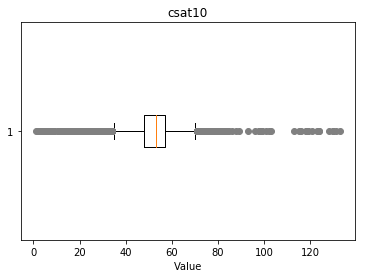

-------------------- 
Outlier detection:
 --------------------
List of outliers: {128.0, 1.0, 2.0, 3.0, 130.0, 4.0, 5.0, 7.0, 131.0, 9.0, 6.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 133.0, 8.0, 10.0, 82.0, 83.0, 84.0, 85.0, 86.0, 88.0, 89.0, 93.0, 96.0, 98.0, 99.0, 101.0, 102.0, 103.0, 113.0, 115.0, 116.0, 118.0, 119.0, 121.0, 123.0, 124.0}


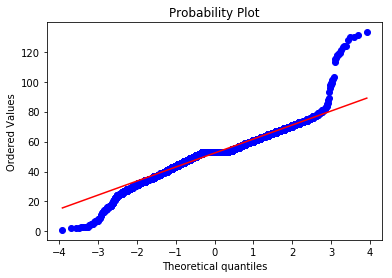

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0835
Kurtosis: 4.6463


   ADC 
Overview of variable:  csat10 


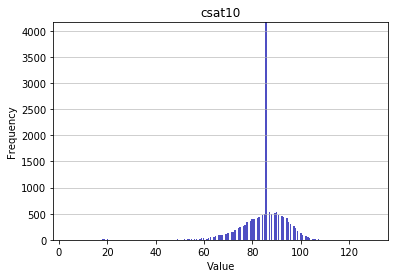

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4.0
Mean: 84.7056
Standard deviation: 9.5565
Median: 86.0
Maximal value: 130.0


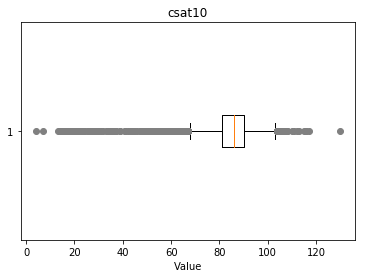

-------------------- 
Outlier detection:
 --------------------
List of outliers: {130.0, 4.0, 7.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 39.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 115.0, 116.0, 117.0}


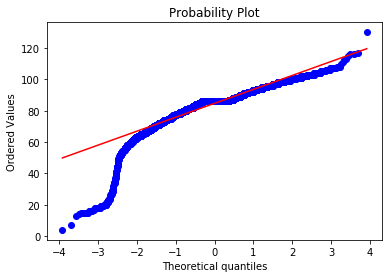

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.9881
Kurtosis: 10.0489


   Support 
Overview of variable:  csat10 


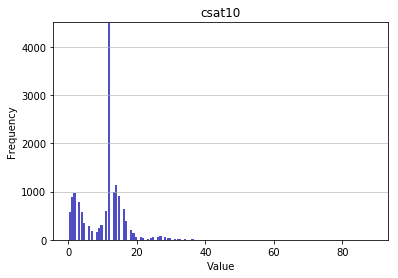

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 10.6626
Standard deviation: 7.082
Median: 12.0
Maximal value: 89.0


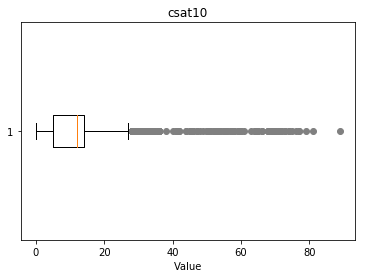

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.0, 33.0, 34.0, 35.0, 36.0, 38.0, 40.0, 41.0, 42.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 63.0, 64.0, 65.0, 66.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 79.0, 81.0, 89.0}


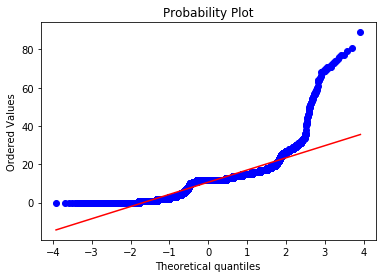

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.2004
Kurtosis: 15.8766


   Top 
Overview of variable:  csdat10 


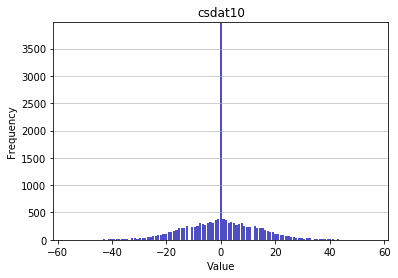

-------------------- 
Summary statistics:
 --------------------
Minimum value: -56.0
Mean: 0.0
Standard deviation: 12.2932
Median: 0.0
Maximal value: 56.0


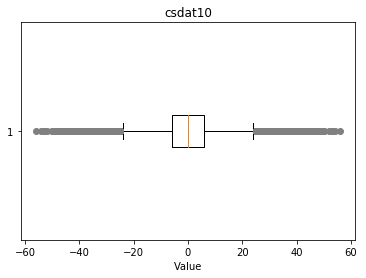

-------------------- 
Outlier detection:
 --------------------
List of outliers: {37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 52.0, 53.0, 54.0, 56.0, -56.0, -54.0, -53.0, -52.0, -50.0, -49.0, -48.0, -47.0, -46.0, -45.0, -44.0, -43.0, -42.0, -41.0, -40.0, -39.0, -38.0, -37.0}


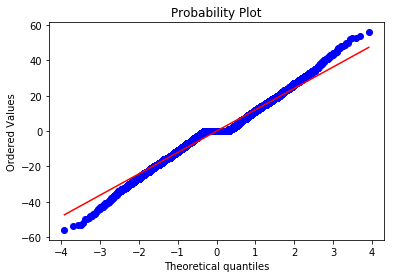

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.1937


   Middle 
Overview of variable:  csdat10 


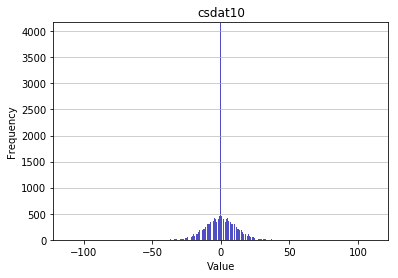

-------------------- 
Summary statistics:
 --------------------
Minimum value: -111.0
Mean: 0.0
Standard deviation: 11.1018
Median: 0.0
Maximal value: 111.0


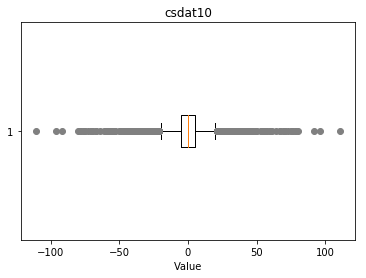

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-111.0, 80.0, 56.0, -96.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, -44.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, -80.0, 49.0, 50.0, -78.0, -76.0, -75.0, 53.0, -73.0, 55.0, -71.0, 54.0, 57.0, 60.0, 61.0, -67.0, -69.0, 64.0, -64.0, 58.0, -61.0, -60.0, 67.0, 69.0, 71.0, -57.0, 73.0, -55.0, 75.0, 76.0, -53.0, -50.0, 78.0, -54.0, -47.0, -46.0, -45.0, -49.0, -43.0, -42.0, 79.0, -40.0, -39.0, -38.0, -37.0, -36.0, -35.0, -34.0, 92.0, 96.0, -58.0, -56.0, 111.0, -79.0, -92.0}


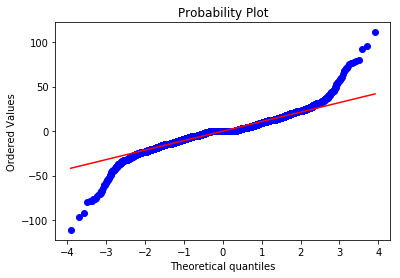

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 7.2956


   Jungle 
Overview of variable:  csdat10 


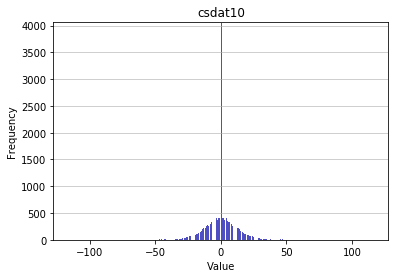

-------------------- 
Summary statistics:
 --------------------
Minimum value: -116.0
Mean: 0.0
Standard deviation: 11.8124
Median: 0.0
Maximal value: 116.0


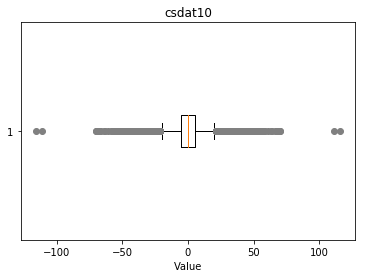

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-51.0, 59.0, -116.0, -111.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, -70.0, -69.0, 58.0, 61.0, -67.0, 63.0, -64.0, -63.0, 64.0, -61.0, 67.0, 69.0, 70.0, -58.0, -56.0, -55.0, -57.0, -53.0, -59.0, -54.0, -50.0, -49.0, -48.0, -47.0, -46.0, -45.0, -44.0, -43.0, -42.0, -41.0, -40.0, -39.0, -38.0, -37.0, -36.0, 111.0, 116.0, -52.0}


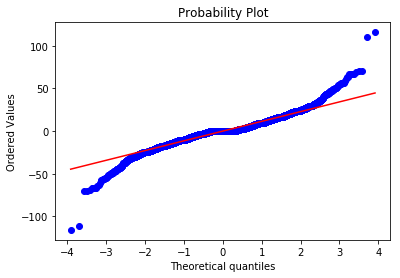

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 5.425


   ADC 
Overview of variable:  csdat10 


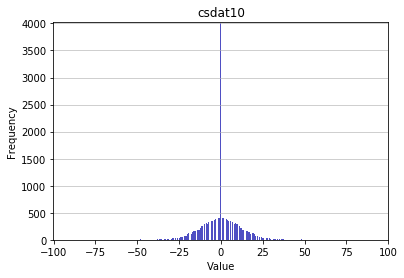

-------------------- 
Summary statistics:
 --------------------
Minimum value: -91.0
Mean: 0.0
Standard deviation: 12.622
Median: 0.0
Maximal value: 91.0


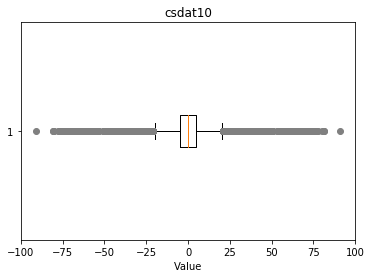

-------------------- 
Outlier detection:
 --------------------
List of outliers: {38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 80.0, 81.0, 91.0, -91.0, -81.0, -80.0, -78.0, -77.0, -76.0, -75.0, -74.0, -73.0, -72.0, -71.0, -70.0, -69.0, -68.0, -67.0, -66.0, -65.0, -64.0, -63.0, -62.0, -61.0, -60.0, -59.0, -58.0, -57.0, -56.0, -55.0, -54.0, -53.0, -51.0, -50.0, -49.0, -48.0, -47.0, -46.0, -45.0, -44.0, -43.0, -42.0, -41.0, -40.0, -39.0, -38.0}


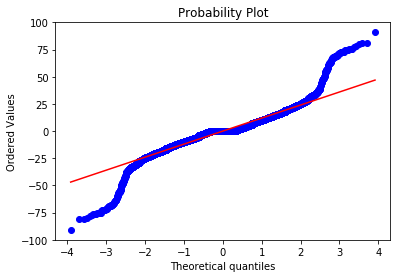

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 7.2178


   Support 
Overview of variable:  csdat10 


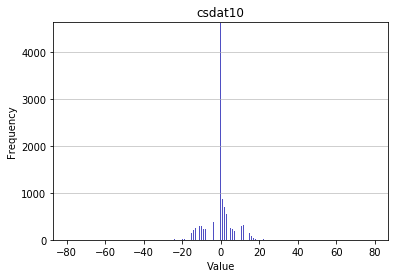

-------------------- 
Summary statistics:
 --------------------
Minimum value: -79.0
Mean: 0.0
Standard deviation: 8.8899
Median: 0.0
Maximal value: 79.0


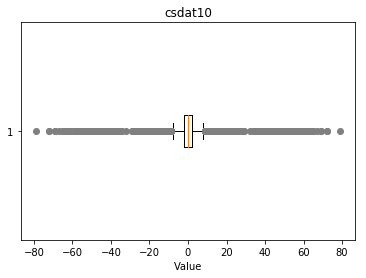

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-51.0, 51.0, -61.0, 62.0, 27.0, 28.0, 29.0, 67.0, 32.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, -79.0, 49.0, 50.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, -69.0, -72.0, 61.0, -65.0, 64.0, 65.0, -64.0, 63.0, -63.0, -59.0, -58.0, -57.0, -56.0, 69.0, -54.0, -53.0, -52.0, -55.0, -50.0, 79.0, -49.0, -47.0, -46.0, -48.0, -44.0, -43.0, -45.0, -41.0, -40.0, -39.0, -38.0, -37.0, -36.0, -35.0, -34.0, -42.0, -32.0, -29.0, -28.0, -27.0, 72.0, -67.0, -62.0}


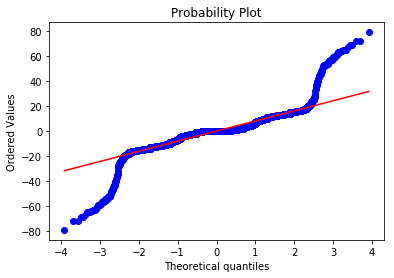

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 14.0337


   Top 
Overview of variable:  csat15 


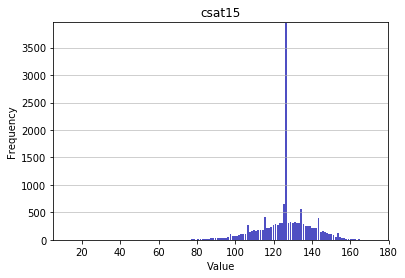

-------------------- 
Summary statistics:
 --------------------
Minimum value: 13.0
Mean: 126.2302
Standard deviation: 13.5174
Median: 127.0
Maximal value: 172.0


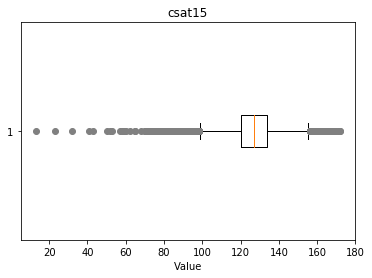

-------------------- 
Outlier detection:
 --------------------
List of outliers: {13.0, 23.0, 32.0, 167.0, 168.0, 169.0, 170.0, 43.0, 172.0, 41.0, 171.0, 50.0, 52.0, 53.0, 57.0, 58.0, 59.0, 60.0, 62.0, 65.0, 68.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0}


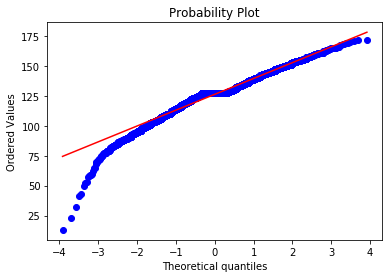

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.5941
Kurtosis: 2.0462


   Middle 
Overview of variable:  csat15 


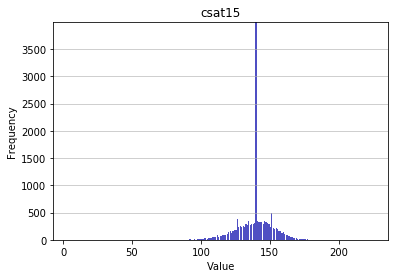

-------------------- 
Summary statistics:
 --------------------
Minimum value: 4.0
Mean: 139.1749
Standard deviation: 14.0461
Median: 140.0
Maximal value: 225.0


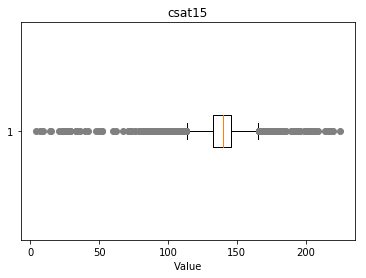

-------------------- 
Outlier detection:
 --------------------
List of outliers: {4.0, 7.0, 8.0, 205.0, 9.0, 14.0, 15.0, 21.0, 23.0, 24.0, 25.0, 26.0, 208.0, 28.0, 29.0, 209.0, 33.0, 34.0, 83.0, 36.0, 40.0, 42.0, 48.0, 50.0, 52.0, 214.0, 182.0, 183.0, 184.0, 186.0, 215.0, 60.0, 189.0, 190.0, 191.0, 192.0, 193.0, 194.0, 67.0, 196.0, 195.0, 62.0, 199.0, 72.0, 73.0, 201.0, 200.0, 76.0, 204.0, 206.0, 79.0, 80.0, 81.0, 82.0, 202.0, 84.0, 85.0, 86.0, 87.0, 88.0, 217.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 219.0, 218.0, 225.0, 220.0, 71.0, 89.0, 203.0}


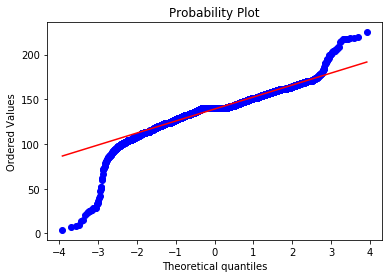

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.0816
Kurtosis: 9.0378


   Jungle 
Overview of variable:  csat15 


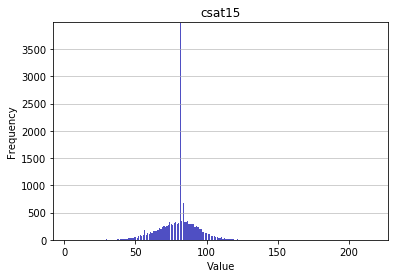

-------------------- 
Summary statistics:
 --------------------
Minimum value: 3.0
Mean: 80.1001
Standard deviation: 13.837
Median: 81.0
Maximal value: 217.0


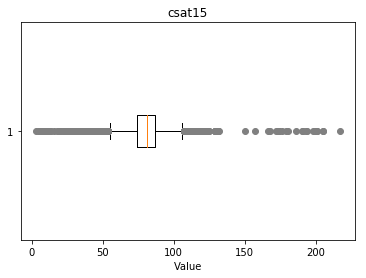

-------------------- 
Outlier detection:
 --------------------
List of outliers: {129.0, 130.0, 131.0, 132.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 16.0, 3.0, 18.0, 19.0, 20.0, 150.0, 23.0, 24.0, 30.0, 26.0, 27.0, 28.0, 157.0, 29.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 166.0, 168.0, 172.0, 173.0, 174.0, 176.0, 179.0, 180.0, 186.0, 190.0, 191.0, 193.0, 194.0, 198.0, 199.0, 200.0, 201.0, 205.0, 217.0, 122.0, 123.0, 124.0, 125.0, 25.0}


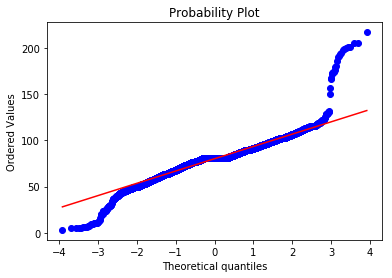

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.2157
Kurtosis: 7.3513


   ADC 
Overview of variable:  csat15 


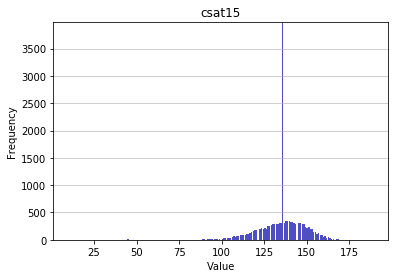

-------------------- 
Summary statistics:
 --------------------
Minimum value: 10.0
Mean: 135.0131
Standard deviation: 13.9195
Median: 136.0
Maximal value: 189.0


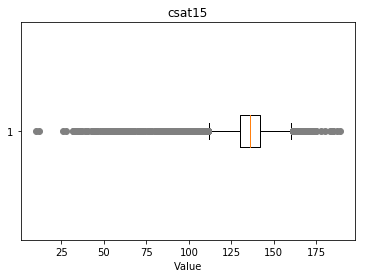

-------------------- 
Outlier detection:
 --------------------
List of outliers: {178.0, 10.0, 12.0, 26.0, 28.0, 57.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 39.0, 40.0, 59.0, 43.0, 44.0, 45.0, 46.0, 48.0, 49.0, 50.0, 51.0, 180.0, 53.0, 54.0, 183.0, 184.0, 185.0, 58.0, 187.0, 56.0, 189.0, 62.0, 55.0, 61.0, 64.0, 60.0, 67.0, 68.0, 66.0, 70.0, 71.0, 72.0, 73.0, 74.0, 65.0, 76.0, 77.0, 78.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 63.0}


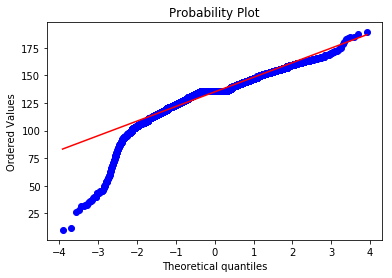

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -1.506
Kurtosis: 7.4871


   Support 
Overview of variable:  csat15 


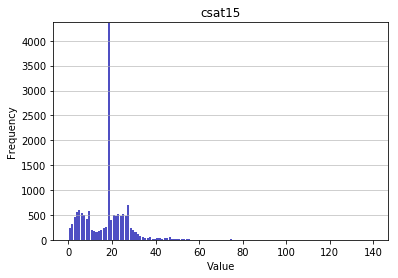

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0.0
Mean: 17.7315
Standard deviation: 10.6598
Median: 18.0
Maximal value: 140.0


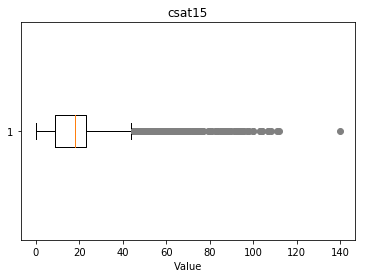

-------------------- 
Outlier detection:
 --------------------
List of outliers: {140.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 79.0, 80.0, 81.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 95.0, 96.0, 97.0, 98.0, 100.0, 103.0, 104.0, 107.0, 108.0, 111.0, 112.0}


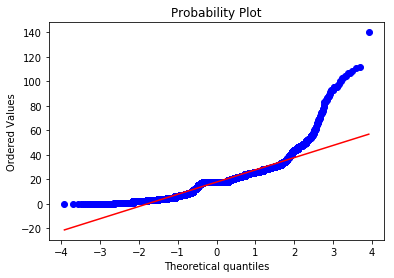

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7333
Kurtosis: 9.7981


   Top 
Overview of variable:  csdat15 


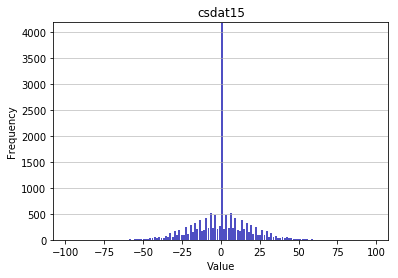

-------------------- 
Summary statistics:
 --------------------
Minimum value: -98.0
Mean: 0.0
Standard deviation: 17.342
Median: 0.0
Maximal value: 98.0


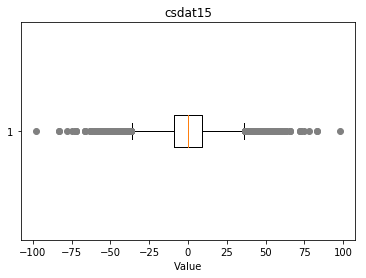

-------------------- 
Outlier detection:
 --------------------
List of outliers: {-73.0, -98.0, 57.0, -83.0, -78.0, 53.0, 54.0, 55.0, -72.0, 56.0, 58.0, 59.0, 60.0, -75.0, 62.0, 63.0, -66.0, -63.0, -62.0, 66.0, -60.0, -59.0, -58.0, -57.0, -56.0, 72.0, -54.0, -53.0, -55.0, 75.0, 78.0, 73.0, 83.0, 98.0}


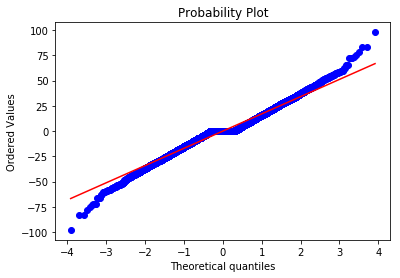

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.2851


   Middle 
Overview of variable:  csdat15 


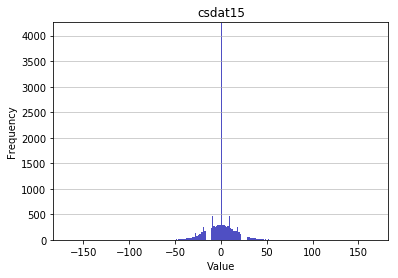

-------------------- 
Summary statistics:
 --------------------
Minimum value: -166.0
Mean: 0.0
Standard deviation: 16.3029
Median: 0.0
Maximal value: 166.0


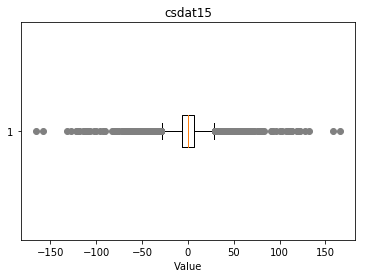

-------------------- 
Outlier detection:
 --------------------
List of outliers: {49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 69.0, 70.0, 71.0, 72.0, 75.0, 77.0, 78.0, 81.0, 83.0, 91.0, 92.0, 93.0, 96.0, 100.0, 103.0, 107.0, 109.0, 110.0, 112.0, 114.0, 119.0, 120.0, 121.0, 122.0, 128.0, 132.0, 158.0, 166.0, -166.0, -158.0, -132.0, -128.0, -122.0, -121.0, -120.0, -119.0, -114.0, -112.0, -110.0, -109.0, -107.0, -103.0, -100.0, -96.0, -93.0, -92.0, -91.0, -83.0, -81.0, -78.0, -77.0, -75.0, -72.0, -71.0, -70.0, -69.0, -67.0, -66.0, -65.0, -64.0, -63.0, -62.0, -60.0, -59.0, -58.0, -57.0, -56.0, -55.0, -54.0, -53.0, -52.0, -51.0, -50.0, -49.0}


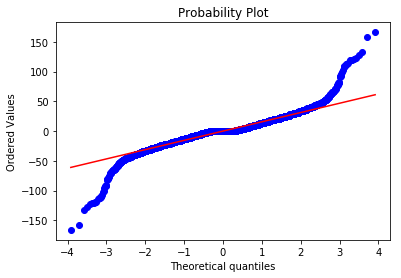

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 8.9066


   Jungle 
Overview of variable:  csdat15 


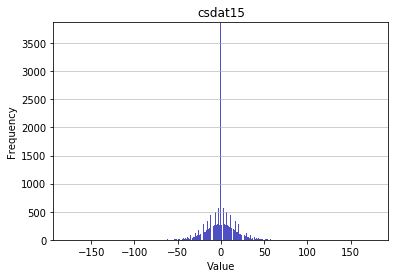

-------------------- 
Summary statistics:
 --------------------
Minimum value: -176.0
Mean: 0.0
Standard deviation: 17.0896
Median: 0.0
Maximal value: 176.0


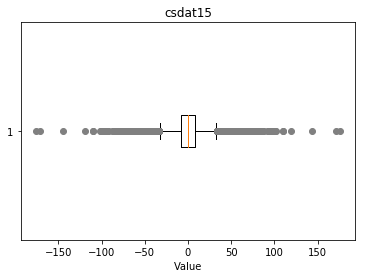

-------------------- 
Outlier detection:
 --------------------
List of outliers: {52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 88.0, 92.0, 93.0, 95.0, 96.0, 97.0, 98.0, 101.0, 102.0, 110.0, 119.0, 144.0, 171.0, 176.0, -176.0, -171.0, -144.0, -119.0, -110.0, -102.0, -101.0, -98.0, -97.0, -96.0, -95.0, -93.0, -92.0, -88.0, -86.0, -85.0, -84.0, -83.0, -82.0, -81.0, -80.0, -79.0, -78.0, -77.0, -76.0, -75.0, -74.0, -72.0, -71.0, -70.0, -69.0, -68.0, -67.0, -65.0, -64.0, -63.0, -62.0, -61.0, -60.0, -59.0, -58.0, -57.0, -56.0, -55.0, -54.0, -53.0, -52.0}


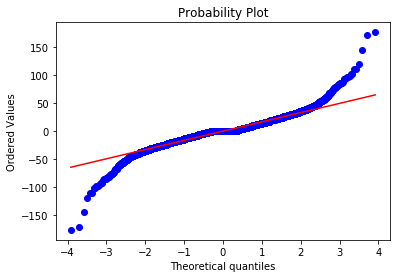

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 7.1479


   ADC 
Overview of variable:  csdat15 


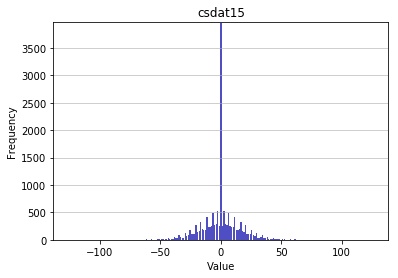

-------------------- 
Summary statistics:
 --------------------
Minimum value: -126.0
Mean: 0.0
Standard deviation: 17.8972
Median: 0.0
Maximal value: 126.0


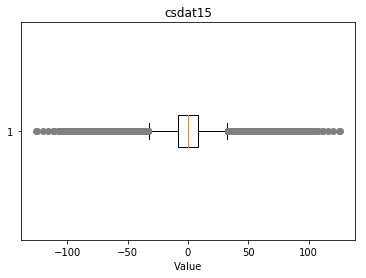

-------------------- 
Outlier detection:
 --------------------
List of outliers: {54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 63.0, 65.0, 66.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 75.0, 76.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 88.0, 89.0, 90.0, 92.0, 93.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 104.0, 107.0, 108.0, 111.0, 112.0, 116.0, 120.0, 125.0, 126.0, -126.0, -125.0, -120.0, -116.0, -112.0, -111.0, -108.0, -107.0, -104.0, -102.0, -101.0, -100.0, -99.0, -98.0, -97.0, -96.0, -95.0, -93.0, -92.0, -90.0, -89.0, -88.0, -86.0, -85.0, -84.0, -83.0, -82.0, -81.0, -80.0, -79.0, -78.0, -76.0, -75.0, -73.0, -72.0, -71.0, -70.0, -69.0, -68.0, -66.0, -65.0, -63.0, -61.0, -60.0, -59.0, -58.0, -57.0, -56.0, -55.0, -54.0}


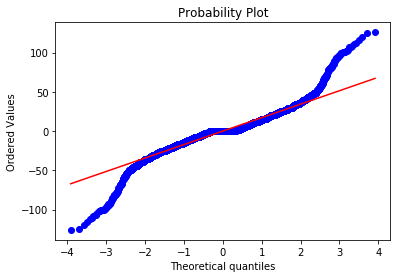

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 5.9475


   Support 
Overview of variable:  csdat15 


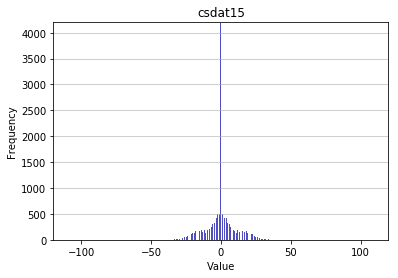

-------------------- 
Summary statistics:
 --------------------
Minimum value: -109.0
Mean: 0.0
Standard deviation: 12.9961
Median: 0.0
Maximal value: 109.0


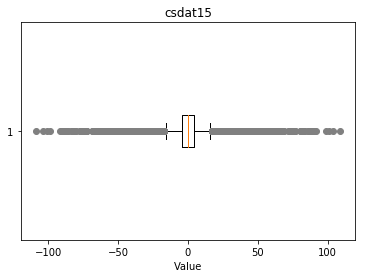

-------------------- 
Outlier detection:
 --------------------
List of outliers: {39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 72.0, 73.0, 75.0, 77.0, 80.0, 81.0, 82.0, 83.0, 84.0, 86.0, 87.0, 88.0, 89.0, 90.0, 92.0, 99.0, 101.0, 104.0, 109.0, -109.0, -104.0, -101.0, -99.0, -92.0, -90.0, -89.0, -88.0, -87.0, -86.0, -84.0, -83.0, -82.0, -81.0, -80.0, -77.0, -75.0, -73.0, -72.0, -69.0, -68.0, -67.0, -66.0, -65.0, -64.0, -63.0, -62.0, -61.0, -60.0, -59.0, -58.0, -57.0, -56.0, -55.0, -54.0, -53.0, -52.0, -51.0, -50.0, -48.0, -47.0, -46.0, -45.0, -44.0, -43.0, -42.0, -41.0, -40.0, -39.0}


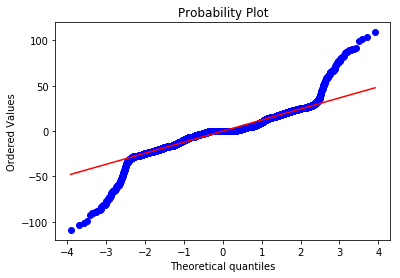

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 9.3191


   Top 
Overview of variable:  Encoded_champion 


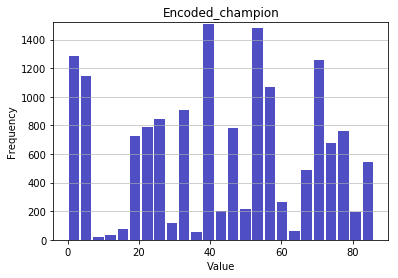

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 43.0471
Standard deviation: 24.924
Median: 45.0
Maximal value: 86


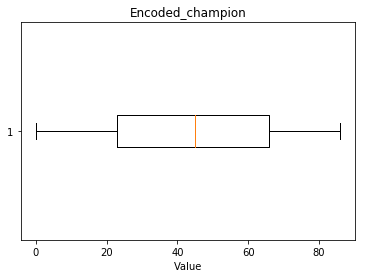

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


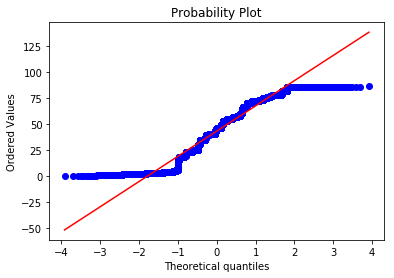

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.149
Kurtosis: -1.0872


   Middle 
Overview of variable:  Encoded_champion 


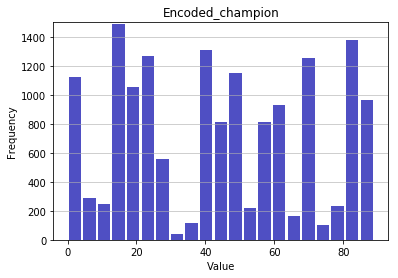

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 43.6283
Standard deviation: 26.8004
Median: 45.0
Maximal value: 89


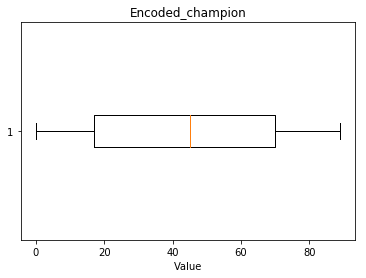

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


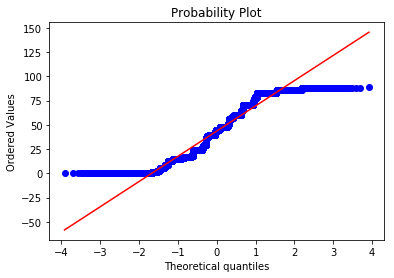

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0799
Kurtosis: -1.2016


   Jungle 
Overview of variable:  Encoded_champion 


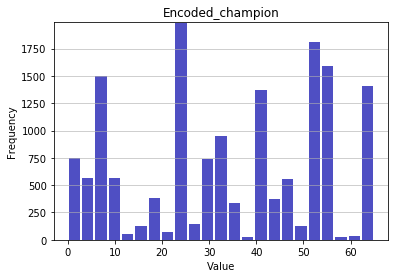

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 34.0714
Standard deviation: 20.1113
Median: 32.0
Maximal value: 65


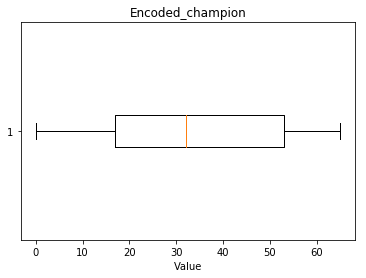

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


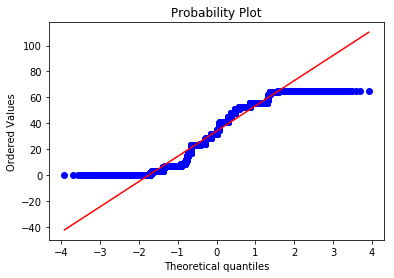

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.1483
Kurtosis: -1.2328


   ADC 
Overview of variable:  Encoded_champion 


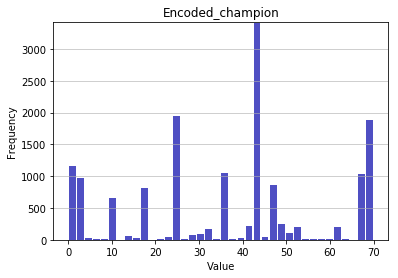

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 36.8188
Standard deviation: 21.9576
Median: 43.0
Maximal value: 70


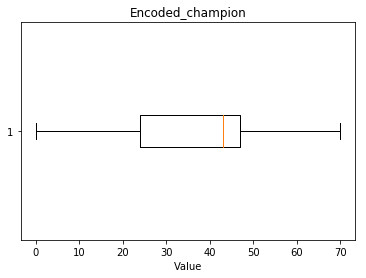

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


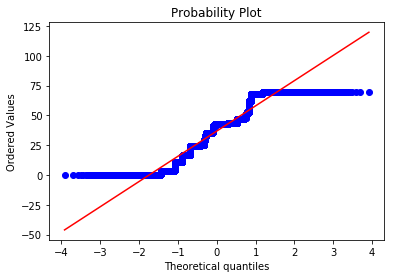

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.077
Kurtosis: -0.9611


   Support 
Overview of variable:  Encoded_champion 


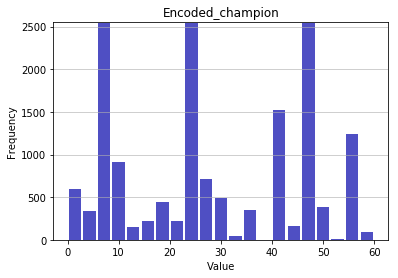

-------------------- 
Summary statistics:
 --------------------
Minimum value: 0
Mean: 28.3178
Standard deviation: 17.0554
Median: 25.0
Maximal value: 60


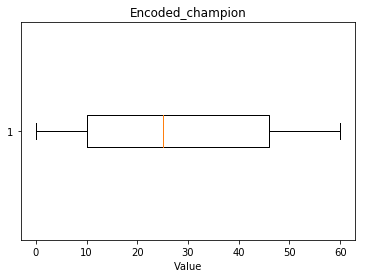

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


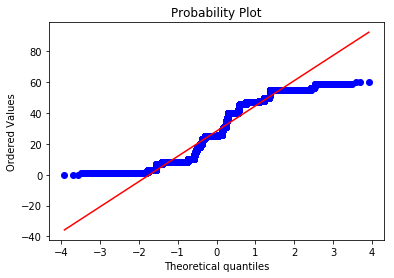

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0405
Kurtosis: -1.3374


<Figure size 432x288 with 0 Axes>

In [16]:
# Loop through all numerical variables and visualize data
for num_variable in numerical_variables:
    # Only plot features that different between the positions
    x = [set(data_dict[pos][num_variable]) for pos in data_dict]
    if x.count(x[0]) != len(x):
        for pos, df in data_dict.items():
            print("\n\n","="*10, "\n  ", pos, "\n", "="*10)
            SummaryNumericVar(df[num_variable].dropna(), num_variable)

##### Remove irrelevant features for further analysis
* Impossible column values are removed (gamelength of zero).
* Features with zero or near zero variance (<0.05) for categorical encoders were removed (because of their redundancy in further analysis). Note here that not all numerical features with a variance smaller than 0.05 were removed from analysis, because standardization is not considered yet.
* Extreme outliers

In [17]:
# Remove redundant features
data_dict['Top'] = data_dict['Top'].drop(['quadras', 'pentas'], axis = 1)
data_dict['Middle'] = data_dict['Middle'].drop(['pentas'], axis = 1)
data_dict['Jungle'] = data_dict['Jungle'].drop(['quadras'], axis = 1)
data_dict['ADC'] = data_dict['ADC'].drop(['quadras', 'pentas'], axis = 1)
data_dict['Support'] = data_dict['Support'].drop(['triples', 'quadras', 'pentas'], axis = 1)
for pos, df in data_dict.items():
    data_dict[pos] = df[df.datediff != 17973.0]

##### Reduce the influence of outliers by applying a box-cox transformation on the data
Because ridge and lasso regression are both sensitive to outlying observations, it was decided to reduce the influence of the latter by applying a box-cox transformation on the numerical features, hence transforming them in a normal shape. We refrained from removing outliers because these could capture relevant information and transformation is assumed to reduce their influence. Different lambda values underlying the exponential transformation of the data are explored [-5, 5] and the optimal value, resulting in the best approximation of the normal curve, is selected.

In [18]:
# Creation of new data_dict capturing features after transformation
trans_data_dict, optimiser_data_dict = dict(), dict()

##### Top - Data transformation

Feature:  split
The optimal value for lambda:  0.006245862522719181
Feature:  dmgtochamps
The optimal value for lambda:  0.15990496395958126
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.30379848096913603
Feature:  dmgshare
The optimal value for lambda:  0.3871615361020637
Feature:  earnedgoldshare
The optimal value for lambda:  -0.07011919755684481
Feature:  wards
The optimal value for lambda:  -0.015108955639184202
Feature:  wpm
The optimal value for lambda:  0.21756120716168328
Feature:  wardshare
The optimal value for lambda:  0.5594450087157091
Feature:  totalgold
The optimal value for lambda:  0.12181993764846637
Feature:  earnedgpm
The optimal value for lambda:  0.16699034071011995
Feature:  goldspent
The optimal value for lambda:  -0.07715858593267136
Feature:  minionkills
The optimal value for lambda:  0.2480381428503357
Feature:  cspm
The optimal value for lambda:  1.0192695970471974
Feature:  goldat10
The optimal value for lambda:  -0.8963887692213716
Featu

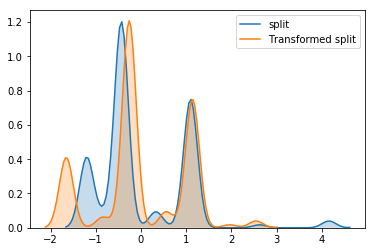

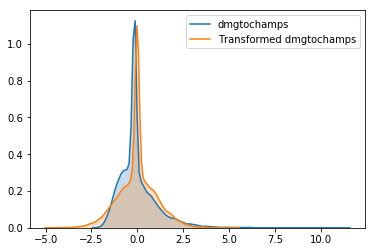

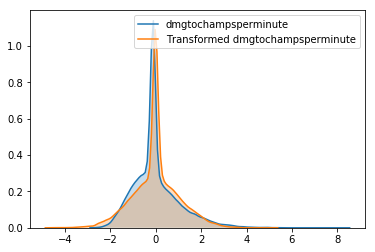

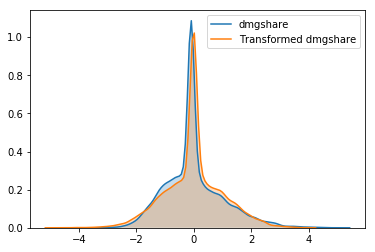

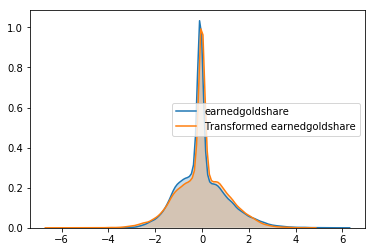

...

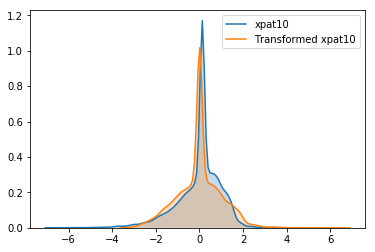

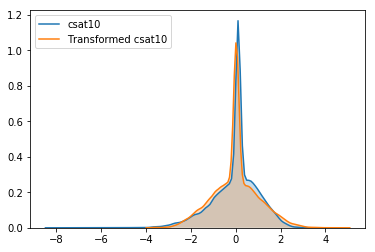

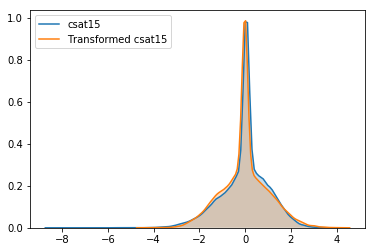

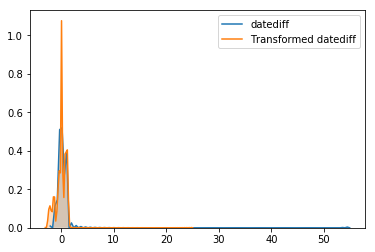

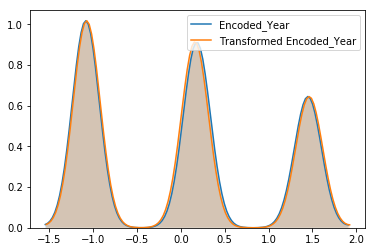

In [19]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Top'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [20]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Top"] = transformed_data_df
optimiser_data_dict["Top"] = optimiser_dict

##### Middle- Data transformation

Feature:  split
The optimal value for lambda:  0.006245862522719181
Feature:  dmgtochamps
The optimal value for lambda:  0.1620742922234905
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.4184473977457862
Feature:  dmgshare
The optimal value for lambda:  0.7072648822879826
Feature:  earnedgoldshare
The optimal value for lambda:  0.7866693232168546
Feature:  wards
The optimal value for lambda:  0.23887785895952351
Feature:  wpm
The optimal value for lambda:  0.6843328022407962
Feature:  wardshare
The optimal value for lambda:  0.8365451071499179
Feature:  totalgold
The optimal value for lambda:  0.17728149989715694
Feature:  earnedgpm
The optimal value for lambda:  0.5488709059410998
Feature:  goldspent
The optimal value for lambda:  0.010981048051182076
Feature:  minionkills
The optimal value for lambda:  0.4987958285699011
Feature:  cspm
The optimal value for lambda:  1.392211279368919
Feature:  goldat10
The optimal value for lambda:  0.12150803750852292
Feature:  gold

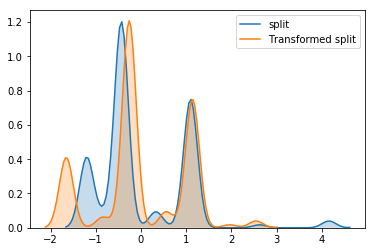

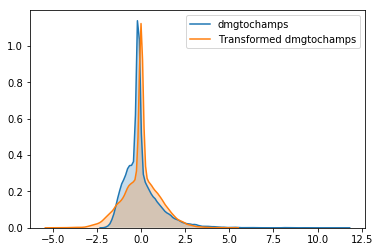

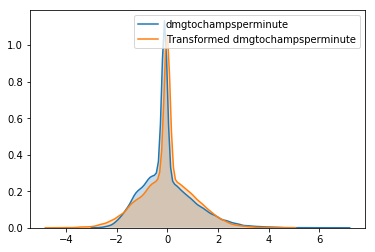

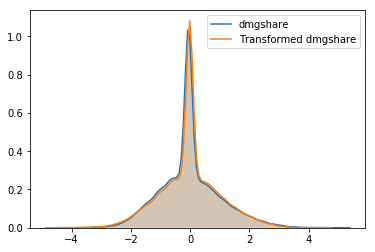

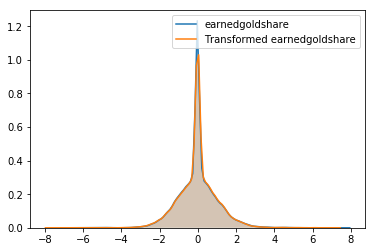

...

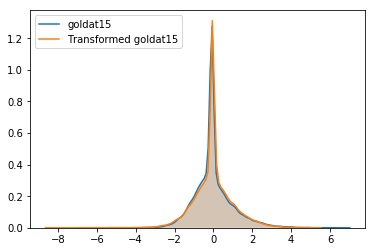

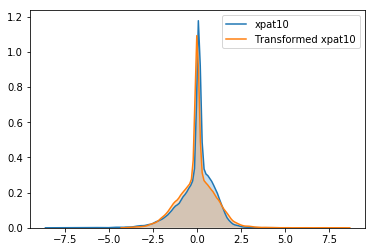

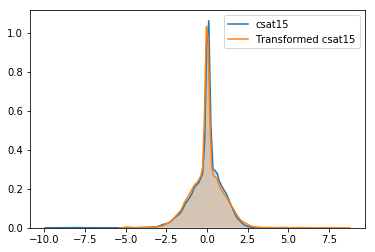

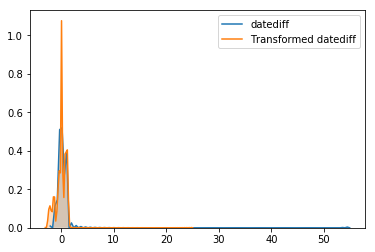

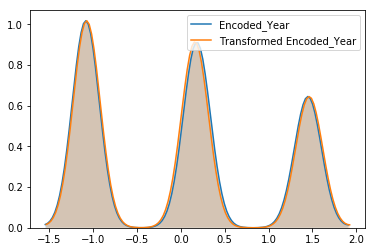

In [21]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Middle'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [22]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Middle"] = transformed_data_df
optimiser_data_dict["Middle"] = optimiser_dict

##### Jungle- Data transformation

Feature:  split
The optimal value for lambda:  0.006245862522719181
Feature:  dmgtochamps
The optimal value for lambda:  0.13034402408719728
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.22769941020235177
Feature:  dmgshare
The optimal value for lambda:  0.28875044795441923
Feature:  earnedgoldshare
The optimal value for lambda:  0.2611810450502629
Feature:  wards
The optimal value for lambda:  0.117779075345225
Feature:  wpm
The optimal value for lambda:  0.25611095692436164
Feature:  wardshare
The optimal value for lambda:  0.6909893961670521
Feature:  totalgold
The optimal value for lambda:  0.06744394955466078
Feature:  earnedgpm
The optimal value for lambda:  0.22444554783931492
Feature:  goldspent
The optimal value for lambda:  -0.183519372533418
Feature:  minionkills
The optimal value for lambda:  0.04055977308335729
Feature:  cspm
The optimal value for lambda:  0.6627007589825543
Feature:  goldat10
The optimal value for lambda:  -0.48911430282078655
Feature:  

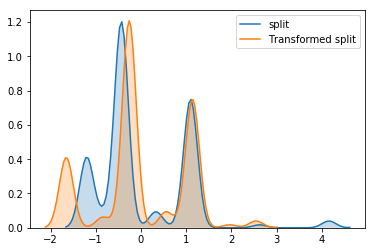

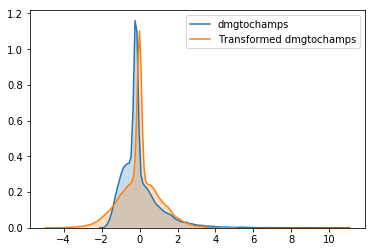

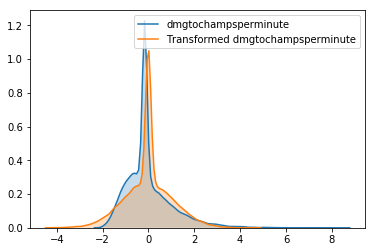

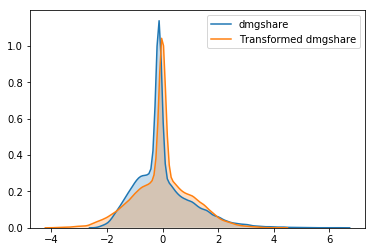

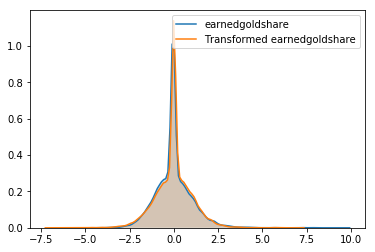

...

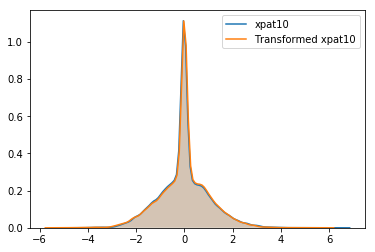

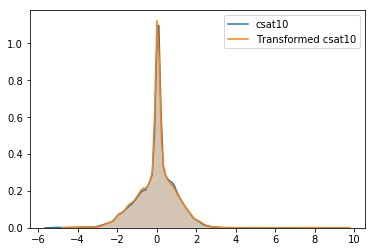

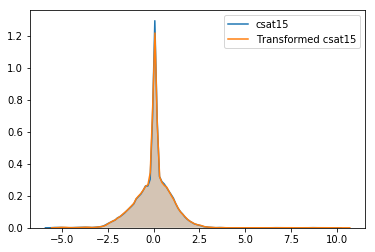

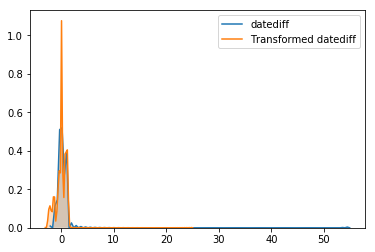

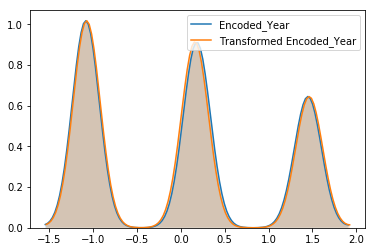

In [23]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Jungle'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [24]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Jungle"] = transformed_data_df
optimiser_data_dict["Jungle"] = optimiser_dict

##### ADC- Data Tranformation

Feature:  split
The optimal value for lambda:  0.006245862522719181
Feature:  dmgtochamps
The optimal value for lambda:  0.10286211745395954
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.29442583563577196
Feature:  dmgshare
The optimal value for lambda:  0.5889038952188369
Feature:  earnedgoldshare
The optimal value for lambda:  0.4743364502954094
Feature:  wards
The optimal value for lambda:  0.06998556084740354
Feature:  wpm
The optimal value for lambda:  0.07465020258998825
Feature:  wardshare
The optimal value for lambda:  0.1855567259484612
Feature:  totalgold
The optimal value for lambda:  0.19397823364429556
Feature:  earnedgpm
The optimal value for lambda:  0.7995456386854642
Feature:  goldspent
The optimal value for lambda:  -0.06316046779482773
Feature:  minionkills
The optimal value for lambda:  0.33520278675221393
Feature:  cspm
The optimal value for lambda:  1.5907056195214904
Feature:  goldat10
The optimal value for lambda:  -0.9541960857595653
Feature: 

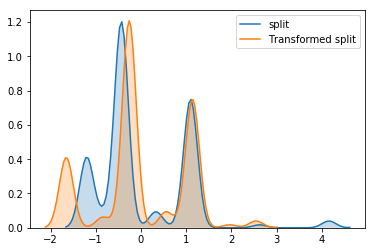

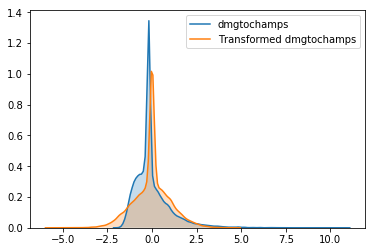

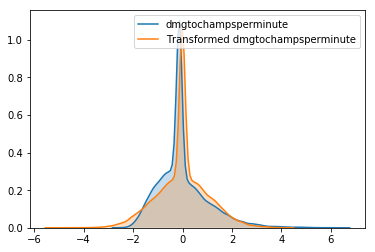

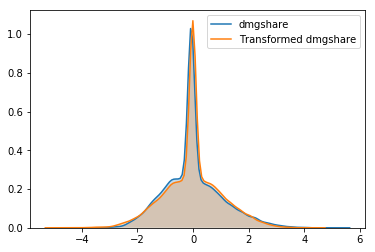

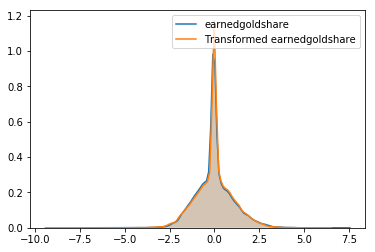

...

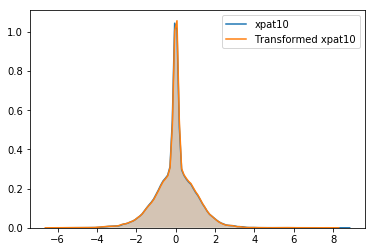

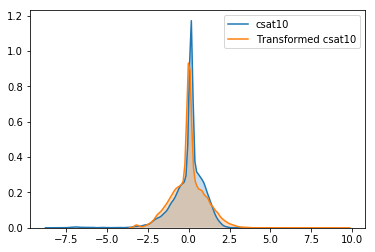

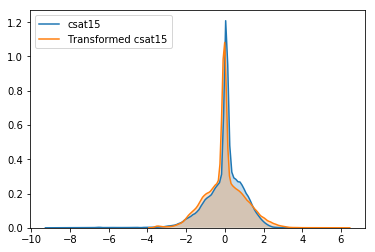

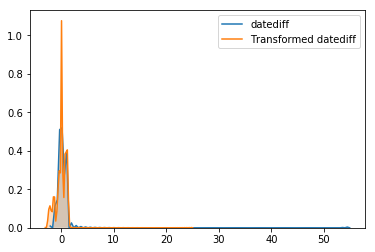

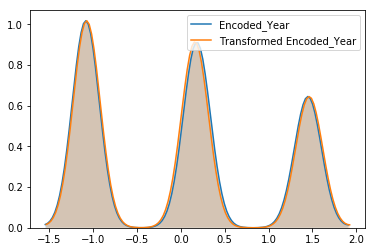

In [ ]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['ADC'], pd.DataFrame(), dict()


# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [ ]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["ADC"] = transformed_data_df
optimiser_data_dict["ADC"] = optimiser_dict

##### Support- Data Tranformation

Feature:  split
The optimal value for lambda:  0.006245862522719181
Feature:  dmgtochamps
The optimal value for lambda:  0.008231189433288216
Feature:  dmgtochampsperminute
The optimal value for lambda:  0.06641543488858237
Feature:  dmgshare
The optimal value for lambda:  0.050653267035996964
Feature:  earnedgoldshare
The optimal value for lambda:  0.5797840538282861
Feature:  wards
The optimal value for lambda:  0.2136648527331873
Feature:  wpm
The optimal value for lambda:  0.5042978612031503
Feature:  wardshare
The optimal value for lambda:  1.1191111151380984
Feature:  totalgold
The optimal value for lambda:  -0.02300908771886543
Feature:  earnedgpm
The optimal value for lambda:  0.5743595904652573
Feature:  goldspent
The optimal value for lambda:  -0.19231763409724195
Feature:  goldat10
The optimal value for lambda:  -3.1566007113152557
Feature:  goldat15
The optimal value for lambda:  -2.3371672387741715
Feature:  xpat10
The optimal value for lambda:  2.251713770362164
Feature: 

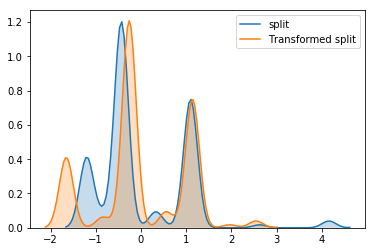

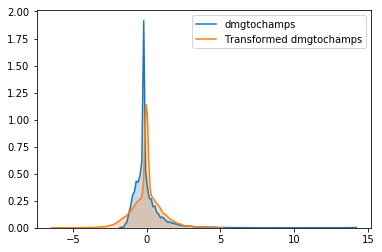

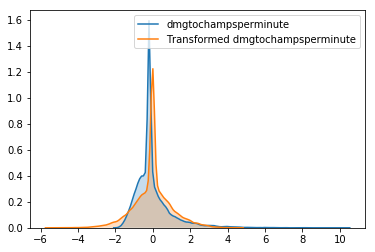

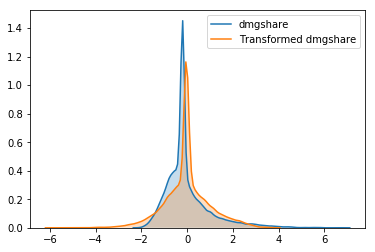

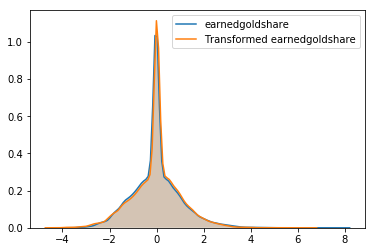

...

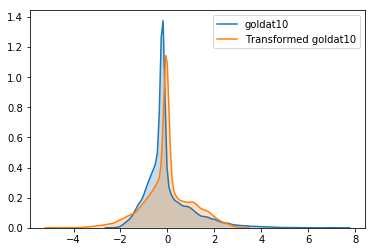

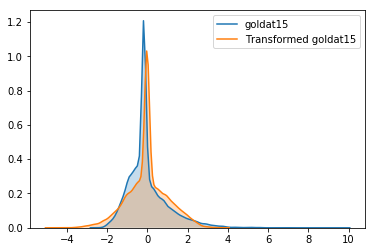

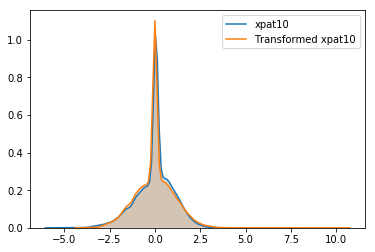

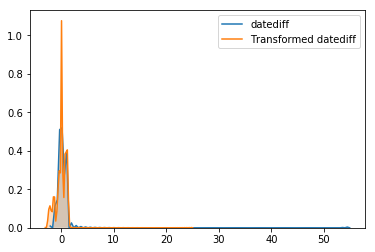

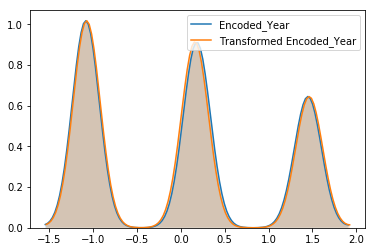

In [ ]:
# Initialization
df, transformed_data_df, optimiser_dict = data_dict['Support'], pd.DataFrame(), dict()

# Loop through the data and apply box cox transformation
for num_variable in df.columns:
    if str(df[num_variable].dtypes) != 'object':
        if all(df[num_variable] > 0):
            transformed_feature, optimiser = feature_transformer(df[num_variable], num_variable)
            if -5 <= optimiser <= 5:
                transformed_data_df[num_variable] = transformed_feature
                optimiser_dict[num_variable] = optimiser
            else:
                transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])
                optimiser_dict[num_variable] = np.nan
        else:
            transformed_data_df[num_variable] = preprocessing.scale(df[num_variable])

In [ ]:
# Add player feature
transformed_data_df['player'] = list(df['player'])

# Add transformed dataframe to dictionary
trans_data_dict["Support"] = transformed_data_df
optimiser_data_dict["Support"] = optimiser_dict

Overview of variable:  split 


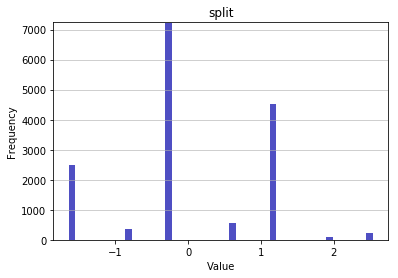

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.6524134644757744
Mean: -0.0
Standard deviation: 1.0
Median: -0.259
Maximal value: 2.5458853154056484


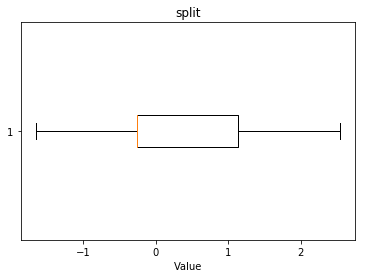

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


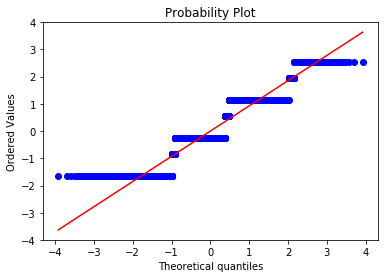

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0006
Kurtosis: -0.5549
Overview of variable:  patchno 


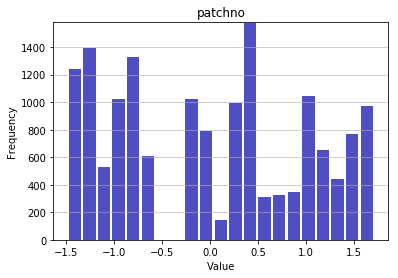

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.4836917740178226
Mean: -0.0
Standard deviation: 1.0
Median: -0.0265
Maximal value: 1.7109321793016785


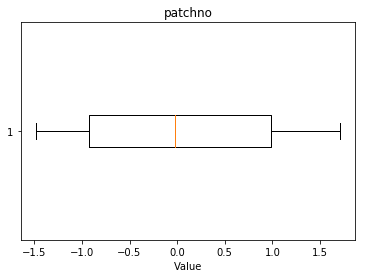

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


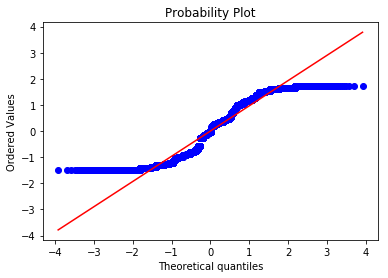

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.1081
Kurtosis: -1.3024
Overview of variable:  result 


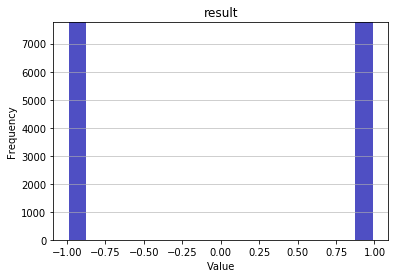

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.0
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 1.0


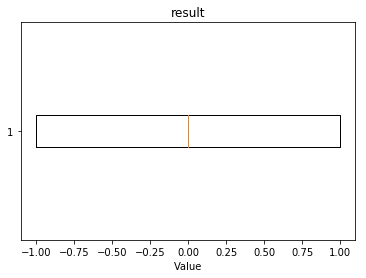

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


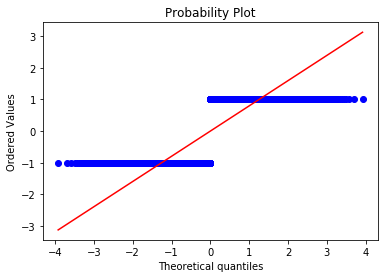

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -2.0
Overview of variable:  k 


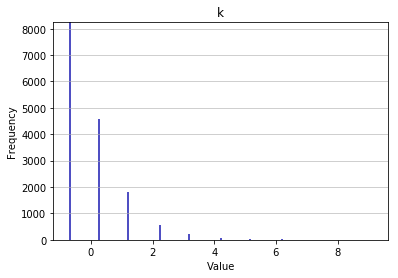

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.7272139034093349
Mean: 0.0
Standard deviation: 1.0
Median: -0.7272
Maximal value: 9.149347855754126


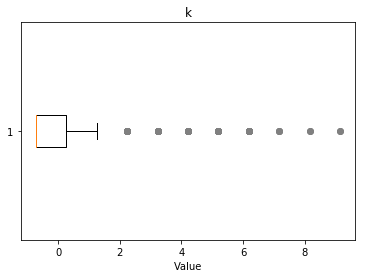

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.22, 4.21, 5.2, 6.19, 7.17, 8.16, 9.15}


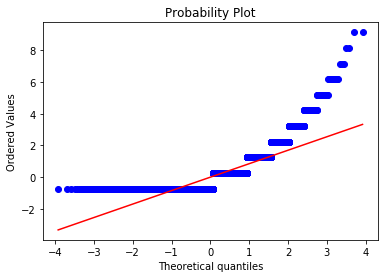

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.9292
Kurtosis: 5.7714
Overview of variable:  d 


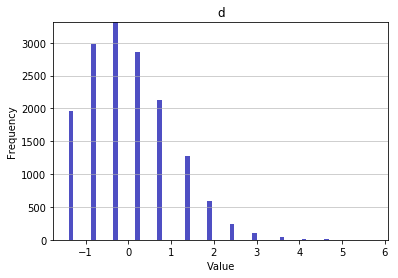

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.404860492291632
Mean: -0.0
Standard deviation: 1.0
Median: -0.3066
Maximal value: 5.734021157696045


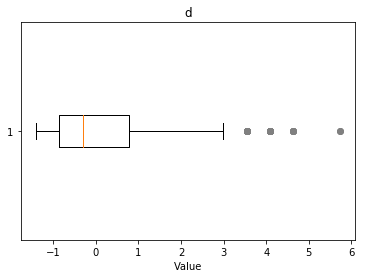

-------------------- 
Outlier detection:
 --------------------
List of outliers: {5.73, 3.54, 4.09, 4.64}


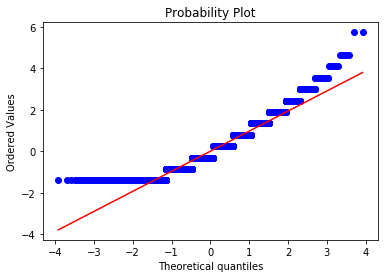

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.6718
Kurtosis: 0.3741
Overview of variable:  a 


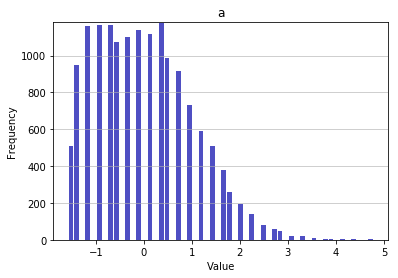

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.5758137611114138
Mean: 0.0
Standard deviation: 1.0
Median: -0.093
Maximal value: 4.779053587441348


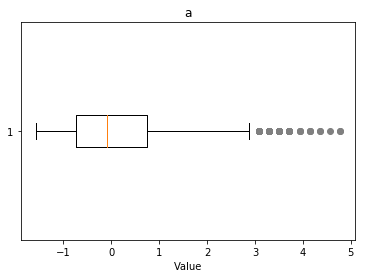

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.72, 3.3, 4.14, 3.51, 3.08, 3.93, 4.57, 4.36, 4.78}


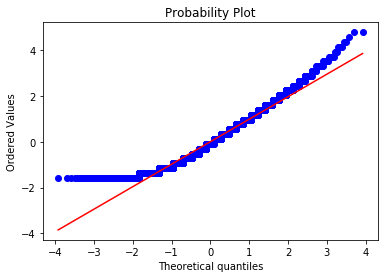

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.5506
Kurtosis: -0.0334
Overview of variable:  doubles 


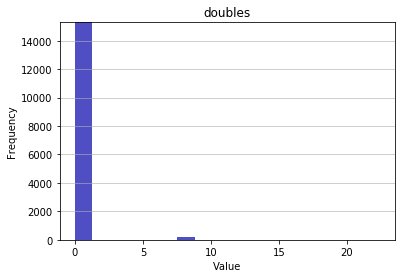

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.11901967548150309
Mean: 0.0
Standard deviation: 1.0
Median: -0.119
Maximal value: 22.49083230925367


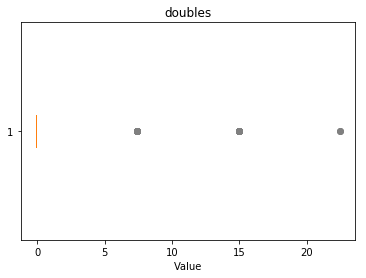

-------------------- 
Outlier detection:
 --------------------
List of outliers: {22.49, 14.95, 7.42}


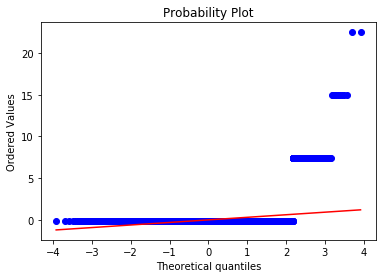

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 9.3817
Kurtosis: 104.9553
Overview of variable:  fb 


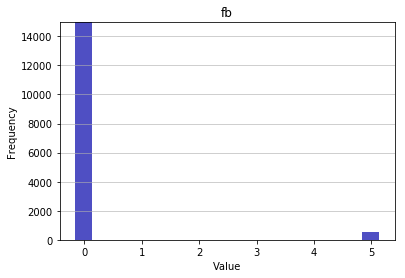

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.19369448883663287
Mean: -0.0
Standard deviation: 1.0
Median: -0.1937
Maximal value: 5.162769503697275


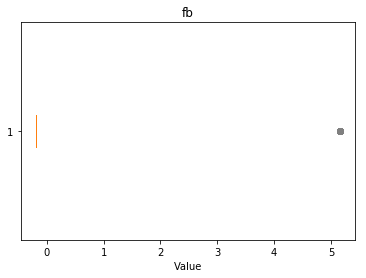

-------------------- 
Outlier detection:
 --------------------
List of outliers: {5.16}


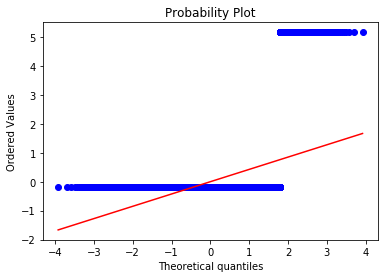

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 4.9691
Kurtosis: 22.6917
Overview of variable:  fbassist 


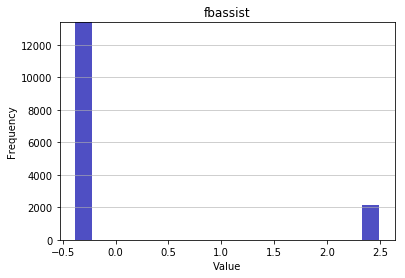

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.39849582734317235
Mean: -0.0
Standard deviation: 1.0
Median: -0.3985
Maximal value: 2.5094365646615198


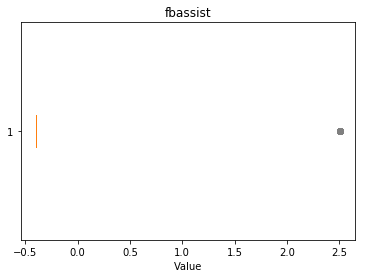

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


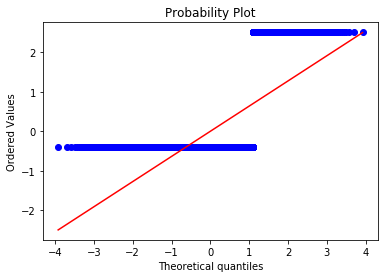

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1109
Kurtosis: 2.4561
Overview of variable:  fbvictim 


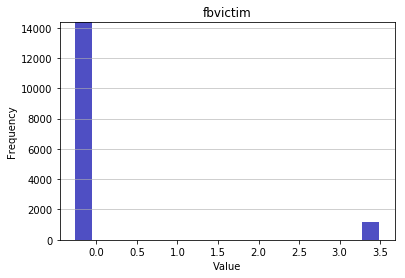

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.2849391634227304
Mean: 0.0
Standard deviation: 1.0
Median: -0.2849
Maximal value: 3.5095210780710375


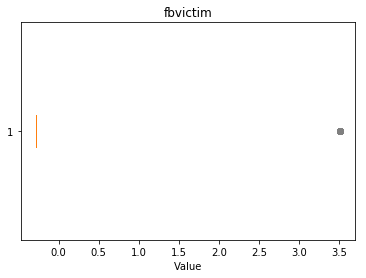

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.51}


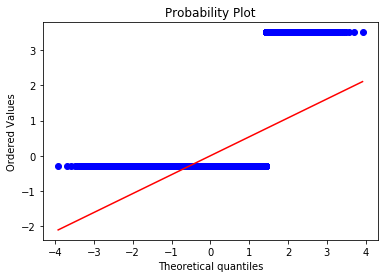

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 3.2246
Kurtosis: 8.3979
Overview of variable:  kpm 


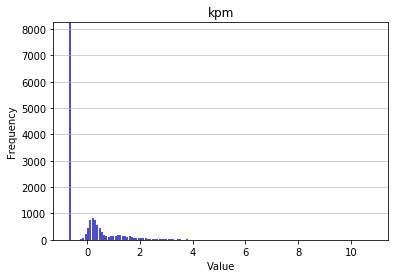

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.709083988625011
Mean: -0.0
Standard deviation: 1.0
Median: -0.7091
Maximal value: 10.832599384970006


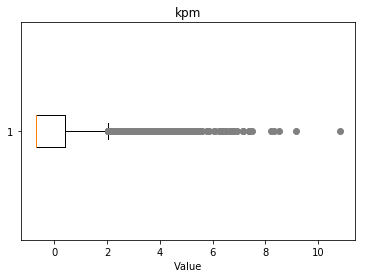

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.82, 3.22, 3.01, 4.07, 4.34, 3.44, 3.18, 3.14, 3.41, 3.51, 4.43, 5.09, 6.66, 3.5, 8.52, 10.83, 3.0, 4.0, 4.82, 4.25, 4.57, 4.32, 5.32, 5.43, 5.57, 4.5, 5.18, 6.75, 8.21, 9.14, 3.68, 3.43, 3.93, 3.86, 3.11, 3.79, 3.29, 3.04, 3.54, 4.04, 4.11, 4.79, 4.72, 5.11, 5.61, 5.79, 6.79, 6.04, 3.15, 3.9, 3.65, 3.97, 3.08, 3.33, 3.58, 3.83, 3.76, 4.08, 4.4, 4.76, 4.58, 4.26, 5.83, 5.33, 4.33, 4.51, 6.51, 7.15, 8.33, 3.69, 3.55, 3.05, 3.12, 3.37, 3.62, 4.44, 4.12, 4.94, 4.69, 4.8, 5.87, 7.37, 3.23, 3.48, 3.98, 3.16, 3.66, 3.09, 3.34, 4.91, 4.77, 4.09, 4.16, 4.48, 5.02, 4.98, 4.02, 5.48, 4.52, 6.91, 6.09, 6.73, 7.48, 3.77, 3.52, 3.27, 3.38, 3.13, 3.7, 3.2, 3.88, 4.81, 4.45, 4.7, 3.45, 4.95, 5.2, 5.31, 5.81, 4.2, 6.31, 3.06, 3.31, 3.74, 3.67, 3.49, 3.17, 3.24, 4.85, 4.35, 4.49, 4.99, 6.24, 6.49, 3.53, 3.1, 3.78, 3.35, 3.6, 3.71, 3.46, 3.21, 4.21, 4.14, 4.28, 4.78, 5.14, 5.78, 5.28, 6.39, 6.64, 7.14, 7.39, 3.07, 3.32, 3

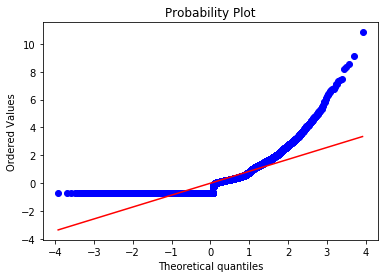

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.1321
Kurtosis: 7.545
Overview of variable:  fd 


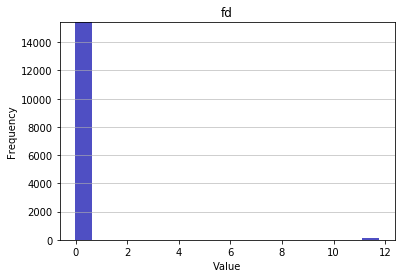

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.0845044515812943
Mean: -0.0
Standard deviation: 1.0
Median: -0.0845
Maximal value: 11.833696110529612


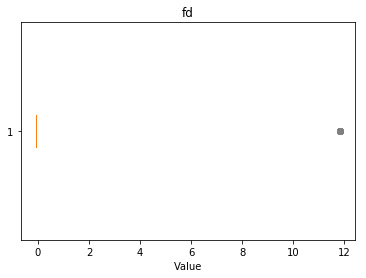

-------------------- 
Outlier detection:
 --------------------
List of outliers: {11.83}


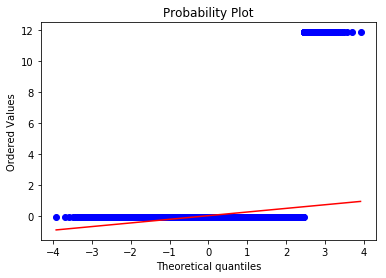

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 11.7492
Kurtosis: 136.0435
Overview of variable:  elementals 


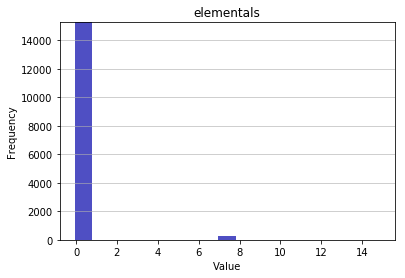

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.12842033989306562
Mean: -0.0
Standard deviation: 1.0
Median: -0.1284
Maximal value: 14.907905343888217


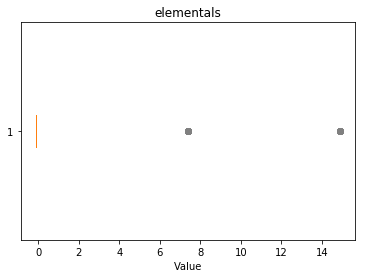

-------------------- 
Outlier detection:
 --------------------
List of outliers: {14.91, 7.39}


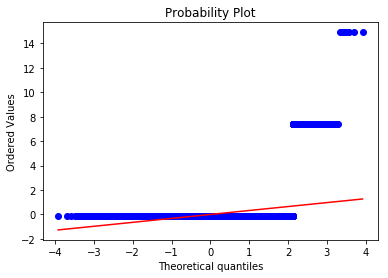

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 8.0217
Kurtosis: 67.5334
Overview of variable:  firedrakes 


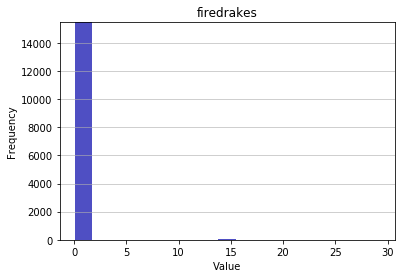

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.06447354439203289
Mean: -0.0
Standard deviation: 1.0
Median: -0.0645
Maximal value: 29.354425505549088


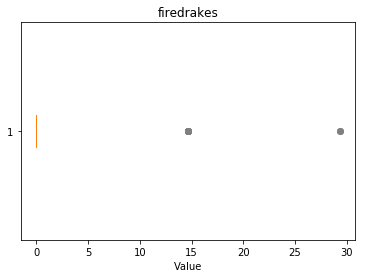

-------------------- 
Outlier detection:
 --------------------
List of outliers: {29.35, 14.64}


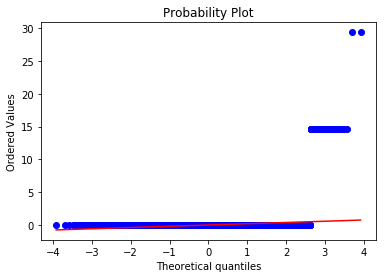

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 16.2181
Kurtosis: 282.4822
Overview of variable:  waterdrakes 


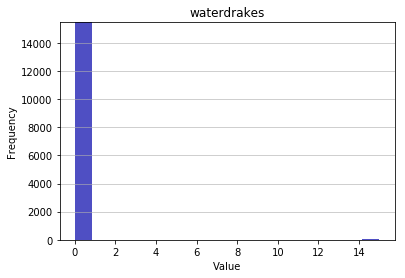

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.0663508424000336
Mean: -0.0
Standard deviation: 1.0
Median: -0.0664
Maximal value: 15.071398701631159


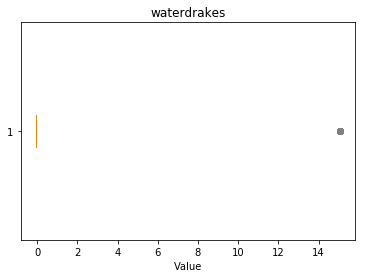

-------------------- 
Outlier detection:
 --------------------
List of outliers: {15.07}


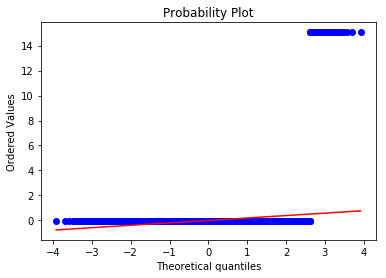

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 15.005
Kurtosis: 223.1515
Overview of variable:  earthdrakes 


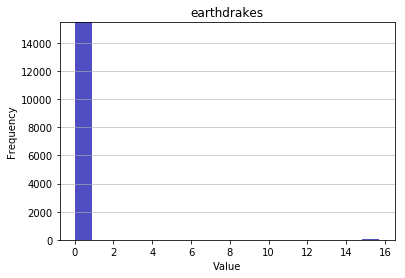

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.06334370983749864
Mean: -0.0
Standard deviation: 1.0
Median: -0.0633
Maximal value: 15.786887167887562


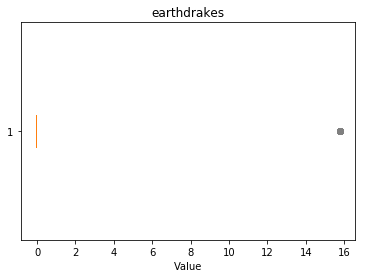

-------------------- 
Outlier detection:
 --------------------
List of outliers: {15.79}


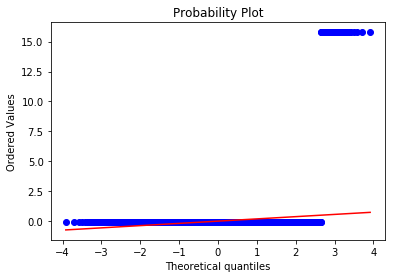

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 15.7235
Kurtosis: 245.2298
Overview of variable:  airdrakes 


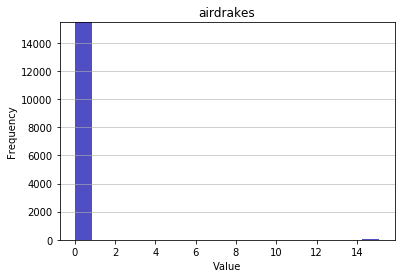

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.06585902971628557
Mean: -0.0
Standard deviation: 1.0
Median: -0.0659
Maximal value: 15.183946746678554


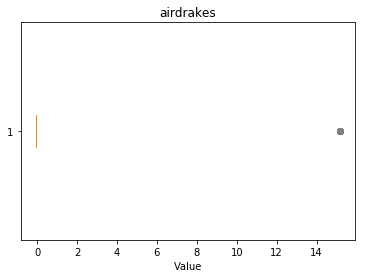

-------------------- 
Outlier detection:
 --------------------
List of outliers: {15.18}


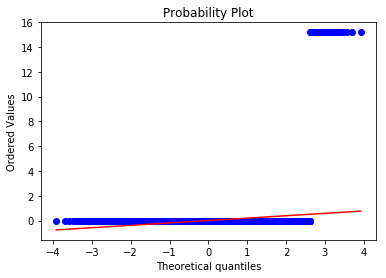

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 15.1181
Kurtosis: 226.5566
Overview of variable:  elders 


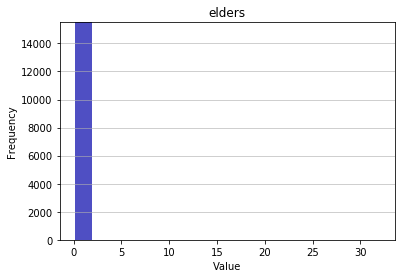

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.031109554392111962
Mean: 0.0
Standard deviation: 1.0
Median: -0.0311
Maximal value: 32.14446556822289


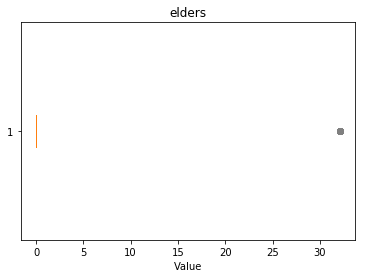

-------------------- 
Outlier detection:
 --------------------
List of outliers: {32.14}


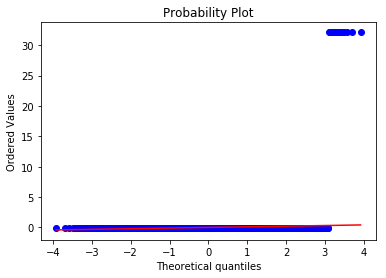

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 32.1134
Kurtosis: 1029.2676
Overview of variable:  herald 


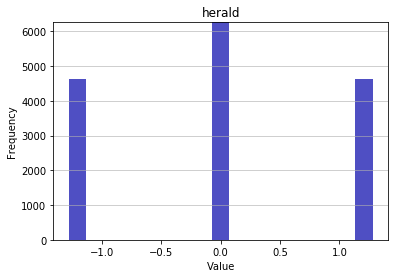

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.2946435756221635
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 1.2946435756221635


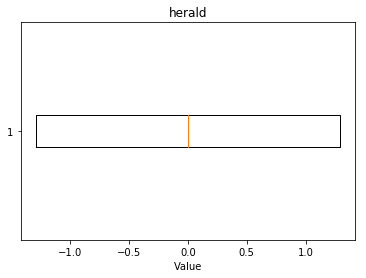

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


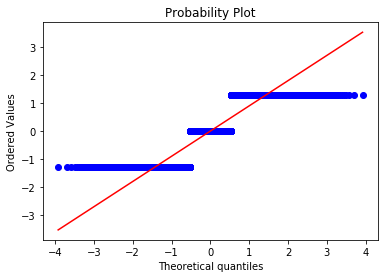

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -1.3239
Overview of variable:  dmgtochamps 


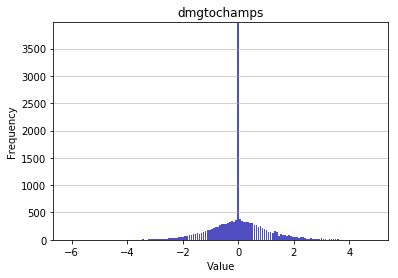

-------------------- 
Summary statistics:
 --------------------
Minimum value: -6.113625898140282
Mean: -0.0
Standard deviation: 1.0
Median: -0.0017
Maximal value: 4.855942317220378


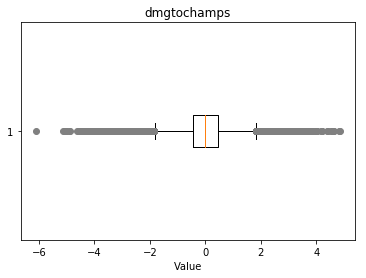

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.0, 3.36, 3.27, 3.16, 3.09, 3.73, 3.69, 3.28, 3.5, 3.03, 4.01, 3.25, -3.07, 4.18, -4.14, 3.11, 3.68, 3.61, 3.93, -3.46, -3.21, 3.54, -3.53, -3.03, -3.78, -3.35, 4.86, 4.22, 4.36, -4.1, 3.15, 3.22, -3.24, -3.17, -3.42, -3.74, -3.49, 3.01, -3.31, 3.26, 3.33, 3.51, 3.08, -3.06, -5.13, -4.38, -4.63, -4.06, -4.45, 3.44, -3.45, -3.63, 3.19, -3.2, -3.38, -3.88, -3.13, 3.05, 3.3, 3.12, 3.87, -3.52, -3.77, -3.02, -4.02, -4.16, -4.23, -4.27, 3.48, -3.59, -3.66, -3.09, -3.91, -4.09, 3.66, -3.23, 3.41, 3.59, 4.52, 4.59, -5.05, -4.87, 3.52, 3.02, -3.87, -3.12, -3.55, -3.8, 3.45, 3.13, -3.19, 4.2, 4.56, 4.81, 4.63, -4.9, -4.4, -4.51, 3.56, -3.33, -3.08, -3.26, -3.01, 3.67, -3.15, 3.17, -3.47, -3.22, 4.6, 4.42, 3.49, -4.29, 3.53, 3.35, 3.85, -3.29, 3.6, -3.79, -3.04, 3.21, -3.93, 3.46, 4.03, -4.43, -4.57, 3.39, 3.32, -3.25, 3.14, -3.0, -3.75, 3.82, -6.11, -5.04, -4.19, -3.14}


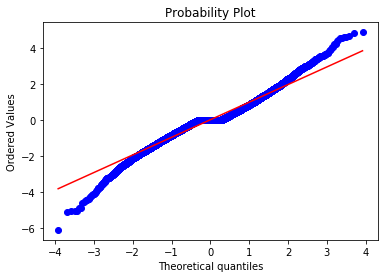

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0029
Kurtosis: 2.1716
Overview of variable:  dmgtochampsperminute 


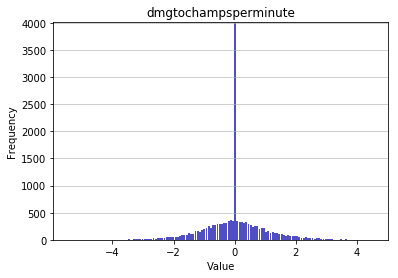

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.436155219468476
Mean: 0.0
Standard deviation: 1.0
Median: -0.0115
Maximal value: 4.526837863740396


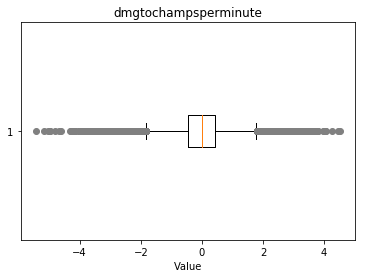

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.26, 3.09, 3.18, 3.48, 3.76, 3.22, 3.23, 3.45, 3.04, 3.05, 4.28, 3.75, -3.14, 4.07, -5.03, -4.96, 3.11, 3.36, 3.61, -3.96, -3.21, 3.79, -3.1, -3.28, -3.03, 3.54, 3.29, -3.6, 4.04, 3.72, 3.65, 3.15, -3.24, -3.99, -3.42, 3.97, -3.17, 3.47, -3.49, 3.01, -3.06, 3.08, 3.51, -3.81, 4.01, 3.19, -3.45, -3.2, -3.7, -3.13, -3.63, 3.3, -3.02, -3.77, -3.27, 3.55, 3.62, 3.37, -5.16, -4.98, -3.34, -3.09, -3.59, 3.59, -3.73, 3.34, 3.66, 3.16, 4.02, -4.69, -4.19, -4.62, 3.02, -3.05, -3.3, -3.12, -3.87, 3.2, -3.69, 3.13, -3.19, -3.44, -4.26, -4.15, 3.56, -3.58, -3.08, -3.76, -3.01, 3.17, -3.4, -3.15, -3.65, -3.9, -4.29, 3.28, 3.03, -3.79, 3.1, 3.6, 3.21, -3.36, -3.86, 3.46, -3.11, 4.46, 4.53, -3.43, -4.32, -4.82, 3.57, 3.39, -3.75, -5.44, -4.04, -3.22}


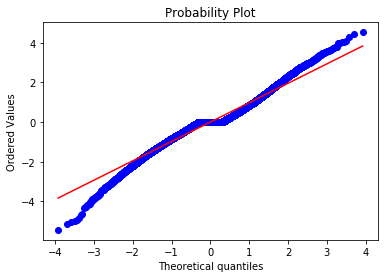

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0191
Kurtosis: 1.8735
Overview of variable:  dmgshare 


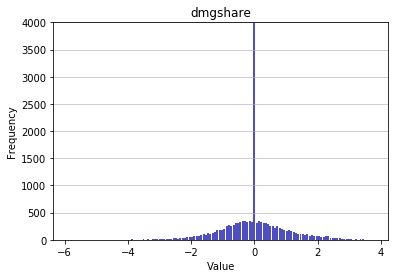

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.878735961586016
Mean: 0.0
Standard deviation: 1.0
Median: -0.0291
Maximal value: 3.7531208138875085


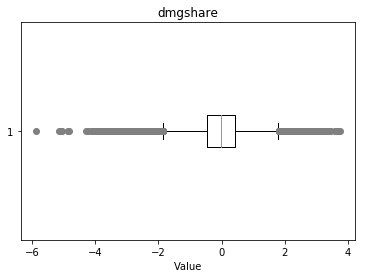

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.04, 3.14, 3.09, 3.4, 3.08, 3.03, 3.19, 3.44, 3.01, 3.37, 3.75, -3.14, -3.82, -3.39, 3.0, -4.03, 3.43, 3.36, 3.11, 3.18, -3.96, 3.61, 3.29, -3.1, -3.85, -3.53, -3.03, -3.28, -3.35, -4.85, 3.15, -3.74, 3.22, -3.17, -3.49, 3.33, -3.06, -3.56, 3.58, -5.88, -5.06, -4.81, -4.13, -3.2, -3.95, -3.7, -3.88, -3.38, -3.45, 3.3, -3.77, -3.27, -3.02, -3.52, -3.59, -3.16, -3.66, -3.84, -3.34, -3.09, 3.41, -4.05, 3.27, 3.02, -3.3, -3.8, -3.87, -3.37, -3.12, 3.7, -3.94, -3.69, 3.45, 3.2, -5.15, -4.08, -4.01, 3.31, -3.01, -3.08, -3.72, -3.97, -3.15, -3.22, -4.86, -4.22, 3.6, -3.04, -3.29, 3.21, -3.18, -3.86, -3.11, -3.36, -4.07, 3.32, -3.25, -3.5, -3.0, 3.64, 3.39, -5.09, -4.29, -3.55}


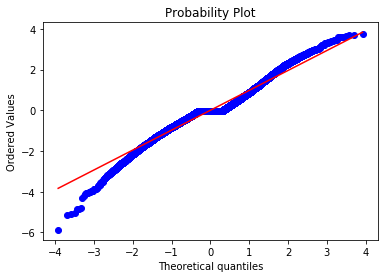

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0115
Kurtosis: 1.6399
Overview of variable:  earnedgoldshare 


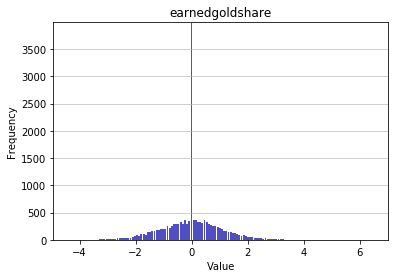

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.399578499765243
Mean: -0.0
Standard deviation: 1.0
Median: 0.0168
Maximal value: 6.48217876797412


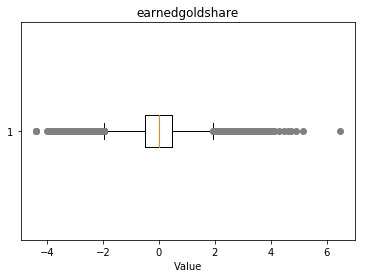

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.16, 3.0, 3.56, 3.01, 3.12, 3.08, 3.15, 3.3, 3.11, 3.64, 5.16, 6.48, 3.25, -3.39, -3.14, -3.07, -3.89, 3.68, -3.21, 3.18, 3.61, 3.29, -3.1, -3.28, -3.53, -3.03, 4.47, 4.11, -3.78, 3.4, 3.9, 3.65, -3.17, -3.67, -3.42, -3.99, -3.24, 3.26, -3.06, 3.51, 3.33, 3.83, 4.08, 3.76, 3.44, -3.2, -3.13, 3.19, -3.45, 3.37, 3.87, -3.02, 3.05, 4.62, 4.05, 3.48, -3.09, -3.16, -3.91, -3.41, -3.66, 3.09, -3.98, -3.23, -3.48, 4.91, 4.02, 3.77, 3.02, 3.27, -3.8, -3.12, 3.63, -3.19, 3.2, 3.38, -3.94, 4.31, -4.4, 3.06, -3.33, -3.58, 3.49, 3.24, 3.99, 3.92, -3.4, 4.74, 3.1, -3.79, 3.03, 3.28, -3.29, 3.46, -3.36, -3.86, 3.21, -3.68, 4.03, 3.14, 3.82, 3.57, -3.25, 3.07, -4.39, -3.05}


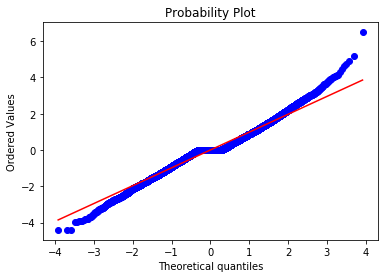

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0489
Kurtosis: 1.4895
Overview of variable:  wards 


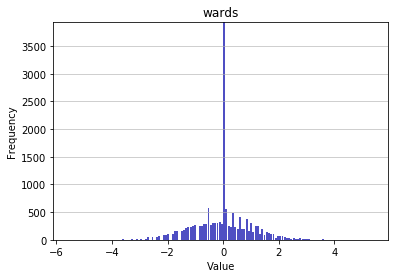

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.56445082892309
Mean: 0.0
Standard deviation: 1.0
Median: 0.0121
Maximal value: 5.396953913515587


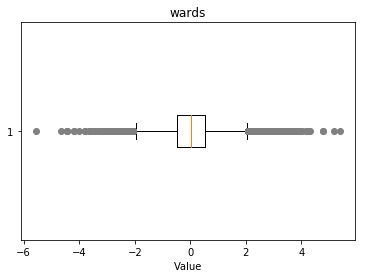

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.13, 3.03, 3.56, 4.78, 3.23, 5.17, 3.2, 3.06, 3.49, 3.16, 4.18, 5.4, 3.59, 3.83, 3.74, 4.32, -4.2, 3.27, 3.68, -3.8, 3.52, 3.1, 3.43, 3.71, -3.61, -3.43, -3.27, 3.95, 4.04, 3.62, 3.3, 4.29, 3.46, -4.43, 3.4, 3.89, -3.99, -5.56, -4.67, -3.11}


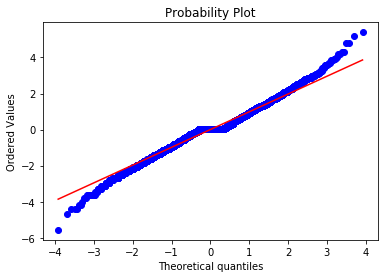

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0273
Kurtosis: 1.2576
Overview of variable:  wpm 


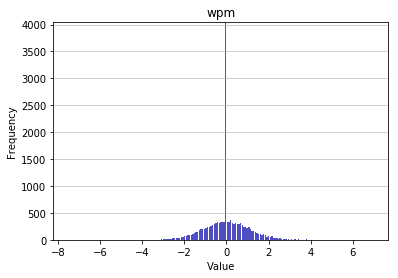

-------------------- 
Summary statistics:
 --------------------
Minimum value: -7.513683375322453
Mean: -0.0
Standard deviation: 1.0
Median: -0.0062
Maximal value: 6.978488450356224


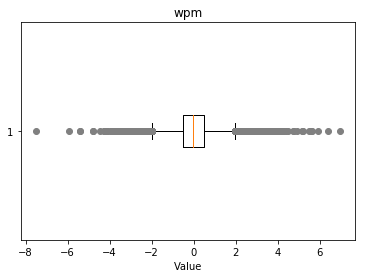

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.2, 3.66, 3.65, 5.5, 3.93, 4.05, 4.74, 3.29, 3.85, 3.11, 5.63, 5.6, 6.41, 3.5, -3.14, 5.93, -4.78, -4.14, 3.36, -3.21, 3.04, -3.78, -3.03, -3.6, -3.35, 4.47, 3.54, 4.22, 4.04, 4.79, 5.22, -5.42, -4.17, 3.47, 3.4, -3.49, -3.24, -3.17, 3.9, 3.22, 3.08, -3.56, 3.83, -3.81, 3.33, 5.15, -4.2, -4.13, 3.44, -3.2, -3.45, -3.13, -3.38, 3.8, -3.27, 3.62, 3.05, 3.55, 3.3, -3.02, 3.12, 4.12, -4.27, 3.23, -3.91, -3.34, 3.59, -3.23, -3.48, 3.41, 4.91, 4.16, 6.98, -4.12, 3.77, -3.12, -3.3, -3.05, 3.38, -3.44, 3.45, 4.31, 4.06, 3.06, -3.08, -3.83, -3.58, -3.01, 3.74, -3.72, -3.22, -3.4, 3.67, 4.17, 3.92, 3.49, -4.29, -4.79, -4.11, 3.03, -3.04, 3.6, 3.1, -3.29, 3.78, 3.28, 3.53, -3.79, 3.46, -3.93, -3.43, -3.11, 3.21, 4.39, -3.61, 4.14, 3.71, -5.43, 3.14, -3.75, 3.82, -7.51, -5.95, -4.47, -3.06}


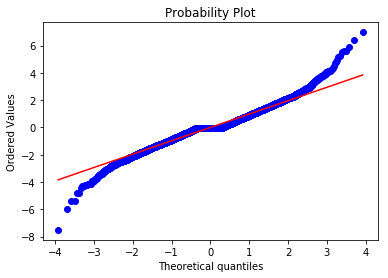

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0731
Kurtosis: 2.3289
Overview of variable:  wardshare 


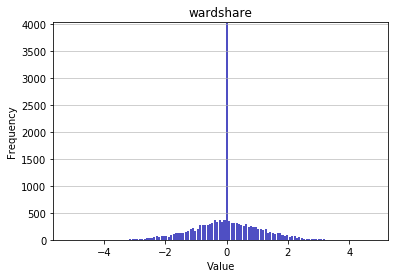

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.1522094774722085
Mean: 0.0
Standard deviation: 1.0
Median: -0.0125
Maximal value: 4.782097515286872


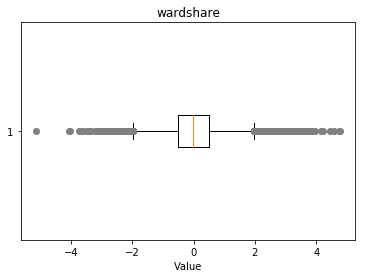

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.48, 3.13, 3.31, 3.2, 3.12, 4.14, 3.17, 3.01, 3.86, 4.45, 4.74, 3.55, 3.84, 3.25, -3.72, -3.14, -3.4, -3.48, -3.06, -3.07, -3.15, 4.23, 3.09, 3.02, 3.52, 3.38, 3.16, 3.88, 3.7, 3.06, 3.03, 3.6, -3.05, -3.13, -3.7, -3.2, -3.12, -3.45, -3.62, -3.04, 3.35, 3.05, 3.71, 3.07, 3.47, 3.95, -3.35, -3.19, -3.11, -3.43, 3.3, 3.8, 3.11, 3.37, 3.62, -3.1, 4.78, 3.18, 3.43, -4.08, 3.23, -3.08, -3.01, -3.17, -3.09, 3.39, 3.14, 3.44, 3.08, 3.56, 4.57, -5.15, -4.05, -3.03, -3.73}


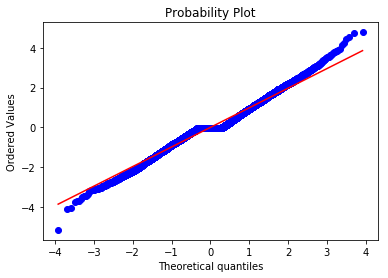

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.059
Kurtosis: 1.042
Overview of variable:  wardkills 


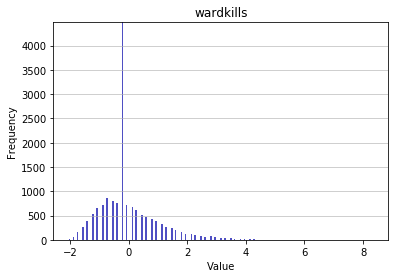

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.0462106545474574
Mean: 0.0
Standard deviation: 1.0
Median: -0.2027
Maximal value: 8.344374024305115


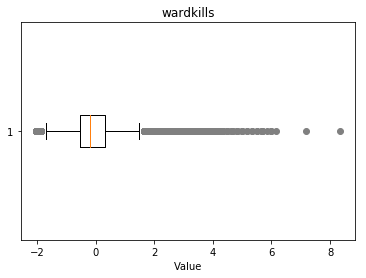

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.32, 3.82, 4.66, 4.32, 3.65, 6.17, 4.99, 5.66, 3.15, 3.99, 5.5, 5.16, 6.0, 8.34, 4.15, 4.49, 4.82, 5.33, 5.83, 7.17, 3.48}


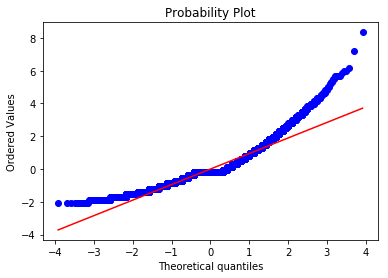

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3918
Kurtosis: 3.4498
Overview of variable:  wcpm 


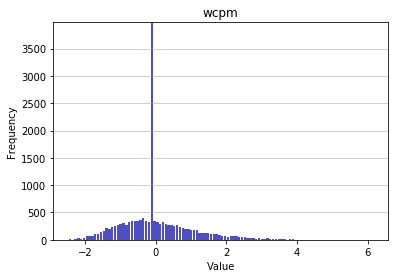

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.470187175874526
Mean: 0.0
Standard deviation: 1.0
Median: -0.1086
Maximal value: 6.162577611983312


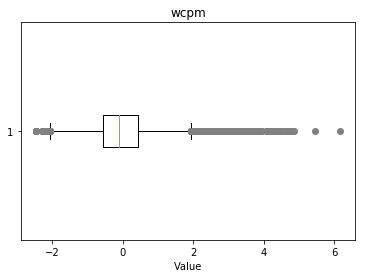

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.35, 3.25, 4.32, 4.67, 3.23, 3.1, 4.5, 3.87, 4.39, 3.0, 4.2, 5.45, 6.16, 3.5, 3.75, 4.25, 4.75, 4.68, 3.43, 3.11, 3.86, 3.68, 3.18, 3.79, 3.04, 3.54, 3.29, 4.72, 4.36, 3.65, 3.9, 3.15, 3.47, 3.22, 3.51, 3.01, 3.58, 3.26, 3.83, 3.08, 3.33, 3.44, 3.19, 3.62, 3.8, 3.3, 3.12, 3.05, 4.05, 4.62, 4.19, 4.8, 4.55, 3.73, 3.48, 3.09, 3.34, 3.59, 3.16, 3.66, 4.84, 3.41, 4.41, 3.91, 3.77, 3.02, 3.52, 3.27, 3.2, 3.45, 3.13, 4.45, 4.81, 3.06, 3.31, 3.81, 3.17, 3.67, 3.42, 3.24, 4.42, 4.1, 3.53, 3.78, 3.03, 3.46, 3.21, 3.96, 3.71, 4.14, 4.64, 4.46, 3.07, 3.82, 3.57, 3.32, 3.64, 3.14}


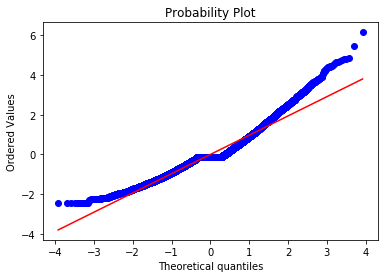

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.8704
Kurtosis: 1.6952
Overview of variable:  visionwards 


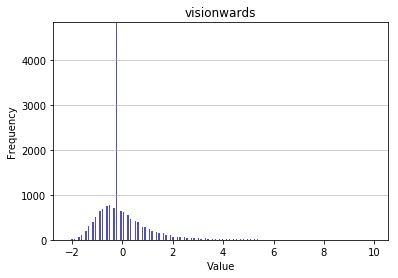

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.1380334518505633
Mean: -0.0
Standard deviation: 1.0
Median: -0.193
Maximal value: 9.949199407604326


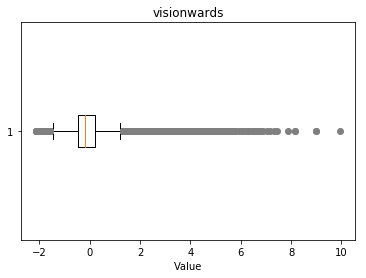

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.28, 3.14, 3.56, 6.61, 7.17, 3.84, 3.0, 5.09, 5.23, 3.7, 4.53, 6.75, 8.14, 3.42, 9.95, 4.25, 4.67, 5.5, 5.92, 6.48, 6.34, 8.98, 4.39, 4.11, 4.95, 4.81, 5.64, 5.36, 5.78, 6.06, 6.2, 6.89, 7.31, 7.03, 7.45, 7.87, 3.98}


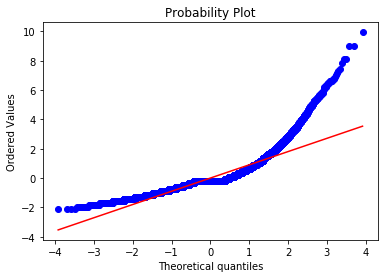

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.2707
Kurtosis: 9.3155
Overview of variable:  visionwardbuys 


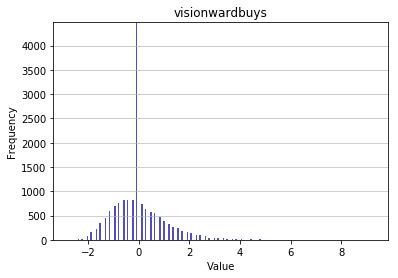

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.7665861641175957
Mean: 0.0
Standard deviation: 1.0
Median: -0.0733
Maximal value: 9.263445207886878


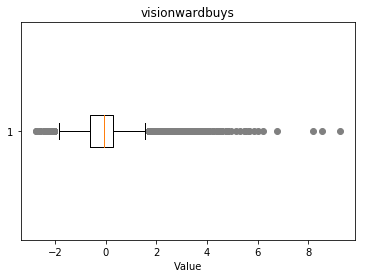

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.16, 3.52, 3.34, 4.06, 3.88, 4.77, 3.7, 4.42, 8.55, 9.26, 5.13, 5.49, 6.75, 8.19, 4.6, 4.24, 5.67, 5.85, 4.95, 5.31, 6.03, 6.21}


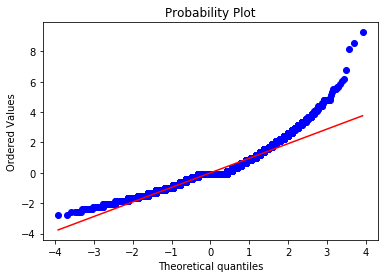

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1691
Kurtosis: 3.6595
Overview of variable:  totalgold 


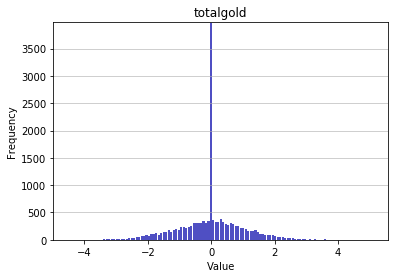

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.500319386298267
Mean: -0.0
Standard deviation: 1.0
Median: 0.0144
Maximal value: 5.105553334282411


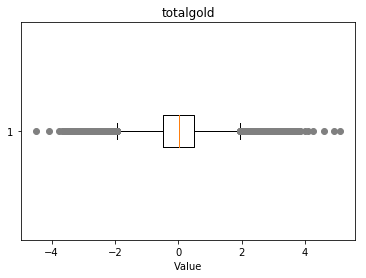

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.55, 3.22, 3.42, 3.12, 3.26, 3.08, 3.09, 3.36, 3.65, 3.1, 4.26, 5.11, -3.05, 3.83, -3.56, -3.07, 3.01, 3.58, 4.6, 3.25, 3.75, 3.24, 4.91, 4.09, 3.16, 3.02, -3.4, -3.54, -3.18, -3.62, -3.22, 3.67, -3.47, 3.61, -3.21, -3.04, 3.19, 3.52, 3.44, 3.11, 3.68, 3.85, -3.29, -3.13, -3.11, -3.08, 3.05, -3.46, 3.45, 3.71, -3.27, 3.13, -3.44, 3.37, 3.29, 3.79, -3.36, -3.52, -3.06, -3.31, -3.28, -3.53, -3.03, -3.42, -3.38, -3.77, -3.63, -3.41, -4.09, 3.14, 3.72, 3.48, 3.23, 3.56, 3.98, -3.17, -3.24, -3.01, -3.16, -3.66, -4.5, -3.15, -3.37}


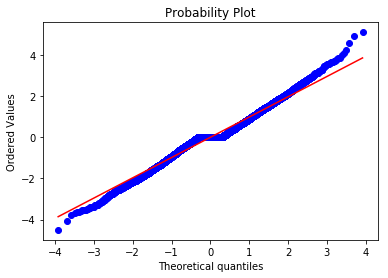

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0018
Kurtosis: 1.0541
Overview of variable:  earnedgpm 


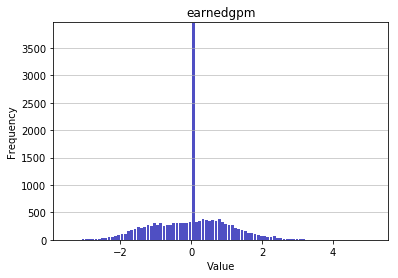

-------------------- 
Summary statistics:
 --------------------
Minimum value: -3.4717787131696136
Mean: -0.0
Standard deviation: 1.0
Median: 0.0323
Maximal value: 5.144848664019487


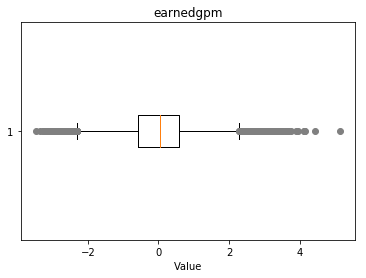

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.66, 3.04, 3.05, 3.02, 3.63, 3.41, 3.4, 5.14, 3.3, 3.0, 4.15, 3.34, 3.59, 3.01, 3.25, 3.16, -3.07, -3.06, 4.43, 3.75, 3.67, -3.47, 3.26, -3.22, 3.03, 3.52, -3.04, -3.13, 3.94, 3.1, 3.13, 3.45, 3.37, -3.35, 3.12, 4.13, -3.03, -3.18, 4.11, 3.51, 3.15, 3.23, -3.08, -3.26, 3.14, -3.17, 3.89, -3.27}


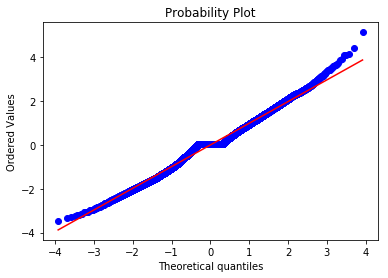

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0181
Kurtosis: 0.4258
Overview of variable:  goldspent 


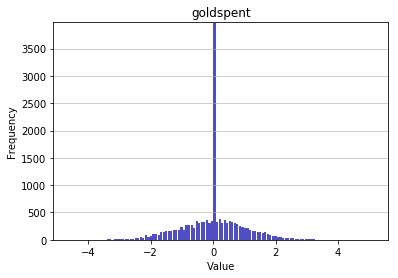

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.632370579041216
Mean: -0.0
Standard deviation: 1.0
Median: 0.0097
Maximal value: 5.126808855371604


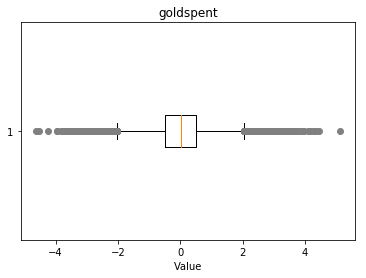

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.62, 3.24, 3.78, 3.54, 3.04, 3.47, 3.43, 3.05, 4.18, 4.28, 4.14, 5.13, 3.98, 3.51, -3.22, 3.75, -3.06, 3.16, 4.1, 3.49, 3.25, 3.09, 4.43, 4.34, -3.55, -3.8, -3.51, -3.76, -3.65, -3.01, -3.09, -3.29, -4.55, 3.94, -3.38, 3.02, 3.18, 3.27, 3.19, 3.03, 3.52, 3.44, 3.68, -3.13, -3.08, -3.14, 3.74, 3.82, -3.83, 3.38, -3.35, -3.28, 3.2, 3.29, 3.21, -3.69, 3.13, -3.03, -3.94, -3.19, 3.61, -3.45, 3.26, -4.25, -3.16, 3.23, -3.25, -3.41, 3.06, 3.39, -3.0, 3.64, 3.15, 3.14, 3.89, -3.58, -4.63, -3.32, -3.48, -3.62}


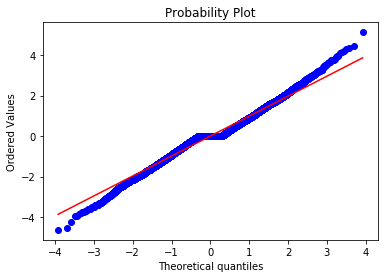

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.017
Kurtosis: 1.1581
Overview of variable:  gspd 


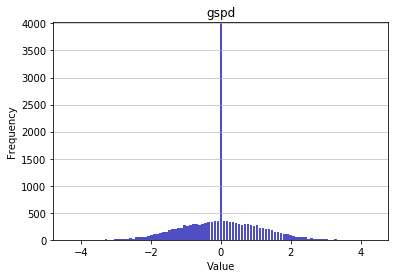

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.36496607519859
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 4.36496607519859


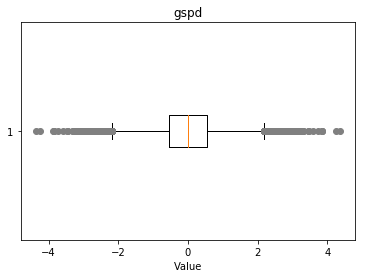

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.25, 3.2, 3.72, 3.09, 4.24, 3.59, 3.03, 3.05, 3.3, 3.06, 4.36, 3.0, -3.72, -3.06, 3.84, 3.01, -3.15, -3.14, -3.07, -3.23, -4.36, 3.43, -3.05, -3.3, 3.19, -3.29, -3.46, -3.04, 3.18, -3.21, 3.86, 3.29, -3.03, -3.43, -3.19, 3.46, 3.04, -3.18, 3.21, -3.86, 3.15, -3.09, -3.59, -3.25, -3.0, -3.84, -3.01, 3.14, 3.07, 3.23, -4.24, -3.2}


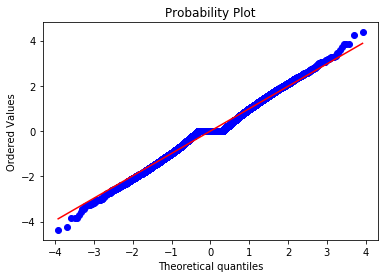

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 0.5648
Overview of variable:  minionkills 


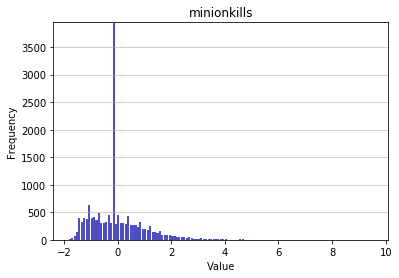

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.8308606311707112
Mean: -0.0
Standard deviation: 1.0
Median: -0.1264
Maximal value: 9.532351417629226


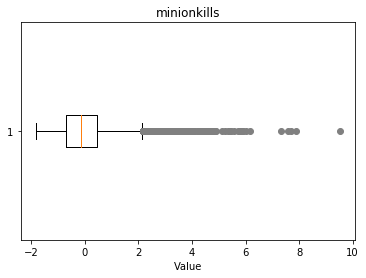

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.16, 3.2, 4.91, 6.16, 7.58, 3.12, 3.97, 3.57, 4.3, 4.66, 4.82, 5.43, 7.71, 3.24, 3.08, 3.49, 4.09, 4.5, 4.01, 4.42, 4.26, 4.74, 4.34, 4.58, 5.23, 5.35, 6.0, 5.92, 7.34, 9.53, 3.36, 3.69, 3.85, 3.61, 3.44, 3.53, 3.77, 3.28, 3.93, 3.04, 4.54, 4.22, 4.87, 4.05, 4.38, 5.8, 5.47, 5.88, 4.62, 4.7, 5.56, 5.11, 5.72, 4.18, 7.87, 3.89, 3.65, 3.4, 3.32, 3.81, 3.73}


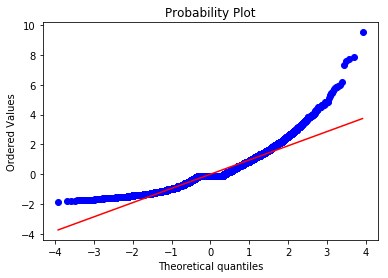

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.3507
Kurtosis: 3.8848
Overview of variable:  monsterkills 


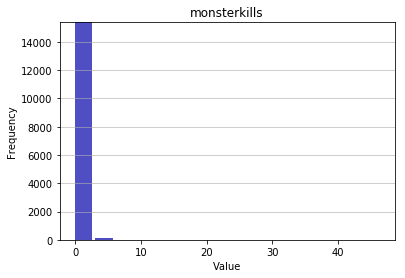

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.2465183934223299
Mean: 0.0
Standard deviation: 1.0
Median: -0.2465
Maximal value: 46.493082072126384


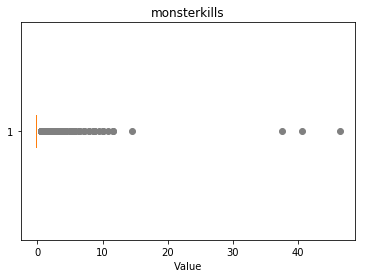

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.46, 4.2, 4.95, 6.43, 7.91, 40.56, 8.66, 10.88, 5.69, 7.17, 10.14, 46.49, 9.4, 11.62, 14.59, 37.59}


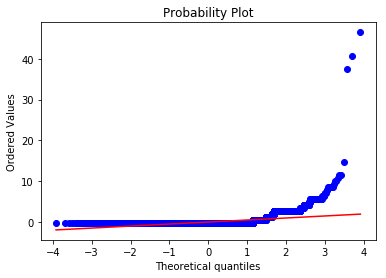

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 16.9348
Kurtosis: 619.1941
Overview of variable:  monsterkillsownjungle 


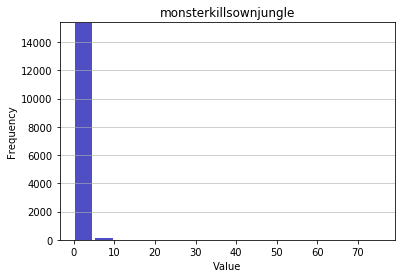

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.10945876629787168
Mean: 0.0
Standard deviation: 1.0
Median: -0.1095
Maximal value: 75.6441457100671


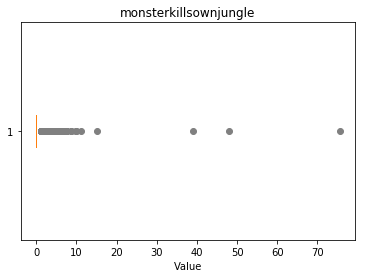

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.68, 4.94, 6.2, 7.47, 8.73, 9.99, 39.03, 75.64, 11.25, 47.87, 15.04}


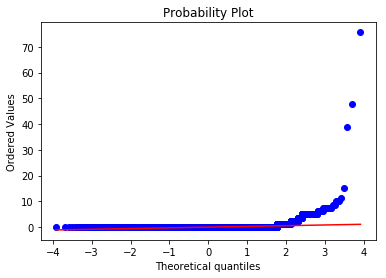

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 40.9121
Kurtosis: 2610.7823
Overview of variable:  monsterkillsenemyjungle 


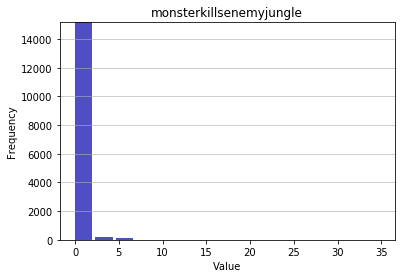

-------------------- 
Summary statistics:
 --------------------
Minimum value: -0.19242709759145551
Mean: -0.0
Standard deviation: 1.0
Median: -0.1924
Maximal value: 34.94958575742727


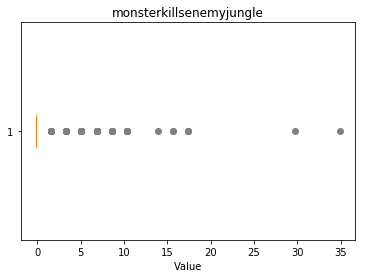

-------------------- 
Outlier detection:
 --------------------
List of outliers: {34.95, 3.32, 5.08, 6.84, 8.59, 10.35, 13.86, 15.62, 17.38, 29.68}


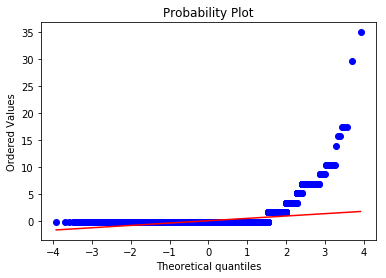

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 10.4035
Kurtosis: 201.2162
Overview of variable:  cspm 


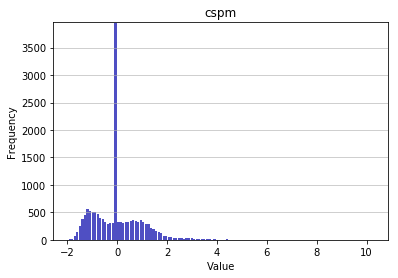

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.946859965047254
Mean: -0.0
Standard deviation: 1.0
Median: -0.1045
Maximal value: 10.26197275510784


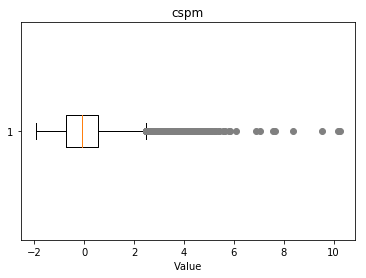

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.18, 3.35, 3.36, 3.51, 3.02, 7.55, 3.17, 9.53, 4.06, 3.62, 4.07, 5.57, 8.39, 3.75, 3.0, 3.25, 10.26, 4.18, 4.82, 4.43, 4.5, 5.18, 5.82, 3.93, 3.68, 3.61, 10.18, 3.43, 3.11, 3.04, 3.79, 3.54, 3.29, 4.54, 4.72, 4.22, 4.04, 5.04, 5.11, 7.04, 3.65, 3.72, 3.47, 3.15, 3.4, 3.97, 3.22, 3.26, 3.01, 3.33, 3.08, 3.58, 4.4, 4.58, 4.26, 4.83, 5.26, 6.9, 3.19, 3.69, 3.44, 3.3, 3.55, 3.12, 3.87, 4.37, 4.3, 4.44, 4.69, 5.05, 3.73, 3.98, 3.48, 3.66, 3.59, 3.91, 3.16, 3.84, 4.98, 4.34, 3.09, 4.27, 4.23, 5.84, 4.16, 5.27, 4.84, 4.66, 6.09, 7.66, 3.52, 3.27, 3.63, 3.2, 3.13, 4.81, 4.45, 4.13, 4.2, 4.38, 5.63, 4.88, 4.7, 3.06, 3.56, 3.42, 3.99, 3.92, 3.67, 3.24, 4.35, 4.6, 5.42, 3.1, 3.53, 3.6, 3.85, 3.21, 4.96, 5.39, 3.14, 3.39, 3.89, 3.32, 3.07, 3.57}


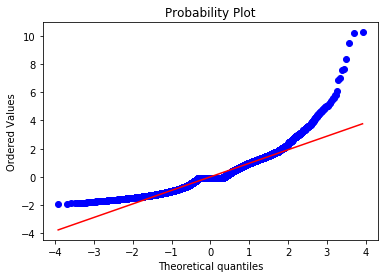

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.2696
Kurtosis: 4.7297
Overview of variable:  goldat10 


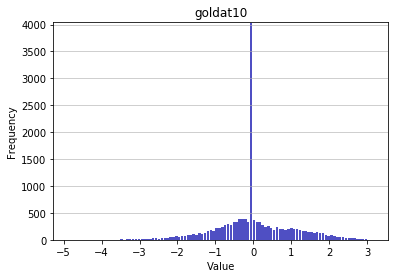

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.873755208717902
Mean: 0.0
Standard deviation: 1.0
Median: -0.0453
Maximal value: 3.1605537226628235


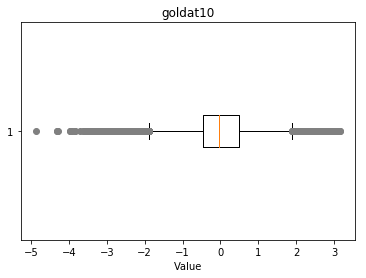

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.01, 3.13, 3.1, 3.08, 3.16, 3.15, 3.09, -3.57, -3.22, -3.97, -3.31, -3.39, -3.98, -3.06, -3.07, -3.47, -3.33, -3.15, -3.43, -4.29, -4.87, -3.46, -3.21, -3.37, -3.45, -3.62, -3.12, -3.2, -3.13, -3.05, -3.54, -3.18, -3.11, -3.02, -3.69, -3.53, -3.85, -3.94, -3.61, -3.28, -3.1, -3.49, -3.16, -3.01, -3.24, -3.41, -3.08, -3.25, -3.5, -3.92, -3.17, -4.32, -3.29}


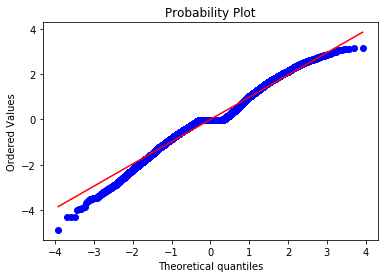

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0648
Kurtosis: 0.933
Overview of variable:  gdat10 


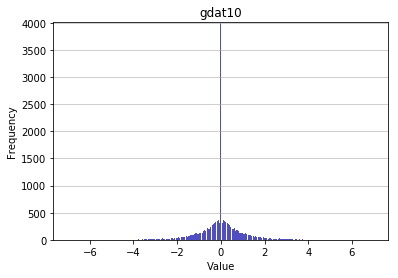

-------------------- 
Summary statistics:
 --------------------
Minimum value: -6.970902463772403
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 6.970902463772403


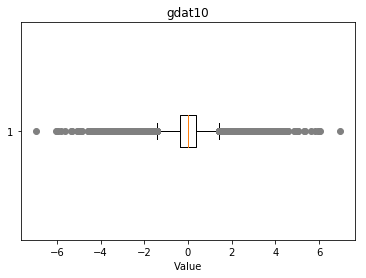

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.12, 3.69, 5.06, 3.41, 3.74, 3.22, 4.19, 3.09, 3.29, 3.4, 6.97, 5.83, 6.04, 3.25, -3.14, -3.32, 3.5, -3.39, -3.57, 4.5, 3.75, -3.64, -3.89, 5.32, -5.96, -4.46, -4.39, 3.11, -3.21, 3.18, 3.68, 3.86, 3.36, 3.79, -3.1, -3.35, -3.6, -3.03, 4.11, 4.04, 4.29, -3.85, -3.53, -3.28, -5.99, -4.49, -4.17, -4.1, 3.72, -3.74, -3.49, 3.15, -3.24, 3.65, 3.26, 3.08, -3.56, 3.76, 3.51, 4.01, 4.51, 3.01, 5.01, -5.06, -4.56, -4.06, 3.94, -3.2, -3.38, -3.7, 3.19, 3.44, -3.45, 3.05, -3.77, -3.02, 3.62, 4.37, 4.12, 5.05, 5.62, -5.34, -4.34, -4.84, -4.91, 3.48, -3.41, -3.09, -3.84, 3.23, -3.16, -3.59, -3.91, 3.73, 3.84, -3.48, -3.23, 3.16, 3.59, 4.34, 4.84, 4.91, 3.91, -3.73, 5.34, -5.05, -5.62, -4.37, -4.19, -4.12, 3.77, -3.05, -3.12, 3.02, -3.62, 3.7, -3.19, -3.94, 3.2, 3.38, 4.56, -3.69, -3.44, 4.06, 3.45, -5.01, -4.01, -4.51, 3.56, -3.26, -3.08, -3.76, -3.51, -3.01, 3.49, -3.4, -3.72, -3.15, 3.24, 4.49, 4.17, 4.1, -3.65, 5

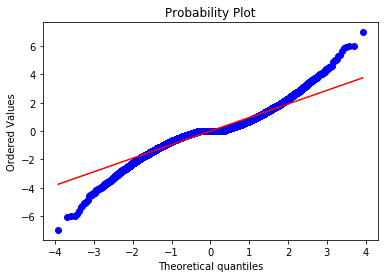

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 4.1108
Overview of variable:  goldat15 


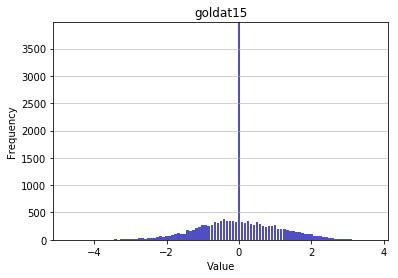

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.709058178460946
Mean: 0.0
Standard deviation: 1.0
Median: -0.0165
Maximal value: 3.709284812374471


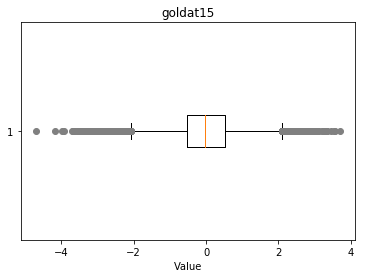

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.08, 3.56, 3.29, 3.33, 3.47, 3.55, 3.19, 3.71, 3.05, 3.25, 3.12, 3.01, -3.57, -3.31, -3.23, -3.14, -3.06, -3.15, -3.4, 3.34, -3.01, -3.38, -3.04, -3.12, -3.46, -3.05, -3.37, -3.63, -3.7, 3.07, -3.99, 3.04, -3.02, -3.44, -3.36, -3.27, -3.19, -3.1, -3.18, -3.11, -3.53, -3.93, -4.18, 3.06, -3.51, -3.67, -3.17, -3.08, -3.09, -3.25, -3.16, -3.0, -3.24, -3.49, -4.71, -3.26}


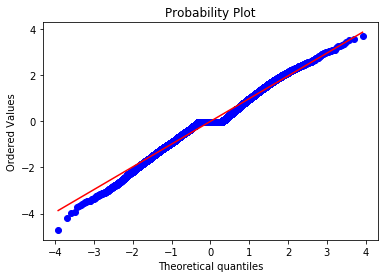

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.0465
Kurtosis: 0.7173
Overview of variable:  gdat15 


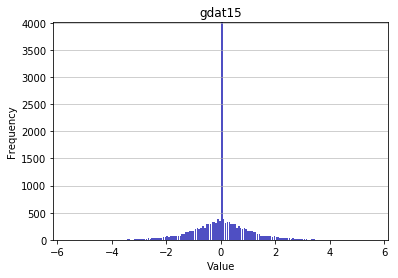

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.589164432138654
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 5.589164432138654


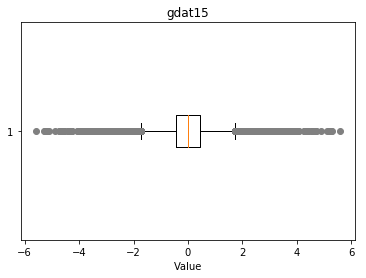

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.77, 3.35, 4.42, 3.43, 3.09, 3.01, 4.03, 3.02, 3.57, 3.1, 4.26, 5.11, 3.25, -3.14, -3.82, -3.39, -3.07, 3.0, -3.32, -3.64, 4.57, -3.89, 5.25, -4.03, -4.28, 3.68, -3.21, 3.18, 3.11, -3.46, 3.29, -3.1, -3.28, -3.03, -3.53, -3.35, -3.6, 4.72, 3.04, 5.22, -4.42, 3.15, 3.4, -3.17, 3.72, 3.22, 3.26, -3.06, -3.31, 3.58, 3.51, 4.9, 4.58, -4.38, 3.94, -3.38, -3.13, -3.95, -3.63, -3.7, 3.05, -3.02, -3.77, 3.12, 4.69, 5.3, -5.16, -5.59, -4.09, -4.52, -3.09, -3.66, -3.41, -3.91, -3.34, -3.16, 3.66, 3.41, 3.91, 3.34, 3.16, 4.09, 4.52, 5.16, 5.59, -5.3, -3.05, -3.12, 3.13, 3.95, 3.38, 3.63, 3.7, 4.38, -3.94, -4.26, -4.9, -4.58, 3.06, -3.26, 3.31, -3.01, -3.58, -3.51, 3.17, -3.4, -3.72, -3.15, -3.22, -5.11, -5.22, -4.72, 3.53, 3.28, -3.29, 3.03, 3.6, -3.04, 3.46, -3.43, -3.68, 3.21, -3.18, -3.11, 4.28, -4.57, 3.14, -3.0, 3.82, 3.39, 3.07, -3.25, 3.32, 3.64, 3.89, -5.25, -4.69, -3.57}


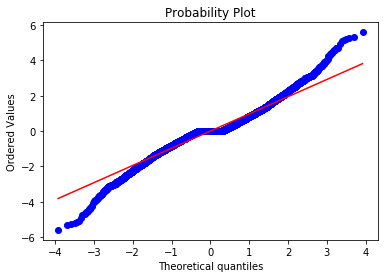

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 2.5481
Overview of variable:  xpat10 


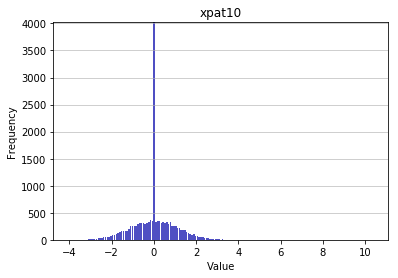

-------------------- 
Summary statistics:
 --------------------
Minimum value: -4.044167076930475
Mean: 0.0
Standard deviation: 1.0
Median: 0.0011
Maximal value: 10.375484076720836


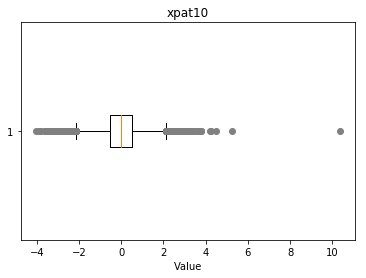

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.09, 3.04, 3.08, 3.29, 3.06, 3.33, 3.05, 3.14, 3.07, 3.57, 4.49, 10.38, 3.01, -3.23, -3.57, -3.14, -3.06, -3.31, 3.25, 3.0, 3.26, 3.34, 5.25, 3.13, 3.41, 4.27, 3.28, 3.43, -3.88, -3.2, -3.45, -3.29, 3.77, 3.03, -3.8, 3.11, 3.1, 3.74, 3.63, -3.1, -3.03, -3.61, -3.43, -3.36, -3.28, 4.19, 3.21, 3.79, 3.4, 3.32, -3.34, -3.16, -3.01, -3.59, -3.33, 3.39, 3.22, 3.23, 3.47, -4.04, -3.53}


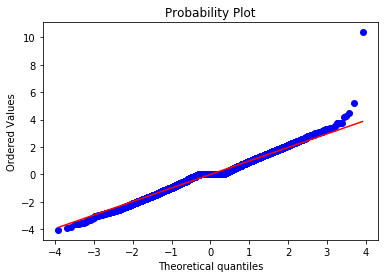

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.077
Kurtosis: 1.4883
Overview of variable:  xpdat10 


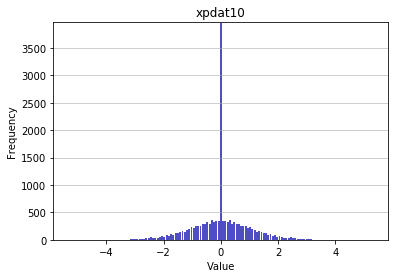

-------------------- 
Summary statistics:
 --------------------
Minimum value: -5.318112042072491
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 5.318112042072491


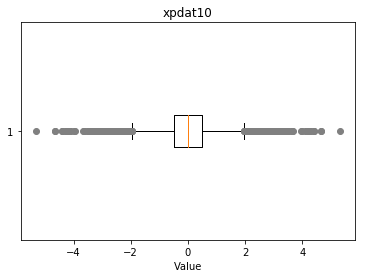

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.4, 3.09, 3.08, 3.25, 3.47, 3.19, 3.16, 3.14, 3.34, 4.24, 4.65, 5.32, -3.14, -3.64, -3.32, -3.07, 3.93, -3.21, 3.04, -3.6, -3.03, -3.35, -3.1, -4.24, 3.65, 3.15, -3.49, 3.33, -3.06, -3.31, 4.15, 4.4, -4.31, 3.44, -3.45, -3.38, -3.13, -3.2, 3.05, -3.02, -4.41, -4.27, -4.66, 3.98, -3.41, -3.16, -3.34, -3.09, 3.41, -3.98, 4.41, 4.27, 4.66, 3.02, -3.05, 3.2, -3.44, -3.19, 3.45, 3.38, 3.13, 4.31, -4.65, -4.15, -4.4, 3.06, 3.31, -3.33, -3.08, 3.49, -3.4, -3.15, -3.65, 4.1, 3.03, -3.04, 3.35, 3.1, 3.6, 3.21, -3.93, 3.07, 3.64, -3.25, 3.32, -5.32, -4.1, -3.47}


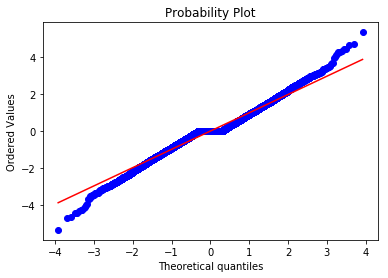

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 1.3338
Overview of variable:  csat10 


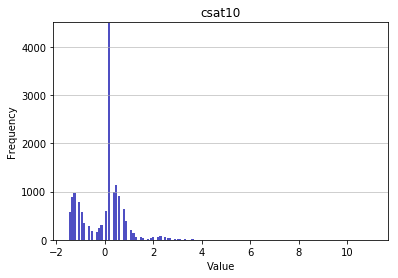

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.5056288411208238
Mean: -0.0
Standard deviation: 1.0
Median: 0.1889
Maximal value: 11.061796907204418


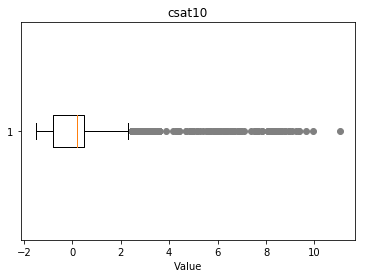

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.15, 3.01, 3.3, 3.86, 7.11, 7.39, 3.58, 3.44, 7.53, 9.23, 7.81, 6.26, 9.93, 8.52, 8.1, 9.08, 11.06, 4.99, 4.85, 4.43, 5.98, 5.84, 5.41, 5.27, 6.68, 6.83, 6.4, 7.67, 8.38, 8.24, 8.94, 8.66, 8.8, 9.65, 9.37, 4.28, 4.71, 4.14, 5.55, 5.13, 5.7, 6.54, 6.12, 6.97}


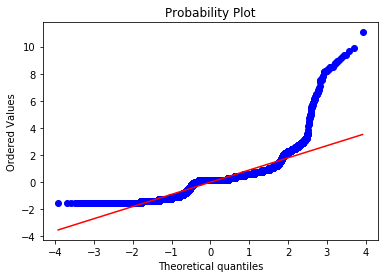

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 2.2004
Kurtosis: 15.8766
Overview of variable:  csdat10 


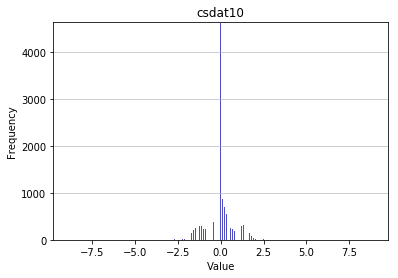

-------------------- 
Summary statistics:
 --------------------
Minimum value: -8.886809593488042
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 8.886809593488042


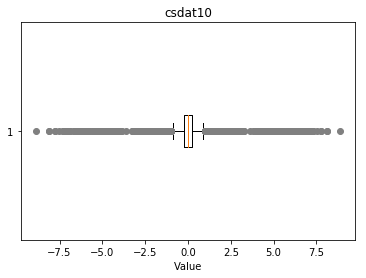

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.6, 3.15, 3.94, 6.41, 6.52, 6.64, 6.07, 3.26, 5.29, 3.04, 4.39, 7.31, 8.89, 7.76, -3.15, -3.82, 4.84, 4.27, 4.16, 4.5, 5.85, 5.17, 5.51, -7.2, 5.4, 5.74, -7.54, -6.64, -6.3, 7.09, -6.19, -6.86, -5.96, -5.62, 8.1, -5.06, -6.97, -4.05, -4.95, -4.61, -4.72, -3.04, -3.94, 4.05, 4.95, 4.61, -8.1, 4.72, 5.96, 5.62, 5.06, -7.76, -7.09, 6.3, 6.19, 6.86, -6.07, -6.41, 7.2, 6.97, 7.54, -5.85, -5.17, -5.51, -5.4, -5.74, -4.84, -4.27, -4.16, -4.5, 3.82, -3.26, -8.89, -7.31, -6.52, -5.29, -4.39, -3.6}


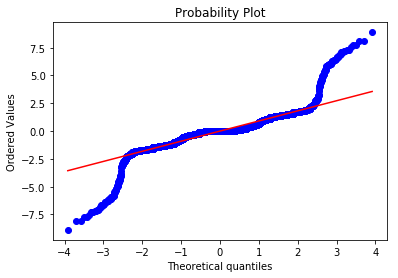

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 14.0337
Overview of variable:  csat15 


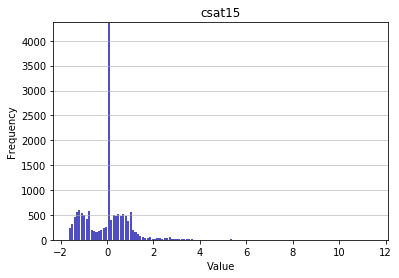

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.6634584978113451
Mean: -0.0
Standard deviation: 1.0
Median: 0.0252
Maximal value: 11.470442118743886


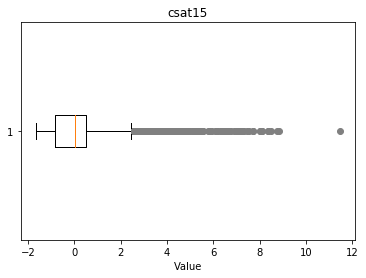

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.87, 3.12, 3.31, 3.03, 7.72, 8.09, 3.59, 3.21, 3.68, 3.4, 4.25, 8.75, 11.47, 3.5, 8.37, 4.15, 4.9, 4.43, 4.34, 5.18, 5.75, 5.84, 5.09, 5.0, 6.59, 6.4, 6.5, 7.25, 7.34, 8.0, 8.47, 8.84, 3.78, 4.06, 4.81, 4.62, 4.53, 4.72, 5.37, 5.56, 5.28, 5.47, 5.94, 6.12, 6.78, 6.31, 6.87, 6.69, 7.44, 7.53, 7.06, 6.97, 6.22, 3.97}


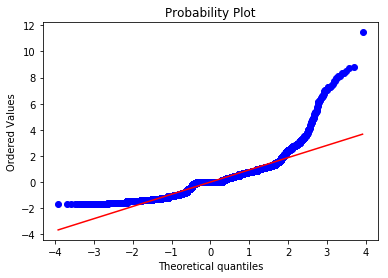

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.7333
Kurtosis: 9.7981
Overview of variable:  csdat15 


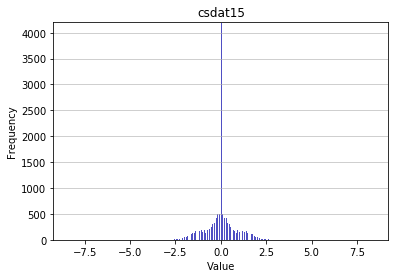

-------------------- 
Summary statistics:
 --------------------
Minimum value: -8.38737018286323
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 8.38737018286323


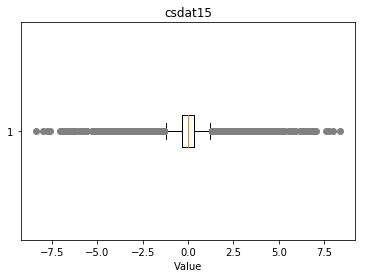

-------------------- 
Outlier detection:
 --------------------
List of outliers: {3.31, 3.08, 3.39, 4.62, 7.08, 3.62, 3.15, 4.16, 7.77, 8.39, 5.16, 6.39, 6.31, 3.0, 8.0, 4.0, 5.93, 5.0, 6.93, -6.46, -6.39, -4.39, -4.46, -3.46, 3.54, -3.85, 4.54, 5.54, -6.85, -4.85, -4.92, -3.92, -3.31, 4.08, 5.08, -5.31, -4.31, 3.69, 4.69, 5.62, -7.77, 6.62, 6.69, -6.23, -6.16, 7.62, -6.77, -5.77, -5.23, -5.16, -4.23, -4.77, -4.16, 3.23, -3.23, 4.23, 4.77, 5.77, 5.23, -7.62, 6.23, 6.16, 6.77, -6.62, -6.69, -5.62, -4.69, -3.62, -3.69, 4.31, 5.31, -5.08, -4.08, -3.08, 3.92, -3.15, 4.85, 4.92, 6.85, -4.54, 3.85, -3.54, 3.46, 4.39, 4.46, -8.0, 6.46, -6.93, -5.93, -5.0, -4.0, -3.0, -8.39, -7.08, -6.31, -5.54, -4.62, -3.39}


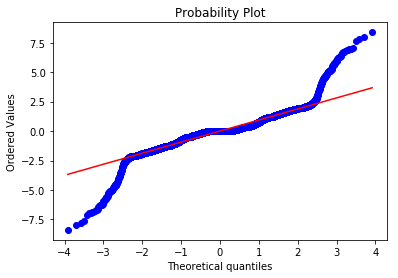

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: 9.3191
Overview of variable:  datediff 


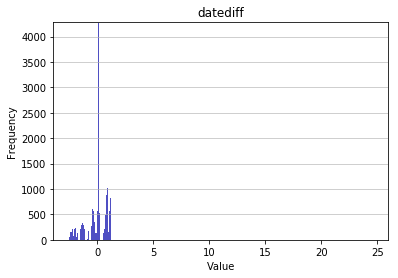

-------------------- 
Summary statistics:
 --------------------
Minimum value: -2.5729790661751335
Mean: -0.0
Standard deviation: 1.0
Median: 0.1156
Maximal value: 24.616889514869555


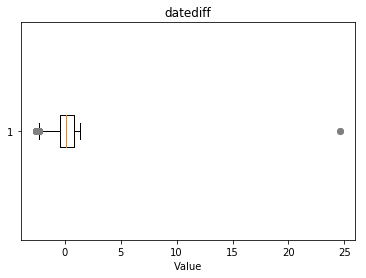

-------------------- 
Outlier detection:
 --------------------
List of outliers: {24.62}


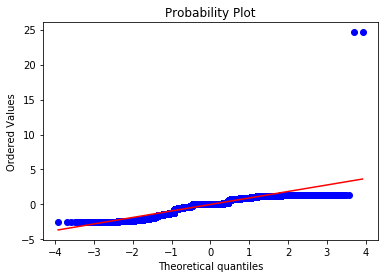

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 1.1995
Kurtosis: 46.918
Overview of variable:  Encoded_league 


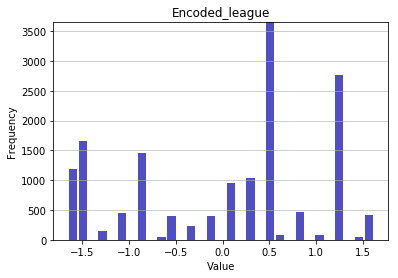

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.653366244785532
Mean: 0.0
Standard deviation: 1.0
Median: 0.2687
Maximal value: 1.6141419729050732


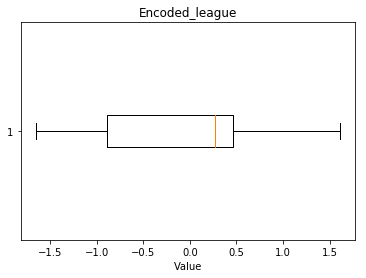

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


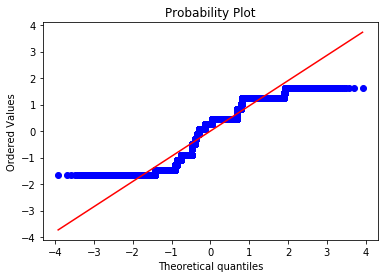

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.3025
Kurtosis: -1.1827
Overview of variable:  Encoded_game 


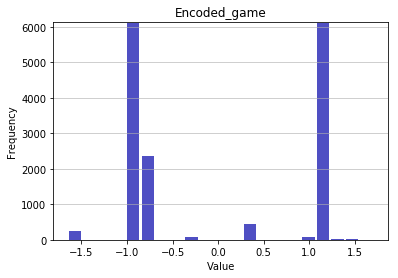

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.6542089067134
Mean: -0.0
Standard deviation: 1.0
Median: -0.7483
Maximal value: 1.7105659916625473


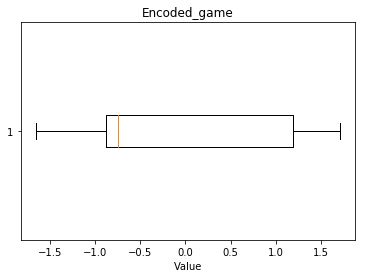

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


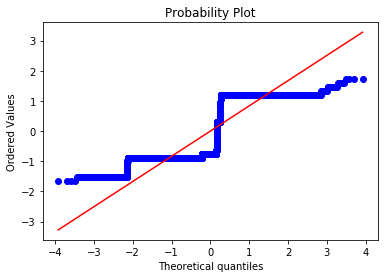

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.2933
Kurtosis: -1.8183
Overview of variable:  Encoded_side 


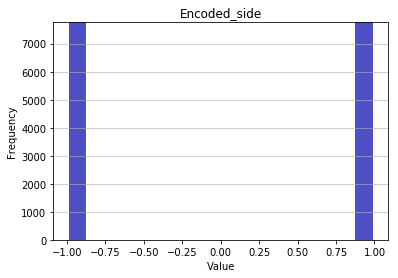

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.0
Mean: 0.0
Standard deviation: 1.0
Median: 0.0
Maximal value: 1.0


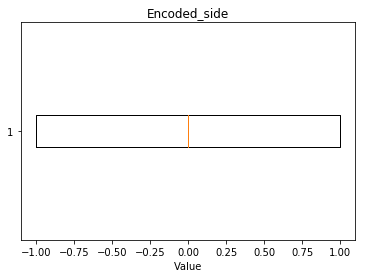

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


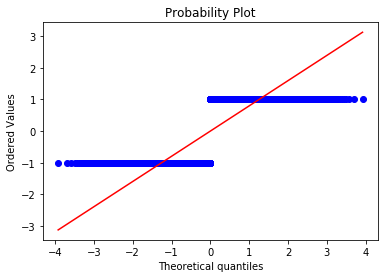

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0
Kurtosis: -2.0
Overview of variable:  Encoded_champion 


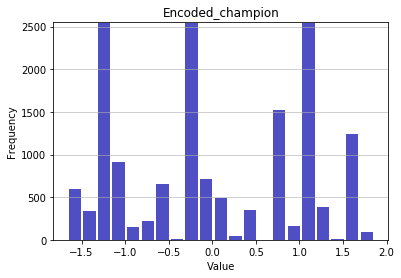

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.6603972322255383
Mean: -0.0
Standard deviation: 1.0
Median: -0.1945
Maximal value: 1.8576696063229978


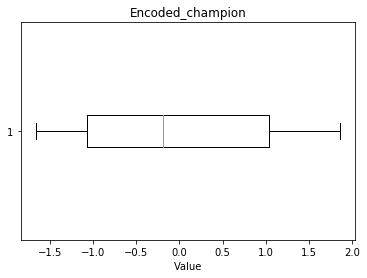

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


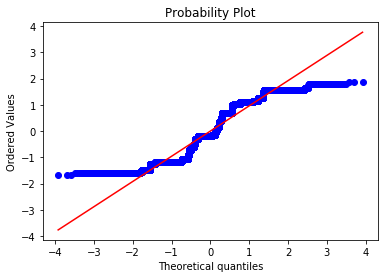

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0405
Kurtosis: -1.3374
Overview of variable:  Encoded_Year 


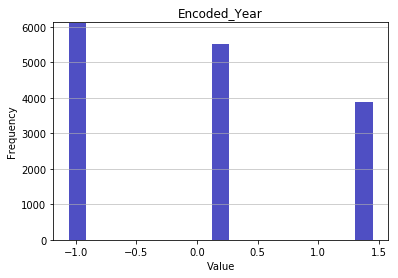

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.0726946924316525
Mean: -0.0
Standard deviation: 0.9997
Median: 0.1612
Maximal value: 1.4635567881812213


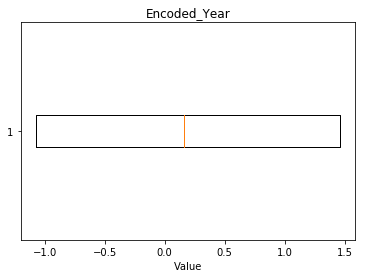

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


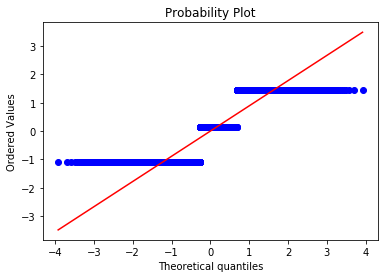

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.299
Kurtosis: -1.3271
Overview of variable:  Encoded_team 


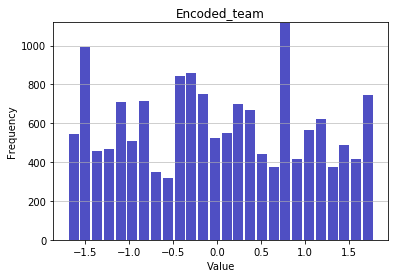

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.7012412332039528
Mean: -0.0
Standard deviation: 1.0
Median: -0.0055
Maximal value: 1.7831439752003055


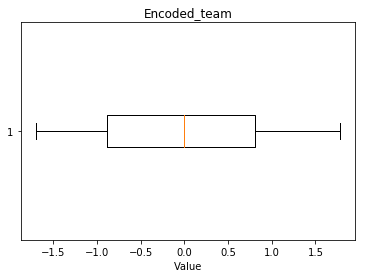

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


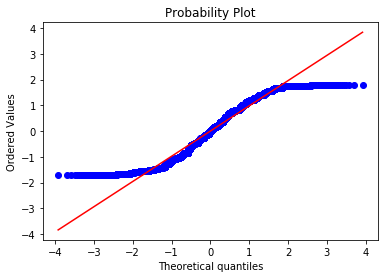

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: 0.0277
Kurtosis: -1.1394
Overview of variable:  Encoded_culture 


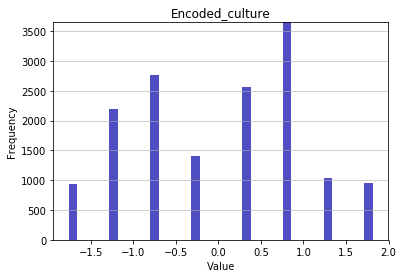

-------------------- 
Summary statistics:
 --------------------
Minimum value: -1.7680060425687243
Mean: -0.0
Standard deviation: 1.0
Median: 0.2864
Maximal value: 1.8271315863658208


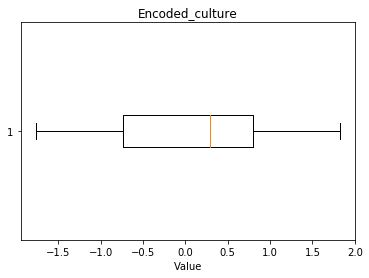

-------------------- 
Outlier detection:
 --------------------
List of outliers: set()


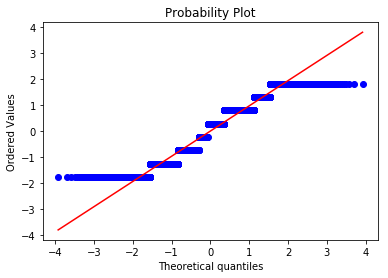

-------------------- 
Check for normal distribution:
 --------------------
Skewedness: -0.031
Kurtosis: -1.0211


<Figure size 432x288 with 0 Axes>

In [ ]:
# Loop through all numerical variables and visualize data
for col in transformed_data_df.columns:
    if str(transformed_data_df[col].dtypes) != 'object':
        SummaryNumericVar(transformed_data_df[col], col)

### 2.3 Conclusion univariate analysis

In [ ]:
# Short intermediate summary
print("The transformed dataset captures information from", len(transformed_data_df.columns), "features.")
print("In total, there are", len(transformed_data_df), "observations present in the dataframe, capturing the information from",
      int(len(transformed_data_df)/2), "games.")
print("\nThe following features are captured by the dataset:\n\n", list(transformed_data_df.columns))

The transformed dataset captures information from 58 features.
In total, there are 15514 observations present in the dataframe, capturing the information from 7757 games.

The following features are captured by the dataset:

 ['split', 'patchno', 'result', 'k', 'd', 'a', 'doubles', 'fb', 'fbassist', 'fbvictim', 'kpm', 'fd', 'elementals', 'firedrakes', 'waterdrakes', 'earthdrakes', 'airdrakes', 'elders', 'herald', 'dmgtochamps', 'dmgtochampsperminute', 'dmgshare', 'earnedgoldshare', 'wards', 'wpm', 'wardshare', 'wardkills', 'wcpm', 'visionwards', 'visionwardbuys', 'totalgold', 'earnedgpm', 'goldspent', 'gspd', 'minionkills', 'monsterkills', 'monsterkillsownjungle', 'monsterkillsenemyjungle', 'cspm', 'goldat10', 'gdat10', 'goldat15', 'gdat15', 'xpat10', 'xpdat10', 'csat10', 'csdat10', 'csat15', 'csdat15', 'datediff', 'Encoded_league', 'Encoded_game', 'Encoded_side', 'Encoded_champion', 'Encoded_Year', 'Encoded_team', 'Encoded_culture', 'player']


---------------------------------------------------------------------------------------------------- 
Overview of variable:  result 
 ----------------------------------------------------------------------------------------------------
Total categories: 2 



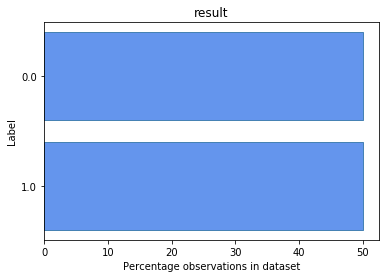

<Figure size 432x288 with 0 Axes>

In [ ]:
# Adjust 'Result' to appropriate format
for pos, trans_df in trans_data_dict.items():
    # Refactoring encoding of target feature
    trans_df['result'] = [x if x > 0 else 0 for x in trans_df['result']]
    trans_data_dict[pos] = trans_df
    
# Visualization properties target
SummaryCategoricalVar(transformed_data_df['result'], 'result')

In [ ]:
# Save the transformed data
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_top.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Top'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_mid.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Middle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_jun.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Jungle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_adc.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['ADC'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_sup.pickle', 'wb') as f:
    pickle.dump(trans_data_dict['Support'], f)

In [ ]:
# Save the file containing the column name and matching box-cox
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_top_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Top'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_mid_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Middle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_jun_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Jungle'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_adc_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['ADC'], f)
with open('/home/je32910/MasterThesis_ComputationalStatistics/pickles/' + saved_filename + '_sup_optimizers.pickle', 'wb') as f:
    pickle.dump(optimiser_data_dict['Support'], f)

## 3. Multivariate analysis
* Correlation plot (remove variables that are highly correlated)
* Boxplot/ scatterpot/ wrapped plot to visualize important relationships between variables
* t-test to assess difference between categories

### 3.1 Collinearity exploration

##### Investigate correlation between features

In [ ]:
# Create corrplot
sns.set(context = "paper", font = "monospace")
corrmat = transformed_data_df.corr()
f, ax = plt.subplots(figsize = (10, 10))
sns.heatmap(corrmat, vmax = .8, square = True) 
plt.show()

In [ ]:
# Print list with highest correlated features
corrmap_abs = transformed_data_df.corr().abs()
corrmap_abs_sorted = corrmap_abs.unstack().sort_values(kind = "quicksort", ascending = False)
corrmap_abs_sorted.iloc[(len(transformed_data_df.columns) + 3):(len(transformed_data_df.columns) + 1) + 20,]

In [ ]:
# Short intermediate summary
print("The percentage of correlations (autocorrelations excluded) higher than 0.5 in absolute value: ",
      str(sum([x for x in list(corrmap_abs_sorted) if x >= 0.5])/len(corrmap_abs_sorted)*100))

##### Calculate variance inflation factor
This is purely out of interest, although we expect penelized regression methods to be able to cope with collinearity between the features.

In [ ]:
# Extract dataset containing only the numeric features
transformed_data_numeric_df = transformed_data_df.copy()
transformed_data_numeric_df = transformed_data_numeric_df.drop(labels = ['player'], axis=1)

In [ ]:
# Calculate the variance inflation factor for the different features
X = add_constant(transformed_data_numeric_df)
vif_columns = pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])], index = X.columns)

In [ ]:
# Print the top 20 features with the highest VIF
vif_columns_sorted = vif_columns.sort_values(kind = "quicksort", ascending = False)
vif_columns_sorted[:20]